# 2D subduction-LayOut

In [9]:
import UWGeodynamics as GEO
import numpy as np
import glucifer

In [10]:
#Geometry functions- This is intented to be a fuctions module to evealuate models with distint geometries
import UWGeodynamics as GEO
import numpy as np


#Subducting plate creator
def SubductionCreator2D(Model,y0,thickness, dipAngle, dipLength, maxLength, orientation):
    #x and y are the (x0.,y0) coordinates where the shallow vertex of the slab will de constructed
    
    #Orientation= (-1)_ East dipping, (1)_ West dipping
    
    #Offset from model boundaries
    offset=100* u.kilometer
    #Units for parameters
    if orientation==1:
        x0=Model.maxCoord[0]-offset
        X0=Model.minCoord[0]+offset
    else:
        x0=Model.minCoord[0]+offset
        X0=Model.maxCoord[0]-offset
        
    y0=y0 * u.kilometer
    thickness= thickness * u.kilometer
    dipLength= dipLength * u.kilometer
    maxLength= maxLength * u.kilometer
    #Trigonometry- Absolute dimensions of the dipping part
    angle = dipAngle * u.degree
    dx1 = np.cos(angle) * dipLength 
    dy1 = np.sin(angle) * dipLength 
    dx2 = np.sin(angle) * thickness 
    dy2 = np.cos(angle) * thickness 
    
    #Subducting plate calculation
    
    #Flat Segment Vertices    
    F1=(x0,y0)
    F2=(x0-(orientation*(maxLength-dipLength)),y0)
    F3=(x0-(orientation*(maxLength-dipLength)),y0-thickness)
    F4=(x0,y0-thickness)
    subducting2 = GEO.shapes.Polygon([F1,F2,F3,F4])
    #Dip Segment Vertices
    D1=(x0-(orientation*(maxLength-dipLength)),y0)
    D2=((x0-(orientation*(maxLength-dipLength)))-(orientation*dx1),(y0-dy1))
    D3=((x0-(orientation*(maxLength-dipLength)))-(orientation*(dx1-dx2)),(y0-dy1-dy2))
    D4=((x0-(orientation*(maxLength-dipLength)))+(orientation*dx2),(y0-dy2))
    subducting1 = GEO.shapes.Polygon([D1,D2,D3,D4])
    #Subducting plate
    subducting = subducting1 + subducting2
    #Calculation of Overriding plate geometry based in subducting plate geometry
    decoup=60* u.kilometer
    backd=400* u.kilometer
    #Flat Segment Vertices 
    f1=(X0,y0)
    f2=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))),y0)
    f3=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))-(orientation*decoup)),y0-thickness)
    f4=(X0,y0-thickness)
    over1= GEO.shapes.Polygon([f1,f2,f3,f4])
    
    #Dip Segment Vertices
    d1=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))),y0)
    d2=(x0-(orientation*(maxLength-dipLength))-(orientation*decoup),y0)
    d3=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))-(orientation*decoup)),y0-thickness)
    over2=GEO.shapes.Polygon([d1,d2,d3])
    #Overriding plate
    overriding = over1+over2
    
    #Decoupling air layer
    de1=(x0-(orientation*(maxLength-dipLength))-(orientation*decoup),y0)
    de2=(x0-(orientation*(maxLength-dipLength)),y0)
    de3=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))),y0-thickness)
    de4=(((x0-(orientation*(maxLength-dipLength)))-(orientation*(thickness*dx1/dy1))-(orientation*decoup)),y0-thickness)
    
    decoup=GEO.shapes.Polygon([de1,de2,de3,de4])
    
    #Back Stop for oceanic plate
    b1=(x0,y0)
    b2=(x0-(orientation*backd),y0)
    b3=(x0-(orientation*backd),y0-(thickness/2))
    b4=(x0,y0-(thickness/2))
    
    backstop=GEO.shapes.Polygon([b1,b2,b3,b4])
    
    return subducting, overriding, decoup, backstop

#Overriding plate creator

In [11]:
#Units
u = GEO.UnitRegistry

In [12]:
#Scalling 1
#half_rate = 1.0 * u.centimeter / u.year
#model_length = 6000. * u.kilometer
#surfaceTemp = 273.15 * u.degK
#baseModelTemp = 1603.15 * u.degK
#bodyforce = 3300 * u.kilogram / u.metre**3 * 9.81 * u.meter / u.second**2

#KL = model_length
#Kt = KL / half_rate
#KM = bodyforce * KL**2 * Kt**2
#KT = (baseModelTemp - surfaceTemp)

#GEO.scaling_coefficients["[length]"] = KL
#GEO.scaling_coefficients["[time]"] = Kt
#GEO.scaling_coefficients["[mass]"]= KM
#GEO.scaling_coefficients["[temperature]"] = KT

In [13]:
#Scalling 2-- Stokes sink velocity
model_length = 1000. * u.kilometer
refDensity = 3300. * u.kilogram / u.meter**3
refViscosity = 1.4e19 * u.pascal * u.second

KL = model_length
KM = refDensity * KL**3
Kt = 1.0 / (refViscosity / KM * KL)

GEO.scaling_coefficients["[length]"] = KL
GEO.scaling_coefficients["[time]"] = Kt
GEO.scaling_coefficients["[mass]"]= KM

In [14]:
#Model Dimensions
Model = GEO.Model(elementRes=(90, 90), 
                  minCoord=(-1500. * u.kilometer, -700.0 * u.kilometer), 
                  maxCoord=(1500. * u.kilometer, 0.0 * u.kilometer),
                  periodic = [False, False],
                  gravity=(0.0, -9.81 * u.meter / u.second**2))

#Model Output Folder
Model.outputDir = "outputs_SubductionOne"

#Model Thermodynamics
#Model.diffusivity = 1e-6 * u.metre**2 / u.second 
#Model.capacity    = 1000. * u.joule / (u.kelvin * u.kilogram)

In [15]:
#Calculate Geometry
geometry=SubductionCreator2D(Model,0,100,30,150,1700,1)
#Materials in the model
#stickyAir = Model.add_material(name="Air", shape=GEO.shapes.Layer(top=Model.top, bottom=0. * u.kilometer))
Mantle = Model.add_material(name="Mantle", shape=GEO.shapes.Layer(top=0.*u.kilometer, bottom=Model.bottom))
OLithosphere = Model.add_material(name="Subducting Plate", shape=geometry[0])
#Clithosphere= Model.add_material(name="Overriding plate", shape=geometry[1])
#decoup= Model.add_material(name="Decoupling", shape=geometry[2])
#backstop=Model.add_material(name="Back Stop", shape=geometry[3])


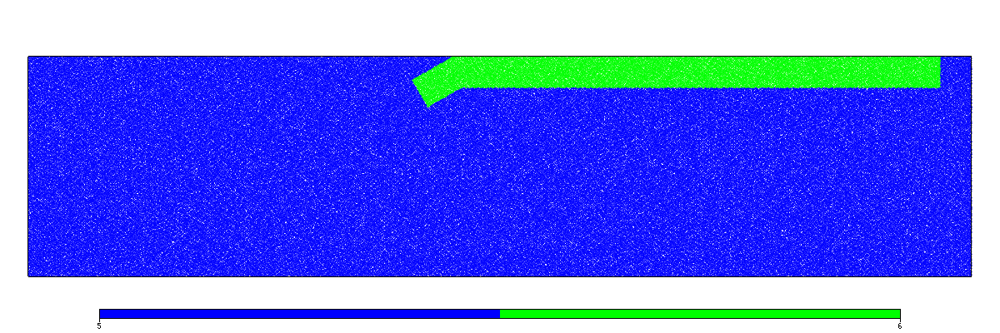

In [16]:
#Preview of 2D materials-Materials Field (from swarm)
Fig = glucifer.Figure(figsize=(1200,400))
Fig.Points(Model.swarm, Model.materialField,fn_size=2.0, discrete=True,colours='blue white orange green white green')
Fig.show()

In [17]:
#Tracers


In [18]:
#Tracers Plot


In [19]:
#Viscosities Registry
rh = GEO.ViscousCreepRegistry()
#Viscosity Setting
#stickyAir.viscosity = 1e19 * u.pascal * u.second
#decoup.viscosity= 1.4e19 * u.pascal * u.second
Mantle.viscosity =  1.4e19 * u.pascal * u.second#rh.Karato_and_Wu_1990# #
OLithosphere.visco sity = 200*1.4e21 * u.pascal * u.second
#Clithosphere.viscosity= 1.4e19 * u.pascal * u.second#1.4e23 * u.pascal * u.second#rh.Wang_et_al_2012 #
#backstop.viscosity=1e30 * u.pascal * u.second

In [20]:
#Plasticity Registry
#pl = GEO.PlasticityRegistry()
#Plasticity Setting
#OLithosphere.plasticity = pl.Huismans_et_al_2011_Crust
#Clithosphere.plasticity = pl.Huismans_et_al_2011_Crust
#Mantle.plasticity = pl.Huismans_et_al_2011_Crust
OLithosphere.plasticity = GEO.VonMises(cohesion=48. * u.megapascal)
#Clithosphere.plasticity = GEO.VonMises(cohesion=48. * u.megapascal)
#decoup.plasticity=GEO.VonMises(cohesion=5. * u.megapascal)

In [21]:
#Density
#stickyAir.density = 1. * u.kilogram / u.metre**3
#decoup.density=3300. * u.kilogram / u.metre**3
Mantle.density = 3300. * u.kilogram / u.metre**3
OLithosphere.density =3400. * u.kilogram / u.metre**3
#Clithosphere.density=3300. * u.kilogram / u.metre**3#2600. * u.kilogram / u.metre**3
#backstop.density=2700. * u.kilogram / u.metre**3


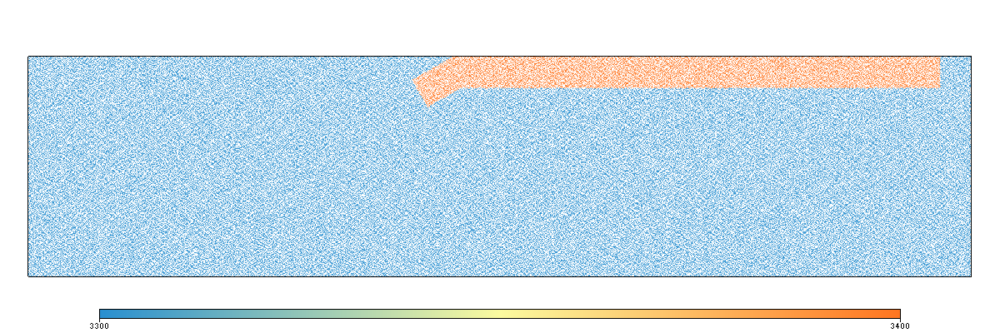

In [22]:
#Density Field
Fig = glucifer.Figure(figsize=(1200,400))
Fig.Points(Model.swarm, GEO.Dimensionalize(Model.densityField, u.kilogram / u.metre**3))
Fig.show()


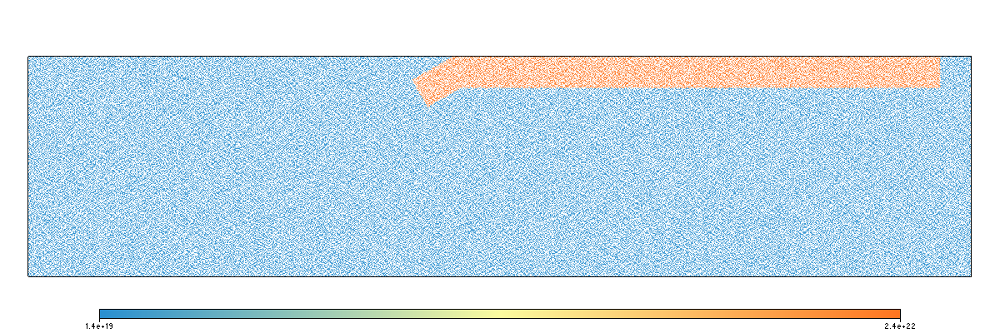

In [23]:
#Viscosity Field
Fig = glucifer.Figure(figsize=(1200,400))
Fig.Points(Model.swarm, GEO.Dimensionalize(Model.viscosityField, u.pascal * u.second))
Fig.show()

In [24]:
#Boundary Velocities- Subduction here is automatic.
#Model.set_velocityBCs(left=[0., None],
#                      right=[-5.0 * u.centimeter / u.year, None],
#                      bottom=[None, 0.],
#                      top=[None, 0.])

Model.set_velocityBCs(left=[0., None],
                      right=[0.,None],
                      bottom=[0., 0.],
                      top=[None, 0.])

In [25]:
#Model Inicialization
Model.init_model()

In [26]:
#Solver Parameters
GEO.rcParams["solver"] = "mumps"
GEO.rcParams["penalty"] = 1e6
GEO.rcParams["initial.nonlinear.tolerance"] = 1e-4

In [ ]:
#Running Model
#!rm -rf output_FirstSubduction/
Model.run_for(duration=10*u.megayear, dt=0.5*u.megayear, checkpoint_interval=0.1*u.megayear,restartStep=False)
#Model.run_for(nstep=10, checkpoint_interval=0.1*u.megayear,restartStep=False)

Running with UWGeodynamics version 0.9.8b-dev-f728b34(master)
Step:1 Model Time:  1.119296658101955e-06 megayear dt: 1.119296658101955e-06 megayear (2018-12-05 03:32:23)
Step:2 Model Time:  2.253845791838927e-06 megayear dt: 1.134549133736972e-06 megayear (2018-12-05 03:32:27)
Step:3 Model Time:  3.4590016556467766e-06 megayear dt: 1.2051558638078498e-06 megayear (2018-12-05 03:32:31)
Step:4 Model Time:  4.664042319195597e-06 megayear dt: 1.205040663548821e-06 megayear (2018-12-05 03:32:34)
Step:5 Model Time:  5.865023977800447e-06 megayear dt: 1.2009816586048497e-06 megayear (2018-12-05 03:32:38)
Step:6 Model Time:  7.091174613324309e-06 megayear dt: 1.2261506355238617e-06 megayear (2018-12-05 03:32:42)
Step:7 Model Time:  8.343730673315263e-06 megayear dt: 1.2525560599909536e-06 megayear (2018-12-05 03:32:45)
Step:8 Model Time:  9.62707359109362e-06 megayear dt: 1.2833429177783574e-06 megayear (2018-12-05 03:32:49)
Step:9 Model Time:  1.0905601060714563e-05 megayear dt: 1.27852746962

Step:75 Model Time:  0.00011757230943215475 megayear dt: 1.8452024290280139e-06 megayear (2018-12-05 03:37:10)
Step:76 Model Time:  0.00011941756081511677 megayear dt: 1.8452513829620225e-06 megayear (2018-12-05 03:37:13)
Step:77 Model Time:  0.00012126120366140461 megayear dt: 1.8436428462878415e-06 megayear (2018-12-05 03:37:16)
Step:78 Model Time:  0.00012310997878925032 megayear dt: 1.848775127845703e-06 megayear (2018-12-05 03:37:20)
Step:79 Model Time:  0.00012495978687388276 megayear dt: 1.8498080846324388e-06 megayear (2018-12-05 03:37:23)
Step:80 Model Time:  0.00012681577671440735 megayear dt: 1.8559898405245932e-06 megayear (2018-12-05 03:37:26)
Step:81 Model Time:  0.0001286719509177559 megayear dt: 1.856174203348561e-06 megayear (2018-12-05 03:37:30)
Step:82 Model Time:  0.0001305383174992102 megayear dt: 1.8663665814542805e-06 megayear (2018-12-05 03:37:33)
Step:83 Model Time:  0.00013241255877418842 megayear dt: 1.8742412749782284e-06 megayear (2018-12-05 03:37:37)
Step:

Step:149 Model Time:  0.0002622175260331184 megayear dt: 2.0466168517993414e-06 megayear (2018-12-05 03:41:23)
Step:150 Model Time:  0.00026426529528781093 megayear dt: 2.0477692546925483e-06 megayear (2018-12-05 03:41:27)
Step:151 Model Time:  0.0002663154112332675 megayear dt: 2.050115945456534e-06 megayear (2018-12-05 03:41:30)
Step:152 Model Time:  0.0002683695147170828 megayear dt: 2.054103483815321e-06 megayear (2018-12-05 03:41:33)
Step:153 Model Time:  0.00027042535369297256 megayear dt: 2.0558389758897623e-06 megayear (2018-12-05 03:41:36)
Step:154 Model Time:  0.00027248244502763583 megayear dt: 2.057091334663267e-06 megayear (2018-12-05 03:41:40)
Step:155 Model Time:  0.00027454508951207723 megayear dt: 2.062644484441375e-06 megayear (2018-12-05 03:41:43)
Step:156 Model Time:  0.0002766077239145283 megayear dt: 2.0626344024510764e-06 megayear (2018-12-05 03:41:47)
Step:157 Model Time:  0.00027867124708079325 megayear dt: 2.0635231662649144e-06 megayear (2018-12-05 03:41:50)


Step:223 Model Time:  0.00041933234667448503 megayear dt: 2.1826661876268833e-06 megayear (2018-12-05 03:45:42)
Step:224 Model Time:  0.00042151557910132583 megayear dt: 2.1832324268407838e-06 megayear (2018-12-05 03:45:46)
Step:225 Model Time:  0.00042369804597450786 megayear dt: 2.1824668731820255e-06 megayear (2018-12-05 03:45:49)
Step:226 Model Time:  0.0004258826647818347 megayear dt: 2.184618807326854e-06 megayear (2018-12-05 03:45:52)
Step:227 Model Time:  0.00042807004347837684 megayear dt: 2.1873786965421136e-06 megayear (2018-12-05 03:45:56)
Step:228 Model Time:  0.00043025921688398316 megayear dt: 2.1891734056063046e-06 megayear (2018-12-05 03:45:59)
Step:229 Model Time:  0.0004324493448797344 megayear dt: 2.190127995751289e-06 megayear (2018-12-05 03:46:02)
Step:230 Model Time:  0.0004346401325547421 megayear dt: 2.1907876750076683e-06 megayear (2018-12-05 03:46:06)
Step:231 Model Time:  0.0004368323213499615 megayear dt: 2.1921887952193956e-06 megayear (2018-12-05 03:46:09

Step:297 Model Time:  0.0005835576563316421 megayear dt: 2.2465272719748662e-06 megayear (2018-12-05 03:50:04)
Step:298 Model Time:  0.0005858049151054392 megayear dt: 2.247258773797098e-06 megayear (2018-12-05 03:50:08)
Step:299 Model Time:  0.0005880529611899755 megayear dt: 2.2480460845363067e-06 megayear (2018-12-05 03:50:12)
Step:300 Model Time:  0.0005903013529877766 megayear dt: 2.2483917978010295e-06 megayear (2018-12-05 03:50:16)
Step:301 Model Time:  0.0005925497224924987 megayear dt: 2.2483695047220844e-06 megayear (2018-12-05 03:50:19)
Step:302 Model Time:  0.0005947978695323878 megayear dt: 2.2481470398890794e-06 megayear (2018-12-05 03:50:22)
Step:303 Model Time:  0.0005970465004676005 megayear dt: 2.248630935212632e-06 megayear (2018-12-05 03:50:26)
Step:304 Model Time:  0.0005992959543168984 megayear dt: 2.2494538492979803e-06 megayear (2018-12-05 03:50:29)
Step:305 Model Time:  0.0006015454883806913 megayear dt: 2.2495340637929167e-06 megayear (2018-12-05 03:50:33)
Ste

Step:372 Model Time:  0.0007532396447380307 megayear dt: 2.2732540970189004e-06 megayear (2018-12-05 03:54:32)
Step:373 Model Time:  0.0007555128249773533 megayear dt: 2.273180239322645e-06 megayear (2018-12-05 03:54:36)
Step:374 Model Time:  0.0007577868016323866 megayear dt: 2.273976655033313e-06 megayear (2018-12-05 03:54:39)
Step:375 Model Time:  0.0007600606670977079 megayear dt: 2.273865465321253e-06 megayear (2018-12-05 03:54:43)
Step:376 Model Time:  0.0007623358182099408 megayear dt: 2.275151112232895e-06 megayear (2018-12-05 03:54:46)
Step:377 Model Time:  0.0007646116114980935 megayear dt: 2.27579328815263e-06 megayear (2018-12-05 03:54:49)
Step:378 Model Time:  0.0007668880581522448 megayear dt: 2.2764466541513317e-06 megayear (2018-12-05 03:54:53)
Step:379 Model Time:  0.000769164284170184 megayear dt: 2.2762260179392026e-06 megayear (2018-12-05 03:54:56)
Step:380 Model Time:  0.000771439926451952 megayear dt: 2.2756422817679093e-06 megayear (2018-12-05 03:54:59)
Step:381 

Step:447 Model Time:  0.000924369173360471 megayear dt: 2.2885660432633647e-06 megayear (2018-12-05 03:59:00)
Step:448 Model Time:  0.0009266559561787212 megayear dt: 2.286782818250264e-06 megayear (2018-12-05 03:59:04)
Step:449 Model Time:  0.0009289438595658566 megayear dt: 2.287903387135357e-06 megayear (2018-12-05 03:59:07)
Step:450 Model Time:  0.0009312312441332547 megayear dt: 2.2873845673980393e-06 megayear (2018-12-05 03:59:10)
Step:451 Model Time:  0.0009335192758776191 megayear dt: 2.2880317443644354e-06 megayear (2018-12-05 03:59:14)
Step:452 Model Time:  0.000935807474220775 megayear dt: 2.288198343155945e-06 megayear (2018-12-05 03:59:18)
Step:453 Model Time:  0.0009380960503152949 megayear dt: 2.2885760945198376e-06 megayear (2018-12-05 03:59:22)
Step:454 Model Time:  0.0009403851669200633 megayear dt: 2.289116604768442e-06 megayear (2018-12-05 03:59:26)
Step:455 Model Time:  0.0009426736253948298 megayear dt: 2.2884584747664108e-06 megayear (2018-12-05 03:59:30)
Step:45

Step:522 Model Time:  0.0010962786084027232 megayear dt: 2.2957630607426047e-06 megayear (2018-12-05 04:03:34)
Step:523 Model Time:  0.0010985739935034154 megayear dt: 2.29538510069218e-06 megayear (2018-12-05 04:03:37)
Step:524 Model Time:  0.0011008704928538234 megayear dt: 2.2964993504079526e-06 megayear (2018-12-05 04:03:41)
Step:525 Model Time:  0.001103166686216269 megayear dt: 2.2961933624454745e-06 megayear (2018-12-05 04:03:44)
Step:526 Model Time:  0.0011054619210774624 megayear dt: 2.295234861193432e-06 megayear (2018-12-05 04:03:48)
Step:527 Model Time:  0.0011077574717170864 megayear dt: 2.295550639623933e-06 megayear (2018-12-05 04:03:51)
Step:528 Model Time:  0.0011100524195943459 megayear dt: 2.2949478772594565e-06 megayear (2018-12-05 04:03:55)
Step:529 Model Time:  0.001112348272468587 megayear dt: 2.2958528742410836e-06 megayear (2018-12-05 04:03:59)
Step:530 Model Time:  0.0011146447398954014 megayear dt: 2.296467426814332e-06 megayear (2018-12-05 04:04:03)
Step:531

Step:597 Model Time:  0.001268649642925276 megayear dt: 2.3021289909700906e-06 megayear (2018-12-05 04:08:01)
Step:598 Model Time:  0.0012709500707576737 megayear dt: 2.300427832397801e-06 megayear (2018-12-05 04:08:04)
Step:599 Model Time:  0.001273249210393256 megayear dt: 2.2991396355821903e-06 megayear (2018-12-05 04:08:07)
Step:600 Model Time:  0.0012755486701630284 megayear dt: 2.2994597697725544e-06 megayear (2018-12-05 04:08:11)
Step:601 Model Time:  0.0012778507149883347 megayear dt: 2.3020448253061584e-06 megayear (2018-12-05 04:08:14)
Step:602 Model Time:  0.0012801518852815913 megayear dt: 2.3011702932565673e-06 megayear (2018-12-05 04:08:18)
Step:603 Model Time:  0.001282451880258762 megayear dt: 2.299994977170704e-06 megayear (2018-12-05 04:08:21)
Step:604 Model Time:  0.00128475281572401 megayear dt: 2.3009354652479165e-06 megayear (2018-12-05 04:08:24)
Step:605 Model Time:  0.0012870551821949129 megayear dt: 2.3023664709029798e-06 megayear (2018-12-05 04:08:28)
Step:606

Step:672 Model Time:  0.0014413370303194223 megayear dt: 2.305766587094466e-06 megayear (2018-12-05 04:12:26)
Step:673 Model Time:  0.0014436424363681016 megayear dt: 2.3054060486792585e-06 megayear (2018-12-05 04:12:29)
Step:674 Model Time:  0.001445947392058578 megayear dt: 2.3049556904764047e-06 megayear (2018-12-05 04:12:33)
Step:675 Model Time:  0.001448252019136152 megayear dt: 2.3046270775738557e-06 megayear (2018-12-05 04:12:36)
Step:676 Model Time:  0.0014505568427279607 megayear dt: 2.3048235918087437e-06 megayear (2018-12-05 04:12:40)
Step:677 Model Time:  0.001452862493396114 megayear dt: 2.3056506681532837e-06 megayear (2018-12-05 04:12:43)
Step:678 Model Time:  0.0014551666993127038 megayear dt: 2.304205916589782e-06 megayear (2018-12-05 04:12:47)
Step:679 Model Time:  0.001457472416545941 megayear dt: 2.3057172332371734e-06 megayear (2018-12-05 04:12:50)
Step:680 Model Time:  0.0014597772882794491 megayear dt: 2.3048717335081956e-06 megayear (2018-12-05 04:12:54)
Step:68

Step:747 Model Time:  0.001614256403805601 megayear dt: 2.308401640732645e-06 megayear (2018-12-05 04:17:06)
Step:748 Model Time:  0.0016165631739216415 megayear dt: 2.306770116040414e-06 megayear (2018-12-05 04:17:09)
Step:749 Model Time:  0.0016188683025870707 megayear dt: 2.305128665429273e-06 megayear (2018-12-05 04:17:13)
Step:750 Model Time:  0.0016211747110651024 megayear dt: 2.3064084780317016e-06 megayear (2018-12-05 04:17:16)
Step:751 Model Time:  0.0016234808691079246 megayear dt: 2.3061580428221718e-06 megayear (2018-12-05 04:17:20)
Step:752 Model Time:  0.001625789110082176 megayear dt: 2.3082409742512443e-06 megayear (2018-12-05 04:17:24)
Step:753 Model Time:  0.0016280964715249813 megayear dt: 2.3073614428053676e-06 megayear (2018-12-05 04:17:27)
Step:754 Model Time:  0.0016304031488598078 megayear dt: 2.30667733482648e-06 megayear (2018-12-05 04:17:31)
Step:755 Model Time:  0.001632708883242622 megayear dt: 2.3057343828140217e-06 megayear (2018-12-05 04:17:34)
Step:756 

Step:822 Model Time:  0.001787296577041423 megayear dt: 2.3087143739962733e-06 megayear (2018-12-05 04:21:30)
Step:823 Model Time:  0.0017896039978157086 megayear dt: 2.3074207742857465e-06 megayear (2018-12-05 04:21:33)
Step:824 Model Time:  0.0017919138915720716 megayear dt: 2.3098937563629523e-06 megayear (2018-12-05 04:21:37)
Step:825 Model Time:  0.0017942248023773927 megayear dt: 2.3109108053211037e-06 megayear (2018-12-05 04:21:40)
Step:826 Model Time:  0.001796532556730501 megayear dt: 2.307754353108378e-06 megayear (2018-12-05 04:21:44)
Step:827 Model Time:  0.0017988414031242916 megayear dt: 2.3088463937904184e-06 megayear (2018-12-05 04:21:47)
Step:828 Model Time:  0.001801150167990237 megayear dt: 2.3087648659453868e-06 megayear (2018-12-05 04:21:51)
Step:829 Model Time:  0.0018034599816935707 megayear dt: 2.309813703333635e-06 megayear (2018-12-05 04:21:54)
Step:830 Model Time:  0.0018057711248405208 megayear dt: 2.311143146950098e-06 megayear (2018-12-05 04:21:58)
Step:83

Step:897 Model Time:  0.0019604852097511367 megayear dt: 2.3106870682813833e-06 megayear (2018-12-05 04:25:54)
Step:898 Model Time:  0.0019627973754702834 megayear dt: 2.3121657191465485e-06 megayear (2018-12-05 04:25:57)
Step:899 Model Time:  0.0019651086119587143 megayear dt: 2.3112364884310405e-06 megayear (2018-12-05 04:26:01)
Step:900 Model Time:  0.001967420238186818 megayear dt: 2.3116262281039135e-06 megayear (2018-12-05 04:26:04)
Step:901 Model Time:  0.0019697295036326342 megayear dt: 2.3092654458161963e-06 megayear (2018-12-05 04:26:08)
Step:902 Model Time:  0.0019720411686411504 megayear dt: 2.3116650085163445e-06 megayear (2018-12-05 04:26:13)
Step:903 Model Time:  0.001974351368059835 megayear dt: 2.31019941868457e-06 megayear (2018-12-05 04:26:21)
Step:904 Model Time:  0.00197666111344428 megayear dt: 2.309745384445074e-06 megayear (2018-12-05 04:26:25)
Step:905 Model Time:  0.001978971889369018 megayear dt: 2.310775924738218e-06 megayear (2018-12-05 04:26:29)
Step:906 M

Step:972 Model Time:  0.002133773092615489 megayear dt: 2.3116283669859254e-06 megayear (2018-12-05 04:30:30)
Step:973 Model Time:  0.0021360854447553847 megayear dt: 2.3123521398958883e-06 megayear (2018-12-05 04:30:34)
Step:974 Model Time:  0.0021383972852263775 megayear dt: 2.3118404709928764e-06 megayear (2018-12-05 04:30:37)
Step:975 Model Time:  0.0021407070026286646 megayear dt: 2.3097174022871928e-06 megayear (2018-12-05 04:30:41)
Step:976 Model Time:  0.002143017832368955 megayear dt: 2.3108297402905775e-06 megayear (2018-12-05 04:30:44)
Step:977 Model Time:  0.0021453284448905655 megayear dt: 2.3106125216104193e-06 megayear (2018-12-05 04:30:48)
Step:978 Model Time:  0.00214763883713315 megayear dt: 2.3103922425843472e-06 megayear (2018-12-05 04:30:52)
Step:979 Model Time:  0.002149949677518446 megayear dt: 2.3108403852956893e-06 megayear (2018-12-05 04:30:56)
Step:980 Model Time:  0.0021522602697978356 megayear dt: 2.310592279389918e-06 megayear (2018-12-05 04:30:59)
Step:98

Step:1046 Model Time:  0.0023048012594719183 megayear dt: 2.310534133437677e-06 megayear (2018-12-05 04:35:03)
Step:1047 Model Time:  0.002307114474706103 megayear dt: 2.3132152341845085e-06 megayear (2018-12-05 04:35:06)
Step:1048 Model Time:  0.0023094244870771356 megayear dt: 2.31001237103261e-06 megayear (2018-12-05 04:35:10)
Step:1049 Model Time:  0.0023117324865023327 megayear dt: 2.3079994251970526e-06 megayear (2018-12-05 04:35:13)
Step:1050 Model Time:  0.002314041829138817 megayear dt: 2.309342636483961e-06 megayear (2018-12-05 04:35:17)
Step:1051 Model Time:  0.002316354231227747 megayear dt: 2.3124020889302713e-06 megayear (2018-12-05 04:35:22)
Step:1052 Model Time:  0.002318665176740291 megayear dt: 2.3109455125438186e-06 megayear (2018-12-05 04:35:27)
Step:1053 Model Time:  0.0023209759629229374 megayear dt: 2.3107861826463154e-06 megayear (2018-12-05 04:35:31)
Step:1054 Model Time:  0.002323286448878841 megayear dt: 2.310485955903842e-06 megayear (2018-12-05 04:35:34)
St

Step:1120 Model Time:  0.002475816704175342 megayear dt: 2.310659905114322e-06 megayear (2018-12-05 04:39:32)
Step:1121 Model Time:  0.0024781258416831328 megayear dt: 2.309137507790482e-06 megayear (2018-12-05 04:39:35)
Step:1122 Model Time:  0.0024804310225158724 megayear dt: 2.305180832739638e-06 megayear (2018-12-05 04:39:39)
Step:1123 Model Time:  0.0024827435839677447 megayear dt: 2.312561451872417e-06 megayear (2018-12-05 04:39:42)
Step:1124 Model Time:  0.0024850570579564085 megayear dt: 2.3134739886638126e-06 megayear (2018-12-05 04:39:46)
Step:1125 Model Time:  0.002487369672980188 megayear dt: 2.3126150237797418e-06 megayear (2018-12-05 04:39:49)
Step:1126 Model Time:  0.002489681839304167 megayear dt: 2.3121663239788025e-06 megayear (2018-12-05 04:39:53)
Step:1127 Model Time:  0.0024919906829944985 megayear dt: 2.3088436903313615e-06 megayear (2018-12-05 04:39:56)
Step:1128 Model Time:  0.002494303083115013 megayear dt: 2.3124001205143956e-06 megayear (2018-12-05 04:40:00)


Step:1194 Model Time:  0.002646816779249057 megayear dt: 2.3113420555273563e-06 megayear (2018-12-05 04:44:02)
Step:1195 Model Time:  0.00264912989391145 megayear dt: 2.313114662393362e-06 megayear (2018-12-05 04:44:06)
Step:1196 Model Time:  0.0026514439300857405 megayear dt: 2.3140361742902404e-06 megayear (2018-12-05 04:44:09)
Step:1197 Model Time:  0.002653758775304502 megayear dt: 2.3148452187614582e-06 megayear (2018-12-05 04:44:13)
Step:1198 Model Time:  0.0026560735039562857 megayear dt: 2.3147286517835198e-06 megayear (2018-12-05 04:44:16)
Step:1199 Model Time:  0.002658384709933585 megayear dt: 2.3112059772995663e-06 megayear (2018-12-05 04:44:20)
Step:1200 Model Time:  0.002660697617986109 megayear dt: 2.3129080525237585e-06 megayear (2018-12-05 04:44:23)
Step:1201 Model Time:  0.002663006538070584 megayear dt: 2.3089200844749107e-06 megayear (2018-12-05 04:44:27)
Step:1202 Model Time:  0.0026653178769355354 megayear dt: 2.3113388649515197e-06 megayear (2018-12-05 04:44:31)


Step:1268 Model Time:  0.0028178828928117246 megayear dt: 2.311849874032676e-06 megayear (2018-12-05 04:49:07)
Step:1269 Model Time:  0.0028201968040465985 megayear dt: 2.313911234873983e-06 megayear (2018-12-05 04:49:11)
Step:1270 Model Time:  0.0028225094366501253 megayear dt: 2.3126326035270424e-06 megayear (2018-12-05 04:49:15)
Step:1271 Model Time:  0.0028248194337727943 megayear dt: 2.309997122668802e-06 megayear (2018-12-05 04:49:19)
Step:1272 Model Time:  0.00282713390722837 megayear dt: 2.3144734555758676e-06 megayear (2018-12-05 04:49:23)
Step:1273 Model Time:  0.0028294450551803714 megayear dt: 2.3111479520012406e-06 megayear (2018-12-05 04:49:27)
Step:1274 Model Time:  0.0028317548735464146 megayear dt: 2.309818366043354e-06 megayear (2018-12-05 04:49:32)
Step:1275 Model Time:  0.002834065460449656 megayear dt: 2.3105869032414298e-06 megayear (2018-12-05 04:49:36)
Step:1276 Model Time:  0.002836375021125366 megayear dt: 2.30956067570994e-06 megayear (2018-12-05 04:49:40)
St

Step:1342 Model Time:  0.00298890261430665 megayear dt: 2.312607063900287e-06 megayear (2018-12-05 04:54:18)
Step:1343 Model Time:  0.0029912133004338054 megayear dt: 2.3106861271551052e-06 megayear (2018-12-05 04:54:22)
Step:1344 Model Time:  0.002993526980262274 megayear dt: 2.3136798284686892e-06 megayear (2018-12-05 04:54:26)
Step:1345 Model Time:  0.002995838954251656 megayear dt: 2.3119739893818328e-06 megayear (2018-12-05 04:54:30)
Step:1346 Model Time:  0.0029981508388831663 megayear dt: 2.3118846315106424e-06 megayear (2018-12-05 04:54:34)
Step:1347 Model Time:  0.0030004623234647348 megayear dt: 2.311484581568338e-06 megayear (2018-12-05 04:54:38)
Step:1348 Model Time:  0.0030027748883470627 megayear dt: 2.3125648823277492e-06 megayear (2018-12-05 04:54:42)
Step:1349 Model Time:  0.0030050880877457117 megayear dt: 2.3131993986489067e-06 megayear (2018-12-05 04:54:46)
Step:1350 Model Time:  0.0030074030614359103 megayear dt: 2.314973690198559e-06 megayear (2018-12-05 04:54:50)

Step:1416 Model Time:  0.003160038260567334 megayear dt: 2.312128033610135e-06 megayear (2018-12-05 04:58:51)
Step:1417 Model Time:  0.0031623487995607715 megayear dt: 2.3105389934374887e-06 megayear (2018-12-05 04:58:55)
Step:1418 Model Time:  0.0031646605798223916 megayear dt: 2.311780261620347e-06 megayear (2018-12-05 04:58:59)
Step:1419 Model Time:  0.0031669715878910555 megayear dt: 2.3110080686639222e-06 megayear (2018-12-05 04:59:03)
Step:1420 Model Time:  0.0031692803290149143 megayear dt: 2.308741123858932e-06 megayear (2018-12-05 04:59:06)
Step:1421 Model Time:  0.003171591901069633 megayear dt: 2.31157205471859e-06 megayear (2018-12-05 04:59:10)
Step:1422 Model Time:  0.003173902683100995 megayear dt: 2.310782031362107e-06 megayear (2018-12-05 04:59:13)
Step:1423 Model Time:  0.0031762126949710025 megayear dt: 2.310011870007182e-06 megayear (2018-12-05 04:59:17)
Step:1424 Model Time:  0.0031785238177340224 megayear dt: 2.31112276301983e-06 megayear (2018-12-05 04:59:20)
Step

Step:1490 Model Time:  0.0033310753155563156 megayear dt: 2.310474444161063e-06 megayear (2018-12-05 05:03:17)
Step:1491 Model Time:  0.0033333857899995475 megayear dt: 2.3104744432317875e-06 megayear (2018-12-05 05:03:20)
Step:1492 Model Time:  0.003335699285011661 megayear dt: 2.313495012113518e-06 megayear (2018-12-05 05:03:24)
Step:1493 Model Time:  0.0033380129819665307 megayear dt: 2.313696954869616e-06 megayear (2018-12-05 05:03:28)
Step:1494 Model Time:  0.0033403234334051356 megayear dt: 2.3104514386050026e-06 megayear (2018-12-05 05:03:32)
Step:1495 Model Time:  0.0033426324844562155 megayear dt: 2.3090510510798956e-06 megayear (2018-12-05 05:03:36)
Step:1496 Model Time:  0.003344941921829151 megayear dt: 2.309437372935483e-06 megayear (2018-12-05 05:03:40)
Step:1497 Model Time:  0.003347254276361823 megayear dt: 2.3123545326721184e-06 megayear (2018-12-05 05:03:43)
Step:1498 Model Time:  0.0033495659474890357 megayear dt: 2.311671127212387e-06 megayear (2018-12-05 05:03:47)


Step:1564 Model Time:  0.003502141235525085 megayear dt: 2.309894213616739e-06 megayear (2018-12-05 05:08:13)
Step:1565 Model Time:  0.0035044510300761967 megayear dt: 2.3097945511118614e-06 megayear (2018-12-05 05:08:16)
Step:1566 Model Time:  0.003506763322117116 megayear dt: 2.312292040919178e-06 megayear (2018-12-05 05:08:20)
Step:1567 Model Time:  0.0035090771157763934 megayear dt: 2.31379365927769e-06 megayear (2018-12-05 05:08:23)
Step:1568 Model Time:  0.003511390354477155 megayear dt: 2.313238700761848e-06 megayear (2018-12-05 05:08:27)
Step:1569 Model Time:  0.0035137024592366865 megayear dt: 2.312104759531201e-06 megayear (2018-12-05 05:08:31)
Step:1570 Model Time:  0.0035160172011446823 megayear dt: 2.314741907995846e-06 megayear (2018-12-05 05:08:34)
Step:1571 Model Time:  0.0035183266186960952 megayear dt: 2.309417551413073e-06 megayear (2018-12-05 05:08:38)
Step:1572 Model Time:  0.0035206345569074164 megayear dt: 2.3079382113211595e-06 megayear (2018-12-05 05:08:41)
Ste

Step:1638 Model Time:  0.003673121669033197 megayear dt: 2.3111074754871895e-06 megayear (2018-12-05 05:12:41)
Step:1639 Model Time:  0.0036754315699786687 megayear dt: 2.309900945471751e-06 megayear (2018-12-05 05:12:45)
Step:1640 Model Time:  0.0036777441143636133 megayear dt: 2.3125443849445853e-06 megayear (2018-12-05 05:12:49)
Step:1641 Model Time:  0.003680051207705897 megayear dt: 2.3070933422836376e-06 megayear (2018-12-05 05:12:52)
Step:1642 Model Time:  0.0036823582526672614 megayear dt: 2.3070449613643496e-06 megayear (2018-12-05 05:12:56)
Step:1643 Model Time:  0.003684667339295725 megayear dt: 2.3090866284638304e-06 megayear (2018-12-05 05:13:00)
Step:1644 Model Time:  0.003686976565227742 megayear dt: 2.3092259320167296e-06 megayear (2018-12-05 05:13:03)
Step:1645 Model Time:  0.0036892898630325236 megayear dt: 2.3132978047816594e-06 megayear (2018-12-05 05:13:07)
Step:1646 Model Time:  0.003691599212644555 megayear dt: 2.3093496120315618e-06 megayear (2018-12-05 05:13:11

Step:1712 Model Time:  0.003844111689955215 megayear dt: 2.306772887926879e-06 megayear (2018-12-05 05:17:19)
Step:1713 Model Time:  0.0038464189016438797 megayear dt: 2.3072116886648435e-06 megayear (2018-12-05 05:17:23)
Step:1714 Model Time:  0.0038487302365596897 megayear dt: 2.3113349158097935e-06 megayear (2018-12-05 05:17:28)
Step:1715 Model Time:  0.0038510427850672302 megayear dt: 2.3125485075407003e-06 megayear (2018-12-05 05:17:32)
Step:1716 Model Time:  0.0038533542921476323 megayear dt: 2.311507080401885e-06 megayear (2018-12-05 05:17:35)
Step:1717 Model Time:  0.0038556663036018054 megayear dt: 2.3120114541729407e-06 megayear (2018-12-05 05:17:39)
Step:1718 Model Time:  0.0038579774642343648 megayear dt: 2.311160632559247e-06 megayear (2018-12-05 05:17:43)
Step:1719 Model Time:  0.0038602872682201865 megayear dt: 2.309803985821636e-06 megayear (2018-12-05 05:17:46)
Step:1720 Model Time:  0.0038625945222363007 megayear dt: 2.3072540161141144e-06 megayear (2018-12-05 05:17:5

Step:1786 Model Time:  0.004015145403465525 megayear dt: 2.3087235697860646e-06 megayear (2018-12-05 05:21:58)
Step:1787 Model Time:  0.004017457435495335 megayear dt: 2.312032029810578e-06 megayear (2018-12-05 05:22:02)
Step:1788 Model Time:  0.004019767550099857 megayear dt: 2.3101146045210482e-06 megayear (2018-12-05 05:22:05)
Step:1789 Model Time:  0.004022079447411716 megayear dt: 2.3118973118590468e-06 megayear (2018-12-05 05:22:10)
Step:1790 Model Time:  0.004024387812591849 megayear dt: 2.30836518013334e-06 megayear (2018-12-05 05:22:14)
Step:1791 Model Time:  0.0040267005113200265 megayear dt: 2.3126987281780645e-06 megayear (2018-12-05 05:22:17)
Step:1792 Model Time:  0.004029013777762611 megayear dt: 2.3132664425848445e-06 megayear (2018-12-05 05:22:21)
Step:1793 Model Time:  0.004031328723981696 megayear dt: 2.3149462190847004e-06 megayear (2018-12-05 05:22:25)
Step:1794 Model Time:  0.004033639521275739 megayear dt: 2.310797294043014e-06 megayear (2018-12-05 05:22:29)
Step

Step:1861 Model Time:  0.0041883628482726875 megayear dt: 2.3062279967620086e-06 megayear (2018-12-05 05:26:59)
Step:1862 Model Time:  0.004190666837961241 megayear dt: 2.3039896885535023e-06 megayear (2018-12-05 05:27:03)
Step:1863 Model Time:  0.004192969968017936 megayear dt: 2.3031300566945795e-06 megayear (2018-12-05 05:27:07)
Step:1864 Model Time:  0.00419528154011621 megayear dt: 2.3115720982736897e-06 megayear (2018-12-05 05:27:10)
Step:1865 Model Time:  0.004197592412053373 megayear dt: 2.3108719371633566e-06 megayear (2018-12-05 05:27:14)
Step:1866 Model Time:  0.004199900544607602 megayear dt: 2.3081325542296464e-06 megayear (2018-12-05 05:27:18)
Step:1867 Model Time:  0.004202208488694773 megayear dt: 2.307944087170371e-06 megayear (2018-12-05 05:27:22)
Step:1868 Model Time:  0.004204517548573658 megayear dt: 2.3090598788854827e-06 megayear (2018-12-05 05:27:25)
Step:1869 Model Time:  0.004206828047714595 megayear dt: 2.3104991409374978e-06 megayear (2018-12-05 05:27:29)
St

Step:1936 Model Time:  0.00436148875097276 megayear dt: 2.308520448163536e-06 megayear (2018-12-05 05:31:55)
Step:1937 Model Time:  0.004363798209806815 megayear dt: 2.3094588340545833e-06 megayear (2018-12-05 05:31:59)
Step:1938 Model Time:  0.004366105633391197 megayear dt: 2.3074235843823872e-06 megayear (2018-12-05 05:32:03)
Step:1939 Model Time:  0.0043684119927184266 megayear dt: 2.306359327229607e-06 megayear (2018-12-05 05:32:06)
Step:1940 Model Time:  0.004370720506989211 megayear dt: 2.3085142707844752e-06 megayear (2018-12-05 05:32:10)
Step:1941 Model Time:  0.004373030615660358 megayear dt: 2.3101086711468445e-06 megayear (2018-12-05 05:32:14)
Step:1942 Model Time:  0.004375338461764225 megayear dt: 2.3078461038672586e-06 megayear (2018-12-05 05:32:18)
Step:1943 Model Time:  0.0043776463510314355 megayear dt: 2.3078892672104865e-06 megayear (2018-12-05 05:32:21)
Step:1944 Model Time:  0.004379956889474639 megayear dt: 2.3105384432029944e-06 megayear (2018-12-05 05:32:25)
St

Step:2011 Model Time:  0.004534657854062495 megayear dt: 2.3132081770872356e-06 megayear (2018-12-05 05:36:32)
Step:2012 Model Time:  0.004536966878953817 megayear dt: 2.309024891321032e-06 megayear (2018-12-05 05:36:36)
Step:2013 Model Time:  0.0045392736786080395 megayear dt: 2.306799654222295e-06 megayear (2018-12-05 05:36:39)
Step:2014 Model Time:  0.004541583662075233 megayear dt: 2.3099834671941486e-06 megayear (2018-12-05 05:36:43)
Step:2015 Model Time:  0.004543890742173402 megayear dt: 2.3070800981687907e-06 megayear (2018-12-05 05:36:46)
Step:2016 Model Time:  0.004546200316835562 megayear dt: 2.309574662160282e-06 megayear (2018-12-05 05:36:50)
Step:2017 Model Time:  0.004548511668153471 megayear dt: 2.311351317908119e-06 megayear (2018-12-05 05:36:54)
Step:2018 Model Time:  0.004550819462738672 megayear dt: 2.3077945852018296e-06 megayear (2018-12-05 05:36:57)
Step:2019 Model Time:  0.004553125181968396 megayear dt: 2.305719229723747e-06 megayear (2018-12-05 05:37:01)
Step:

Step:2086 Model Time:  0.004707757308864725 megayear dt: 2.309463501932114e-06 megayear (2018-12-05 05:41:03)
Step:2087 Model Time:  0.004710066323488561 megayear dt: 2.3090146238361224e-06 megayear (2018-12-05 05:41:07)
Step:2088 Model Time:  0.00471236931038061 megayear dt: 2.3029868920493915e-06 megayear (2018-12-05 05:41:10)
Step:2089 Model Time:  0.004714674827224644 megayear dt: 2.3055168440336864e-06 megayear (2018-12-05 05:41:14)
Step:2090 Model Time:  0.004716984474537789 megayear dt: 2.309647313144981e-06 megayear (2018-12-05 05:41:18)
Step:2091 Model Time:  0.004719289405564055 megayear dt: 2.304931026266764e-06 megayear (2018-12-05 05:41:21)
Step:2092 Model Time:  0.004721597110110085 megayear dt: 2.307704546030268e-06 megayear (2018-12-05 05:41:25)
Step:2093 Model Time:  0.004723906436566406 megayear dt: 2.3093264563209746e-06 megayear (2018-12-05 05:41:28)
Step:2094 Model Time:  0.0047262159338446194 megayear dt: 2.3094972782131463e-06 megayear (2018-12-05 05:41:32)
Step:

Step:2161 Model Time:  0.00488077424893875 megayear dt: 2.3066288803552433e-06 megayear (2018-12-05 05:45:53)
Step:2162 Model Time:  0.004883081779614243 megayear dt: 2.307530675493103e-06 megayear (2018-12-05 05:45:57)
Step:2163 Model Time:  0.004885390691152477 megayear dt: 2.3089115382338135e-06 megayear (2018-12-05 05:46:01)
Step:2164 Model Time:  0.0048877001576332485 megayear dt: 2.309466480771544e-06 megayear (2018-12-05 05:46:04)
Step:2165 Model Time:  0.004890010003566387 megayear dt: 2.309845933138807e-06 megayear (2018-12-05 05:46:08)
Step:2166 Model Time:  0.004892319293857109 megayear dt: 2.3092902907217896e-06 megayear (2018-12-05 05:46:11)
Step:2167 Model Time:  0.004894621127998201 megayear dt: 2.301834141092245e-06 megayear (2018-12-05 05:46:15)
Step:2168 Model Time:  0.00489692578659548 megayear dt: 2.304658597278573e-06 megayear (2018-12-05 05:46:19)
Step:2169 Model Time:  0.00489923352257558 megayear dt: 2.3077359801004636e-06 megayear (2018-12-05 05:46:22)
Step:217

Step:2236 Model Time:  0.0050537455203278625 megayear dt: 2.3059662474008843e-06 megayear (2018-12-05 05:50:37)
Step:2237 Model Time:  0.005056053018250422 megayear dt: 2.3074979225588823e-06 megayear (2018-12-05 05:50:40)
Step:2238 Model Time:  0.005058359217223794 megayear dt: 2.3061989733723023e-06 megayear (2018-12-05 05:50:44)
Step:2239 Model Time:  0.0050606628320117916 megayear dt: 2.303614787997584e-06 megayear (2018-12-05 05:50:47)
Step:2240 Model Time:  0.005062967736698302 megayear dt: 2.3049046865100773e-06 megayear (2018-12-05 05:50:51)
Step:2241 Model Time:  0.005065273837111763 megayear dt: 2.30610041346071e-06 megayear (2018-12-05 05:50:54)
Step:2242 Model Time:  0.0050675780051182605 megayear dt: 2.30416800649706e-06 megayear (2018-12-05 05:50:58)
Step:2243 Model Time:  0.0050698825106072 megayear dt: 2.3045054889400458e-06 megayear (2018-12-05 05:51:02)
Step:2244 Model Time:  0.005072187112847991 megayear dt: 2.3046022407905295e-06 megayear (2018-12-05 05:51:05)
Step:

Step:2311 Model Time:  0.005226653380047417 megayear dt: 2.3042459441339867e-06 megayear (2018-12-05 05:55:35)
Step:2312 Model Time:  0.005228960027108316 megayear dt: 2.306647060899367e-06 megayear (2018-12-05 05:55:39)
Step:2313 Model Time:  0.005231267057475811 megayear dt: 2.3070303674951846e-06 megayear (2018-12-05 05:55:43)
Step:2314 Model Time:  0.005233566428675147 megayear dt: 2.2993711993363256e-06 megayear (2018-12-05 05:55:47)
Step:2315 Model Time:  0.005235868749363575 megayear dt: 2.302320688427939e-06 megayear (2018-12-05 05:55:50)
Step:2316 Model Time:  0.005238174670233196 megayear dt: 2.3059208696209683e-06 megayear (2018-12-05 05:55:54)
Step:2317 Model Time:  0.005240476647235214 megayear dt: 2.3019770020176695e-06 megayear (2018-12-05 05:55:57)
Step:2318 Model Time:  0.005242779908698713 megayear dt: 2.3032614634990592e-06 megayear (2018-12-05 05:56:01)
Step:2319 Model Time:  0.005245083966153875 megayear dt: 2.304057455162166e-06 megayear (2018-12-05 05:56:05)
Step

In [ ]:
#Materials at the end of the model
Fig = glucifer.Figure(figsize=(1200,400))
Fig.Points(Model.swarm, Model.materialField)
Fig.show()

In [ ]:
#VIscosity Field at the end of the model
Fig = glucifer.Figure(figsize=(1200,400), title="Viscosity Field (Pa.s)", quality=3)
Fig.Points(Model.swarm, 
           GEO.Dimensionalize(Model.viscosityField, u.pascal * u.second),
           logScale=True,
           fn_size=3.0)
Fig.VectorArrows(Model.mesh, Model.velocityField)
Fig.show()

In [ ]:
Fig = glucifer.Figure(figsize=(1200,400), title="Strain Rate Field (s-1)", quality=3)
Fig.Points(Model.swarm, 
           GEO.Dimensionalize(Model.strainRateField, 1.0/u.second),
           logScale=True,
           fn_size=3.0)
Fig.VectorArrows(Model.mesh, Model.velocityField)
Fig.show()

In [ ]:
Fig = glucifer.Figure(figsize=(1200,400), title="Density Field (kg/cm^3)", quality=3)
Fig.Points(Model.swarm, 
           GEO.Dimensionalize(Model.densityField, u.kilogram/ u.cubic_centimeter),
           logScale=True,
           fn_size=3.0)
Fig.VectorArrows(Model.mesh, Model.velocityField)
Fig.show()

# Parallel Run

In [36]:
#Convert Script to .py

!jupyter nbconvert --to=python MyFirstModel.ipynb

[NbConvertApp] Converting notebook MyFirstModel.ipynb to python
[NbConvertApp] Writing 9672 bytes to MyFirstModel.py


In [ ]:
#Run Script

!mpirun -np 4 python MyFirstModel.py

loaded rc file /usr/local/lib/python3.5/dist-packages/UWGeodynamics/uwgeo-data/uwgeodynamicsrc
	Global element size: 90x90
	Local offset of rank 0: 0x0
	Local range of rank 0: 45x45
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Running with UWGeodynamics version 0.9.8b-dev-f728b34(master)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.022734 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02842 secs / 1 its
  Pressure Solve:         = 0.2554 secs / 6 its
  Final V Solve:          = 0.004062 secs / 1 its

  Total BSSCR Line

Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004359 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003183 secs / 1 its
  Pressure Solve:         = 0.01324 secs / 4 its
  Final V Solve:          = 0.00972 secs / 1 its

  Total BSSCR Linear solve time: 0.169985 seconds

Linear solver (GL8CO4SF__system-execute), solution time 1.787992e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 10 of 500 - Residual 0.013064 - Tolerance = 0.0001
Non linear solver - Residual 1.30639931e-02; Tolerance 1.0000e-04 - Not converged - 8.370111e+00 (secs)

Non linear solver - iteration 11
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in t

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0178 secs / 1 its
  Pressure Solve:         = 0.01405 secs / 4 its
  Final V Solve:          = 0.003157 secs / 1 its

  Total BSSCR Linear solve time: 0.367601 seconds

Linear solver (GL8CO4SF__system-execute), solution time 3.699744e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 20 of 500 - Residual 0.0032748 - Tolerance = 0.0001
Non linear solver - Residual 3.27484883e-03; Tolerance 1.0000e-04 - Not converged - 1.438026e+01 (secs)

Non linear solver - iteration 21
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005428 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02082 secs / 1 its
  Pressure Solve:         = 0.0351 secs / 4 its
  Final V Solve:          = 0.00346 secs / 1 i

In func SystemLinearEquations_NonLinearExecute: Iteration 30 of 500 - Residual 0.0012685 - Tolerance = 0.0001
Non linear solver - Residual 1.26846335e-03; Tolerance 1.0000e-04 - Not converged - 2.018848e+01 (secs)

Non linear solver - iteration 31
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009505 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003199 secs / 1 its
  Pressure Solve:         = 0.01397 secs / 4 its
  Final V Solve:          = 0.003288 secs / 1 its

  Total BSSCR Linear solve time: 0.193962 seconds

Linear solver (GL8CO4SF__system-execute), solution time 2.101963e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 31 of 500 - Residual 0.0011849 - Tolerance = 0.0001
Non linear solver - Residual 1.18486359e-03; Tolerance 1.0000e-04 - Not converged - 2.0

Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011480 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00321 secs / 1 its
  Pressure Solve:         = 0.01827 secs / 4 its
  Final V Solve:          = 0.003468 secs / 1 its

  Total BSSCR Linear solve time: 0.226416 seconds

Linear solver (GL8CO4SF__system-execute), solution time 2.288737e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 41 of 500 - Residual 0.00065082 - Tolerance = 0.0001
Non linear solver - Residual 6.50819619e-04; Tolerance 1.0000e-04 - Not converged - 2.717433e+01 (secs)

Non linear solver - iteration 42
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003083 secs / 1 its
  Pressure Solve:         = 0.03985 secs / 5 its
  Final V Solve:          = 0.0036 secs / 1 its

  Total BSSCR Linear solve time: 0.235966 seconds

Linear solver (GL8CO4SF__system-execute), solution time 2.385535e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 51 of 500 - Residual 0.00040645 - Tolerance = 0.0001
Non linear solver - Residual 4.06450350e-04; Tolerance 1.0000e-04 - Not converged - 3.267840e+01 (secs)

Non linear solver - iteration 52
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005206 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005449 secs / 1 its
  Pressure Solve:         = 0.01763 secs / 5 its
  Final V Solve:          = 0.002933 secs /

In func SystemLinearEquations_NonLinearExecute: Iteration 61 of 500 - Residual 0.00027869 - Tolerance = 0.0001
Non linear solver - Residual 2.78691795e-04; Tolerance 1.0000e-04 - Not converged - 3.827606e+01 (secs)

Non linear solver - iteration 62
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005674 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003358 secs / 1 its
  Pressure Solve:         = 0.03444 secs / 6 its
  Final V Solve:          = 0.003083 secs / 1 its

  Total BSSCR Linear solve time: 0.186347 seconds

Linear solver (GL8CO4SF__system-execute), solution time 1.889920e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 62 of 500 - Residual 0.00026953 - Tolerance = 0.0001
Non linear solver - Residual 2.69534677e-04; Tolerance 1.0000e-04 - Not converged - 3

Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004571 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003262 secs / 1 its
  Pressure Solve:         = 0.01834 secs / 5 its
  Final V Solve:          = 0.005923 secs / 1 its

  Total BSSCR Linear solve time: 0.178297 seconds

Linear solver (GL8CO4SF__system-execute), solution time 1.808543e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 72 of 500 - Residual 0.00020015 - Tolerance = 0.0001
Non linear solver - Residual 2.00149683e-04; Tolerance 1.0000e-04 - Not converged - 4.520637e+01 (secs)

Non linear solver - iteration 73
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 i

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003609 secs / 1 its
  Pressure Solve:         = 0.03482 secs / 4 its
  Final V Solve:          = 0.006325 secs / 1 its

  Total BSSCR Linear solve time: 0.274543 seconds

Linear solver (GL8CO4SF__system-execute), solution time 2.770207e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 82 of 500 - Residual 0.00015652 - Tolerance = 0.0001
Non linear solver - Residual 1.56524386e-04; Tolerance 1.0000e-04 - Not converged - 5.104373e+01 (secs)

Non linear solver - iteration 83
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.018801 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003392 secs / 1 its
  Pressure Solve:         = 0.03788 secs / 4 its
  Final V Solve:          = 0.003452 secs

In func SystemLinearEquations_NonLinearExecute: Iteration 92 of 500 - Residual 0.00012666 - Tolerance = 0.0001
Non linear solver - Residual 1.26664250e-04; Tolerance 1.0000e-04 - Not converged - 6.006322e+01 (secs)

Non linear solver - iteration 93
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011725 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003146 secs / 1 its
  Pressure Solve:         = 0.01347 secs / 4 its
  Final V Solve:          = 0.003361 secs / 1 its

  Total BSSCR Linear solve time: 0.159784 seconds

Linear solver (GL8CO4SF__system-execute), solution time 1.622236e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 93 of 500 - Residual 0.00012419 - Tolerance = 0.0001
Non linear solver - Residual 1.24188462e-04; Tolerance 1.0000e-04 - Not converged - 6

Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004652 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004348 secs / 1 its
  Pressure Solve:         = 0.01859 secs / 4 its
  Final V Solve:          = 0.002978 secs / 1 its

  Total BSSCR Linear solve time: 0.168235 seconds

Linear solver (GL8CO4SF__system-execute), solution time 1.706183e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 103 of 500 - Residual 0.00010309 - Tolerance = 0.0001
Non linear solver - Residual 1.03086160e-04; Tolerance 1.0000e-04 - Not converged - 6.641488e+01 (secs)

Non linear solver - iteration 104
Linear solver (GL8CO4SF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003442 secs / 1 its
  Pressure Solve:         = 0.01648 secs / 4 its
  Final V Solve:          = 0.003018 secs / 1 its

  Total BSSCR Linear solve time: 0.193384 seconds

Linear solver (KR1VS1OA__system-execute), solution time 1.957357e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.022815 - Tolerance = 0.01
Non linear solver - Residual 2.28145940e-02; Tolerance 1.0000e-02 - Not converged - 1.176785e+00 (secs)

Non linear solver - iteration 2
Linear solver (KR1VS1OA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004623 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003049 secs / 1 its
  Pressure Solve:         = 0.04499 secs / 4 its
  Final V Solve:          = 0.003211 secs / 1 i

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0049734 - Tolerance = 0.01
Non linear solver - Residual 4.97336584e-03; Tolerance 1.0000e-02 - Converged - 1.564487e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0851 [min] /    0.0902 [max] (secs)
Time Integration - 0.0889702 [min] / 0.0905468 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:5 Model Time:  4.660798160952226e-06 megayear dt: 9.751168916712712e-07 megayear (2018-12-04 00:36:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EXPBLH95__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0022384 - Tolerance = 0.01
Non linear solver - Residual 2.23838794e-03; Tolerance 1.0000e-02 - Converged - 2.914182e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0868 [min] /    0.0952 [max] (secs)
Time Integration - 0.0870762 [min] / 0.095489 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:8 Model Time:  7.650827606758969e-06 megayear dt: 1.0035939858908062e-06 megayear (2018-12-04 00:37:02)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RRVDMUQ4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0034293 - Tolerance = 0.01
Non linear solver - Residual 3.42933045e-03; Tolerance 1.0000e-02 - Converged - 1.879352e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1003 [min] /    0.1259 [max] (secs)
Time Integration - 0.100336 [min] / 0.127019 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:11 Model Time:  1.0684681551431125e-05 megayear dt: 1.0043193648870008e-06 megayear (2018-12-04 00:37:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6M5CKQRV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0021772 - Tolerance = 0.01
Non linear solver - Residual 2.17717166e-03; Tolerance 1.0000e-02 - Converged - 1.682023e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0928 [min] /    0.0947 [max] (secs)
Time Integration - 0.0928652 [min] / 0.0951064 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:14 Model Time:  1.3861674381618028e-05 megayear dt: 1.0763904005538396e-06 megayear (2018-12-04 00:37:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DBMIAQOY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017469 - Tolerance = 0.01
Non linear solver - Residual 1.74685960e-03; Tolerance 1.0000e-02 - Converged - 1.611320e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0878 [min] /    0.0905 [max] (secs)
Time Integration - 0.0880654 [min] / 0.0910068 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:17 Model Time:  1.7153025022277493e-05 megayear dt: 1.1101659244924785e-06 megayear (2018-12-04 00:37:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (USUWKFZO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0010965 - Tolerance = 0.01
Non linear solver - Residual 1.09648984e-03; Tolerance 1.0000e-02 - Converged - 1.500216e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0839 [min] /    0.0905 [max] (secs)
Time Integration - 0.0839217 [min] / 0.0908122 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:20 Model Time:  2.0538325314141987e-05 megayear dt: 1.1385712722685626e-06 megayear (2018-12-04 00:37:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PY0VHLVA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0022332 - Tolerance = 0.01
Non linear solver - Residual 2.23323145e-03; Tolerance 1.0000e-02 - Converged - 1.382702e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0810 [min] /    0.0958 [max] (secs)
Time Integration - 0.0810213 [min] / 0.096107 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:23 Model Time:  2.3961545544962503e-05 megayear dt: 1.1591858584246562e-06 megayear (2018-12-04 00:37:52)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (AKVIYAQ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0018792 - Tolerance = 0.01
Non linear solver - Residual 1.87922785e-03; Tolerance 1.0000e-02 - Converged - 1.483823e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0901 [min] /    0.0981 [max] (secs)
Time Integration - 0.0906825 [min] / 0.098413 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:26 Model Time:  2.7532486360524154e-05 megayear dt: 1.201878864222046e-06 megayear (2018-12-04 00:38:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WC6IPOU0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0033657 - Tolerance = 0.01
Non linear solver - Residual 3.36573697e-03; Tolerance 1.0000e-02 - Converged - 1.775677e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1177 [min] /    0.1289 [max] (secs)
Time Integration - 0.127115 [min] / 0.129316 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:29 Model Time:  3.117604033185936e-05 megayear dt: 1.2158107117933305e-06 megayear (2018-12-04 00:38:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2WGVCFZD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013716 - Tolerance = 0.01
Non linear solver - Residual 1.37156080e-03; Tolerance 1.0000e-02 - Converged - 1.828686e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0872 [min] /    0.0944 [max] (secs)
Time Integration - 0.0872779 [min] / 0.0949142 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:32 Model Time:  3.488081586962863e-05 megayear dt: 1.24923586046433e-06 megayear (2018-12-04 00:38:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4IFE3FCD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001679 - Tolerance = 0.01
Non linear solver - Residual 1.67899930e-03; Tolerance 1.0000e-02 - Converged - 1.768587e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1128 [min] /    0.1247 [max] (secs)
Time Integration - 0.112843 [min] / 0.12745 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:35 Model Time:  3.868642345992229e-05 megayear dt: 1.2804075199788513e-06 megayear (2018-12-04 00:38:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (HG5V7GOP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUG

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002456 - Tolerance = 0.01
Non linear solver - Residual 2.45595824e-03; Tolerance 1.0000e-02 - Converged - 1.653295e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0855 [min] /    0.0997 [max] (secs)
Time Integration - 0.0855913 [min] / 0.100208 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:38 Model Time:  4.25548839600903e-05 megayear dt: 1.303028790898236e-06 megayear (2018-12-04 00:38:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R81H0UXS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUG

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017405 - Tolerance = 0.01
Non linear solver - Residual 1.74049175e-03; Tolerance 1.0000e-02 - Converged - 1.597382e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1002 [min] /    0.1070 [max] (secs)
Time Integration - 0.10025 [min] / 0.107313 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:41 Model Time:  4.650484953100744e-05 megayear dt: 1.3216823808336852e-06 megayear (2018-12-04 00:38:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FVMCV47Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017196 - Tolerance = 0.01
Non linear solver - Residual 1.71962005e-03; Tolerance 1.0000e-02 - Converged - 2.061423e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0984 [min] /    0.1048 [max] (secs)
Time Integration - 0.0984111 [min] / 0.105359 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:44 Model Time:  5.0520316010776524e-05 megayear dt: 1.3463706005232711e-06 megayear (2018-12-04 00:39:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0O6AOXOO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.004523 - Tolerance = 0.01
Non linear solver - Residual 4.52300003e-03; Tolerance 1.0000e-02 - Converged - 2.686790e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0870 [min] /    0.0989 [max] (secs)
Time Integration - 0.0870116 [min] / 0.0998304 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:47 Model Time:  5.459251075064291e-05 megayear dt: 1.3580248231075659e-06 megayear (2018-12-04 00:39:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (B0O91R8L__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015352 - Tolerance = 0.01
Non linear solver - Residual 1.53516882e-03; Tolerance 1.0000e-02 - Converged - 1.651254e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0846 [min] /    0.0924 [max] (secs)
Time Integration - 0.0869393 [min] / 0.0925364 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:50 Model Time:  5.8720420191557696e-05 megayear dt: 1.383830171248927e-06 megayear (2018-12-04 00:39:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (C1SHS4PT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0027652 - Tolerance = 0.01
Non linear solver - Residual 2.76520591e-03; Tolerance 1.0000e-02 - Converged - 1.647622e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0821 [min] /    0.0956 [max] (secs)
Time Integration - 0.0821457 [min] / 0.0957303 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:53 Model Time:  6.293937934791392e-05 megayear dt: 1.41006826024249e-06 megayear (2018-12-04 00:39:38)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KZF6380H__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0022388 - Tolerance = 0.01
Non linear solver - Residual 2.23882138e-03; Tolerance 1.0000e-02 - Converged - 1.641175e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0939 [min] /    0.1015 [max] (secs)
Time Integration - 0.0951056 [min] / 0.10181 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:56 Model Time:  6.719232359217453e-05 megayear dt: 1.418281073889464e-06 megayear (2018-12-04 00:39:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (A167HOX6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0016955 - Tolerance = 0.01
Non linear solver - Residual 1.69550295e-03; Tolerance 1.0000e-02 - Converged - 1.659636e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0869 [min] /    0.1104 [max] (secs)
Time Integration - 0.0937097 [min] / 0.110759 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:59 Model Time:  7.150149309793402e-05 megayear dt: 1.4431451864175875e-06 megayear (2018-12-04 00:39:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OL660WS8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015397 - Tolerance = 0.01
Non linear solver - Residual 1.53966341e-03; Tolerance 1.0000e-02 - Converged - 1.745672e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1065 [min] /    0.1250 [max] (secs)
Time Integration - 0.106526 [min] / 0.125242 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:62 Model Time:  7.589045774596344e-05 megayear dt: 1.4721206845678053e-06 megayear (2018-12-04 00:40:06)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FUYIDBJ5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0020192 - Tolerance = 0.01
Non linear solver - Residual 2.01922296e-03; Tolerance 1.0000e-02 - Converged - 1.753088e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0880 [min] /    0.0926 [max] (secs)
Time Integration - 0.0880456 [min] / 0.0929701 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:65 Model Time:  8.032271160895645e-05 megayear dt: 1.4806910932277416e-06 megayear (2018-12-04 00:40:16)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (8RRQEEZC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0012341 - Tolerance = 0.01
Non linear solver - Residual 1.23407704e-03; Tolerance 1.0000e-02 - Converged - 2.987980e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1094 [min] /    0.1172 [max] (secs)
Time Integration - 0.109465 [min] / 0.117554 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:68 Model Time:  8.47903096781168e-05 megayear dt: 1.49981038376417e-06 megayear (2018-12-04 00:40:31)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (9BWXUGUX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGM

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0041388 - Tolerance = 0.01
Non linear solver - Residual 4.13876940e-03; Tolerance 1.0000e-02 - Converged - 1.846096e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1463 [min] /    0.2663 [max] (secs)
Time Integration - 0.150611 [min] / 0.266794 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:71 Model Time:  8.928540606492833e-05 megayear dt: 1.5024095953256712e-06 megayear (2018-12-04 00:40:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M137LKUG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001612 - Tolerance = 0.01
Non linear solver - Residual 1.61195352e-03; Tolerance 1.0000e-02 - Converged - 1.484857e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0851 [min] /    0.0961 [max] (secs)
Time Integration - 0.0903373 [min] / 0.0962162 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:74 Model Time:  9.384118513525484e-05 megayear dt: 1.5223586085257574e-06 megayear (2018-12-04 00:40:56)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7SKQPGRT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0014037 - Tolerance = 0.01
Non linear solver - Residual 1.40367220e-03; Tolerance 1.0000e-02 - Converged - 1.892864e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1048 [min] /    0.1113 [max] (secs)
Time Integration - 0.105071 [min] / 0.111653 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:77 Model Time:  9.844825562640546e-05 megayear dt: 1.5369534933931245e-06 megayear (2018-12-04 00:41:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RZGNZXL9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0019203 - Tolerance = 0.01
Non linear solver - Residual 1.92034977e-03; Tolerance 1.0000e-02 - Converged - 1.721046e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0866 [min] /    0.0942 [max] (secs)
Time Integration - 0.087178 [min] / 0.0947828 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:80 Model Time:  0.00010308889148327008 megayear dt: 1.5595860005416713e-06 megayear (2018-12-04 00:41:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (16FGNG6W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0028223 - Tolerance = 0.01
Non linear solver - Residual 2.82232246e-03; Tolerance 1.0000e-02 - Converged - 1.834500e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0817 [min] /    0.0902 [max] (secs)
Time Integration - 0.0879991 [min] / 0.0905044 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:83 Model Time:  0.00010777852858510583 megayear dt: 1.568134945891716e-06 megayear (2018-12-04 00:41:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (E9NJBEUO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017552 - Tolerance = 0.01
Non linear solver - Residual 1.75516592e-03; Tolerance 1.0000e-02 - Converged - 1.443748e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0896 [min] /    0.1042 [max] (secs)
Time Integration - 0.0896547 [min] / 0.104532 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:86 Model Time:  0.00011249463042407507 megayear dt: 1.5745000569311653e-06 megayear (2018-12-04 00:41:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (J6V9V5VW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0026216 - Tolerance = 0.01
Non linear solver - Residual 2.62158379e-03; Tolerance 1.0000e-02 - Converged - 1.457292e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0927 [min] /    0.0983 [max] (secs)
Time Integration - 0.0927625 [min] / 0.0986643 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:89 Model Time:  0.00011724151956924983 megayear dt: 1.591341706424653e-06 megayear (2018-12-04 00:41:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PJQ4QF3E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001792 - Tolerance = 0.01
Non linear solver - Residual 1.79196910e-03; Tolerance 1.0000e-02 - Converged - 5.449905e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1421 [min] /    0.1699 [max] (secs)
Time Integration - 0.145646 [min] / 0.172406 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:92 Model Time:  0.00012205367460768995 megayear dt: 1.6131717400493653e-06 megayear (2018-12-04 00:42:04)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (LZ55IK36__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0033945 - Tolerance = 0.01
Non linear solver - Residual 3.39450328e-03; Tolerance 1.0000e-02 - Converged - 1.761303e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0885 [min] /    0.1607 [max] (secs)
Time Integration - 0.0885732 [min] / 0.16139 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:95 Model Time:  0.00012691632523519205 megayear dt: 1.6272451592354138e-06 megayear (2018-12-04 00:42:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (BHWEAHST__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001855 - Tolerance = 0.01
Non linear solver - Residual 1.85499601e-03; Tolerance 1.0000e-02 - Converged - 1.388225e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0874 [min] /    0.1011 [max] (secs)
Time Integration - 0.0884995 [min] / 0.101691 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:98 Model Time:  0.00013180040601174352 megayear dt: 1.6294427417454336e-06 megayear (2018-12-04 00:42:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ATMU083B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0026607 - Tolerance = 0.01
Non linear solver - Residual 2.66068157e-03; Tolerance 1.0000e-02 - Converged - 2.318987e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0801 [min] /    0.0943 [max] (secs)
Time Integration - 0.0801837 [min] / 0.0944412 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:101 Model Time:  0.00013671805930512952 megayear dt: 1.6410405624335712e-06 megayear (2018-12-04 00:42:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (O76P2Q1I__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0020311 - Tolerance = 0.01
Non linear solver - Residual 2.03111936e-03; Tolerance 1.0000e-02 - Converged - 1.651317e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0904 [min] /    0.0998 [max] (secs)
Time Integration - 0.0941076 [min] / 0.100156 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:104 Model Time:  0.00014165752897811904 megayear dt: 1.648667383697341e-06 megayear (2018-12-04 00:42:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PIN7B402__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013969 - Tolerance = 0.01
Non linear solver - Residual 1.39685902e-03; Tolerance 1.0000e-02 - Converged - 1.424248e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0858 [min] /    0.0951 [max] (secs)
Time Integration - 0.0862653 [min] / 0.0954309 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:107 Model Time:  0.0001466358598567713 megayear dt: 1.6674910230106458e-06 megayear (2018-12-04 00:42:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6A28B6YD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0030224 - Tolerance = 0.01
Non linear solver - Residual 3.02237885e-03; Tolerance 1.0000e-02 - Converged - 1.622023e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1030 [min] /    0.1128 [max] (secs)
Time Integration - 0.103052 [min] / 0.112898 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:110 Model Time:  0.00015165004026329031 megayear dt: 1.6709424917354798e-06 megayear (2018-12-04 00:43:05)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PTOJSH91__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0012925 - Tolerance = 0.01
Non linear solver - Residual 1.29252819e-03; Tolerance 1.0000e-02 - Converged - 1.567482e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0916 [min] /    0.1136 [max] (secs)
Time Integration - 0.0916178 [min] / 0.114183 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:113 Model Time:  0.00015669727448075667 megayear dt: 1.6917819089982343e-06 megayear (2018-12-04 00:43:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (Q3TNH4X4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0010795 - Tolerance = 0.01
Non linear solver - Residual 1.07949861e-03; Tolerance 1.0000e-02 - Converged - 1.562380e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0928 [min] /    0.0979 [max] (secs)
Time Integration - 0.093456 [min] / 0.0984392 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:116 Model Time:  0.00016179348750223392 megayear dt: 1.7003126370033196e-06 megayear (2018-12-04 00:43:25)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KL27SC2M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0019275 - Tolerance = 0.01
Non linear solver - Residual 1.92752416e-03; Tolerance 1.0000e-02 - Converged - 2.778778e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0887 [min] /    0.1004 [max] (secs)
Time Integration - 0.0887649 [min] / 0.100436 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:119 Model Time:  0.00016690040689250208 megayear dt: 1.7066341705885972e-06 megayear (2018-12-04 00:43:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DESN8P21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0011966 - Tolerance = 0.01
Non linear solver - Residual 1.19657907e-03; Tolerance 1.0000e-02 - Converged - 1.375913e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0850 [min] /    0.0891 [max] (secs)
Time Integration - 0.0850461 [min] / 0.0895061 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:122 Model Time:  0.00017205354898374144 megayear dt: 1.7269070585363683e-06 megayear (2018-12-04 00:43:49)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MD5P7RB7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00087629 - Tolerance = 0.01
Non linear solver - Residual 8.76285955e-04; Tolerance 1.0000e-02 - Converged - 1.565570e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1090 [min] /    0.1217 [max] (secs)
Time Integration - 0.11165 [min] / 0.122302 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:125 Model Time:  0.0001772351813268313 megayear dt: 1.7326205285562657e-06 megayear (2018-12-04 00:43:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EICZSM8Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0023829 - Tolerance = 0.01
Non linear solver - Residual 2.38288799e-03; Tolerance 1.0000e-02 - Converged - 1.467377e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0977 [min] /    0.1079 [max] (secs)
Time Integration - 0.0977113 [min] / 0.108208 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:128 Model Time:  0.0001824485385878627 megayear dt: 1.7393868745340382e-06 megayear (2018-12-04 00:44:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4C3XO3MF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0014647 - Tolerance = 0.01
Non linear solver - Residual 1.46465948e-03; Tolerance 1.0000e-02 - Converged - 1.424128e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0824 [min] /    0.0894 [max] (secs)
Time Integration - 0.0886238 [min] / 0.0894918 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:131 Model Time:  0.00018769981429008156 megayear dt: 1.7574328636041636e-06 megayear (2018-12-04 00:44:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MI7IV4YK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00086284 - Tolerance = 0.01
Non linear solver - Residual 8.62836199e-04; Tolerance 1.0000e-02 - Converged - 1.632148e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0848 [min] /    0.1022 [max] (secs)
Time Integration - 0.0848687 [min] / 0.102528 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:134 Model Time:  0.0001929809098544396 megayear dt: 1.7662899193114956e-06 megayear (2018-12-04 00:44:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M879UTMQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013361 - Tolerance = 0.01
Non linear solver - Residual 1.33612284e-03; Tolerance 1.0000e-02 - Converged - 1.498630e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0876 [min] /    0.0960 [max] (secs)
Time Integration - 0.0885768 [min] / 0.0965889 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:137 Model Time:  0.00019831330942785428 megayear dt: 1.7789792117356974e-06 megayear (2018-12-04 00:44:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SWD3IRIO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017971 - Tolerance = 0.01
Non linear solver - Residual 1.79708238e-03; Tolerance 1.0000e-02 - Converged - 2.016281e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0853 [min] /    0.0915 [max] (secs)
Time Integration - 0.0908759 [min] / 0.0919163 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:140 Model Time:  0.00020367396215152097 megayear dt: 1.7921835437917078e-06 megayear (2018-12-04 00:44:49)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VTOT60SJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013837 - Tolerance = 0.01
Non linear solver - Residual 1.38368487e-03; Tolerance 1.0000e-02 - Converged - 1.619278e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0891 [min] /    0.1058 [max] (secs)
Time Integration - 0.0948462 [min] / 0.106171 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:143 Model Time:  0.00020906037956942896 megayear dt: 1.8007658294224314e-06 megayear (2018-12-04 00:44:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R642LH42__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00093025 - Tolerance = 0.01
Non linear solver - Residual 9.30254958e-04; Tolerance 1.0000e-02 - Converged - 1.639539e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1020 [min] /    0.1083 [max] (secs)
Time Integration - 0.102061 [min] / 0.108549 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:146 Model Time:  0.00021447232869137718 megayear dt: 1.81137971472936e-06 megayear (2018-12-04 00:45:11)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (LLQT5TCF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00066299 - Tolerance = 0.01
Non linear solver - Residual 6.62991984e-04; Tolerance 1.0000e-02 - Converged - 2.255723e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1064 [min] /    0.1176 [max] (secs)
Time Integration - 0.106469 [min] / 0.121619 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:149 Model Time:  0.00021992664665955344 megayear dt: 1.824710391706866e-06 megayear (2018-12-04 00:45:21)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (F1X96WV7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0025031 - Tolerance = 0.01
Non linear solver - Residual 2.50310929e-03; Tolerance 1.0000e-02 - Converged - 1.699514e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0858 [min] /    0.1046 [max] (secs)
Time Integration - 0.0891166 [min] / 0.104874 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:152 Model Time:  0.00022541090240984105 megayear dt: 1.8331383669519923e-06 megayear (2018-12-04 00:45:31)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0BADLGR8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001926 - Tolerance = 0.01
Non linear solver - Residual 1.92601036e-03; Tolerance 1.0000e-02 - Converged - 1.449536e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0911 [min] /    0.1005 [max] (secs)
Time Integration - 0.0911322 [min] / 0.100742 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:155 Model Time:  0.00023092314504058985 megayear dt: 1.8403792164027453e-06 megayear (2018-12-04 00:45:41)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IF2E4Q38__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00058915 - Tolerance = 0.01
Non linear solver - Residual 5.89153275e-04; Tolerance 1.0000e-02 - Converged - 1.555350e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0971 [min] /    0.1164 [max] (secs)
Time Integration - 0.100788 [min] / 0.116564 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:158 Model Time:  0.00023647215359955413 megayear dt: 1.8544588085708285e-06 megayear (2018-12-04 00:45:52)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (L2H8L3Z9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00071317 - Tolerance = 0.01
Non linear solver - Residual 7.13174660e-04; Tolerance 1.0000e-02 - Converged - 2.734429e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1671 [min] /    0.1961 [max] (secs)
Time Integration - 0.188433 [min] / 0.196792 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:161 Model Time:  0.0002420511200078327 megayear dt: 1.8625294891483285e-06 megayear (2018-12-04 00:46:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R34VLE8O__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.000765 - Tolerance = 0.01
Non linear solver - Residual 7.64995414e-04; Tolerance 1.0000e-02 - Converged - 1.474419e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0824 [min] /    0.0929 [max] (secs)
Time Integration - 0.0849619 [min] / 0.0931084 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:164 Model Time:  0.0002476488493004455 megayear dt: 1.8674442950314427e-06 megayear (2018-12-04 00:46:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GK96HYYX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0017242 - Tolerance = 0.01
Non linear solver - Residual 1.72415656e-03; Tolerance 1.0000e-02 - Converged - 1.524852e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0848 [min] /    0.0977 [max] (secs)
Time Integration - 0.088269 [min] / 0.0981185 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:167 Model Time:  0.00025328101129402404 megayear dt: 1.8795310206079603e-06 megayear (2018-12-04 00:46:22)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7Z0F17Q4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00061472 - Tolerance = 0.01
Non linear solver - Residual 6.14723089e-04; Tolerance 1.0000e-02 - Converged - 3.678512e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0974 [min] /    0.1249 [max] (secs)
Time Integration - 0.0974772 [min] / 0.128236 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:170 Model Time:  0.00025893984934159653 megayear dt: 1.8926456398974799e-06 megayear (2018-12-04 00:46:40)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KYLUVLCV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00074169 - Tolerance = 0.01
Non linear solver - Residual 7.41694024e-04; Tolerance 1.0000e-02 - Converged - 1.674504e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0865 [min] /    0.0922 [max] (secs)
Time Integration - 0.0881097 [min] / 0.0924668 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:173 Model Time:  0.0002646067955317078 megayear dt: 1.8910492078332825e-06 megayear (2018-12-04 00:46:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (A313E9HT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00044102 - Tolerance = 0.01
Non linear solver - Residual 4.41022981e-04; Tolerance 1.0000e-02 - Converged - 1.271369e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0820 [min] /    0.0913 [max] (secs)
Time Integration - 0.0844657 [min] / 0.0916491 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:176 Model Time:  0.0002703113002949228 megayear dt: 1.9039785835878593e-06 megayear (2018-12-04 00:47:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (F5EJ6EUF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00046165 - Tolerance = 0.01
Non linear solver - Residual 4.61649160e-04; Tolerance 1.0000e-02 - Converged - 1.654385e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0825 [min] /    0.0959 [max] (secs)
Time Integration - 0.0906823 [min] / 0.0962296 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:179 Model Time:  0.0002760496784095772 megayear dt: 1.915759695536907e-06 megayear (2018-12-04 00:47:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SFZDW1UO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013856 - Tolerance = 0.01
Non linear solver - Residual 1.38564771e-03; Tolerance 1.0000e-02 - Converged - 1.593040e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0882 [min] /    0.1061 [max] (secs)
Time Integration - 0.0882659 [min] / 0.106428 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:182 Model Time:  0.000281805701146103 megayear dt: 1.9206044543549912e-06 megayear (2018-12-04 00:47:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6TGRUME5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00098869 - Tolerance = 0.01
Non linear solver - Residual 9.88693966e-04; Tolerance 1.0000e-02 - Converged - 1.680301e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0995 [min] /    0.1120 [max] (secs)
Time Integration - 0.10517 [min] / 0.112389 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:185 Model Time:  0.0002875846564851909 megayear dt: 1.9307924661348178e-06 megayear (2018-12-04 00:47:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QHBBLWTL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00077675 - Tolerance = 0.01
Non linear solver - Residual 7.76753765e-04; Tolerance 1.0000e-02 - Converged - 1.618181e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1232 [min] /    0.1565 [max] (secs)
Time Integration - 0.123235 [min] / 0.156813 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:188 Model Time:  0.00029339368336907257 megayear dt: 1.9371655156062594e-06 megayear (2018-12-04 00:47:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (8ZMKZXWW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00051049 - Tolerance = 0.01
Non linear solver - Residual 5.10489497e-04; Tolerance 1.0000e-02 - Converged - 1.362119e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0811 [min] /    0.0917 [max] (secs)
Time Integration - 0.088778 [min] / 0.0918498 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:191 Model Time:  0.0002992182666049392 megayear dt: 1.9442093360278195e-06 megayear (2018-12-04 00:47:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (CQWO32P5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00084383 - Tolerance = 0.01
Non linear solver - Residual 8.43827574e-04; Tolerance 1.0000e-02 - Converged - 1.317981e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0827 [min] /    0.0998 [max] (secs)
Time Integration - 0.0873532 [min] / 0.100102 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:194 Model Time:  0.0003050629399455194 megayear dt: 1.9498499095990438e-06 megayear (2018-12-04 00:48:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R7GRSHUF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00039301 - Tolerance = 0.01
Non linear solver - Residual 3.93010526e-04; Tolerance 1.0000e-02 - Converged - 1.389608e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0883 [min] /    0.0950 [max] (secs)
Time Integration - 0.0927272 [min] / 0.0953352 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:197 Model Time:  0.00031092715145861866 megayear dt: 1.9561673540958985e-06 megayear (2018-12-04 00:48:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZMDR0X0Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0008357 - Tolerance = 0.01
Non linear solver - Residual 8.35701906e-04; Tolerance 1.0000e-02 - Converged - 1.333810e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0835 [min] /    0.0938 [max] (secs)
Time Integration - 0.0843153 [min] / 0.0939476 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:200 Model Time:  0.00031681458504817647 megayear dt: 1.964386576627659e-06 megayear (2018-12-04 00:48:20)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (CNFLAZU3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00050258 - Tolerance = 0.01
Non linear solver - Residual 5.02581446e-04; Tolerance 1.0000e-02 - Converged - 1.432356e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0811 [min] /    0.0930 [max] (secs)
Time Integration - 0.0889144 [min] / 0.0933056 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:203 Model Time:  0.0003227118275444575 megayear dt: 1.9678390099259535e-06 megayear (2018-12-04 00:48:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (YMOXJGBE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00047899 - Tolerance = 0.01
Non linear solver - Residual 4.78988543e-04; Tolerance 1.0000e-02 - Converged - 1.389250e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0835 [min] /    0.0901 [max] (secs)
Time Integration - 0.0876639 [min] / 0.0904417 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:206 Model Time:  0.0003286324803409485 megayear dt: 1.9753678727098146e-06 megayear (2018-12-04 00:48:37)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UX659Q3G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00056743 - Tolerance = 0.01
Non linear solver - Residual 5.67427057e-04; Tolerance 1.0000e-02 - Converged - 1.390412e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0821 [min] /    0.0976 [max] (secs)
Time Integration - 0.0821424 [min] / 0.0976894 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:209 Model Time:  0.0003345643642181533 megayear dt: 1.9779614404220696e-06 megayear (2018-12-04 00:48:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2HC1SDBT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00074444 - Tolerance = 0.01
Non linear solver - Residual 7.44435742e-04; Tolerance 1.0000e-02 - Converged - 1.999571e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0846 [min] /    0.0976 [max] (secs)
Time Integration - 0.091043 [min] / 0.0977488 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:212 Model Time:  0.00034052302727662125 megayear dt: 1.98969730295266e-06 megayear (2018-12-04 00:48:56)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PUO11V6X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00029086 - Tolerance = 0.01
Non linear solver - Residual 2.90861301e-04; Tolerance 1.0000e-02 - Converged - 1.462940e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0826 [min] /    0.0926 [max] (secs)
Time Integration - 0.0839853 [min] / 0.0927544 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:215 Model Time:  0.0003464968050437468 megayear dt: 1.9924078486887833e-06 megayear (2018-12-04 00:49:05)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (I50V3SPT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00052239 - Tolerance = 0.01
Non linear solver - Residual 5.22385725e-04; Tolerance 1.0000e-02 - Converged - 2.180120e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1318 [min] /    0.1416 [max] (secs)
Time Integration - 0.131814 [min] / 0.142731 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:218 Model Time:  0.0003524880910881441 megayear dt: 1.9996377819234963e-06 megayear (2018-12-04 00:49:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WV473S21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00075574 - Tolerance = 0.01
Non linear solver - Residual 7.55738039e-04; Tolerance 1.0000e-02 - Converged - 3.869004e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1007 [min] /    0.1264 [max] (secs)
Time Integration - 0.100723 [min] / 0.126769 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:221 Model Time:  0.0003584922099452509 megayear dt: 2.0028272202740064e-06 megayear (2018-12-04 00:49:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (L9LUGS9D__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00044453 - Tolerance = 0.01
Non linear solver - Residual 4.44531586e-04; Tolerance 1.0000e-02 - Converged - 2.270969e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0945 [min] /    0.1235 [max] (secs)
Time Integration - 0.0945437 [min] / 0.124372 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:224 Model Time:  0.0003645075859220434 megayear dt: 2.0062064897247516e-06 megayear (2018-12-04 00:49:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WSTPHIKU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00030607 - Tolerance = 0.01
Non linear solver - Residual 3.06070095e-04; Tolerance 1.0000e-02 - Converged - 2.670096e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1044 [min] /    0.1117 [max] (secs)
Time Integration - 0.104422 [min] / 0.112332 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:227 Model Time:  0.00037054011380865286 megayear dt: 2.0117023452435902e-06 megayear (2018-12-04 00:50:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5R92SF5U__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00034282 - Tolerance = 0.01
Non linear solver - Residual 3.42823350e-04; Tolerance 1.0000e-02 - Converged - 2.074011e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1083 [min] /    0.1259 [max] (secs)
Time Integration - 0.125519 [min] / 0.126287 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:230 Model Time:  0.0003765908193444086 megayear dt: 2.018809223515048e-06 megayear (2018-12-04 00:50:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (Z8S83GCQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025667 - Tolerance = 0.01
Non linear solver - Residual 2.56673495e-04; Tolerance 1.0000e-02 - Converged - 2.676736e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1041 [min] /    0.1099 [max] (secs)
Time Integration - 0.109573 [min] / 0.110916 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:233 Model Time:  0.00038265608299663137 megayear dt: 2.023024742926644e-06 megayear (2018-12-04 00:50:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DH3TUL22__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00041512 - Tolerance = 0.01
Non linear solver - Residual 4.15120384e-04; Tolerance 1.0000e-02 - Converged - 1.802842e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0913 [min] /    0.1109 [max] (secs)
Time Integration - 0.091388 [min] / 0.111627 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:236 Model Time:  0.000388734696346182 megayear dt: 2.0261478360079954e-06 megayear (2018-12-04 00:50:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (S5BPVUFP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00087335 - Tolerance = 0.01
Non linear solver - Residual 8.73346102e-04; Tolerance 1.0000e-02 - Converged - 2.465051e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.2967 [min] /    0.4970 [max] (secs)
Time Integration - 0.296723 [min] / 0.497862 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:239 Model Time:  0.00039482043816214116 megayear dt: 2.03085704144945e-06 megayear (2018-12-04 00:51:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (JORLAR7E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00034505 - Tolerance = 0.01
Non linear solver - Residual 3.45046131e-04; Tolerance 1.0000e-02 - Converged - 3.095395e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1157 [min] /    0.1296 [max] (secs)
Time Integration - 0.126736 [min] / 0.130203 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:242 Model Time:  0.0004009215285998336 megayear dt: 2.0345643231575107e-06 megayear (2018-12-04 00:51:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ONRGQM0Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026996 - Tolerance = 0.01
Non linear solver - Residual 2.69960101e-04; Tolerance 1.0000e-02 - Converged - 1.441122e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0982 [min] /    0.1074 [max] (secs)
Time Integration - 0.098248 [min] / 0.108562 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:245 Model Time:  0.0004070341956863216 megayear dt: 2.0384747905380263e-06 megayear (2018-12-04 00:51:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DFV83DRX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00052389 - Tolerance = 0.01
Non linear solver - Residual 5.23891533e-04; Tolerance 1.0000e-02 - Converged - 2.593360e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0889 [min] /    0.1029 [max] (secs)
Time Integration - 0.0889311 [min] / 0.103305 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:248 Model Time:  0.000413157386449595 megayear dt: 2.0439127502219628e-06 megayear (2018-12-04 00:51:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VE2171FB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0006251 - Tolerance = 0.01
Non linear solver - Residual 6.25095004e-04; Tolerance 1.0000e-02 - Converged - 1.426574e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0892 [min] /    0.0979 [max] (secs)
Time Integration - 0.0892053 [min] / 0.0982754 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:251 Model Time:  0.000419291220276139 megayear dt: 2.0458560273785064e-06 megayear (2018-12-04 00:52:08)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (51YMEP0X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00042515 - Tolerance = 0.01
Non linear solver - Residual 4.25148744e-04; Tolerance 1.0000e-02 - Converged - 1.472385e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0784 [min] /    0.1004 [max] (secs)
Time Integration - 0.0913606 [min] / 0.100524 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:254 Model Time:  0.0004254360466127286 megayear dt: 2.0508033354886358e-06 megayear (2018-12-04 00:52:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2DSZMUAU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00037511 - Tolerance = 0.01
Non linear solver - Residual 3.75113710e-04; Tolerance 1.0000e-02 - Converged - 3.623401e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1281 [min] /    0.1874 [max] (secs)
Time Integration - 0.155541 [min] / 0.200473 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:257 Model Time:  0.0004315925313910535 megayear dt: 2.0539707014119783e-06 megayear (2018-12-04 00:52:32)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (CEHC62PD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023408 - Tolerance = 0.01
Non linear solver - Residual 2.34076600e-04; Tolerance 1.0000e-02 - Converged - 2.483320e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1053 [min] /    0.1195 [max] (secs)
Time Integration - 0.10532 [min] / 0.120081 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:260 Model Time:  0.00043776068557065286 megayear dt: 2.0571165783928386e-06 megayear (2018-12-04 00:52:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (23Y1QJKE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00055005 - Tolerance = 0.01
Non linear solver - Residual 5.50052332e-04; Tolerance 1.0000e-02 - Converged - 2.272615e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0938 [min] /    0.1009 [max] (secs)
Time Integration - 0.097909 [min] / 0.109159 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:263 Model Time:  0.00044393824268482054 megayear dt: 2.0596868549664493e-06 megayear (2018-12-04 00:53:00)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VM59GH7N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00028996 - Tolerance = 0.01
Non linear solver - Residual 2.89962521e-04; Tolerance 1.0000e-02 - Converged - 2.067206e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0904 [min] /    0.1013 [max] (secs)
Time Integration - 0.0904593 [min] / 0.101701 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:266 Model Time:  0.00045012414431955375 megayear dt: 2.0628770953610086e-06 megayear (2018-12-04 00:53:13)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7DHCV1T4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00032318 - Tolerance = 0.01
Non linear solver - Residual 3.23177582e-04; Tolerance 1.0000e-02 - Converged - 1.804947e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0807 [min] /    0.0975 [max] (secs)
Time Integration - 0.0861089 [min] / 0.0977626 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:269 Model Time:  0.0004563186829316127 megayear dt: 2.0660238291374583e-06 megayear (2018-12-04 00:53:28)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5PTIXZYW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019997 - Tolerance = 0.01
Non linear solver - Residual 1.99972028e-04; Tolerance 1.0000e-02 - Converged - 1.753833e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0976 [min] /    0.1164 [max] (secs)
Time Integration - 0.107796 [min] / 0.116768 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:272 Model Time:  0.000462527008272909 megayear dt: 2.0703841668927626e-06 megayear (2018-12-04 00:53:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (JJPXKH9F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00042801 - Tolerance = 0.01
Non linear solver - Residual 4.28009641e-04; Tolerance 1.0000e-02 - Converged - 1.847572e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1555 [min] /    0.1921 [max] (secs)
Time Integration - 0.168522 [min] / 0.192254 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:275 Model Time:  0.0004687392978927774 megayear dt: 2.0727435237903847e-06 megayear (2018-12-04 00:53:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (HGKXHL9L__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023022 - Tolerance = 0.01
Non linear solver - Residual 2.30218375e-04; Tolerance 1.0000e-02 - Converged - 1.566799e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0808 [min] /    0.0919 [max] (secs)
Time Integration - 0.0890002 [min] / 0.0922542 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:278 Model Time:  0.0004749608985832053 megayear dt: 2.074733985457337e-06 megayear (2018-12-04 00:54:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GTXOLII6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00014271 - Tolerance = 0.01
Non linear solver - Residual 1.42706395e-04; Tolerance 1.0000e-02 - Converged - 1.423168e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0855 [min] /    0.0952 [max] (secs)
Time Integration - 0.0911891 [min] / 0.0957339 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:281 Model Time:  0.0004811915549193436 megayear dt: 2.077456123517514e-06 megayear (2018-12-04 00:54:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MRW3TS6V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016111 - Tolerance = 0.01
Non linear solver - Residual 1.61107633e-04; Tolerance 1.0000e-02 - Converged - 1.335592e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0933 [min] /    0.1061 [max] (secs)
Time Integration - 0.0946727 [min] / 0.106253 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:284 Model Time:  0.000487427225147508 megayear dt: 2.079348536622684e-06 megayear (2018-12-04 00:54:20)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (F2BGLQ8E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017941 - Tolerance = 0.01
Non linear solver - Residual 1.79411392e-04; Tolerance 1.0000e-02 - Converged - 1.482136e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0859 [min] /    0.0953 [max] (secs)
Time Integration - 0.0883951 [min] / 0.0956166 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:287 Model Time:  0.0004936702616493199 megayear dt: 2.0815665637798667e-06 megayear (2018-12-04 00:54:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WXSDX6D8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025872 - Tolerance = 0.01
Non linear solver - Residual 2.58716673e-04; Tolerance 1.0000e-02 - Converged - 3.600060e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0904 [min] /    0.1035 [max] (secs)
Time Integration - 0.10243 [min] / 0.1039 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:290 Model Time:  0.0004999236892110093 megayear dt: 2.0855647978260207e-06 megayear (2018-12-04 00:54:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (P3EITEGU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027158 - Tolerance = 0.01
Non linear solver - Residual 2.71575129e-04; Tolerance 1.0000e-02 - Converged - 1.349322e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0848 [min] /    0.1042 [max] (secs)
Time Integration - 0.0959468 [min] / 0.104537 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:293 Model Time:  0.0005061821162098873 megayear dt: 2.0864481453156922e-06 megayear (2018-12-04 00:54:52)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (HTCWCUJN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018614 - Tolerance = 0.01
Non linear solver - Residual 1.86144606e-04; Tolerance 1.0000e-02 - Converged - 2.614944e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1010 [min] /    0.1285 [max] (secs)
Time Integration - 0.119319 [min] / 0.128744 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:296 Model Time:  0.0005124457768762246 megayear dt: 2.0879601983478997e-06 megayear (2018-12-04 00:55:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (BY59QFLX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015468 - Tolerance = 0.01
Non linear solver - Residual 1.54682387e-04; Tolerance 1.0000e-02 - Converged - 3.134102e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1325 [min] /    0.1509 [max] (secs)
Time Integration - 0.147602 [min] / 0.151331 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:299 Model Time:  0.0005187181432718896 megayear dt: 2.091710407738776e-06 megayear (2018-12-04 00:55:31)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1I7WJ871__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027495 - Tolerance = 0.01
Non linear solver - Residual 2.74945163e-04; Tolerance 1.0000e-02 - Converged - 3.406828e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1272 [min] /    0.1540 [max] (secs)
Time Integration - 0.152797 [min] / 0.157624 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:302 Model Time:  0.0005249967497082682 megayear dt: 2.0943011966409953e-06 megayear (2018-12-04 00:55:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (BNRYUV9E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026519 - Tolerance = 0.01
Non linear solver - Residual 2.65192981e-04; Tolerance 1.0000e-02 - Converged - 2.747452e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0965 [min] /    0.1070 [max] (secs)
Time Integration - 0.0965254 [min] / 0.107388 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:305 Model Time:  0.0005312851973956235 megayear dt: 2.0972621035463317e-06 megayear (2018-12-04 00:56:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3Q8IXBAK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00035147 - Tolerance = 0.01
Non linear solver - Residual 3.51473189e-04; Tolerance 1.0000e-02 - Converged - 1.429086e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0882 [min] /    0.1011 [max] (secs)
Time Integration - 0.0935669 [min] / 0.101187 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:308 Model Time:  0.000537575537460452 megayear dt: 2.0972199289126398e-06 megayear (2018-12-04 00:56:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7S3HQTTX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017404 - Tolerance = 0.01
Non linear solver - Residual 1.74043877e-04; Tolerance 1.0000e-02 - Converged - 1.488871e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0965 [min] /    0.1045 [max] (secs)
Time Integration - 0.0965018 [min] / 0.104808 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:311 Model Time:  0.000543869922810567 megayear dt: 2.0990922687314234e-06 megayear (2018-12-04 00:57:04)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MEUQGVB3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001935 - Tolerance = 0.01
Non linear solver - Residual 1.93499802e-04; Tolerance 1.0000e-02 - Converged - 1.574466e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0824 [min] /    0.1048 [max] (secs)
Time Integration - 0.0908904 [min] / 0.104944 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:314 Model Time:  0.0005501713026125733 megayear dt: 2.1015997947261654e-06 megayear (2018-12-04 00:57:13)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VRM7PTAG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018979 - Tolerance = 0.01
Non linear solver - Residual 1.89786449e-04; Tolerance 1.0000e-02 - Converged - 2.507562e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1367 [min] /    0.1707 [max] (secs)
Time Integration - 0.145393 [min] / 0.174019 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:317 Model Time:  0.0005564797565227513 megayear dt: 2.1032402039554e-06 megayear (2018-12-04 00:57:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6BWRXNNG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019165 - Tolerance = 0.01
Non linear solver - Residual 1.91649562e-04; Tolerance 1.0000e-02 - Converged - 1.774691e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1278 [min] /    0.1380 [max] (secs)
Time Integration - 0.13189 [min] / 0.138562 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:320 Model Time:  0.0005627961269068723 megayear dt: 2.1056843186471197e-06 megayear (2018-12-04 00:57:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UNCX8WQQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



  Total BSSCR Linear solve time: 0.202068 seconds

Linear solver (QFMFUXJN__system-execute), solution time 2.055054e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00021949 - Tolerance = 0.01
Non linear solver - Residual 2.19488829e-04; Tolerance 1.0000e-02 - Converged - 1.562915e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0901 [min] /    0.0986 [max] (secs)
Time Integration - 0.0973296 [min] / 0.0989034 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:323 Model Time:  0.0005691171976588029 megayear dt: 2.108347384725642e-06 megayear (2018-12-04 00:57:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteratio

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003293 secs / 1 its
  Pressure Solve:         = 0.02808 secs / 6 its
  Final V Solve:          = 0.004374 secs / 1 its

  Total BSSCR Linear solve time: 0.176092 seconds

Linear solver (56HEJ1CV__system-execute), solution time 1.795363e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00030392 - Tolerance = 0.01
Non linear solver - Residual 3.03918186e-04; Tolerance 1.0000e-02 - Converged - 1.487614e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0893 [min] /    0.0982 [max] (secs)
Time Integration - 0.0907567 [min] / 0.098444 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for 

Linear solver (3CY6C9L9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004954 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003271 secs / 1 its
  Pressure Solve:         = 0.02619 secs / 6 its
  Final V Solve:          = 0.003171 secs / 1 its

  Total BSSCR Linear solve time: 0.168978 seconds

Linear solver (3CY6C9L9__system-execute), solution time 1.717591e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023039 - Tolerance = 0.01
Non linear solver - Residual 2.30390723e-04; Tolerance 1.0000e-02 - Converged - 2.032915e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0850 [min] /    0.1089 [max] (secs)
Time Integration - 0.105062 [min] / 0.108977 [max]

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00037755 - Tolerance = 0.01
Non linear solver - Residual 3.77551505e-04; Tolerance 1.0000e-02 - Converged - 1.000427e+00 (secs)

Non linear solver - iteration 2
Linear solver (4NHY1MGV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004837 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003383 secs / 1 its
  Pressure Solve:         = 0.02035 secs / 6 its
  Final V Solve:          = 0.003094 secs / 1 its

  Total BSSCR Linear solve time: 0.172069 seconds

Linear solver (4NHY1MGV__system-execute), solution time 1.753702e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023452 - Tolerance = 0.01
Non linear solver - Residual 2.34523394e-04; Tolerance 1.0000e-02 - Converged - 1.459403e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00029855 - Tolerance = 0.01
Non linear solver - Residual 2.98546550e-04; Tolerance 1.0000e-02 - Converged - 9.579859e-01 (secs)

Non linear solver - iteration 2
Linear solver (FIH270QZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004748 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00326 secs / 1 its
  Pressure Solve:         = 0.02328 secs / 7 its
  Final V Solve:          = 0.003021 secs / 1 its

  Total BSSCR Linear solve time: 0.174314 seconds

Linear solver (FIH270QZ__system-execute), solution time 1.773372e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016058 - Tolerance = 0.01
Non linear solver - Residual 1.60577511e-04; Tolerance 1.0000e-02 - Converged - 1.471069e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027205 - Tolerance = 0.01
Non linear solver - Residual 2.72050834e-04; Tolerance 1.0000e-02 - Converged - 9.468255e-01 (secs)

Non linear solver - iteration 2
Linear solver (LWRN13SB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004438 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003369 secs / 1 its
  Pressure Solve:         = 0.02948 secs / 7 its
  Final V Solve:          = 0.002926 secs / 1 its

  Total BSSCR Linear solve time: 0.183042 seconds

Linear solver (LWRN13SB__system-execute), solution time 1.860154e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017291 - Tolerance = 0.01
Non linear solver - Residual 1.72914176e-04; Tolerance 1.0000e-02 - Converged - 1.395781e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027609 - Tolerance = 0.01
Non linear solver - Residual 2.76088516e-04; Tolerance 1.0000e-02 - Converged - 1.580466e+00 (secs)

Non linear solver - iteration 2
Linear solver (6X5YDAT4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012467 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003466 secs / 1 its
  Pressure Solve:         = 0.04413 secs / 7 its
  Final V Solve:          = 0.003284 secs / 1 its

  Total BSSCR Linear solve time: 0.253609 seconds

Linear solver (6X5YDAT4__system-execute), solution time 2.572589e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001809 - Tolerance = 0.01
Non linear solver - Residual 1.80902248e-04; Tolerance 1.0000e-02 - Converged - 2.260649e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034973 - Tolerance = 0.01
Non linear solver - Residual 3.49734476e-04; Tolerance 1.0000e-02 - Converged - 1.200466e+00 (secs)

Non linear solver - iteration 2
Linear solver (H7U50S9N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007675 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006336 secs / 1 its
  Pressure Solve:         = 0.02439 secs / 6 its
  Final V Solve:          = 0.0108 secs / 1 its

  Total BSSCR Linear solve time: 0.221689 seconds

Linear solver (H7U50S9N__system-execute), solution time 2.264426e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00020616 - Tolerance = 0.01
Non linear solver - Residual 2.06156571e-04; Tolerance 1.0000e-02 - Converged - 1.757477e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027706 - Tolerance = 0.01
Non linear solver - Residual 2.77055320e-04; Tolerance 1.0000e-02 - Converged - 1.082592e+00 (secs)

Non linear solver - iteration 2
Linear solver (NKWLRMK9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005189 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003483 secs / 1 its
  Pressure Solve:         = 0.02089 secs / 6 its
  Final V Solve:          = 0.003222 secs / 1 its

  Total BSSCR Linear solve time: 0.185178 seconds

Linear solver (NKWLRMK9__system-execute), solution time 1.895316e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016527 - Tolerance = 0.01
Non linear solver - Residual 1.65269134e-04; Tolerance 1.0000e-02 - Converged - 1.588224e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00046765 - Tolerance = 0.01
Non linear solver - Residual 4.67648558e-04; Tolerance 1.0000e-02 - Converged - 1.117328e+00 (secs)

Non linear solver - iteration 2
Linear solver (2CTYJ0I3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010871 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003232 secs / 1 its
  Pressure Solve:         = 0.02622 secs / 6 its
  Final V Solve:          = 0.003646 secs / 1 its

  Total BSSCR Linear solve time: 0.184232 seconds

Linear solver (2CTYJ0I3__system-execute), solution time 1.876738e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027647 - Tolerance = 0.01
Non linear solver - Residual 2.76469286e-04; Tolerance 1.0000e-02 - Converged - 1.578979e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00046192 - Tolerance = 0.01
Non linear solver - Residual 4.61920889e-04; Tolerance 1.0000e-02 - Converged - 8.966300e-01 (secs)

Non linear solver - iteration 2
Linear solver (B0A6LY6V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004585 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003127 secs / 1 its
  Pressure Solve:         = 0.01978 secs / 6 its
  Final V Solve:          = 0.002928 secs / 1 its

  Total BSSCR Linear solve time: 0.168266 seconds

Linear solver (B0A6LY6V__system-execute), solution time 1.741073e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025004 - Tolerance = 0.01
Non linear solver - Residual 2.50037550e-04; Tolerance 1.0000e-02 - Converged - 1.347331e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027563 - Tolerance = 0.01
Non linear solver - Residual 2.75629314e-04; Tolerance 1.0000e-02 - Converged - 1.028593e+00 (secs)

Non linear solver - iteration 2
Linear solver (DFJ215Q0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005696 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003477 secs / 1 its
  Pressure Solve:         = 0.02715 secs / 6 its
  Final V Solve:          = 0.002972 secs / 1 its

  Total BSSCR Linear solve time: 0.181950 seconds

Linear solver (DFJ215Q0__system-execute), solution time 1.851277e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017704 - Tolerance = 0.01
Non linear solver - Residual 1.77035414e-04; Tolerance 1.0000e-02 - Converged - 1.481205e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00039009 - Tolerance = 0.01
Non linear solver - Residual 3.90093964e-04; Tolerance 1.0000e-02 - Converged - 3.156026e+00 (secs)

Non linear solver - iteration 2
Linear solver (O5W2QX0H__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004808 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003445 secs / 1 its
  Pressure Solve:         = 0.03096 secs / 7 its
  Final V Solve:          = 0.003107 secs / 1 its

  Total BSSCR Linear solve time: 0.193173 seconds

Linear solver (O5W2QX0H__system-execute), solution time 1.962779e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00021593 - Tolerance = 0.01
Non linear solver - Residual 2.15929133e-04; Tolerance 1.0000e-02 - Converged - 3.661590e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00031713 - Tolerance = 0.01
Non linear solver - Residual 3.17134145e-04; Tolerance 1.0000e-02 - Converged - 2.043801e+00 (secs)

Non linear solver - iteration 2
Linear solver (VGSDNFQ2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004886 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003288 secs / 1 its
  Pressure Solve:         = 0.01979 secs / 6 its
  Final V Solve:          = 0.003256 secs / 1 its

  Total BSSCR Linear solve time: 0.172467 seconds

Linear solver (VGSDNFQ2__system-execute), solution time 1.754785e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015658 - Tolerance = 0.01
Non linear solver - Residual 1.56575651e-04; Tolerance 1.0000e-02 - Converged - 2.489287e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00050372 - Tolerance = 0.01
Non linear solver - Residual 5.03717914e-04; Tolerance 1.0000e-02 - Converged - 9.304910e-01 (secs)

Non linear solver - iteration 2
Linear solver (MBVRZLFQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005107 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003379 secs / 1 its
  Pressure Solve:         = 0.02853 secs / 6 its
  Final V Solve:          = 0.003176 secs / 1 its

  Total BSSCR Linear solve time: 0.221101 seconds

Linear solver (MBVRZLFQ__system-execute), solution time 2.249272e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027713 - Tolerance = 0.01
Non linear solver - Residual 2.77127559e-04; Tolerance 1.0000e-02 - Converged - 1.444898e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00028626 - Tolerance = 0.01
Non linear solver - Residual 2.86260019e-04; Tolerance 1.0000e-02 - Converged - 9.705076e-01 (secs)

Non linear solver - iteration 2
Linear solver (K58D7YR9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005094 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003227 secs / 1 its
  Pressure Solve:         = 0.03332 secs / 7 its
  Final V Solve:          = 0.00337 secs / 1 its

  Total BSSCR Linear solve time: 0.203561 seconds

Linear solver (K58D7YR9__system-execute), solution time 2.063363e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001469 - Tolerance = 0.01
Non linear solver - Residual 1.46901747e-04; Tolerance 1.0000e-02 - Converged - 1.459755e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0002468 - Tolerance = 0.01
Non linear solver - Residual 2.46795494e-04; Tolerance 1.0000e-02 - Converged - 1.910551e+00 (secs)

Non linear solver - iteration 2
Linear solver (H4M83RI7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008445 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003301 secs / 1 its
  Pressure Solve:         = 0.1081 secs / 6 its
  Final V Solve:          = 0.114 secs / 1 its

  Total BSSCR Linear solve time: 0.388597 seconds

Linear solver (H4M83RI7__system-execute), solution time 3.943627e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00014903 - Tolerance = 0.01
Non linear solver - Residual 1.49028100e-04; Tolerance 1.0000e-02 - Converged - 2.587027e+00 (secs)



In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.000387 - Tolerance = 0.01
Non linear solver - Residual 3.86998794e-04; Tolerance 1.0000e-02 - Converged - 1.312487e+00 (secs)

Non linear solver - iteration 2
Linear solver (0H0P1RNW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010121 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003979 secs / 1 its
  Pressure Solve:         = 0.02666 secs / 6 its
  Final V Solve:          = 0.003005 secs / 1 its

  Total BSSCR Linear solve time: 0.200171 seconds

Linear solver (0H0P1RNW__system-execute), solution time 2.098656e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019718 - Tolerance = 0.01
Non linear solver - Residual 1.97175125e-04; Tolerance 1.0000e-02 - Converged - 1.968246e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034613 - Tolerance = 0.01
Non linear solver - Residual 3.46134801e-04; Tolerance 1.0000e-02 - Converged - 2.015771e+00 (secs)

Non linear solver - iteration 2
Linear solver (9SLWZ0YY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.057330 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03897 secs / 1 its
  Pressure Solve:         = 0.1765 secs / 6 its
  Final V Solve:          = 0.04479 secs / 1 its

  Total BSSCR Linear solve time: 0.776789 seconds

Linear solver (9SLWZ0YY__system-execute), solution time 7.974448e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00022137 - Tolerance = 0.01
Non linear solver - Residual 2.21370353e-04; Tolerance 1.0000e-02 - Converged - 3.868190e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00037304 - Tolerance = 0.01
Non linear solver - Residual 3.73037434e-04; Tolerance 1.0000e-02 - Converged - 1.276590e+00 (secs)

Non linear solver - iteration 2
Linear solver (EUCAECRK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010109 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005662 secs / 1 its
  Pressure Solve:         = 0.03003 secs / 6 its
  Final V Solve:          = 0.004463 secs / 1 its

  Total BSSCR Linear solve time: 0.227525 seconds

Linear solver (EUCAECRK__system-execute), solution time 2.311680e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018235 - Tolerance = 0.01
Non linear solver - Residual 1.82345456e-04; Tolerance 1.0000e-02 - Converged - 1.988510e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00037822 - Tolerance = 0.01
Non linear solver - Residual 3.78223243e-04; Tolerance 1.0000e-02 - Converged - 1.805274e+00 (secs)

Non linear solver - iteration 2
Linear solver (08WBZMT0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005037 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003217 secs / 1 its
  Pressure Solve:         = 0.02668 secs / 7 its
  Final V Solve:          = 0.003511 secs / 1 its

  Total BSSCR Linear solve time: 0.183479 seconds

Linear solver (08WBZMT0__system-execute), solution time 1.869659e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00024477 - Tolerance = 0.01
Non linear solver - Residual 2.44773283e-04; Tolerance 1.0000e-02 - Converged - 2.266911e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00038358 - Tolerance = 0.01
Non linear solver - Residual 3.83582987e-04; Tolerance 1.0000e-02 - Converged - 9.894245e-01 (secs)

Non linear solver - iteration 2
Linear solver (R1NR888B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004812 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01964 secs / 1 its
  Pressure Solve:         = 0.02338 secs / 7 its
  Final V Solve:          = 0.004703 secs / 1 its

  Total BSSCR Linear solve time: 0.193401 seconds

Linear solver (R1NR888B__system-execute), solution time 1.960254e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00021308 - Tolerance = 0.01
Non linear solver - Residual 2.13084535e-04; Tolerance 1.0000e-02 - Converged - 1.481476e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00017151 - Tolerance = 0.01
Non linear solver - Residual 1.71505862e-04; Tolerance 1.0000e-02 - Converged - 9.070852e-01 (secs)

Non linear solver - iteration 2
Linear solver (LXJ1IZEZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005334 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003138 secs / 1 its
  Pressure Solve:         = 0.02827 secs / 8 its
  Final V Solve:          = 0.0101 secs / 1 its

  Total BSSCR Linear solve time: 0.184389 seconds

Linear solver (LXJ1IZEZ__system-execute), solution time 1.873431e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001143 - Tolerance = 0.01
Non linear solver - Residual 1.14299282e-04; Tolerance 1.0000e-02 - Converged - 1.360995e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00022462 - Tolerance = 0.01
Non linear solver - Residual 2.24623140e-04; Tolerance 1.0000e-02 - Converged - 9.656525e-01 (secs)

Non linear solver - iteration 2
Linear solver (SA5U2RD8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004461 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00338 secs / 1 its
  Pressure Solve:         = 0.02658 secs / 8 its
  Final V Solve:          = 0.003261 secs / 1 its

  Total BSSCR Linear solve time: 0.178557 seconds

Linear solver (SA5U2RD8__system-execute), solution time 1.817605e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001337 - Tolerance = 0.01
Non linear solver - Residual 1.33703966e-04; Tolerance 1.0000e-02 - Converged - 1.421136e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00020614 - Tolerance = 0.01
Non linear solver - Residual 2.06141547e-04; Tolerance 1.0000e-02 - Converged - 4.598909e+00 (secs)

Non linear solver - iteration 2
Linear solver (TG5PWEMG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005997 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005034 secs / 1 its
  Pressure Solve:         = 0.04021 secs / 9 its
  Final V Solve:          = 0.003395 secs / 1 its

  Total BSSCR Linear solve time: 0.276639 seconds

Linear solver (TG5PWEMG__system-execute), solution time 2.815447e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00012388 - Tolerance = 0.01
Non linear solver - Residual 1.23883238e-04; Tolerance 1.0000e-02 - Converged - 5.264360e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00031485 - Tolerance = 0.01
Non linear solver - Residual 3.14849543e-04; Tolerance 1.0000e-02 - Converged - 1.152693e+00 (secs)

Non linear solver - iteration 2
Linear solver (C808C39D__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007043 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02066 secs / 1 its
  Pressure Solve:         = 0.0825 secs / 10 its
  Final V Solve:          = 0.003655 secs / 1 its

  Total BSSCR Linear solve time: 0.349262 seconds

Linear solver (C808C39D__system-execute), solution time 3.526607e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015834 - Tolerance = 0.01
Non linear solver - Residual 1.58340896e-04; Tolerance 1.0000e-02 - Converged - 1.797904e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00033967 - Tolerance = 0.01
Non linear solver - Residual 3.39671365e-04; Tolerance 1.0000e-02 - Converged - 2.935305e+00 (secs)

Non linear solver - iteration 2
Linear solver (SYIWB1V5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008809 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006477 secs / 1 its
  Pressure Solve:         = 0.07431 secs / 10 its
  Final V Solve:          = 0.003383 secs / 1 its

  Total BSSCR Linear solve time: 0.464129 seconds

Linear solver (SYIWB1V5__system-execute), solution time 4.682987e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00020161 - Tolerance = 0.01
Non linear solver - Residual 2.01608438e-04; Tolerance 1.0000e-02 - Converged - 3.762314e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00021653 - Tolerance = 0.01
Non linear solver - Residual 2.16525783e-04; Tolerance 1.0000e-02 - Converged - 1.682669e+00 (secs)

Non linear solver - iteration 2
Linear solver (5JV4M4YW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008014 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004384 secs / 1 its
  Pressure Solve:         = 0.05503 secs / 10 its
  Final V Solve:          = 0.007746 secs / 1 its

  Total BSSCR Linear solve time: 0.270727 seconds

Linear solver (5JV4M4YW__system-execute), solution time 2.738252e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00012542 - Tolerance = 0.01
Non linear solver - Residual 1.25423051e-04; Tolerance 1.0000e-02 - Converged - 2.277535e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00032115 - Tolerance = 0.01
Non linear solver - Residual 3.21146951e-04; Tolerance 1.0000e-02 - Converged - 1.249577e+00 (secs)

Non linear solver - iteration 2
Linear solver (HQVT6T0X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004641 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003659 secs / 1 its
  Pressure Solve:         = 0.04771 secs / 10 its
  Final V Solve:          = 0.003166 secs / 1 its

  Total BSSCR Linear solve time: 0.266616 seconds

Linear solver (HQVT6T0X__system-execute), solution time 2.693801e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019521 - Tolerance = 0.01
Non linear solver - Residual 1.95205868e-04; Tolerance 1.0000e-02 - Converged - 1.830254e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0002577 - Tolerance = 0.01
Non linear solver - Residual 2.57700611e-04; Tolerance 1.0000e-02 - Converged - 1.411368e+00 (secs)

Non linear solver - iteration 2
Linear solver (U036P9OB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011074 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005018 secs / 1 its
  Pressure Solve:         = 0.06166 secs / 10 its
  Final V Solve:          = 0.004936 secs / 1 its

  Total BSSCR Linear solve time: 0.276446 seconds

Linear solver (U036P9OB__system-execute), solution time 2.803435e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016933 - Tolerance = 0.01
Non linear solver - Residual 1.69330046e-04; Tolerance 1.0000e-02 - Converged - 2.266154e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00028217 - Tolerance = 0.01
Non linear solver - Residual 2.82171692e-04; Tolerance 1.0000e-02 - Converged - 1.141186e+00 (secs)

Non linear solver - iteration 2
Linear solver (2MWEZT5V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005270 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005931 secs / 1 its
  Pressure Solve:         = 0.04337 secs / 10 its
  Final V Solve:          = 0.002964 secs / 1 its

  Total BSSCR Linear solve time: 0.207837 seconds

Linear solver (2MWEZT5V__system-execute), solution time 2.119405e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015762 - Tolerance = 0.01
Non linear solver - Residual 1.57622969e-04; Tolerance 1.0000e-02 - Converged - 1.800906e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025418 - Tolerance = 0.01
Non linear solver - Residual 2.54184130e-04; Tolerance 1.0000e-02 - Converged - 9.969118e-01 (secs)

Non linear solver - iteration 2
Linear solver (E0A2IUIK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005732 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004698 secs / 1 its
  Pressure Solve:         = 0.04029 secs / 10 its
  Final V Solve:          = 0.004297 secs / 1 its

  Total BSSCR Linear solve time: 0.195954 seconds

Linear solver (E0A2IUIK__system-execute), solution time 1.990902e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015889 - Tolerance = 0.01
Non linear solver - Residual 1.58886414e-04; Tolerance 1.0000e-02 - Converged - 1.479882e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00041716 - Tolerance = 0.01
Non linear solver - Residual 4.17159247e-04; Tolerance 1.0000e-02 - Converged - 1.093562e+00 (secs)

Non linear solver - iteration 2
Linear solver (O7B8BMHB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014284 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003438 secs / 1 its
  Pressure Solve:         = 0.05296 secs / 10 its
  Final V Solve:          = 0.003183 secs / 1 its

  Total BSSCR Linear solve time: 0.262106 seconds

Linear solver (O7B8BMHB__system-execute), solution time 2.663910e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0002675 - Tolerance = 0.01
Non linear solver - Residual 2.67496250e-04; Tolerance 1.0000e-02 - Converged - 1.825681e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00024538 - Tolerance = 0.01
Non linear solver - Residual 2.45381053e-04; Tolerance 1.0000e-02 - Converged - 9.248638e-01 (secs)

Non linear solver - iteration 2
Linear solver (V70LD78P__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004809 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003532 secs / 1 its
  Pressure Solve:         = 0.04124 secs / 11 its
  Final V Solve:          = 0.00388 secs / 1 its

  Total BSSCR Linear solve time: 0.203440 seconds

Linear solver (V70LD78P__system-execute), solution time 2.065611e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00012188 - Tolerance = 0.01
Non linear solver - Residual 1.21880987e-04; Tolerance 1.0000e-02 - Converged - 1.408161e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00035492 - Tolerance = 0.01
Non linear solver - Residual 3.54921049e-04; Tolerance 1.0000e-02 - Converged - 1.215297e+00 (secs)

Non linear solver - iteration 2
Linear solver (T2KSE842__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006369 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003789 secs / 1 its
  Pressure Solve:         = 0.06195 secs / 11 its
  Final V Solve:          = 0.002975 secs / 1 its

  Total BSSCR Linear solve time: 0.223547 seconds

Linear solver (T2KSE842__system-execute), solution time 2.267454e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001982 - Tolerance = 0.01
Non linear solver - Residual 1.98196319e-04; Tolerance 1.0000e-02 - Converged - 1.800020e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00032818 - Tolerance = 0.01
Non linear solver - Residual 3.28181922e-04; Tolerance 1.0000e-02 - Converged - 1.215087e+00 (secs)

Non linear solver - iteration 2
Linear solver (3I9SB0K5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010695 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005253 secs / 1 its
  Pressure Solve:         = 0.03954 secs / 11 its
  Final V Solve:          = 0.002986 secs / 1 its

  Total BSSCR Linear solve time: 0.233094 seconds

Linear solver (3I9SB0K5__system-execute), solution time 2.369559e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017709 - Tolerance = 0.01
Non linear solver - Residual 1.77087922e-04; Tolerance 1.0000e-02 - Converged - 1.790054e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00052942 - Tolerance = 0.01
Non linear solver - Residual 5.29421577e-04; Tolerance 1.0000e-02 - Converged - 1.107799e+00 (secs)

Non linear solver - iteration 2
Linear solver (7ALEMN4N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006116 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004977 secs / 1 its
  Pressure Solve:         = 0.03834 secs / 11 its
  Final V Solve:          = 0.003333 secs / 1 its

  Total BSSCR Linear solve time: 0.197777 seconds

Linear solver (7ALEMN4N__system-execute), solution time 2.019210e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00028467 - Tolerance = 0.01
Non linear solver - Residual 2.84666549e-04; Tolerance 1.0000e-02 - Converged - 1.614085e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00043702 - Tolerance = 0.01
Non linear solver - Residual 4.37024178e-04; Tolerance 1.0000e-02 - Converged - 1.017275e+00 (secs)

Non linear solver - iteration 2
Linear solver (8RCJXMJ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005057 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003253 secs / 1 its
  Pressure Solve:         = 0.04383 secs / 10 its
  Final V Solve:          = 0.003437 secs / 1 its

  Total BSSCR Linear solve time: 0.203965 seconds

Linear solver (8RCJXMJ1__system-execute), solution time 2.071998e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025844 - Tolerance = 0.01
Non linear solver - Residual 2.58438166e-04; Tolerance 1.0000e-02 - Converged - 1.518204e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034182 - Tolerance = 0.01
Non linear solver - Residual 3.41816860e-04; Tolerance 1.0000e-02 - Converged - 9.882979e-01 (secs)

Non linear solver - iteration 2
Linear solver (TWB0IDLA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009100 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003564 secs / 1 its
  Pressure Solve:         = 0.01884 secs / 11 its
  Final V Solve:          = 0.002969 secs / 1 its

  Total BSSCR Linear solve time: 0.187892 seconds

Linear solver (TWB0IDLA__system-execute), solution time 1.932719e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00021137 - Tolerance = 0.01
Non linear solver - Residual 2.11372742e-04; Tolerance 1.0000e-02 - Converged - 1.489774e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034348 - Tolerance = 0.01
Non linear solver - Residual 3.43478753e-04; Tolerance 1.0000e-02 - Converged - 1.022666e+00 (secs)

Non linear solver - iteration 2
Linear solver (G9CIQRMD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005584 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003135 secs / 1 its
  Pressure Solve:         = 0.04128 secs / 10 its
  Final V Solve:          = 0.003004 secs / 1 its

  Total BSSCR Linear solve time: 0.194542 seconds

Linear solver (G9CIQRMD__system-execute), solution time 2.031615e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0002046 - Tolerance = 0.01
Non linear solver - Residual 2.04596178e-04; Tolerance 1.0000e-02 - Converged - 1.499660e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00036745 - Tolerance = 0.01
Non linear solver - Residual 3.67447000e-04; Tolerance 1.0000e-02 - Converged - 1.285780e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZJV2X4JY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005390 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003278 secs / 1 its
  Pressure Solve:         = 0.04923 secs / 11 its
  Final V Solve:          = 0.003099 secs / 1 its

  Total BSSCR Linear solve time: 0.215912 seconds

Linear solver (ZJV2X4JY__system-execute), solution time 2.188256e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00022881 - Tolerance = 0.01
Non linear solver - Residual 2.28811654e-04; Tolerance 1.0000e-02 - Converged - 1.801404e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00019836 - Tolerance = 0.01
Non linear solver - Residual 1.98361801e-04; Tolerance 1.0000e-02 - Converged - 9.825897e-01 (secs)

Non linear solver - iteration 2
Linear solver (7T8YUQUH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004965 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003133 secs / 1 its
  Pressure Solve:         = 0.05143 secs / 11 its
  Final V Solve:          = 0.003521 secs / 1 its

  Total BSSCR Linear solve time: 0.195563 seconds

Linear solver (7T8YUQUH__system-execute), solution time 1.986651e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001348 - Tolerance = 0.01
Non linear solver - Residual 1.34803686e-04; Tolerance 1.0000e-02 - Converged - 1.477197e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00039546 - Tolerance = 0.01
Non linear solver - Residual 3.95464624e-04; Tolerance 1.0000e-02 - Converged - 1.383806e+00 (secs)

Non linear solver - iteration 2
Linear solver (TO90NLLH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.198521 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009767 secs / 1 its
  Pressure Solve:         = 0.2706 secs / 12 its
  Final V Solve:          = 0.04843 secs / 1 its

  Total BSSCR Linear solve time: 3.448265 seconds

Linear solver (TO90NLLH__system-execute), solution time 3.802049e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019527 - Tolerance = 0.01
Non linear solver - Residual 1.95265668e-04; Tolerance 1.0000e-02 - Converged - 1.031252e+01 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00065958 - Tolerance = 0.01
Non linear solver - Residual 6.59578866e-04; Tolerance 1.0000e-02 - Converged - 1.352122e+00 (secs)

Non linear solver - iteration 2
Linear solver (QQXHYECY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009560 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004447 secs / 1 its
  Pressure Solve:         = 0.1434 secs / 11 its
  Final V Solve:          = 0.01213 secs / 1 its

  Total BSSCR Linear solve time: 0.568615 seconds

Linear solver (QQXHYECY__system-execute), solution time 5.734134e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0004089 - Tolerance = 0.01
Non linear solver - Residual 4.08901339e-04; Tolerance 1.0000e-02 - Converged - 2.499663e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00052561 - Tolerance = 0.01
Non linear solver - Residual 5.25606423e-04; Tolerance 1.0000e-02 - Converged - 1.054555e+00 (secs)

Non linear solver - iteration 2
Linear solver (C1UVOF1Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.025447 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003309 secs / 1 its
  Pressure Solve:         = 0.07181 secs / 10 its
  Final V Solve:          = 0.003675 secs / 1 its

  Total BSSCR Linear solve time: 0.234429 seconds

Linear solver (C1UVOF1Z__system-execute), solution time 2.391641e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00030769 - Tolerance = 0.01
Non linear solver - Residual 3.07693713e-04; Tolerance 1.0000e-02 - Converged - 1.617761e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00016867 - Tolerance = 0.01
Non linear solver - Residual 1.68671048e-04; Tolerance 1.0000e-02 - Converged - 2.892713e+00 (secs)

Non linear solver - iteration 2
Linear solver (AG2DP1JK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005041 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009295 secs / 1 its
  Pressure Solve:         = 0.08606 secs / 10 its
  Final V Solve:          = 0.003161 secs / 1 its

  Total BSSCR Linear solve time: 0.292392 seconds

Linear solver (AG2DP1JK__system-execute), solution time 2.973676e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00010912 - Tolerance = 0.01
Non linear solver - Residual 1.09115993e-04; Tolerance 1.0000e-02 - Converged - 3.623643e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00067007 - Tolerance = 0.01
Non linear solver - Residual 6.70072091e-04; Tolerance 1.0000e-02 - Converged - 2.157155e+00 (secs)

Non linear solver - iteration 2
Linear solver (0A3VWUUW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004647 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007573 secs / 1 its
  Pressure Solve:         = 0.07744 secs / 10 its
  Final V Solve:          = 0.004023 secs / 1 its

  Total BSSCR Linear solve time: 0.421777 seconds

Linear solver (0A3VWUUW__system-execute), solution time 4.261887e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00036526 - Tolerance = 0.01
Non linear solver - Residual 3.65256143e-04; Tolerance 1.0000e-02 - Converged - 3.002860e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00026745 - Tolerance = 0.01
Non linear solver - Residual 2.67451314e-04; Tolerance 1.0000e-02 - Converged - 2.852444e+00 (secs)

Non linear solver - iteration 2
Linear solver (HP4S8RUQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006061 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008835 secs / 1 its
  Pressure Solve:         = 0.0363 secs / 10 its
  Final V Solve:          = 0.01285 secs / 1 its

  Total BSSCR Linear solve time: 0.285710 seconds

Linear solver (HP4S8RUQ__system-execute), solution time 2.902400e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00015958 - Tolerance = 0.01
Non linear solver - Residual 1.59583496e-04; Tolerance 1.0000e-02 - Converged - 3.493695e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00049108 - Tolerance = 0.01
Non linear solver - Residual 4.91078225e-04; Tolerance 1.0000e-02 - Converged - 1.702163e+00 (secs)

Non linear solver - iteration 2
Linear solver (P5ALJAHH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005220 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03474 secs / 1 its
  Pressure Solve:         = 0.05177 secs / 10 its
  Final V Solve:          = 0.02175 secs / 1 its

  Total BSSCR Linear solve time: 0.390813 seconds

Linear solver (P5ALJAHH__system-execute), solution time 3.939552e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00030117 - Tolerance = 0.01
Non linear solver - Residual 3.01165124e-04; Tolerance 1.0000e-02 - Converged - 2.539734e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00040025 - Tolerance = 0.01
Non linear solver - Residual 4.00251097e-04; Tolerance 1.0000e-02 - Converged - 4.193735e+00 (secs)

Non linear solver - iteration 2
Linear solver (WAQFG9RQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.088848 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02516 secs / 1 its
  Pressure Solve:         = 0.2202 secs / 10 its
  Final V Solve:          = 0.05123 secs / 1 its

  Total BSSCR Linear solve time: 1.454668 seconds

Linear solver (WAQFG9RQ__system-execute), solution time 1.612608e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00022091 - Tolerance = 0.01
Non linear solver - Residual 2.20906307e-04; Tolerance 1.0000e-02 - Converged - 9.510370e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00029356 - Tolerance = 0.01
Non linear solver - Residual 2.93560725e-04; Tolerance 1.0000e-02 - Converged - 1.495968e+00 (secs)

Non linear solver - iteration 2
Linear solver (NS3NO44R__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005031 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00488 secs / 1 its
  Pressure Solve:         = 0.07592 secs / 11 its
  Final V Solve:          = 0.007349 secs / 1 its

  Total BSSCR Linear solve time: 0.254797 seconds

Linear solver (NS3NO44R__system-execute), solution time 2.579558e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019077 - Tolerance = 0.01
Non linear solver - Residual 1.90768093e-04; Tolerance 1.0000e-02 - Converged - 2.096659e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034236 - Tolerance = 0.01
Non linear solver - Residual 3.42356135e-04; Tolerance 1.0000e-02 - Converged - 1.097968e+00 (secs)

Non linear solver - iteration 2
Linear solver (K68LVGOL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005726 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01062 secs / 1 its
  Pressure Solve:         = 0.05107 secs / 11 its
  Final V Solve:          = 0.003015 secs / 1 its

  Total BSSCR Linear solve time: 0.258630 seconds

Linear solver (K68LVGOL__system-execute), solution time 2.637405e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00021403 - Tolerance = 0.01
Non linear solver - Residual 2.14033953e-04; Tolerance 1.0000e-02 - Converged - 1.709343e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00036366 - Tolerance = 0.01
Non linear solver - Residual 3.63655489e-04; Tolerance 1.0000e-02 - Converged - 1.125505e+00 (secs)

Non linear solver - iteration 2
Linear solver (EN455C8J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005002 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003266 secs / 1 its
  Pressure Solve:         = 0.0477 secs / 11 its
  Final V Solve:          = 0.003103 secs / 1 its

  Total BSSCR Linear solve time: 0.197184 seconds

Linear solver (EN455C8J__system-execute), solution time 2.005122e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00022885 - Tolerance = 0.01
Non linear solver - Residual 2.28854740e-04; Tolerance 1.0000e-02 - Converged - 1.645175e+00 (se

  Final V Solve:          = 0.003079 secs / 1 its

  Total BSSCR Linear solve time: 0.195984 seconds

Linear solver (SIDBW2BZ__system-execute), solution time 1.999886e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00037513 - Tolerance = 0.01
Non linear solver - Residual 3.75129646e-04; Tolerance 1.0000e-02 - Converged - 9.991684e-01 (secs)

Non linear solver - iteration 2
Linear solver (SIDBW2BZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005123 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00334 secs / 1 its
  Pressure Solve:         = 0.04434 secs / 11 its
  Final V Solve:          = 0.002953 secs / 1 its

  Total BSSCR Linear solve time: 0.186126 seconds

Linear solver (SIDBW2BZ__system-execute), solution time 1.891580e-01 (secs)
In func SystemLinearEquati


	* K+p*K2 in time: 0.019565 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.09148 secs / 1 its
  Pressure Solve:         = 0.3532 secs / 10 its
  Final V Solve:          = 0.004278 secs / 1 its

  Total BSSCR Linear solve time: 0.733600 seconds

Linear solver (E87NWI4E__system-execute), solution time 7.383213e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00022258 - Tolerance = 0.01
Non linear solver - Residual 2.22575521e-04; Tolerance 1.0000e-02 - Converged - 2.359956e+00 (secs)

Non linear solver - iteration 2
Linear solver (E87NWI4E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004878 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003193 secs / 1 its
  Pressure Solve:         = 0.04017 secs / 10 its
  Final V S



SCR Solver Summary:

  RHS V Solve:            = 0.05785 secs / 1 its
  Pressure Solve:         = 0.0483 secs / 10 its
  Final V Solve:          = 0.003066 secs / 1 its

  Total BSSCR Linear solve time: 0.353712 seconds

Linear solver (0JPLMZHB__system-execute), solution time 3.637676e-01 (secs)
Non linear solver - iteration 1
Linear solver (0JPLMZHB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005198 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00333 secs / 1 its
  Pressure Solve:         = 0.04322 secs / 10 its
  Final V Solve:          = 0.005127 secs / 1 its

  Total BSSCR Linear solve time: 0.213605 seconds

Linear solver (0JPLMZHB__system-execute), solution time 2.170265e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00058921 - Tolerance = 0.01
Non li

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004823 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003366 secs / 1 its
  Pressure Solve:         = 0.0509 secs / 10 its
  Final V Solve:          = 0.00367 secs / 1 its

  Total BSSCR Linear solve time: 0.207945 seconds

Linear solver (YDSHKKRC__system-execute), solution time 2.141409e-01 (secs)
Non linear solver - iteration 1
Linear solver (YDSHKKRC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005183 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003284 secs / 1 its
  Pressure Solve:         = 0.04213 secs / 10 its
  Final V Solve:          = 0.003013 secs / 1 its

  Total BSSCR Linear solve t

Step:496 Model Time:  0.0009424217107577598 megayear dt: 2.2176155825039966e-06 megayear (2018-12-04 01:11:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (XF0AFW1J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007456 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004564 secs / 1 its
  Pressure Solve:         = 0.04409 secs / 11 its
  Final V Solve:          = 0.02065 secs / 1 its

  Total BSSCR Linear solve time: 0.211462 seconds

Linear solver (XF0AFW1J__system-execute), solution time 2.145610e-01 (secs)
Non linear solver - iteration 1
Linear solver (XF0AFW1J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007097 seconds

  Set

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:499 Model Time:  0.0009490813065341419 megayear dt: 2.2201789370691828e-06 megayear (2018-12-04 01:11:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5P872JDM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011866 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003437 secs / 1 its
  Pressure Solve:         = 0.04177 secs / 10 its
  Final V Solve:          = 0.003087 secs / 1 its

  Total BSSCR Linear solve time: 0.222531 seconds

Linear solver (5P872JDM__system-execute), solution time 2.262626e-01 (secs)
Non linear solver - i

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0971 [min] /    0.1134 [max] (secs)
Time Integration - 0.102702 [min] / 0.113614 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:502 Model Time:  0.0009557601959173969 megayear dt: 2.2264282474217467e-06 megayear (2018-12-04 01:11:27)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0P7KNB6V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004530 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008216 secs / 1 its
  Pressure Solve:         = 0.03308 secs / 10 its
  Final V Solve:          = 0.002

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1466 [min] /    0.1741 [max] (secs)
Time Integration - 0.148878 [min] / 0.18404 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:505 Model Time:  0.0009624462270824181 megayear dt: 2.2295911048395737e-06 megayear (2018-12-04 01:11:37)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZAAO1WL0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004738 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01647 secs / 1 its
  Pressure Solve:         = 0.04328 secs / 10 its
  Final V Solve:          = 0.00299

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0886 [min] /    0.1034 [max] (secs)
Time Integration - 0.0892811 [min] / 0.103806 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:508 Model Time:  0.0009691441585240057 megayear dt: 2.23499251950228e-06 megayear (2018-12-04 01:11:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7KSRVMS3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005428 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006349 secs / 1 its
  Pressure Solve:         = 0.04392 secs / 10 its
  Final V Solve:          = 0.0052

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0884 [min] /    0.1014 [max] (secs)
Time Integration - 0.097863 [min] / 0.101635 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:511 Model Time:  0.0009758560273830438 megayear dt: 2.2404650134575808e-06 megayear (2018-12-04 01:11:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (A0DEHEKK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008912 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003135 secs / 1 its
  Pressure Solve:         = 0.05785 secs / 10 its
  Final V Solve:          = 0.006

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1012 [min] /    0.1179 [max] (secs)
Time Integration - 0.101983 [min] / 0.11882 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:514 Model Time:  0.0009825832267170286 megayear dt: 2.244335588853625e-06 megayear (2018-12-04 01:12:06)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R0SC0DCB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004681 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003143 secs / 1 its
  Pressure Solve:         = 0.03869 secs / 10 its
  Final V Solve:          = 0.00295

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0900 [min] /    0.1010 [max] (secs)
Time Integration - 0.0981598 [min] / 0.101597 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:517 Model Time:  0.0009893208968512082 megayear dt: 2.2465646561635057e-06 megayear (2018-12-04 01:12:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3SH1ODXX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004564 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003249 secs / 1 its
  Pressure Solve:         = 0.0352 secs / 10 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0848 [min] /    0.1016 [max] (secs)
Time Integration - 0.0966129 [min] / 0.101659 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:520 Model Time:  0.000996078531062104 megayear dt: 2.253375090675981e-06 megayear (2018-12-04 01:12:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (NQMBPGGX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004791 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003242 secs / 1 its
  Pressure Solve:         = 0.0394 secs / 10 its
  Final V Solve:          = 0.00297

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0937 [min] /    0.1137 [max] (secs)
Time Integration - 0.0965705 [min] / 0.114044 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:523 Model Time:  0.0010028474104531225 megayear dt: 2.2581070161986907e-06 megayear (2018-12-04 01:12:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (J3BQ75NN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004847 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003268 secs / 1 its
  Pressure Solve:         = 0.03863 secs / 10 its
  Final V Solve:          = 0.00

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0862 [min] /    0.1074 [max] (secs)
Time Integration - 0.0935745 [min] / 0.10799 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:526 Model Time:  0.0010096344566820777 megayear dt: 2.2666620996559505e-06 megayear (2018-12-04 01:12:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (8Y4TFJ0X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011343 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004965 secs / 1 its
  Pressure Solve:         = 0.03361 secs / 10 its
  Final V Solve:          = 0.002

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0536 [min] /    0.0685 [max] (secs)
Time Integration - 0.0576272 [min] / 0.0687876 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:529 Model Time:  0.0010164381427538356 megayear dt: 2.26945639575876e-06 megayear (2018-12-04 01:12:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IIXALRAX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004897 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003308 secs / 1 its
  Pressure Solve:         = 0.08664 secs / 10 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0900 [min] /    0.1074 [max] (secs)
Time Integration - 0.10117 [min] / 0.107819 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:532 Model Time:  0.0010232552587303805 megayear dt: 2.2743091218324254e-06 megayear (2018-12-04 01:13:01)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (O0H5WBDK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004902 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003504 secs / 1 its
  Pressure Solve:         = 0.03372 secs / 10 its
  Final V Solve:          = 0.0033

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0849 [min] /    0.1032 [max] (secs)
Time Integration - 0.0939915 [min] / 0.103507 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:535 Model Time:  0.001030086332304415 megayear dt: 2.2781157288123166e-06 megayear (2018-12-04 01:13:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (D3OAGA5E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004816 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003268 secs / 1 its
  Pressure Solve:         = 0.03754 secs / 10 its
  Final V Solve:          = 0.002

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1065 [min] /    0.1146 [max] (secs)
Time Integration - 0.106512 [min] / 0.115016 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:538 Model Time:  0.0010369287092040947 megayear dt: 2.281438296126964e-06 megayear (2018-12-04 01:13:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5EBEUT7K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004826 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00578 secs / 1 its
  Pressure Solve:         = 0.0432 secs / 10 its
  Final V Solve:          = 0.003944

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0950 [min] /    0.1079 [max] (secs)
Time Integration - 0.102029 [min] / 0.108242 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:541 Model Time:  0.0010437951222954276 megayear dt: 2.290385031894863e-06 megayear (2018-12-04 01:13:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (285XHALP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007556 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003759 secs / 1 its
  Pressure Solve:         = 0.04724 secs / 10 its
  Final V Solve:          = 0.0046

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0881 [min] /    0.1001 [max] (secs)
Time Integration - 0.0921981 [min] / 0.100449 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:544 Model Time:  0.001050675429803446 megayear dt: 2.292299042588889e-06 megayear (2018-12-04 01:13:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M2FLFM9F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.101261 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03547 secs / 1 its
  Pressure Solve:         = 0.2053 secs / 10 its
  Final V Solve:          = 0.02485 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0935 [min] /    0.1108 [max] (secs)
Time Integration - 0.0998483 [min] / 0.11088 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:547 Model Time:  0.0010575684953548542 megayear dt: 2.2984791175399166e-06 megayear (2018-12-04 01:13:58)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ONH14GVA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004600 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003179 secs / 1 its
  Pressure Solve:         = 0.03137 secs / 9 its
  Final V Solve:          = 0.0093

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0875 [min] /    0.0988 [max] (secs)
Time Integration - 0.0941844 [min] / 0.0990894 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:550 Model Time:  0.0010644778855637173 megayear dt: 2.3049420418435805e-06 megayear (2018-12-04 01:14:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0WSUHM8Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004767 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005101 secs / 1 its
  Pressure Solve:         = 0.03021 secs / 9 its
  Final V Solve:          = 0.00

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0930 [min] /    0.1211 [max] (secs)
Time Integration - 0.106181 [min] / 0.1214 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:553 Model Time:  0.001071401481487736 megayear dt: 2.308698000586392e-06 megayear (2018-12-04 01:14:18)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (REAHKMER__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004756 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003178 secs / 1 its
  Pressure Solve:         = 0.03646 secs / 9 its
  Final V Solve:          = 0.003356 s

Non linear solver - Residual 2.35826634e-04; Tolerance 1.0000e-02 - Converged - 1.480458e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0842 [min] /    0.1045 [max] (secs)
Time Integration - 0.090564 [min] / 0.104671 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:556 Model Time:  0.0010783422390776994 megayear dt: 2.31554068009786e-06 megayear (2018-12-04 01:14:28)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (LCLT7PXG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005008 seconds

  Setting sc

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00046155 - Tolerance = 0.01
Non linear solver - Residual 4.61549216e-04; Tolerance 1.0000e-02 - Converged - 1.374038e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0853 [min] /    0.0980 [max] (secs)
Time Integration - 0.0867939 [min] / 0.0984485 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:559 Model Time:  0.0010852964354329385 megayear dt: 2.320962030059994e-06 megayear (2018-12-04 01:14:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ABY4ROLE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026543 - Tolerance = 0.01
Non linear solver - Residual 2.65432826e-04; Tolerance 1.0000e-02 - Converged - 1.512297e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0916 [min] /    0.1083 [max] (secs)
Time Integration - 0.106326 [min] / 0.109089 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:562 Model Time:  0.0010922694226739513 megayear dt: 2.324549025859054e-06 megayear (2018-12-04 01:14:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5KPS63VV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025871 - Tolerance = 0.01
Non linear solver - Residual 2.58709207e-04; Tolerance 1.0000e-02 - Converged - 1.444049e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0880 [min] /    0.1181 [max] (secs)
Time Integration - 0.0954528 [min] / 0.118381 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:565 Model Time:  0.001099250194313129 megayear dt: 2.3278281256551104e-06 megayear (2018-12-04 01:14:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (NZ66YW3W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019053 - Tolerance = 0.01
Non linear solver - Residual 1.90530832e-04; Tolerance 1.0000e-02 - Converged - 1.523182e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0838 [min] /    0.0987 [max] (secs)
Time Integration - 0.0941551 [min] / 0.0990336 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:568 Model Time:  0.0011062552939379423 megayear dt: 2.3385694279271674e-06 megayear (2018-12-04 01:15:06)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (G0RNO8MO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  -----

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00075434 - Tolerance = 0.01
Non linear solver - Residual 7.54337884e-04; Tolerance 1.0000e-02 - Converged - 1.509682e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0861 [min] /    0.1138 [max] (secs)
Time Integration - 0.0973053 [min] / 0.114143 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:571 Model Time:  0.0011132757301342098 megayear dt: 2.3444518163522093e-06 megayear (2018-12-04 01:15:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QWYEI004__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027728 - Tolerance = 0.01
Non linear solver - Residual 2.77279524e-04; Tolerance 1.0000e-02 - Converged - 1.473281e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0870 [min] /    0.1045 [max] (secs)
Time Integration - 0.0905399 [min] / 0.104729 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:574 Model Time:  0.0011203169155648513 megayear dt: 2.348170979154109e-06 megayear (2018-12-04 01:15:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (9MSF0CRF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00027485 - Tolerance = 0.01
Non linear solver - Residual 2.74846757e-04; Tolerance 1.0000e-02 - Converged - 1.703784e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0928 [min] /    0.1068 [max] (secs)
Time Integration - 0.0928116 [min] / 0.106912 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:577 Model Time:  0.0011273710072975053 megayear dt: 2.3535198442657286e-06 megayear (2018-12-04 01:15:38)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (INH26UYY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

  Total BSSCR Linear solve time: 0.186425 seconds

Linear solver (3IAY4B6V__system-execute), solution time 1.915517e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00054259 - Tolerance = 0.01
Non linear solver - Residual 5.42592456e-04; Tolerance 1.0000e-02 - Converged - 1.458310e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0881 [min] /    0.0990 [max] (secs)
Time Integration - 0.0926013 [min] / 0.0993569 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:580 Model Time:  0.0011344415395742261 megayear dt: 2.3584682219811146e-06 megayear (2018-12-04 01:15:47)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iterati

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003573 secs / 1 its
  Pressure Solve:         = 0.0411 secs / 8 its
  Final V Solve:          = 0.003382 secs / 1 its

  Total BSSCR Linear solve time: 0.200162 seconds

Linear solver (HCBQWG9C__system-execute), solution time 2.038527e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023784 - Tolerance = 0.01
Non linear solver - Residual 2.37840622e-04; Tolerance 1.0000e-02 - Converged - 2.207500e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0916 [min] /    0.1038 [max] (secs)
Time Integration - 0.103735 [min] / 0.104195 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for sw

Linear solver (PDNNQZKY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004894 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003637 secs / 1 its
  Pressure Solve:         = 0.03117 secs / 7 its
  Final V Solve:          = 0.003299 secs / 1 its

  Total BSSCR Linear solve time: 0.183054 seconds

Linear solver (PDNNQZKY__system-execute), solution time 1.860569e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00045602 - Tolerance = 0.01
Non linear solver - Residual 4.56021293e-04; Tolerance 1.0000e-02 - Converged - 2.074649e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0903 [min] /    0.0999 [max] (secs)
Time Integration - 0.0972254 [min] / 0.100162 [max

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00082601 - Tolerance = 0.01
Non linear solver - Residual 8.26008618e-04; Tolerance 1.0000e-02 - Converged - 9.790099e-01 (secs)

Non linear solver - iteration 2
Linear solver (1U6DWXFD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006539 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003255 secs / 1 its
  Pressure Solve:         = 0.02932 secs / 7 its
  Final V Solve:          = 0.00316 secs / 1 its

  Total BSSCR Linear solve time: 0.174359 seconds

Linear solver (1U6DWXFD__system-execute), solution time 1.772487e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0005385 - Tolerance = 0.01
Non linear solver - Residual 5.38500094e-04; Tolerance 1.0000e-02 - Converged - 1.445710e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00071369 - Tolerance = 0.01
Non linear solver - Residual 7.13691701e-04; Tolerance 1.0000e-02 - Converged - 9.787722e-01 (secs)

Non linear solver - iteration 2
Linear solver (WF5NVUFK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004979 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004661 secs / 1 its
  Pressure Solve:         = 0.02385 secs / 5 its
  Final V Solve:          = 0.003036 secs / 1 its

  Total BSSCR Linear solve time: 0.174843 seconds

Linear solver (WF5NVUFK__system-execute), solution time 1.790276e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00043109 - Tolerance = 0.01
Non linear solver - Residual 4.31087086e-04; Tolerance 1.0000e-02 - Converged - 1.454414e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00049027 - Tolerance = 0.01
Non linear solver - Residual 4.90271817e-04; Tolerance 1.0000e-02 - Converged - 9.450154e-01 (secs)

Non linear solver - iteration 2
Linear solver (1XHJ8V1R__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004444 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008454 secs / 1 its
  Pressure Solve:         = 0.01675 secs / 5 its
  Final V Solve:          = 0.002953 secs / 1 its

  Total BSSCR Linear solve time: 0.169438 seconds

Linear solver (1XHJ8V1R__system-execute), solution time 1.729646e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0003608 - Tolerance = 0.01
Non linear solver - Residual 3.60800880e-04; Tolerance 1.0000e-02 - Converged - 1.401388e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010105 - Tolerance = 0.01
Non linear solver - Residual 1.01053373e-03; Tolerance 1.0000e-02 - Converged - 1.040616e+00 (secs)

Non linear solver - iteration 2
Linear solver (PUJIYI1B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004717 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003657 secs / 1 its
  Pressure Solve:         = 0.01971 secs / 6 its
  Final V Solve:          = 0.002937 secs / 1 its

  Total BSSCR Linear solve time: 0.164876 seconds

Linear solver (PUJIYI1B__system-execute), solution time 1.682761e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00053723 - Tolerance = 0.01
Non linear solver - Residual 5.37228667e-04; Tolerance 1.0000e-02 - Converged - 1.470937e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00048656 - Tolerance = 0.01
Non linear solver - Residual 4.86556764e-04; Tolerance 1.0000e-02 - Converged - 1.242254e+00 (secs)

Non linear solver - iteration 2
Linear solver (VNMF8LAQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015832 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003421 secs / 1 its
  Pressure Solve:         = 0.02726 secs / 6 its
  Final V Solve:          = 0.003178 secs / 1 its

  Total BSSCR Linear solve time: 0.208058 seconds

Linear solver (VNMF8LAQ__system-execute), solution time 2.266207e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00032008 - Tolerance = 0.01
Non linear solver - Residual 3.20077887e-04; Tolerance 1.0000e-02 - Converged - 1.833696e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0011038 - Tolerance = 0.01
Non linear solver - Residual 1.10381153e-03; Tolerance 1.0000e-02 - Converged - 9.809136e-01 (secs)

Non linear solver - iteration 2
Linear solver (DE46Z0YM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004694 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003754 secs / 1 its
  Pressure Solve:         = 0.02288 secs / 7 its
  Final V Solve:          = 0.003013 secs / 1 its

  Total BSSCR Linear solve time: 0.178853 seconds

Linear solver (DE46Z0YM__system-execute), solution time 1.825643e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00070728 - Tolerance = 0.01
Non linear solver - Residual 7.07282808e-04; Tolerance 1.0000e-02 - Converged - 1.509107e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00076934 - Tolerance = 0.01
Non linear solver - Residual 7.69339150e-04; Tolerance 1.0000e-02 - Converged - 1.438043e+00 (secs)

Non linear solver - iteration 2
Linear solver (HY5UVTR8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004592 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007012 secs / 1 its
  Pressure Solve:         = 0.03712 secs / 6 its
  Final V Solve:          = 0.003453 secs / 1 its

  Total BSSCR Linear solve time: 0.206796 seconds

Linear solver (HY5UVTR8__system-execute), solution time 2.152660e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00047658 - Tolerance = 0.01
Non linear solver - Residual 4.76582432e-04; Tolerance 1.0000e-02 - Converged - 2.140035e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00035297 - Tolerance = 0.01
Non linear solver - Residual 3.52970882e-04; Tolerance 1.0000e-02 - Converged - 1.457371e+00 (secs)

Non linear solver - iteration 2
Linear solver (OHZZSC7V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004732 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01095 secs / 1 its
  Pressure Solve:         = 0.02699 secs / 6 its
  Final V Solve:          = 0.00306 secs / 1 its

  Total BSSCR Linear solve time: 0.228940 seconds

Linear solver (OHZZSC7V__system-execute), solution time 2.340865e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025617 - Tolerance = 0.01
Non linear solver - Residual 2.56168342e-04; Tolerance 1.0000e-02 - Converged - 2.028648e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025239 - Tolerance = 0.01
Non linear solver - Residual 2.52387392e-04; Tolerance 1.0000e-02 - Converged - 2.695422e+00 (secs)

Non linear solver - iteration 2
Linear solver (1K7GYC35__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008499 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003326 secs / 1 its
  Pressure Solve:         = 0.06783 secs / 7 its
  Final V Solve:          = 0.007851 secs / 1 its

  Total BSSCR Linear solve time: 0.261571 seconds

Linear solver (1K7GYC35__system-execute), solution time 2.664390e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018375 - Tolerance = 0.01
Non linear solver - Residual 1.83750383e-04; Tolerance 1.0000e-02 - Converged - 3.325843e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0019995 - Tolerance = 0.01
Non linear solver - Residual 1.99945300e-03; Tolerance 1.0000e-02 - Converged - 1.586074e+00 (secs)

Non linear solver - iteration 2
Linear solver (B18U8OKG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011832 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003685 secs / 1 its
  Pressure Solve:         = 0.03064 secs / 7 its
  Final V Solve:          = 0.003029 secs / 1 its

  Total BSSCR Linear solve time: 0.201993 seconds

Linear solver (B18U8OKG__system-execute), solution time 2.068706e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013514 - Tolerance = 0.01
Non linear solver - Residual 1.35136981e-03; Tolerance 1.0000e-02 - Converged - 2.094170e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00081139 - Tolerance = 0.01
Non linear solver - Residual 8.11387936e-04; Tolerance 1.0000e-02 - Converged - 1.401383e+00 (secs)

Non linear solver - iteration 2
Linear solver (MRS88L4H__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004842 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004118 secs / 1 its
  Pressure Solve:         = 0.03553 secs / 5 its
  Final V Solve:          = 0.003228 secs / 1 its

  Total BSSCR Linear solve time: 0.299848 seconds

Linear solver (MRS88L4H__system-execute), solution time 3.034539e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00062364 - Tolerance = 0.01
Non linear solver - Residual 6.23644266e-04; Tolerance 1.0000e-02 - Converged - 1.992222e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0011105 - Tolerance = 0.01
Non linear solver - Residual 1.11053705e-03; Tolerance 1.0000e-02 - Converged - 1.077936e+00 (secs)

Non linear solver - iteration 2
Linear solver (24YQ1B81__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004754 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003167 secs / 1 its
  Pressure Solve:         = 0.02534 secs / 6 its
  Final V Solve:          = 0.003062 secs / 1 its

  Total BSSCR Linear solve time: 0.168484 seconds

Linear solver (24YQ1B81__system-execute), solution time 1.815515e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00080058 - Tolerance = 0.01
Non linear solver - Residual 8.00577628e-04; Tolerance 1.0000e-02 - Converged - 1.555336e+00 (sec

  Total BSSCR Linear solve time: 2.379465 seconds

Linear solver (2GA8XTK1__system-execute), solution time 2.898550e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0022541 - Tolerance = 0.01
Non linear solver - Residual 2.25406299e-03; Tolerance 1.0000e-02 - Converged - 1.053966e+01 (secs)

Non linear solver - iteration 2
Linear solver (2GA8XTK1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017296 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0217 secs / 1 its
  Pressure Solve:         = 0.266 secs / 6 its
  Final V Solve:          = 0.1376 secs / 1 its

  Total BSSCR Linear solve time: 1.979286 seconds

Linear solver (2GA8XTK1__system-execute), solution time 2.240909e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005791 secs / 1 its
  Pressure Solve:         = 0.0219 secs / 5 its
  Final V Solve:          = 0.01367 secs / 1 its

  Total BSSCR Linear solve time: 0.216363 seconds

Linear solver (NDEO1UTJ__system-execute), solution time 2.260747e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010117 - Tolerance = 0.01
Non linear solver - Residual 1.01167738e-03; Tolerance 1.0000e-02 - Converged - 9.741597e-01 (secs)

Non linear solver - iteration 2
Linear solver (NDEO1UTJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004664 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003208 secs / 1 its
  Pressure Solve:         = 0.022 secs / 5 its
  Final V Solve:          = 0.002993 secs / 1 its

  T

Linear solver (QIXO2UZM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005200 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003689 secs / 1 its
  Pressure Solve:         = 0.03523 secs / 6 its
  Final V Solve:          = 0.01603 secs / 1 its

  Total BSSCR Linear solve time: 0.222350 seconds

Linear solver (QIXO2UZM__system-execute), solution time 2.264497e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00097971 - Tolerance = 0.01
Non linear solver - Residual 9.79710082e-04; Tolerance 1.0000e-02 - Converged - 1.627289e+00 (secs)

Non linear solver - iteration 2
Linear solver (QIXO2UZM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0

Non linear solver - iteration 1
Linear solver (XL9E3RU8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007065 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007024 secs / 1 its
  Pressure Solve:         = 0.03536 secs / 6 its
  Final V Solve:          = 0.0137 secs / 1 its

  Total BSSCR Linear solve time: 0.597134 seconds

Linear solver (XL9E3RU8__system-execute), solution time 6.039293e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00079487 - Tolerance = 0.01
Non linear solver - Residual 7.94873341e-04; Tolerance 1.0000e-02 - Converged - 1.679738e+00 (secs)

Non linear solver - iteration 2
Linear solver (XL9E3RU8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (JY8L61WJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004985 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003313 secs / 1 its
  Pressure Solve:         = 0.02099 secs / 6 its
  Final V Solve:          = 0.003029 secs / 1 its

  Total BSSCR Linear solve time: 0.169128 seconds

Linear solver (JY8L61WJ__system-execute), solution time 1.724985e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00067045 - Tolerance = 0.01
Non linear solver - Residual 6.70451740e-04; Tolerance 1.0000e-02 - Converged - 9.609008e-01 (secs)

Non linear solver - iteration 2
Linear solver (JY8L61WJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (XFNQSGH9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004906 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006882 secs / 1 its
  Pressure Solve:         = 0.02832 secs / 7 its
  Final V Solve:          = 0.003446 secs / 1 its

  Total BSSCR Linear solve time: 0.223327 seconds

Linear solver (XFNQSGH9__system-execute), solution time 2.270634e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00043964 - Tolerance = 0.01
Non linear solver - Residual 4.39635729e-04; Tolerance 1.0000e-02 - Converged - 1.069700e+00 (secs)

Non linear solver - iteration 2
Linear solver (XFNQSGH9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (79FKO6C2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004743 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003376 secs / 1 its
  Pressure Solve:         = 0.02527 secs / 7 its
  Final V Solve:          = 0.003017 secs / 1 its

  Total BSSCR Linear solve time: 0.178658 seconds

Linear solver (79FKO6C2__system-execute), solution time 1.821616e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010649 - Tolerance = 0.01
Non linear solver - Residual 1.06487784e-03; Tolerance 1.0000e-02 - Converged - 1.206662e+00 (secs)

Non linear solver - iteration 2
Linear solver (79FKO6C2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (1K88PA3C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004866 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007114 secs / 1 its
  Pressure Solve:         = 0.02912 secs / 6 its
  Final V Solve:          = 0.003271 secs / 1 its

  Total BSSCR Linear solve time: 0.223975 seconds

Linear solver (1K88PA3C__system-execute), solution time 2.275000e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00091336 - Tolerance = 0.01
Non linear solver - Residual 9.13355159e-04; Tolerance 1.0000e-02 - Converged - 1.111887e+00 (secs)

Non linear solver - iteration 2
Linear solver (1K88PA3C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (VMJ81OW8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004869 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007043 secs / 1 its
  Pressure Solve:         = 0.01843 secs / 5 its
  Final V Solve:          = 0.003146 secs / 1 its

  Total BSSCR Linear solve time: 0.185427 seconds

Linear solver (VMJ81OW8__system-execute), solution time 1.939356e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0005166 - Tolerance = 0.01
Non linear solver - Residual 5.16599194e-04; Tolerance 1.0000e-02 - Converged - 9.153378e-01 (secs)

Non linear solver - iteration 2
Linear solver (VMJ81OW8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (RZO6A72Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009847 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003187 secs / 1 its
  Pressure Solve:         = 0.01343 secs / 4 its
  Final V Solve:          = 0.008558 secs / 1 its

  Total BSSCR Linear solve time: 0.185922 seconds

Linear solver (RZO6A72Z__system-execute), solution time 1.920033e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00045448 - Tolerance = 0.01
Non linear solver - Residual 4.54476691e-04; Tolerance 1.0000e-02 - Converged - 1.168781e+00 (secs)

Non linear solver - iteration 2
Linear solver (RZO6A72Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (C3Y5X1UO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004919 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0105 secs / 1 its
  Pressure Solve:         = 0.03042 secs / 4 its
  Final V Solve:          = 0.003342 secs / 1 its

  Total BSSCR Linear solve time: 0.206625 seconds

Linear solver (C3Y5X1UO__system-execute), solution time 2.101426e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0005659 - Tolerance = 0.01
Non linear solver - Residual 5.65897526e-04; Tolerance 1.0000e-02 - Converged - 9.922819e-01 (secs)

Non linear solver - iteration 2
Linear solver (C3Y5X1UO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

  Total BSSCR Linear solve time: 0.175254 seconds

Linear solver (P19GPZ0G__system-execute), solution time 1.787379e-01 (secs)
Non linear solver - iteration 1
Linear solver (P19GPZ0G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004809 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003421 secs / 1 its
  Pressure Solve:         = 0.01366 secs / 4 its
  Final V Solve:          = 0.003083 secs / 1 its

  Total BSSCR Linear solve time: 0.161034 seconds

Linear solver (P19GPZ0G__system-execute), solution time 1.642795e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00071912 - Tolerance = 0.01
Non linear solver - Residual 7.19117190e-04; Tolerance 1.0000e-02 - Converged - 1.047019e+00 (secs)

Non linear solver - iteration 2
Linear solver (P19GPZ0G__system-execute) 

BS

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003043 secs / 1 its
  Pressure Solve:         = 0.01817 secs / 4 its
  Final V Solve:          = 0.002882 secs / 1 its

  Total BSSCR Linear solve time: 0.185056 seconds

Linear solver (64NXBVE1__system-execute), solution time 1.950793e-01 (secs)
Non linear solver - iteration 1
Linear solver (64NXBVE1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008908 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003052 secs / 1 its
  Pressure Solve:         = 0.01486 secs / 4 its
  Final V Solve:          = 0.002986 secs / 1 its

  Total BSSCR Linear solve time: 0.162414 seconds

Linear solver (64NXBVE1__system-execute), solution time 1.664839e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.

Linear solver (FF2DWPY4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004453 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003756 secs / 1 its
  Pressure Solve:         = 0.01338 secs / 4 its
  Final V Solve:          = 0.002997 secs / 1 its

  Total BSSCR Linear solve time: 0.162801 seconds

Linear solver (FF2DWPY4__system-execute), solution time 1.658149e-01 (secs)
Non linear solver - iteration 1
Linear solver (FF2DWPY4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009603 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003849 secs / 1 its
  Pressure Solve:         = 0.01379 secs / 4 its
  Final V Solve:          = 0.003069

Step:666 Model Time:  0.0013459740208348844 megayear dt: 2.5859154274255797e-06 megayear (2018-12-04 01:22:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (W9U2OCKD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004702 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003158 secs / 1 its
  Pressure Solve:         = 0.01865 secs / 4 its
  Final V Solve:          = 0.003331 secs / 1 its

  Total BSSCR Linear solve time: 0.169767 seconds

Linear solver (W9U2OCKD__system-execute), solution time 1.730366e-01 (secs)
Non linear solver - iteration 1
Linear solver (W9U2OCKD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004711 seconds

  Set

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:669 Model Time:  0.0013537552509036478 megayear dt: 2.5963562649127326e-06 megayear (2018-12-04 01:22:32)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (I5ZKAKHM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010638 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003164 secs / 1 its
  Pressure Solve:         = 0.01355 secs / 4 its
  Final V Solve:          = 0.003094 secs / 1 its

  Total BSSCR Linear solve time: 0.165474 seconds

Linear solver (I5ZKAKHM__system-execute), solution time 1.692469e-01 (secs)
Non linear solver - it

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0966 [min] /    0.1012 [max] (secs)
Time Integration - 0.0982504 [min] / 0.101544 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:672 Model Time:  0.0013615642137558054 megayear dt: 2.6045281202156255e-06 megayear (2018-12-04 01:22:41)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OMQ26GJG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005502 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004493 secs / 1 its
  Pressure Solve:         = 0.01847 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0862 [min] /    0.1048 [max] (secs)
Time Integration - 0.0862503 [min] / 0.105162 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:675 Model Time:  0.0013694029795659247 megayear dt: 2.616992628181004e-06 megayear (2018-12-04 01:22:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (92KFK1R7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004716 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003228 secs / 1 its
  Pressure Solve:         = 0.0135 secs / 4 its
  Final V Solve:          = 0.00297

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00061541 - Tolerance = 0.01
Non linear solver - Residual 6.15407643e-04; Tolerance 1.0000e-02 - Converged - 1.511422e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1583 [min] /    0.1671 [max] (secs)
Time Integration - 0.166523 [min] / 0.167495 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:681 Model Time:  0.0013851859488247093 megayear dt: 2.6407425935451582e-06 megayear (2018-12-04 01:23:13)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (AH6BWVIJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00076439 - Tolerance = 0.01
Non linear solver - Residual 7.64387472e-04; Tolerance 1.0000e-02 - Converged - 1.595940e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0884 [min] /    0.1044 [max] (secs)
Time Integration - 0.0947607 [min] / 0.104703 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:684 Model Time:  0.0013931212012015296 megayear dt: 2.651664690433754e-06 megayear (2018-12-04 01:23:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SIFXHT86__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00089869 - Tolerance = 0.01
Non linear solver - Residual 8.98694389e-04; Tolerance 1.0000e-02 - Converged - 2.193482e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0863 [min] /    0.1149 [max] (secs)
Time Integration - 0.102806 [min] / 0.11535 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:687 Model Time:  0.0014011017964804435 megayear dt: 2.6652480067698778e-06 megayear (2018-12-04 01:23:37)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4G3UVCN0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0012459 - Tolerance = 0.01
Non linear solver - Residual 1.24587623e-03; Tolerance 1.0000e-02 - Converged - 2.516261e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1398 [min] /    0.1657 [max] (secs)
Time Integration - 0.15604 [min] / 0.165995 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:690 Model Time:  0.0014091141091446898 megayear dt: 2.676852817364672e-06 megayear (2018-12-04 01:23:53)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4131XNLU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00047321 - Tolerance = 0.01
Non linear solver - Residual 4.73205451e-04; Tolerance 1.0000e-02 - Converged - 2.437383e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1103 [min] /    0.1342 [max] (secs)
Time Integration - 0.119315 [min] / 0.134558 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:693 Model Time:  0.0014171595593734888 megayear dt: 2.6825417019595635e-06 megayear (2018-12-04 01:24:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (28BA951N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


  Total BSSCR Linear solve time: 0.300198 seconds

Linear solver (HA9UZW3B__system-execute), solution time 3.141973e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0014356 - Tolerance = 0.01
Non linear solver - Residual 1.43555277e-03; Tolerance 1.0000e-02 - Converged - 6.560431e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0900 [min] /    0.1220 [max] (secs)
Time Integration - 0.110051 [min] / 0.122671 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:696 Model Time:  0.0014252463172687976 megayear dt: 2.703711508564496e-06 megayear (2018-12-04 01:24:32)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003136 secs / 1 its
  Pressure Solve:         = 0.1554 secs / 5 its
  Final V Solve:          = 0.003068 secs / 1 its

  Total BSSCR Linear solve time: 0.327125 seconds

Linear solver (OCK2BHML__system-execute), solution time 3.303967e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0006321 - Tolerance = 0.01
Non linear solver - Residual 6.32101725e-04; Tolerance 1.0000e-02 - Converged - 1.745826e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0925 [min] /    0.1227 [max] (secs)
Time Integration - 0.10371 [min] / 0.123852 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swar

Linear solver (9PE03OQ3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005057 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003493 secs / 1 its
  Pressure Solve:         = 0.06851 secs / 5 its
  Final V Solve:          = 0.004252 secs / 1 its

  Total BSSCR Linear solve time: 0.220971 seconds

Linear solver (9PE03OQ3__system-execute), solution time 2.239954e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0030103 - Tolerance = 0.01
Non linear solver - Residual 3.01034019e-03; Tolerance 1.0000e-02 - Converged - 1.854492e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0912 [min] /    0.1130 [max] (secs)
Time Integration - 0.109257 [min] / 0.113358 [max] 

Linear solver (O6I3OAS9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008560 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009558 secs / 1 its
  Pressure Solve:         = 0.06338 secs / 5 its
  Final V Solve:          = 0.01206 secs / 1 its

  Total BSSCR Linear solve time: 0.303574 seconds

Linear solver (O6I3OAS9__system-execute), solution time 3.504674e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00049904 - Tolerance = 0.01
Non linear solver - Residual 4.99036689e-04; Tolerance 1.0000e-02 - Converged - 4.430480e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1239 [min] /    0.1379 [max] (secs)
Time Integration - 0.123944 [min] / 0.138209 [max] 

Linear solver (GEZMC9GW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010400 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003189 secs / 1 its
  Pressure Solve:         = 0.09646 secs / 6 its
  Final V Solve:          = 0.004185 secs / 1 its

  Total BSSCR Linear solve time: 0.297086 seconds

Linear solver (GEZMC9GW__system-execute), solution time 3.018749e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00056588 - Tolerance = 0.01
Non linear solver - Residual 5.65882370e-04; Tolerance 1.0000e-02 - Converged - 1.726688e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0968 [min] /    0.1220 [max] (secs)
Time Integration - 0.109382 [min] / 0.122346 [max]

Linear solver (JK6UM8X7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004833 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004244 secs / 1 its
  Pressure Solve:         = 0.02071 secs / 6 its
  Final V Solve:          = 0.003275 secs / 1 its

  Total BSSCR Linear solve time: 0.221446 seconds

Linear solver (JK6UM8X7__system-execute), solution time 2.247372e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00071746 - Tolerance = 0.01
Non linear solver - Residual 7.17461492e-04; Tolerance 1.0000e-02 - Converged - 4.669809e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0923 [min] /    0.1111 [max] (secs)
Time Integration - 0.100245 [min] / 0.111243 [max]

Linear solver (L0U5JZBT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006123 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004124 secs / 1 its
  Pressure Solve:         = 0.02411 secs / 6 its
  Final V Solve:          = 0.02078 secs / 1 its

  Total BSSCR Linear solve time: 0.211953 seconds

Linear solver (L0U5JZBT__system-execute), solution time 2.163019e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00044817 - Tolerance = 0.01
Non linear solver - Residual 4.48171220e-04; Tolerance 1.0000e-02 - Converged - 4.768090e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1463 [min] /    0.1895 [max] (secs)
Time Integration - 0.153959 [min] / 0.189605 [max] 

Linear solver (QZRFEZT5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005503 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00445 secs / 1 its
  Pressure Solve:         = 0.04285 secs / 5 its
  Final V Solve:          = 0.003164 secs / 1 its

  Total BSSCR Linear solve time: 0.224771 seconds

Linear solver (QZRFEZT5__system-execute), solution time 2.339723e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00090923 - Tolerance = 0.01
Non linear solver - Residual 9.09229280e-04; Tolerance 1.0000e-02 - Converged - 1.571736e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0853 [min] /    0.0999 [max] (secs)
Time Integration - 0.0989013 [min] / 0.100032 [max]

Linear solver (DGNYLUPH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.029224 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003229 secs / 1 its
  Pressure Solve:         = 0.01609 secs / 4 its
  Final V Solve:          = 0.00318 secs / 1 its

  Total BSSCR Linear solve time: 0.216043 seconds

Linear solver (DGNYLUPH__system-execute), solution time 2.215147e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0010778 - Tolerance = 0.01
Non linear solver - Residual 1.07780164e-03; Tolerance 1.0000e-02 - Converged - 2.743395e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0944 [min] /    0.1090 [max] (secs)
Time Integration - 0.106432 [min] / 0.109585 [max] (

Linear solver (VXJ67KNC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010683 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004622 secs / 1 its
  Pressure Solve:         = 0.01698 secs / 4 its
  Final V Solve:          = 0.003472 secs / 1 its

  Total BSSCR Linear solve time: 0.193736 seconds

Linear solver (VXJ67KNC__system-execute), solution time 1.972656e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015192 - Tolerance = 0.01
Non linear solver - Residual 1.51923663e-03; Tolerance 1.0000e-02 - Converged - 1.719044e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0977 [min] /    0.1202 [max] (secs)
Time Integration - 0.105268 [min] / 0.120521 [max] 

Linear solver (YYAU49PO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004590 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.015 secs / 1 its
  Pressure Solve:         = 0.02015 secs / 4 its
  Final V Solve:          = 0.002995 secs / 1 its

  Total BSSCR Linear solve time: 0.181424 seconds

Linear solver (YYAU49PO__system-execute), solution time 1.946843e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00063826 - Tolerance = 0.01
Non linear solver - Residual 6.38261865e-04; Tolerance 1.0000e-02 - Converged - 1.468271e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0975 [min] /    0.1088 [max] (secs)
Time Integration - 0.0975018 [min] / 0.109001 [max] (

Linear solver (RU88IL04__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013419 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003354 secs / 1 its
  Pressure Solve:         = 0.01662 secs / 4 its
  Final V Solve:          = 0.003306 secs / 1 its

  Total BSSCR Linear solve time: 0.220654 seconds

Linear solver (RU88IL04__system-execute), solution time 2.300713e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00071083 - Tolerance = 0.01
Non linear solver - Residual 7.10831228e-04; Tolerance 1.0000e-02 - Converged - 2.221130e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0890 [min] /    0.1132 [max] (secs)
Time Integration - 0.0939341 [min] / 0.113418 [max

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0020465 - Tolerance = 0.01
Non linear solver - Residual 2.04646731e-03; Tolerance 1.0000e-02 - Converged - 1.339969e+00 (secs)

Non linear solver - iteration 2
Linear solver (866ZF08A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007697 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006516 secs / 1 its
  Pressure Solve:         = 0.03945 secs / 4 its
  Final V Solve:          = 0.007009 secs / 1 its

  Total BSSCR Linear solve time: 0.218770 seconds

Linear solver (866ZF08A__system-execute), solution time 2.251210e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013739 - Tolerance = 0.01
Non linear solver - Residual 1.37390334e-03; Tolerance 1.0000e-02 - Converged - 1.999127e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0011959 - Tolerance = 0.01
Non linear solver - Residual 1.19593614e-03; Tolerance 1.0000e-02 - Converged - 1.043357e+00 (secs)

Non linear solver - iteration 2
Linear solver (937WAOZ8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007311 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004119 secs / 1 its
  Pressure Solve:         = 0.02112 secs / 4 its
  Final V Solve:          = 0.003467 secs / 1 its

  Total BSSCR Linear solve time: 0.188003 seconds

Linear solver (937WAOZ8__system-execute), solution time 1.960359e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00069644 - Tolerance = 0.01
Non linear solver - Residual 6.96438819e-04; Tolerance 1.0000e-02 - Converged - 1.552285e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0021159 - Tolerance = 0.01
Non linear solver - Residual 2.11586433e-03; Tolerance 1.0000e-02 - Converged - 1.411941e+00 (secs)

Non linear solver - iteration 2
Linear solver (A3B7ZZPL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005916 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003273 secs / 1 its
  Pressure Solve:         = 0.03452 secs / 4 its
  Final V Solve:          = 0.005122 secs / 1 its

  Total BSSCR Linear solve time: 0.213760 seconds

Linear solver (A3B7ZZPL__system-execute), solution time 2.179937e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0012237 - Tolerance = 0.01
Non linear solver - Residual 1.22365975e-03; Tolerance 1.0000e-02 - Converged - 1.970963e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0013566 - Tolerance = 0.01
Non linear solver - Residual 1.35659343e-03; Tolerance 1.0000e-02 - Converged - 2.188081e+00 (secs)

Non linear solver - iteration 2
Linear solver (WAT74OVF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005611 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003272 secs / 1 its
  Pressure Solve:         = 0.01855 secs / 4 its
  Final V Solve:          = 0.003161 secs / 1 its

  Total BSSCR Linear solve time: 0.201757 seconds

Linear solver (WAT74OVF__system-execute), solution time 2.062495e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00084974 - Tolerance = 0.01
Non linear solver - Residual 8.49744480e-04; Tolerance 1.0000e-02 - Converged - 2.887707e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00095585 - Tolerance = 0.01
Non linear solver - Residual 9.55851958e-04; Tolerance 1.0000e-02 - Converged - 2.668511e+00 (secs)

Non linear solver - iteration 2
Linear solver (07IPIWFN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007771 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00399 secs / 1 its
  Pressure Solve:         = 0.04212 secs / 5 its
  Final V Solve:          = 0.004911 secs / 1 its

  Total BSSCR Linear solve time: 0.319435 seconds

Linear solver (07IPIWFN__system-execute), solution time 3.239963e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00065631 - Tolerance = 0.01
Non linear solver - Residual 6.56306566e-04; Tolerance 1.0000e-02 - Converged - 3.375751e+00 (sec

  Total BSSCR Linear solve time: 3.259578 seconds

Linear solver (5FQ5MBZ1__system-execute), solution time 3.276203e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.001552 - Tolerance = 0.01
Non linear solver - Residual 1.55204133e-03; Tolerance 1.0000e-02 - Converged - 6.084249e+00 (secs)

Non linear solver - iteration 2
Linear solver (5FQ5MBZ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.067697 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01085 secs / 1 its
  Pressure Solve:         = 0.0942 secs / 5 its
  Final V Solve:          = 0.00929 secs / 1 its

  Total BSSCR Linear solve time: 1.166945 seconds

Linear solver (5FQ5MBZ1__system-execute), solution time 1.790098e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01329 secs / 1 its
  Pressure Solve:         = 0.02279 secs / 5 its
  Final V Solve:          = 0.003036 secs / 1 its

  Total BSSCR Linear solve time: 0.223685 seconds

Linear solver (CDC0ACSX__system-execute), solution time 2.291715e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0025954 - Tolerance = 0.01
Non linear solver - Residual 2.59540806e-03; Tolerance 1.0000e-02 - Converged - 1.713543e+00 (secs)

Non linear solver - iteration 2
Linear solver (CDC0ACSX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007167 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003464 secs / 1 its
  Pressure Solve:         = 0.02146 secs / 4 its
  Final V Solve:          = 0.003178 secs / 1 its



Linear solver (LSMDLNDW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005670 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003488 secs / 1 its
  Pressure Solve:         = 0.03446 secs / 4 its
  Final V Solve:          = 0.00337 secs / 1 its

  Total BSSCR Linear solve time: 0.209523 seconds

Linear solver (LSMDLNDW__system-execute), solution time 2.160506e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0015895 - Tolerance = 0.01
Non linear solver - Residual 1.58950483e-03; Tolerance 1.0000e-02 - Converged - 1.250412e+00 (secs)

Non linear solver - iteration 2
Linear solver (LSMDLNDW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.

Non linear solver - iteration 1
Linear solver (AEZACUDO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007967 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003555 secs / 1 its
  Pressure Solve:         = 0.03677 secs / 4 its
  Final V Solve:          = 0.003834 secs / 1 its

  Total BSSCR Linear solve time: 0.368107 seconds

Linear solver (AEZACUDO__system-execute), solution time 3.920465e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0014676 - Tolerance = 0.01
Non linear solver - Residual 1.46760777e-03; Tolerance 1.0000e-02 - Converged - 1.492486e+00 (secs)

Non linear solver - iteration 2
Linear solver (AEZACUDO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Linear solver (BG9A28A5__system-execute), solution time 7.705855e-01 (secs)
Non linear solver - iteration 1
Linear solver (BG9A28A5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004920 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005837 secs / 1 its
  Pressure Solve:         = 0.0567 secs / 4 its
  Final V Solve:          = 0.0072 secs / 1 its

  Total BSSCR Linear solve time: 0.248467 seconds

Linear solver (BG9A28A5__system-execute), solution time 2.525151e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0015023 - Tolerance = 0.01
Non linear solver - Residual 1.50228601e-03; Tolerance 1.0000e-02 - Converged - 1.896096e+00 (secs)

Non linear solver - iteration 2
Linear solver (BG9A28A5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 




SCR Solver Summary:

  RHS V Solve:            = 0.00448 secs / 1 its
  Pressure Solve:         = 0.02826 secs / 4 its
  Final V Solve:          = 0.007583 secs / 1 its

  Total BSSCR Linear solve time: 0.266990 seconds

Linear solver (JJSJE7SG__system-execute), solution time 2.713771e-01 (secs)
Non linear solver - iteration 1
Linear solver (JJSJE7SG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005344 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01326 secs / 1 its
  Pressure Solve:         = 0.03855 secs / 4 its
  Final V Solve:          = 0.008724 secs / 1 its

  Total BSSCR Linear solve time: 0.255554 seconds

Linear solver (JJSJE7SG__system-execute), solution time 2.625935e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0029966 - Tolerance = 0.01
Non line


BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.057896 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.2136 secs / 1 its
  Pressure Solve:         = 0.1024 secs / 4 its
  Final V Solve:          = 0.03253 secs / 1 its

  Total BSSCR Linear solve time: 1.217878 seconds

Linear solver (61NW8H8P__system-execute), solution time 1.257108e+00 (secs)
Non linear solver - iteration 1
Linear solver (61NW8H8P__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010150 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005027 secs / 1 its
  Pressure Solve:         = 0.03594 secs / 5 its
  Final V Solve:          = 0.003872 secs / 1 its

  Total BSSCR Linear solve time

Step:767 Model Time:  0.0016292355535771723 megayear dt: 3.057827008240079e-06 megayear (2018-12-04 01:32:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1K81OEO0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016709 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00444 secs / 1 its
  Pressure Solve:         = 0.02732 secs / 4 its
  Final V Solve:          = 0.003184 secs / 1 its

  Total BSSCR Linear solve time: 0.273965 seconds

Linear solver (1K81OEO0__system-execute), solution time 2.784152e-01 (secs)
Non linear solver - iteration 1
Linear solver (1K81OEO0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005032 seconds

  Setti

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:770 Model Time:  0.0016384285396531717 megayear dt: 3.06995896332857e-06 megayear (2018-12-04 01:32:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (T5UH1UYS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009699 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004357 secs / 1 its
  Pressure Solve:         = 0.02289 secs / 4 its
  Final V Solve:          = 0.003056 secs / 1 its

  Total BSSCR Linear solve time: 0.222159 seconds

Linear solver (T5UH1UYS__system-execute), solution time 2.384596e-01 (secs)
Non linear solver - iteration 1
Linear solver (T5UH1UYS__system-execute) 

BSSCR -- Block Stok

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1038 [min] /    0.1227 [max] (secs)
Time Integration - 0.119768 [min] / 0.123055 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:773 Model Time:  0.0016476705901390133 megayear dt: 3.0907083715215164e-06 megayear (2018-12-04 01:32:38)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KVV7ZGQL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004825 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005465 secs / 1 its
  Pressure Solve:         = 0.06752 secs / 4 its
  Final V Solve:          = 0.0034

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0941 [min] /    0.1186 [max] (secs)
Time Integration - 0.106981 [min] / 0.118986 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:776 Model Time:  0.0016569703438423238 megayear dt: 3.104065958176279e-06 megayear (2018-12-04 01:32:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5H8O6HAK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004643 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004259 secs / 1 its
  Pressure Solve:         = 0.01859 secs / 4 its
  Final V Solve:          = 0.00355

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0896 [min] /    0.1139 [max] (secs)
Time Integration - 0.0963335 [min] / 0.114298 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:779 Model Time:  0.001666304687638029 megayear dt: 3.119279398632618e-06 megayear (2018-12-04 01:33:02)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PE8KUQ3G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005397 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003257 secs / 1 its
  Pressure Solve:         = 0.01431 secs / 4 its
  Final V Solve:          = 0.00326

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1043 [min] /    0.1179 [max] (secs)
Time Integration - 0.112858 [min] / 0.118243 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:782 Model Time:  0.0016756992638709326 megayear dt: 3.1366185579906373e-06 megayear (2018-12-04 01:33:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (64TIND32__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011724 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007498 secs / 1 its
  Pressure Solve:         = 0.01923 secs / 4 its
  Final V Solve:          = 0.0036

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0998 [min] /    0.1183 [max] (secs)
Time Integration - 0.101993 [min] / 0.118587 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:785 Model Time:  0.0016851506350876986 megayear dt: 3.155223386559103e-06 megayear (2018-12-04 01:33:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (N7J8XM9V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014284 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00362 secs / 1 its
  Pressure Solve:         = 0.03223 secs / 4 its
  Final V Solve:          = 0.01343 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0899 [min] /    0.1059 [max] (secs)
Time Integration - 0.0992901 [min] / 0.106596 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:788 Model Time:  0.0016946557299605904 megayear dt: 3.17742843550672e-06 megayear (2018-12-04 01:33:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (XW9HDTCY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005110 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02032 secs / 1 its
  Pressure Solve:         = 0.03227 secs / 4 its
  Final V Solve:          = 0.004208

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0962 [min] /    0.1196 [max] (secs)
Time Integration - 0.0984111 [min] / 0.119678 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:791 Model Time:  0.0017042113254331522 megayear dt: 3.192144821096022e-06 megayear (2018-12-04 01:33:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PT7KUL5B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005030 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003234 secs / 1 its
  Pressure Solve:         = 0.1693 secs / 4 its
  Final V Solve:          = 0.00354

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0958 [min] /    0.1115 [max] (secs)
Time Integration - 0.0958869 [min] / 0.111747 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:794 Model Time:  0.0017138261735077823 megayear dt: 3.214466093502071e-06 megayear (2018-12-04 01:34:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OZ04Y55D__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006590 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004145 secs / 1 its
  Pressure Solve:         = 0.01535 secs / 4 its
  Final V Solve:          = 0.0031

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0940 [min] /    0.1037 [max] (secs)
Time Integration - 0.0950806 [min] / 0.103996 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:797 Model Time:  0.0017235067576255316 megayear dt: 3.229801468930732e-06 megayear (2018-12-04 01:34:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (9FZSG0XY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004898 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003194 secs / 1 its
  Pressure Solve:         = 0.02166 secs / 5 its
  Final V Solve:          = 0.0030

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1199 [min] /    0.1490 [max] (secs)
Time Integration - 0.130156 [min] / 0.152335 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:800 Model Time:  0.001733231686537203 megayear dt: 3.2484183722331948e-06 megayear (2018-12-04 01:34:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SY9BM17J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004454 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01005 secs / 1 its
  Pressure Solve:         = 0.02752 secs / 5 its
  Final V Solve:          = 0.002996

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0870 [min] /    0.1151 [max] (secs)
Time Integration - 0.094826 [min] / 0.11545 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:803 Model Time:  0.0017430225502221132 megayear dt: 3.270372275577469e-06 megayear (2018-12-04 01:34:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (R95ZKNK3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004618 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003772 secs / 1 its
  Pressure Solve:         = 0.03086 secs / 5 its
  Final V Solve:          = 0.003915

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0932 [min] /    0.1034 [max] (secs)
Time Integration - 0.0940278 [min] / 0.103824 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:806 Model Time:  0.001752871244230826 megayear dt: 3.289213744810172e-06 megayear (2018-12-04 01:34:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (128PEVUK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004942 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003201 secs / 1 its
  Pressure Solve:         = 0.01531 secs / 4 its
  Final V Solve:          = 0.00344

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0033755 - Tolerance = 0.01
Non linear solver - Residual 3.37545448e-03; Tolerance 1.0000e-02 - Converged - 1.446354e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0859 [min] /    0.1048 [max] (secs)
Time Integration - 0.102392 [min] / 0.105125 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:812 Model Time:  0.0017727253608359676 megayear dt: 3.324847424954642e-06 megayear (2018-12-04 01:35:21)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VH2FEOES__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0027811 - Tolerance = 0.01
Non linear solver - Residual 2.78109382e-03; Tolerance 1.0000e-02 - Converged - 1.901075e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0930 [min] /    0.1081 [max] (secs)
Time Integration - 0.0971117 [min] / 0.108387 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:815 Model Time:  0.0017827600705372958 megayear dt: 3.3556381613377967e-06 megayear (2018-12-04 01:35:32)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EQE0F33Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0031205 - Tolerance = 0.01
Non linear solver - Residual 3.12052196e-03; Tolerance 1.0000e-02 - Converged - 1.698084e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1025 [min] /    0.1294 [max] (secs)
Time Integration - 0.112254 [min] / 0.129837 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:818 Model Time:  0.0017928501304561072 megayear dt: 3.3695655110632016e-06 megayear (2018-12-04 01:35:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (W3PDLWX4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0018678 - Tolerance = 0.01
Non linear solver - Residual 1.86781588e-03; Tolerance 1.0000e-02 - Converged - 1.917696e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0936 [min] /    0.1134 [max] (secs)
Time Integration - 0.0936458 [min] / 0.113768 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:821 Model Time:  0.0018030086308952569 megayear dt: 3.394970177269271e-06 megayear (2018-12-04 01:35:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3ESQ5IPD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015835 - Tolerance = 0.01
Non linear solver - Residual 1.58349885e-03; Tolerance 1.0000e-02 - Converged - 1.822507e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0976 [min] /    0.1265 [max] (secs)
Time Integration - 0.0993226 [min] / 0.126822 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:824 Model Time:  0.001813218744414381 megayear dt: 3.407303668695806e-06 megayear (2018-12-04 01:36:05)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (F0ONBO4M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015759 - Tolerance = 0.01
Non linear solver - Residual 1.57594039e-03; Tolerance 1.0000e-02 - Converged - 1.855368e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0900 [min] /    0.1039 [max] (secs)
Time Integration - 0.0987082 [min] / 0.104228 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:827 Model Time:  0.0018234644574889336 megayear dt: 3.4213634064989613e-06 megayear (2018-12-04 01:36:18)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PELUA30E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0030488 - Tolerance = 0.01
Non linear solver - Residual 3.04875946e-03; Tolerance 1.0000e-02 - Converged - 7.669814e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1013 [min] /    0.1244 [max] (secs)
Time Integration - 0.113304 [min] / 0.124554 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:830 Model Time:  0.0018337671398102069 megayear dt: 3.4373960081013905e-06 megayear (2018-12-04 01:36:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IN7TQJXA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0023821 - Tolerance = 0.01
Non linear solver - Residual 2.38208791e-03; Tolerance 1.0000e-02 - Converged - 2.266268e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1065 [min] /    0.1366 [max] (secs)
Time Integration - 0.110057 [min] / 0.136982 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:833 Model Time:  0.0018441268623333837 megayear dt: 3.463493384238094e-06 megayear (2018-12-04 01:36:53)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UQRWRX74__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0021067 - Tolerance = 0.01
Non linear solver - Residual 2.10673966e-03; Tolerance 1.0000e-02 - Converged - 1.645121e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0983 [min] /    0.1518 [max] (secs)
Time Integration - 0.113199 [min] / 0.151923 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:836 Model Time:  0.0018545462594298824 megayear dt: 3.4762204912536328e-06 megayear (2018-12-04 01:37:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OX8LHWI4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0023994 - Tolerance = 0.01
Non linear solver - Residual 2.39935259e-03; Tolerance 1.0000e-02 - Converged - 3.656216e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1103 [min] /    0.1324 [max] (secs)
Time Integration - 0.111113 [min] / 0.132924 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:839 Model Time:  0.001865021218695369 megayear dt: 3.4982953774126568e-06 megayear (2018-12-04 01:37:40)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7POEX8GR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002455 - Tolerance = 0.01
Non linear solver - Residual 2.45499554e-03; Tolerance 1.0000e-02 - Converged - 1.949947e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1139 [min] /    0.1352 [max] (secs)
Time Integration - 0.12802 [min] / 0.135537 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:842 Model Time:  0.0018755677319866404 megayear dt: 3.5163206670370334e-06 megayear (2018-12-04 01:38:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2N8GE9ZV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001312 - Tolerance = 0.01
Non linear solver - Residual 1.31203052e-03; Tolerance 1.0000e-02 - Converged - 1.708265e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0900 [min] /    0.1062 [max] (secs)
Time Integration - 0.0924313 [min] / 0.10659 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:845 Model Time:  0.0018861594221246548 megayear dt: 3.534432022050533e-06 megayear (2018-12-04 01:38:21)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4KDWWVM5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0029135 - Tolerance = 0.01
Non linear solver - Residual 2.91353444e-03; Tolerance 1.0000e-02 - Converged - 1.752318e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0938 [min] /    0.1134 [max] (secs)
Time Integration - 0.109033 [min] / 0.113775 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:848 Model Time:  0.001896816791898817 megayear dt: 3.5570906654320975e-06 megayear (2018-12-04 01:38:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DUUFI9R3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002369 - Tolerance = 0.01
Non linear solver - Residual 2.36898265e-03; Tolerance 1.0000e-02 - Converged - 1.733989e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1059 [min] /    0.1288 [max] (secs)
Time Integration - 0.12137 [min] / 0.130487 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:851 Model Time:  0.0019075241851982932 megayear dt: 3.5747035773799968e-06 megayear (2018-12-04 01:38:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (XLKTQ8Z5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0025075 - Tolerance = 0.01
Non linear solver - Residual 2.50749874e-03; Tolerance 1.0000e-02 - Converged - 1.914069e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1210 [min] /    0.1411 [max] (secs)
Time Integration - 0.128829 [min] / 0.141505 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:854 Model Time:  0.0019182975553241242 megayear dt: 3.598039565055857e-06 megayear (2018-12-04 01:38:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (L882LA98__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0023706 - Tolerance = 0.01
Non linear solver - Residual 2.37061542e-03; Tolerance 1.0000e-02 - Converged - 1.428009e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0976 [min] /    0.1115 [max] (secs)
Time Integration - 0.0976734 [min] / 0.111879 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:857 Model Time:  0.0019291279899628718 megayear dt: 3.6180510591424643e-06 megayear (2018-12-04 01:39:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6V56L4HK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0018959 - Tolerance = 0.01
Non linear solver - Residual 1.89592360e-03; Tolerance 1.0000e-02 - Converged - 1.987752e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0874 [min] /    0.1212 [max] (secs)
Time Integration - 0.105378 [min] / 0.121569 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:860 Model Time:  0.0019399781550427046 megayear dt: 3.6238565823054083e-06 megayear (2018-12-04 01:39:22)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VUVES3P3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0035215 - Tolerance = 0.01
Non linear solver - Residual 3.52150027e-03; Tolerance 1.0000e-02 - Converged - 1.755387e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1074 [min] /    0.1246 [max] (secs)
Time Integration - 0.113394 [min] / 0.124982 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:863 Model Time:  0.001950872216230657 megayear dt: 3.63780794474694e-06 megayear (2018-12-04 01:39:35)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PVO4OZYN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUG

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0029842 - Tolerance = 0.01
Non linear solver - Residual 2.98422269e-03; Tolerance 1.0000e-02 - Converged - 1.645894e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0882 [min] /    0.1198 [max] (secs)
Time Integration - 0.0997849 [min] / 0.120105 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:866 Model Time:  0.001961808848193236 megayear dt: 3.6390521143625366e-06 megayear (2018-12-04 01:39:52)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QXD7B5GR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002278 - Tolerance = 0.01
Non linear solver - Residual 2.27801100e-03; Tolerance 1.0000e-02 - Converged - 1.840262e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1097 [min] /    0.1538 [max] (secs)
Time Integration - 0.109787 [min] / 0.156082 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:869 Model Time:  0.0019728003971235344 megayear dt: 3.6725397741832883e-06 megayear (2018-12-04 01:40:04)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QTE3JFNU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0021155 - Tolerance = 0.01
Non linear solver - Residual 2.11552571e-03; Tolerance 1.0000e-02 - Converged - 1.530186e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0931 [min] /    0.1086 [max] (secs)
Time Integration - 0.0982232 [min] / 0.108957 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:872 Model Time:  0.001983789532313097 megayear dt: 3.6695975028211498e-06 megayear (2018-12-04 01:40:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (XPD9DJA8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0034316 - Tolerance = 0.01
Non linear solver - Residual 3.43158388e-03; Tolerance 1.0000e-02 - Converged - 1.570454e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.2726 [min] /    0.3627 [max] (secs)
Time Integration - 0.351606 [min] / 0.362795 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:875 Model Time:  0.0019947939056302955 megayear dt: 3.6575998571956703e-06 megayear (2018-12-04 01:40:27)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FC3JHUQV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0029934 - Tolerance = 0.01
Non linear solver - Residual 2.99344167e-03; Tolerance 1.0000e-02 - Converged - 2.110752e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1047 [min] /    0.1423 [max] (secs)
Time Integration - 0.124187 [min] / 0.143227 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:878 Model Time:  0.002005785744597918 megayear dt: 3.665683850179051e-06 megayear (2018-12-04 01:41:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PGR4CQTI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AU

  Final V Solve:          = 0.01573 secs / 1 its

  Total BSSCR Linear solve time: 0.265833 seconds

Linear solver (FZ586XMO__system-execute), solution time 2.766740e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0062662 - Tolerance = 0.01
Non linear solver - Residual 6.26618101e-03; Tolerance 1.0000e-02 - Converged - 5.612875e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0920 [min] /    0.1141 [max] (secs)
Time Integration - 0.103072 [min] / 0.114474 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:881 Model Time:  0.002016767379604636 megayear dt: 3.6543133210066478e-06 megayear (2018-12-04 01:42:12)
In SystemLinearEquations

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005158 secs / 1 its
  Pressure Solve:         = 0.01988 secs / 4 its
  Final V Solve:          = 0.0079 secs / 1 its

  Total BSSCR Linear solve time: 0.201453 seconds

Linear solver (PP4JCF6T__system-execute), solution time 2.067943e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0028853 - Tolerance = 0.01
Non linear solver - Residual 2.88532096e-03; Tolerance 1.0000e-02 - Converged - 1.562585e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0912 [min] /    0.1147 [max] (secs)
Time Integration - 0.100607 [min] / 0.115222 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swar

Linear solver (DW789EOQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006230 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003504 secs / 1 its
  Pressure Solve:         = 0.01733 secs / 4 its
  Final V Solve:          = 0.003524 secs / 1 its

  Total BSSCR Linear solve time: 0.237577 seconds

Linear solver (DW789EOQ__system-execute), solution time 2.472594e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0030008 - Tolerance = 0.01
Non linear solver - Residual 3.00081805e-03; Tolerance 1.0000e-02 - Converged - 3.315042e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0953 [min] /    0.1200 [max] (secs)
Time Integration - 0.0994608 [min] / 0.120039 [max]

Linear solver (WAFZF3HL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005141 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003758 secs / 1 its
  Pressure Solve:         = 0.01612 secs / 4 its
  Final V Solve:          = 0.01015 secs / 1 its

  Total BSSCR Linear solve time: 0.186813 seconds

Linear solver (WAFZF3HL__system-execute), solution time 1.904373e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.003038 - Tolerance = 0.01
Non linear solver - Residual 3.03803148e-03; Tolerance 1.0000e-02 - Converged - 1.544257e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0967 [min] /    0.1295 [max] (secs)
Time Integration - 0.102571 [min] / 0.129883 [max] (s

Linear solver (6VCEY3WN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009604 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003722 secs / 1 its
  Pressure Solve:         = 0.01595 secs / 4 its
  Final V Solve:          = 0.003617 secs / 1 its

  Total BSSCR Linear solve time: 0.201925 seconds

Linear solver (6VCEY3WN__system-execute), solution time 2.064981e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002194 - Tolerance = 0.01
Non linear solver - Residual 2.19395690e-03; Tolerance 1.0000e-02 - Converged - 1.591704e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0965 [min] /    0.1250 [max] (secs)
Time Integration - 0.102539 [min] / 0.126632 [max] (

Linear solver (WDMZSNHT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005230 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00973 secs / 1 its
  Pressure Solve:         = 0.01447 secs / 4 its
  Final V Solve:          = 0.009627 secs / 1 its

  Total BSSCR Linear solve time: 0.204221 seconds

Linear solver (WDMZSNHT__system-execute), solution time 2.177901e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0037177 - Tolerance = 0.01
Non linear solver - Residual 3.71773361e-03; Tolerance 1.0000e-02 - Converged - 1.890585e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0964 [min] /    0.1185 [max] (secs)
Time Integration - 0.103347 [min] / 0.118791 [max] (

Linear solver (6ZCP7NPL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.041626 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003579 secs / 1 its
  Pressure Solve:         = 0.02543 secs / 4 its
  Final V Solve:          = 0.003674 secs / 1 its

  Total BSSCR Linear solve time: 0.325044 seconds

Linear solver (6ZCP7NPL__system-execute), solution time 3.407526e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0029069 - Tolerance = 0.01
Non linear solver - Residual 2.90688603e-03; Tolerance 1.0000e-02 - Converged - 3.625447e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1096 [min] /    0.1738 [max] (secs)
Time Integration - 0.109639 [min] / 0.173927 [max] 

Linear solver (4F68CB0J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005069 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003593 secs / 1 its
  Pressure Solve:         = 0.01617 secs / 4 its
  Final V Solve:          = 0.003254 secs / 1 its

  Total BSSCR Linear solve time: 0.188699 seconds

Linear solver (4F68CB0J__system-execute), solution time 1.920443e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0028721 - Tolerance = 0.01
Non linear solver - Residual 2.87214722e-03; Tolerance 1.0000e-02 - Converged - 1.626956e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0908 [min] /    0.1286 [max] (secs)
Time Integration - 0.0974085 [min] / 0.128978 [max]

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0037516 - Tolerance = 0.01
Non linear solver - Residual 3.75162171e-03; Tolerance 1.0000e-02 - Converged - 1.025437e+00 (secs)

Non linear solver - iteration 2
Linear solver (5AM1DRTB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004712 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003251 secs / 1 its
  Pressure Solve:         = 0.02466 secs / 4 its
  Final V Solve:          = 0.003128 secs / 1 its

  Total BSSCR Linear solve time: 0.180993 seconds

Linear solver (5AM1DRTB__system-execute), solution time 1.927211e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0022025 - Tolerance = 0.01
Non linear solver - Residual 2.20250900e-03; Tolerance 1.0000e-02 - Converged - 1.552246e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0066683 - Tolerance = 0.01
Non linear solver - Residual 6.66826627e-03; Tolerance 1.0000e-02 - Converged - 1.025214e+00 (secs)

Non linear solver - iteration 2
Linear solver (7ATUNSBS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005143 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003432 secs / 1 its
  Pressure Solve:         = 0.01829 secs / 4 its
  Final V Solve:          = 0.00313 secs / 1 its

  Total BSSCR Linear solve time: 0.178911 seconds

Linear solver (7ATUNSBS__system-execute), solution time 1.825891e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0049915 - Tolerance = 0.01
Non linear solver - Residual 4.99147204e-03; Tolerance 1.0000e-02 - Converged - 1.532210e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0066801 - Tolerance = 0.01
Non linear solver - Residual 6.68008805e-03; Tolerance 1.0000e-02 - Converged - 9.853847e-01 (secs)

Non linear solver - iteration 2
Linear solver (UD8MLH55__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004880 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003541 secs / 1 its
  Pressure Solve:         = 0.02033 secs / 4 its
  Final V Solve:          = 0.003119 secs / 1 its

  Total BSSCR Linear solve time: 0.179622 seconds

Linear solver (UD8MLH55__system-execute), solution time 1.827922e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0040788 - Tolerance = 0.01
Non linear solver - Residual 4.07884730e-03; Tolerance 1.0000e-02 - Converged - 1.764261e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0078488 - Tolerance = 0.01
Non linear solver - Residual 7.84880155e-03; Tolerance 1.0000e-02 - Converged - 1.117177e+00 (secs)

Non linear solver - iteration 2
Linear solver (9F3WH8QU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005264 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005513 secs / 1 its
  Pressure Solve:         = 0.03277 secs / 4 its
  Final V Solve:          = 0.003122 secs / 1 its

  Total BSSCR Linear solve time: 0.233329 seconds

Linear solver (9F3WH8QU__system-execute), solution time 2.391949e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0043422 - Tolerance = 0.01
Non linear solver - Residual 4.34221178e-03; Tolerance 1.0000e-02 - Converged - 1.697315e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0075538 - Tolerance = 0.01
Non linear solver - Residual 7.55380107e-03; Tolerance 1.0000e-02 - Converged - 1.097072e+00 (secs)

Non linear solver - iteration 2
Linear solver (A0CCI46S__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005270 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004314 secs / 1 its
  Pressure Solve:         = 0.02932 secs / 4 its
  Final V Solve:          = 0.003155 secs / 1 its

  Total BSSCR Linear solve time: 0.208152 seconds

Linear solver (A0CCI46S__system-execute), solution time 2.130373e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0031923 - Tolerance = 0.01
Non linear solver - Residual 3.19227320e-03; Tolerance 1.0000e-02 - Converged - 1.612849e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0079675 - Tolerance = 0.01
Non linear solver - Residual 7.96746858e-03; Tolerance 1.0000e-02 - Converged - 1.311864e+00 (secs)

Non linear solver - iteration 2
Linear solver (118KIRCO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012372 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007557 secs / 1 its
  Pressure Solve:         = 0.02963 secs / 4 its
  Final V Solve:          = 0.003214 secs / 1 its

  Total BSSCR Linear solve time: 0.208910 seconds

Linear solver (118KIRCO__system-execute), solution time 2.167621e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0047294 - Tolerance = 0.01
Non linear solver - Residual 4.72938116e-03; Tolerance 1.0000e-02 - Converged - 1.826996e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.009011 - Tolerance = 0.01
Non linear solver - Residual 9.01102618e-03; Tolerance 1.0000e-02 - Converged - 5.220994e+00 (secs)

Non linear solver - iteration 2
Linear solver (5L5EWZ3X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008587 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.05192 secs / 1 its
  Pressure Solve:         = 0.06219 secs / 4 its
  Final V Solve:          = 0.007531 secs / 1 its

  Total BSSCR Linear solve time: 0.499119 seconds

Linear solver (5L5EWZ3X__system-execute), solution time 5.121884e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0057498 - Tolerance = 0.01
Non linear solver - Residual 5.74978850e-03; Tolerance 1.0000e-02 - Converged - 6.452776e+00 (secs)


  Total BSSCR Linear solve time: 0.711311 seconds

Linear solver (6Y1QVO3W__system-execute), solution time 8.319614e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0036453 - Tolerance = 0.01
Non linear solver - Residual 3.64528850e-03; Tolerance 1.0000e-02 - Converged - 2.995893e+00 (secs)

Non linear solver - iteration 2
Linear solver (6Y1QVO3W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008762 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007353 secs / 1 its
  Pressure Solve:         = 0.04444 secs / 4 its
  Final V Solve:          = 0.003469 secs / 1 its

  Total BSSCR Linear solve time: 0.426236 seconds

Linear solver (6Y1QVO3W__system-execute), solution time 4.515796e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006144 secs / 1 its
  Pressure Solve:         = 0.02441 secs / 4 its
  Final V Solve:          = 0.01576 secs / 1 its

  Total BSSCR Linear solve time: 0.238814 seconds

Linear solver (OG75H8PY__system-execute), solution time 2.435975e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0060847 - Tolerance = 0.01
Non linear solver - Residual 6.08471660e-03; Tolerance 1.0000e-02 - Converged - 1.180056e+00 (secs)

Non linear solver - iteration 2
Linear solver (OG75H8PY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006978 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003423 secs / 1 its
  Pressure Solve:         = 0.03991 secs / 4 its
  Final V Solve:          = 0.004758 secs / 1 its



Linear solver (97PUPJEG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014908 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003676 secs / 1 its
  Pressure Solve:         = 0.02264 secs / 4 its
  Final V Solve:          = 0.003164 secs / 1 its

  Total BSSCR Linear solve time: 0.247987 seconds

Linear solver (97PUPJEG__system-execute), solution time 2.698143e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0071135 - Tolerance = 0.01
Non linear solver - Residual 7.11345226e-03; Tolerance 1.0000e-02 - Converged - 1.989842e+00 (secs)

Non linear solver - iteration 2
Linear solver (97PUPJEG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0

Non linear solver - iteration 1
Linear solver (QAJEXZPD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.021115 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005398 secs / 1 its
  Pressure Solve:         = 0.01711 secs / 4 its
  Final V Solve:          = 0.00353 secs / 1 its

  Total BSSCR Linear solve time: 0.238305 seconds

Linear solver (QAJEXZPD__system-execute), solution time 2.437375e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0053617 - Tolerance = 0.01
Non linear solver - Residual 5.36171257e-03; Tolerance 1.0000e-02 - Converged - 1.233455e+00 (secs)

Non linear solver - iteration 2
Linear solver (QAJEXZPD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (M41WYMIM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009733 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003472 secs / 1 its
  Pressure Solve:         = 0.02627 secs / 4 its
  Final V Solve:          = 0.01313 secs / 1 its

  Total BSSCR Linear solve time: 0.331181 seconds

Linear solver (M41WYMIM__system-execute), solution time 3.595216e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.005669 - Tolerance = 0.01
Non linear solver - Residual 5.66904169e-03; Tolerance 1.0000e-02 - Converged - 1.967093e+00 (secs)

Non linear solver - iteration 2
Linear solver (M41WYMIM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (SRH0WJYX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005329 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01192 secs / 1 its
  Pressure Solve:         = 0.02961 secs / 4 its
  Final V Solve:          = 0.005574 secs / 1 its

  Total BSSCR Linear solve time: 0.250165 seconds

Linear solver (SRH0WJYX__system-execute), solution time 2.550240e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.010198 - Tolerance = 0.01
Non linear solver - Residual 1.01984833e-02; Tolerance 1.0000e-02 - Not converged - 1.287440e+00 (secs)

Non linear solver - iteration 2
Linear solver (SRH0WJYX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100

Non linear solver - iteration 1
Linear solver (A2NL77VP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006596 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.07084 secs / 1 its
  Pressure Solve:         = 0.0469 secs / 4 its
  Final V Solve:          = 0.1003 secs / 1 its

  Total BSSCR Linear solve time: 0.378059 seconds

Linear solver (A2NL77VP__system-execute), solution time 3.967099e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0095338 - Tolerance = 0.01
Non linear solver - Residual 9.53381384e-03; Tolerance 1.0000e-02 - Converged - 2.036746e+00 (secs)

Non linear solver - iteration 2
Linear solver (A2NL77VP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.0

Non linear solver - iteration 1
Linear solver (HYAIKOBC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008439 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03061 secs / 1 its
  Pressure Solve:         = 0.04516 secs / 4 its
  Final V Solve:          = 0.003676 secs / 1 its

  Total BSSCR Linear solve time: 0.371624 seconds

Linear solver (HYAIKOBC__system-execute), solution time 3.832934e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0061566 - Tolerance = 0.01
Non linear solver - Residual 6.15656115e-03; Tolerance 1.0000e-02 - Converged - 1.756873e+00 (secs)

Non linear solver - iteration 2
Linear solver (HYAIKOBC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (KTAGLB2B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010846 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003912 secs / 1 its
  Pressure Solve:         = 0.03239 secs / 4 its
  Final V Solve:          = 0.003426 secs / 1 its

  Total BSSCR Linear solve time: 0.228372 seconds

Linear solver (KTAGLB2B__system-execute), solution time 2.417078e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0085967 - Tolerance = 0.01
Non linear solver - Residual 8.59671727e-03; Tolerance 1.0000e-02 - Converged - 1.181392e+00 (secs)

Non linear solver - iteration 2
Linear solver (KTAGLB2B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (RS3ONO82__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006294 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004179 secs / 1 its
  Pressure Solve:         = 0.03653 secs / 4 its
  Final V Solve:          = 0.003134 secs / 1 its

  Total BSSCR Linear solve time: 0.205856 seconds

Linear solver (RS3ONO82__system-execute), solution time 2.113879e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.004613 - Tolerance = 0.01
Non linear solver - Residual 4.61298130e-03; Tolerance 1.0000e-02 - Converged - 1.257213e+00 (secs)

Non linear solver - iteration 2
Linear solver (RS3ONO82__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (3XQFNX50__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010455 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004918 secs / 1 its
  Pressure Solve:         = 0.02235 secs / 5 its
  Final V Solve:          = 0.003141 secs / 1 its

  Total BSSCR Linear solve time: 0.200201 seconds

Linear solver (3XQFNX50__system-execute), solution time 2.070465e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0062475 - Tolerance = 0.01
Non linear solver - Residual 6.24753287e-03; Tolerance 1.0000e-02 - Converged - 1.097020e+00 (secs)

Non linear solver - iteration 2
Linear solver (3XQFNX50__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (D9WLDXWT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006655 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008107 secs / 1 its
  Pressure Solve:         = 0.02906 secs / 5 its
  Final V Solve:          = 0.003149 secs / 1 its

  Total BSSCR Linear solve time: 0.224724 seconds

Linear solver (D9WLDXWT__system-execute), solution time 2.390666e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0069737 - Tolerance = 0.01
Non linear solver - Residual 6.97370308e-03; Tolerance 1.0000e-02 - Converged - 1.222544e+00 (secs)

Non linear solver - iteration 2
Linear solver (D9WLDXWT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (FL20FYPV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004786 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003644 secs / 1 its
  Pressure Solve:         = 0.02957 secs / 5 its
  Final V Solve:          = 0.003928 secs / 1 its

  Total BSSCR Linear solve time: 0.200053 seconds

Linear solver (FL20FYPV__system-execute), solution time 2.044051e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0070231 - Tolerance = 0.01
Non linear solver - Residual 7.02310253e-03; Tolerance 1.0000e-02 - Converged - 1.199809e+00 (secs)

Non linear solver - iteration 2
Linear solver (FL20FYPV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (F84Z72H7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004936 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003313 secs / 1 its
  Pressure Solve:         = 0.01413 secs / 4 its
  Final V Solve:          = 0.003133 secs / 1 its

  Total BSSCR Linear solve time: 0.182460 seconds

Linear solver (F84Z72H7__system-execute), solution time 1.866000e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0077897 - Tolerance = 0.01
Non linear solver - Residual 7.78965574e-03; Tolerance 1.0000e-02 - Converged - 9.999380e-01 (secs)

Non linear solver - iteration 2
Linear solver (F84Z72H7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (P5AN63JV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005198 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00325 secs / 1 its
  Pressure Solve:         = 0.02603 secs / 4 its
  Final V Solve:          = 0.003413 secs / 1 its

  Total BSSCR Linear solve time: 0.177353 seconds

Linear solver (P5AN63JV__system-execute), solution time 1.816075e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0080946 - Tolerance = 0.01
Non linear solver - Residual 8.09463717e-03; Tolerance 1.0000e-02 - Converged - 9.938250e-01 (secs)

Non linear solver - iteration 2
Linear solver (P5AN63JV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (JKFR1O7C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004952 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003853 secs / 1 its
  Pressure Solve:         = 0.01482 secs / 4 its
  Final V Solve:          = 0.003326 secs / 1 its

  Total BSSCR Linear solve time: 0.176627 seconds

Linear solver (JKFR1O7C__system-execute), solution time 1.813948e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.010242 - Tolerance = 0.01
Non linear solver - Residual 1.02416663e-02; Tolerance 1.0000e-02 - Not converged - 9.516280e-01 (secs)

Non linear solver - iteration 2
Linear solver (JKFR1O7C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10

Non linear solver - iteration 1
Linear solver (9CCJPLZT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005941 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003311 secs / 1 its
  Pressure Solve:         = 0.0157 secs / 4 its
  Final V Solve:          = 0.003471 secs / 1 its

  Total BSSCR Linear solve time: 0.185569 seconds

Linear solver (9CCJPLZT__system-execute), solution time 1.937456e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.005756 - Tolerance = 0.01
Non linear solver - Residual 5.75595019e-03; Tolerance 1.0000e-02 - Converged - 9.988739e-01 (secs)

Non linear solver - iteration 2
Linear solver (9CCJPLZT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (U977O0KP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004598 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003436 secs / 1 its
  Pressure Solve:         = 0.01409 secs / 4 its
  Final V Solve:          = 0.003086 secs / 1 its

  Total BSSCR Linear solve time: 0.181122 seconds

Linear solver (U977O0KP__system-execute), solution time 1.860456e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0061626 - Tolerance = 0.01
Non linear solver - Residual 6.16259945e-03; Tolerance 1.0000e-02 - Converged - 9.607460e-01 (secs)

Non linear solver - iteration 2
Linear solver (U977O0KP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (97WTNRD3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005170 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009089 secs / 1 its
  Pressure Solve:         = 0.02376 secs / 5 its
  Final V Solve:          = 0.003407 secs / 1 its

  Total BSSCR Linear solve time: 0.205634 seconds

Linear solver (97WTNRD3__system-execute), solution time 2.101884e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0092283 - Tolerance = 0.01
Non linear solver - Residual 9.22829814e-03; Tolerance 1.0000e-02 - Converged - 9.951808e-01 (secs)

Non linear solver - iteration 2
Linear solver (97WTNRD3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (IS5MSEKK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006935 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00335 secs / 1 its
  Pressure Solve:         = 0.02853 secs / 5 its
  Final V Solve:          = 0.003469 secs / 1 its

  Total BSSCR Linear solve time: 0.189751 seconds

Linear solver (IS5MSEKK__system-execute), solution time 1.939681e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0079633 - Tolerance = 0.01
Non linear solver - Residual 7.96333377e-03; Tolerance 1.0000e-02 - Converged - 1.156871e+00 (secs)

Non linear solver - iteration 2
Linear solver (IS5MSEKK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (MNTIP9HK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004853 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00318 secs / 1 its
  Pressure Solve:         = 0.01374 secs / 4 its
  Final V Solve:          = 0.003075 secs / 1 its

  Total BSSCR Linear solve time: 0.168849 seconds

Linear solver (MNTIP9HK__system-execute), solution time 1.738250e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0099895 - Tolerance = 0.01
Non linear solver - Residual 9.98952151e-03; Tolerance 1.0000e-02 - Converged - 9.290099e-01 (secs)

Non linear solver - iteration 2
Linear solver (MNTIP9HK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (KEPHM0YC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004833 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006581 secs / 1 its
  Pressure Solve:         = 0.02956 secs / 4 its
  Final V Solve:          = 0.01416 secs / 1 its

  Total BSSCR Linear solve time: 0.250025 seconds

Linear solver (KEPHM0YC__system-execute), solution time 2.594564e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0069253 - Tolerance = 0.01
Non linear solver - Residual 6.92528440e-03; Tolerance 1.0000e-02 - Converged - 1.378825e+00 (secs)

Non linear solver - iteration 2
Linear solver (KEPHM0YC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (ZL8RGHP4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004652 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003408 secs / 1 its
  Pressure Solve:         = 0.02193 secs / 4 its
  Final V Solve:          = 0.003153 secs / 1 its

  Total BSSCR Linear solve time: 0.171224 seconds

Linear solver (ZL8RGHP4__system-execute), solution time 1.752915e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0094985 - Tolerance = 0.01
Non linear solver - Residual 9.49849134e-03; Tolerance 1.0000e-02 - Converged - 9.623182e-01 (secs)

Non linear solver - iteration 2
Linear solver (ZL8RGHP4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:994 Model Time:  0.002310554952110799 megayear dt: 1.0999618668506049e-06 megayear (2018-12-04 01:50:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4PECSFTY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004832 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003371 secs / 1 its
  Pressure Solve:         = 0.0145 secs / 4 its
  Final V Solve:          = 0.003431 secs / 1 its

  Total BSSCR Linear solve time: 0.170903 seconds

Linear solver (4PECSFTY__system-execute), solution time 1.753590e-01 (secs)
Non linear solver - iter

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1033 [min] /    0.1264 [max] (secs)
Time Integration - 0.110617 [min] / 0.126773 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:997 Model Time:  0.0023137370901431227 megayear dt: 1.0837693927048162e-06 megayear (2018-12-04 01:51:00)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (55UP5PR2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005058 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006732 secs / 1 its
  Pressure Solve:         = 0.04039 secs / 4 its
  Final V Solve:          = 0.0126

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1069 [min] /    0.1350 [max] (secs)
Time Integration - 0.106921 [min] / 0.135087 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1000 Model Time:  0.002316991879573855 megayear dt: 1.07165168949149e-06 megayear (2018-12-04 01:51:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UR9WSPF9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004991 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00333 secs / 1 its
  Pressure Solve:         = 0.02098 secs / 4 its
  Final V Solve:          = 0.003166 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0929 [min] /    0.1209 [max] (secs)
Time Integration - 0.0976439 [min] / 0.121207 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1003 Model Time:  0.002320252274830409 megayear dt: 1.0132850129299477e-06 megayear (2018-12-04 01:51:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7NZEVP27__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007081 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003258 secs / 1 its
  Pressure Solve:         = 0.02031 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0929 [min] /    0.1129 [max] (secs)
Time Integration - 0.0963645 [min] / 0.113129 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1006 Model Time:  0.0023230869564707145 megayear dt: 9.394891485925037e-07 megayear (2018-12-04 01:51:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZONFKOJW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005121 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003357 secs / 1 its
  Pressure Solve:         = 0.01686 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1009 [min] /    0.1221 [max] (secs)
Time Integration - 0.103122 [min] / 0.12342 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1009 Model Time:  0.0023257943045528195 megayear dt: 8.349690966516972e-07 megayear (2018-12-04 01:51:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SBOVJS3S__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005983 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003351 secs / 1 its
  Pressure Solve:         = 0.02651 secs / 4 its
  Final V Solve:          = 0.00402

Linear solver (04LQNXFZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005275 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005503 secs / 1 its
  Pressure Solve:         = 0.02563 secs / 4 its
  Final V Solve:          = 0.01247 secs / 1 its

  Total BSSCR Linear solve time: 0.251694 seconds

Linear solver (04LQNXFZ__system-execute), solution time 2.574584e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.66321 - Tolerance = 0.01
Non linear solver - Residual 6.63209189e-01; Tolerance 1.0000e-02 - Not converged - 2.578242e+00 (secs)

Non linear solver - iteration 4
Linear solver (04LQNXFZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

Linear solver (1ESX6UDA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.077942 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003828 secs / 1 its
  Pressure Solve:         = 0.02022 secs / 4 its
  Final V Solve:          = 0.004409 secs / 1 its

  Total BSSCR Linear solve time: 0.515638 seconds

Linear solver (1ESX6UDA__system-execute), solution time 5.253286e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0044699 - Tolerance = 0.01
Non linear solver - Residual 4.46987697e-03; Tolerance 1.0000e-02 - Converged - 2.379107e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0967 [min] /    0.1247 [max] (secs)
Time Integration - 0.106103 [min] / 0.125067 [max] 

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003267 secs / 1 its
  Pressure Solve:         = 0.01823 secs / 4 its
  Final V Solve:          = 0.00651 secs / 1 its

  Total BSSCR Linear solve time: 0.180981 seconds

Linear solver (W8SFG1GH__system-execute), solution time 1.862371e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.036151 - Tolerance = 0.01
Non linear solver - Residual 3.61509526e-02; Tolerance 1.0000e-02 - Not converged - 3.086275e+00 (secs)

Non linear solver - iteration 6
Linear solver (W8SFG1GH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008927 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01046 secs / 1 its
  Pressure Solve:         = 0.02085 secs / 4 its
  Final V Solve:          = 0.004718 secs / 1 its



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007062 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003321 secs / 1 its
  Pressure Solve:         = 0.01429 secs / 4 its
  Final V Solve:          = 0.003128 secs / 1 its

  Total BSSCR Linear solve time: 0.196154 seconds

Linear solver (UIIIBIDY__system-execute), solution time 2.006359e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.31908 - Tolerance = 0.01
Non linear solver - Residual 3.19083517e-01; Tolerance 1.0000e-02 - Not converged - 3.198895e+00 (secs)

Non linear solver - iteration 6
Linear solver (UIIIBIDY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004776 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:           

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00047432 - Tolerance = 0.01
Non linear solver - Residual 4.74316172e-04; Tolerance 1.0000e-02 - Converged - 1.046844e+00 (secs)

Non linear solver - iteration 2
Linear solver (E6RZVJ0W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009846 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003449 secs / 1 its
  Pressure Solve:         = 0.01691 secs / 4 its
  Final V Solve:          = 0.003283 secs / 1 its

  Total BSSCR Linear solve time: 0.200096 seconds

Linear solver (E6RZVJ0W__system-execute), solution time 2.044821e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00034495 - Tolerance = 0.01
Non linear solver - Residual 3.44947043e-04; Tolerance 1.0000e-02 - Converged - 1.618474e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00099471 - Tolerance = 0.01
Non linear solver - Residual 9.94707559e-04; Tolerance 1.0000e-02 - Converged - 1.141490e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZD19ON52__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005277 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004251 secs / 1 its
  Pressure Solve:         = 0.01677 secs / 4 its
  Final V Solve:          = 0.00311 secs / 1 its

  Total BSSCR Linear solve time: 0.176358 seconds

Linear solver (ZD19ON52__system-execute), solution time 1.809659e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00073817 - Tolerance = 0.01
Non linear solver - Residual 7.38169556e-04; Tolerance 1.0000e-02 - Converged - 1.675513e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027249 - Tolerance = 0.01
Non linear solver - Residual 2.72487958e-04; Tolerance 1.0000e-02 - Converged - 1.050945e+00 (secs)

Non linear solver - iteration 2
Linear solver (2UPUEB28__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012558 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003354 secs / 1 its
  Pressure Solve:         = 0.02655 secs / 5 its
  Final V Solve:          = 0.003302 secs / 1 its

  Total BSSCR Linear solve time: 0.194967 seconds

Linear solver (2UPUEB28__system-execute), solution time 2.009337e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00025831 - Tolerance = 0.01
Non linear solver - Residual 2.58313967e-04; Tolerance 1.0000e-02 - Converged - 1.566081e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00043832 - Tolerance = 0.01
Non linear solver - Residual 4.38315073e-04; Tolerance 1.0000e-02 - Converged - 1.093693e+00 (secs)

Non linear solver - iteration 2
Linear solver (YOXW6BHQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006068 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003345 secs / 1 its
  Pressure Solve:         = 0.02721 secs / 6 its
  Final V Solve:          = 0.003187 secs / 1 its

  Total BSSCR Linear solve time: 0.203014 seconds

Linear solver (YOXW6BHQ__system-execute), solution time 2.082644e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00032007 - Tolerance = 0.01
Non linear solver - Residual 3.20066514e-04; Tolerance 1.0000e-02 - Converged - 1.646128e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.010201 - Tolerance = 0.01
Non linear solver - Residual 1.02014249e-02; Tolerance 1.0000e-02 - Not converged - 1.076802e+00 (secs)

Non linear solver - iteration 2
Linear solver (KYI0RW0W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004997 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003741 secs / 1 its
  Pressure Solve:         = 0.03138 secs / 7 its
  Final V Solve:          = 0.00403 secs / 1 its

  Total BSSCR Linear solve time: 0.199135 seconds

Linear solver (KYI0RW0W__system-execute), solution time 2.037976e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.004019 - Tolerance = 0.01
Non linear solver - Residual 4.01895036e-03; Tolerance 1.0000e-02 - Converged - 1.638180e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025032 - Tolerance = 0.01
Non linear solver - Residual 2.50321042e-04; Tolerance 1.0000e-02 - Converged - 1.299400e+00 (secs)

Non linear solver - iteration 2
Linear solver (PJS3S6EI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.022216 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01049 secs / 1 its
  Pressure Solve:         = 0.02613 secs / 7 its
  Final V Solve:          = 0.003188 secs / 1 its

  Total BSSCR Linear solve time: 0.288824 seconds

Linear solver (PJS3S6EI__system-execute), solution time 3.402646e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016357 - Tolerance = 0.01
Non linear solver - Residual 1.63573260e-04; Tolerance 1.0000e-02 - Converged - 2.021160e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0031052 - Tolerance = 0.01
Non linear solver - Residual 3.10517235e-03; Tolerance 1.0000e-02 - Converged - 1.053429e+00 (secs)

Non linear solver - iteration 2
Linear solver (B1IHMCQG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004733 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003943 secs / 1 its
  Pressure Solve:         = 0.03429 secs / 7 its
  Final V Solve:          = 0.003464 secs / 1 its

  Total BSSCR Linear solve time: 0.260510 seconds

Linear solver (B1IHMCQG__system-execute), solution time 2.641723e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002534 - Tolerance = 0.01
Non linear solver - Residual 2.53396005e-03; Tolerance 1.0000e-02 - Converged - 1.617508e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0049878 - Tolerance = 0.01
Non linear solver - Residual 4.98782759e-03; Tolerance 1.0000e-02 - Converged - 1.123074e+00 (secs)

Non linear solver - iteration 2
Linear solver (ERQIDHXE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005265 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003839 secs / 1 its
  Pressure Solve:         = 0.01875 secs / 5 its
  Final V Solve:          = 0.004334 secs / 1 its

  Total BSSCR Linear solve time: 0.196378 seconds

Linear solver (ERQIDHXE__system-execute), solution time 2.012742e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002496 - Tolerance = 0.01
Non linear solver - Residual 2.49602929e-03; Tolerance 1.0000e-02 - Converged - 1.629399e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00063375 - Tolerance = 0.01
Non linear solver - Residual 6.33753600e-04; Tolerance 1.0000e-02 - Converged - 1.045311e+00 (secs)

Non linear solver - iteration 2
Linear solver (2QM2BLJL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.051682 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003842 secs / 1 its
  Pressure Solve:         = 0.02128 secs / 6 its
  Final V Solve:          = 0.01164 secs / 1 its

  Total BSSCR Linear solve time: 0.255409 seconds

Linear solver (2QM2BLJL__system-execute), solution time 2.596378e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00054059 - Tolerance = 0.01
Non linear solver - Residual 5.40594811e-04; Tolerance 1.0000e-02 - Converged - 1.656287e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00054209 - Tolerance = 0.01
Non linear solver - Residual 5.42093696e-04; Tolerance 1.0000e-02 - Converged - 1.396835e+00 (secs)

Non linear solver - iteration 2
Linear solver (CQ7AVP6C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006388 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.07471 secs / 1 its
  Pressure Solve:         = 0.258 secs / 6 its
  Final V Solve:          = 0.03053 secs / 1 its

  Total BSSCR Linear solve time: 0.729442 seconds

Linear solver (CQ7AVP6C__system-execute), solution time 7.329209e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00033162 - Tolerance = 0.01
Non linear solver - Residual 3.31616192e-04; Tolerance 1.0000e-02 - Converged - 2.781831e+00 (secs)


In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 9.5593e-05 - Tolerance = 0.01
Non linear solver - Residual 9.55929518e-05; Tolerance 1.0000e-02 - Converged - 1.204660e+00 (secs)

Non linear solver - iteration 2
Linear solver (P6KJAUIF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005186 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003948 secs / 1 its
  Pressure Solve:         = 0.03165 secs / 6 its
  Final V Solve:          = 0.003119 secs / 1 its

  Total BSSCR Linear solve time: 0.202945 seconds

Linear solver (P6KJAUIF__system-execute), solution time 2.067106e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 8.4021e-05 - Tolerance = 0.01
Non linear solver - Residual 8.40208291e-05; Tolerance 1.0000e-02 - Converged - 1.726781e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.001499 - Tolerance = 0.01
Non linear solver - Residual 1.49896426e-03; Tolerance 1.0000e-02 - Converged - 1.039529e+00 (secs)

Non linear solver - iteration 2
Linear solver (UY6PN9XF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005424 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005952 secs / 1 its
  Pressure Solve:         = 0.0257 secs / 6 its
  Final V Solve:          = 0.003291 secs / 1 its

  Total BSSCR Linear solve time: 0.203979 seconds

Linear solver (UY6PN9XF__system-execute), solution time 2.098029e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.002278 - Tolerance = 0.01
Non linear solver - Residual 2.27800688e-03; Tolerance 1.0000e-02 - Converged - 1.573277e+00 (secs)



In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.023484 - Tolerance = 0.01
Non linear solver - Residual 2.34840709e-02; Tolerance 1.0000e-02 - Not converged - 9.593363e-01 (secs)

Non linear solver - iteration 2
Linear solver (T1H3931J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004764 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005207 secs / 1 its
  Pressure Solve:         = 0.02644 secs / 6 its
  Final V Solve:          = 0.003235 secs / 1 its

  Total BSSCR Linear solve time: 0.175605 seconds

Linear solver (T1H3931J__system-execute), solution time 1.802297e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0096215 - Tolerance = 0.01
Non linear solver - Residual 9.62148568e-03; Tolerance 1.0000e-02 - Converged - 1.458990e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00047297 - Tolerance = 0.01
Non linear solver - Residual 4.72966765e-04; Tolerance 1.0000e-02 - Converged - 1.159671e+00 (secs)

Non linear solver - iteration 2
Linear solver (JCAGST9B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004799 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003627 secs / 1 its
  Pressure Solve:         = 0.03421 secs / 6 its
  Final V Solve:          = 0.004796 secs / 1 its

  Total BSSCR Linear solve time: 0.203677 seconds

Linear solver (JCAGST9B__system-execute), solution time 2.091136e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00037128 - Tolerance = 0.01
Non linear solver - Residual 3.71275430e-04; Tolerance 1.0000e-02 - Converged - 1.673165e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00023382 - Tolerance = 0.01
Non linear solver - Residual 2.33822017e-04; Tolerance 1.0000e-02 - Converged - 9.945281e-01 (secs)

Non linear solver - iteration 2
Linear solver (HGMBTQNZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005080 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003397 secs / 1 its
  Pressure Solve:         = 0.02077 secs / 6 its
  Final V Solve:          = 0.003641 secs / 1 its

  Total BSSCR Linear solve time: 0.187808 seconds

Linear solver (HGMBTQNZ__system-execute), solution time 1.926482e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019262 - Tolerance = 0.01
Non linear solver - Residual 1.92622802e-04; Tolerance 1.0000e-02 - Converged - 1.526457e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00020299 - Tolerance = 0.01
Non linear solver - Residual 2.02992747e-04; Tolerance 1.0000e-02 - Converged - 1.032306e+00 (secs)

Non linear solver - iteration 2
Linear solver (29FYAL93__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010171 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003297 secs / 1 its
  Pressure Solve:         = 0.07479 secs / 6 its
  Final V Solve:          = 0.005861 secs / 1 its

  Total BSSCR Linear solve time: 0.249816 seconds

Linear solver (29FYAL93__system-execute), solution time 2.531960e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001336 - Tolerance = 0.01
Non linear solver - Residual 1.33595288e-04; Tolerance 1.0000e-02 - Converged - 1.642811e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0035354 - Tolerance = 0.01
Non linear solver - Residual 3.53538116e-03; Tolerance 1.0000e-02 - Converged - 1.109909e+00 (secs)

Non linear solver - iteration 2
Linear solver (BEGLYBPW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005054 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007861 secs / 1 its
  Pressure Solve:         = 0.02191 secs / 6 its
  Final V Solve:          = 0.003033 secs / 1 its

  Total BSSCR Linear solve time: 0.188037 seconds

Linear solver (BEGLYBPW__system-execute), solution time 2.022889e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013868 - Tolerance = 0.01
Non linear solver - Residual 1.38680803e-03; Tolerance 1.0000e-02 - Converged - 1.667398e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00019505 - Tolerance = 0.01
Non linear solver - Residual 1.95045500e-04; Tolerance 1.0000e-02 - Converged - 1.035120e+00 (secs)

Non linear solver - iteration 2
Linear solver (D89ZWK7B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005275 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00431 secs / 1 its
  Pressure Solve:         = 0.02749 secs / 6 its
  Final V Solve:          = 0.00446 secs / 1 its

  Total BSSCR Linear solve time: 0.307456 seconds

Linear solver (D89ZWK7B__system-execute), solution time 3.113883e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00014813 - Tolerance = 0.01
Non linear solver - Residual 1.48133626e-04; Tolerance 1.0000e-02 - Converged - 1.677204e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00012046 - Tolerance = 0.01
Non linear solver - Residual 1.20459359e-04; Tolerance 1.0000e-02 - Converged - 1.181751e+00 (secs)

Non linear solver - iteration 2
Linear solver (G4F917P1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009818 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003349 secs / 1 its
  Pressure Solve:         = 0.02897 secs / 6 its
  Final V Solve:          = 0.003116 secs / 1 its

  Total BSSCR Linear solve time: 0.203432 seconds

Linear solver (G4F917P1__system-execute), solution time 2.096095e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 8.1194e-05 - Tolerance = 0.01
Non linear solver - Residual 8.11943847e-05; Tolerance 1.0000e-02 - Converged - 1.749642e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 6.455e-05 - Tolerance = 0.01
Non linear solver - Residual 6.45497003e-05; Tolerance 1.0000e-02 - Converged - 1.059205e+00 (secs)

Non linear solver - iteration 2
Linear solver (QYBX8RTQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006221 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003424 secs / 1 its
  Pressure Solve:         = 0.0209 secs / 6 its
  Final V Solve:          = 0.003933 secs / 1 its

  Total BSSCR Linear solve time: 0.186699 seconds

Linear solver (QYBX8RTQ__system-execute), solution time 2.020512e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 4.5309e-05 - Tolerance = 0.01
Non linear solver - Residual 4.53085297e-05; Tolerance 1.0000e-02 - Converged - 1.665803e+00 (secs

  Total BSSCR Linear solve time: 0.195304 seconds

Linear solver (YJUHQN95__system-execute), solution time 2.000961e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025942 - Tolerance = 0.01
Non linear solver - Residual 2.59417459e-04; Tolerance 1.0000e-02 - Converged - 1.049036e+00 (secs)

Non linear solver - iteration 2
Linear solver (YJUHQN95__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004758 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003537 secs / 1 its
  Pressure Solve:         = 0.02856 secs / 6 its
  Final V Solve:          = 0.003387 secs / 1 its

  Total BSSCR Linear solve time: 0.208403 seconds

Linear solver (YJUHQN95__system-execute), solution time 2.143381e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006935 secs / 1 its
  Pressure Solve:         = 0.02532 secs / 7 its
  Final V Solve:          = 0.003053 secs / 1 its

  Total BSSCR Linear solve time: 0.299880 seconds

Linear solver (87BOH0FP__system-execute), solution time 3.042517e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00023981 - Tolerance = 0.01
Non linear solver - Residual 2.39806461e-04; Tolerance 1.0000e-02 - Converged - 1.144068e+00 (secs)

Non linear solver - iteration 2
Linear solver (87BOH0FP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004886 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003344 secs / 1 its
  Pressure Solve:         = 0.02802 secs / 7 its
  Final V Solve:          = 0.005168 secs / 1 its

Linear solver (J167PNHQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005041 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003758 secs / 1 its
  Pressure Solve:         = 0.02891 secs / 7 its
  Final V Solve:          = 0.004715 secs / 1 its

  Total BSSCR Linear solve time: 0.206183 seconds

Linear solver (J167PNHQ__system-execute), solution time 2.101140e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 7.7167e-05 - Tolerance = 0.01
Non linear solver - Residual 7.71669575e-05; Tolerance 1.0000e-02 - Converged - 1.161469e+00 (secs)

Non linear solver - iteration 2
Linear solver (J167PNHQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

Non linear solver - iteration 1
Linear solver (TQK4WJ3F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006622 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005533 secs / 1 its
  Pressure Solve:         = 0.0237 secs / 6 its
  Final V Solve:          = 0.003125 secs / 1 its

  Total BSSCR Linear solve time: 0.189281 seconds

Linear solver (TQK4WJ3F__system-execute), solution time 2.013776e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00094006 - Tolerance = 0.01
Non linear solver - Residual 9.40063425e-04; Tolerance 1.0000e-02 - Converged - 1.154321e+00 (secs)

Non linear solver - iteration 2
Linear solver (TQK4WJ3F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (D1GUZ4Y6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012397 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003234 secs / 1 its
  Pressure Solve:         = 0.0282 secs / 6 its
  Final V Solve:          = 0.003314 secs / 1 its

  Total BSSCR Linear solve time: 0.197569 seconds

Linear solver (D1GUZ4Y6__system-execute), solution time 2.009416e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0002994 - Tolerance = 0.01
Non linear solver - Residual 2.99400120e-04; Tolerance 1.0000e-02 - Converged - 1.166892e+00 (secs)

Non linear solver - iteration 2
Linear solver (D1GUZ4Y6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (D1H8Z7GU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005432 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003273 secs / 1 its
  Pressure Solve:         = 0.03483 secs / 6 its
  Final V Solve:          = 0.003831 secs / 1 its

  Total BSSCR Linear solve time: 0.209502 seconds

Linear solver (D1H8Z7GU__system-execute), solution time 2.139757e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0071816 - Tolerance = 0.01
Non linear solver - Residual 7.18160720e-03; Tolerance 1.0000e-02 - Converged - 1.113265e+00 (secs)

Non linear solver - iteration 2
Linear solver (D1H8Z7GU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (ZOUU7KQ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004865 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003282 secs / 1 its
  Pressure Solve:         = 0.02997 secs / 6 its
  Final V Solve:          = 0.003152 secs / 1 its

  Total BSSCR Linear solve time: 0.182898 seconds

Linear solver (ZOUU7KQ1__system-execute), solution time 1.874907e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00039035 - Tolerance = 0.01
Non linear solver - Residual 3.90350268e-04; Tolerance 1.0000e-02 - Converged - 1.221892e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZOUU7KQ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (QZB2WD8E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005117 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005536 secs / 1 its
  Pressure Solve:         = 0.02412 secs / 7 its
  Final V Solve:          = 0.004491 secs / 1 its

  Total BSSCR Linear solve time: 0.190269 seconds

Linear solver (QZB2WD8E__system-execute), solution time 1.945112e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 7.7315e-05 - Tolerance = 0.01
Non linear solver - Residual 7.73154960e-05; Tolerance 1.0000e-02 - Converged - 1.208004e+00 (secs)

Non linear solver - iteration 2
Linear solver (QZB2WD8E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (ULHXXE75__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005008 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003444 secs / 1 its
  Pressure Solve:         = 0.02582 secs / 7 its
  Final V Solve:          = 0.003219 secs / 1 its

  Total BSSCR Linear solve time: 0.214084 seconds

Linear solver (ULHXXE75__system-execute), solution time 2.186480e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0037815 - Tolerance = 0.01
Non linear solver - Residual 3.78145275e-03; Tolerance 1.0000e-02 - Converged - 1.132155e+00 (secs)

Non linear solver - iteration 2
Linear solver (ULHXXE75__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (HX0U0YV6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006966 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003681 secs / 1 its
  Pressure Solve:         = 0.03119 secs / 7 its
  Final V Solve:          = 0.00363 secs / 1 its

  Total BSSCR Linear solve time: 0.211955 seconds

Linear solver (HX0U0YV6__system-execute), solution time 2.372065e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00023611 - Tolerance = 0.01
Non linear solver - Residual 2.36106082e-04; Tolerance 1.0000e-02 - Converged - 1.163651e+00 (secs)

Non linear solver - iteration 2
Linear solver (HX0U0YV6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (4YMEZSF1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006198 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003356 secs / 1 its
  Pressure Solve:         = 0.03118 secs / 7 its
  Final V Solve:          = 0.003206 secs / 1 its

  Total BSSCR Linear solve time: 0.221698 seconds

Linear solver (4YMEZSF1__system-execute), solution time 2.251251e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00046238 - Tolerance = 0.01
Non linear solver - Residual 4.62381532e-04; Tolerance 1.0000e-02 - Converged - 1.026561e+00 (secs)

Non linear solver - iteration 2
Linear solver (4YMEZSF1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (JKIN3HE0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016451 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003672 secs / 1 its
  Pressure Solve:         = 0.02463 secs / 6 its
  Final V Solve:          = 0.01138 secs / 1 its

  Total BSSCR Linear solve time: 0.213004 seconds

Linear solver (JKIN3HE0__system-execute), solution time 2.222917e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00010489 - Tolerance = 0.01
Non linear solver - Residual 1.04894119e-04; Tolerance 1.0000e-02 - Converged - 1.178250e+00 (secs)

Non linear solver - iteration 2
Linear solver (JKIN3HE0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (J7XL043V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007245 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003395 secs / 1 its
  Pressure Solve:         = 0.02968 secs / 6 its
  Final V Solve:          = 0.00411 secs / 1 its

  Total BSSCR Linear solve time: 0.216419 seconds

Linear solver (J7XL043V__system-execute), solution time 2.231429e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00035096 - Tolerance = 0.01
Non linear solver - Residual 3.50963736e-04; Tolerance 1.0000e-02 - Converged - 1.123350e+00 (secs)

Non linear solver - iteration 2
Linear solver (J7XL043V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (1B903HA5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006778 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003661 secs / 1 its
  Pressure Solve:         = 0.02875 secs / 6 its
  Final V Solve:          = 0.00321 secs / 1 its

  Total BSSCR Linear solve time: 0.188268 seconds

Linear solver (1B903HA5__system-execute), solution time 1.917012e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00053812 - Tolerance = 0.01
Non linear solver - Residual 5.38117548e-04; Tolerance 1.0000e-02 - Converged - 9.904785e-01 (secs)

Non linear solver - iteration 2
Linear solver (1B903HA5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (WI1DT94D__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004936 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003318 secs / 1 its
  Pressure Solve:         = 0.02728 secs / 6 its
  Final V Solve:          = 0.004087 secs / 1 its

  Total BSSCR Linear solve time: 0.197106 seconds

Linear solver (WI1DT94D__system-execute), solution time 2.018569e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0011471 - Tolerance = 0.01
Non linear solver - Residual 1.14707354e-03; Tolerance 1.0000e-02 - Converged - 1.035928e+00 (secs)

Non linear solver - iteration 2
Linear solver (WI1DT94D__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (YXKBMJBP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005378 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00354 secs / 1 its
  Pressure Solve:         = 0.03124 secs / 6 its
  Final V Solve:          = 0.003033 secs / 1 its

  Total BSSCR Linear solve time: 0.182839 seconds

Linear solver (YXKBMJBP__system-execute), solution time 1.901798e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00055207 - Tolerance = 0.01
Non linear solver - Residual 5.52072677e-04; Tolerance 1.0000e-02 - Converged - 9.748068e-01 (secs)

Non linear solver - iteration 2
Linear solver (YXKBMJBP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (RTHGW8HB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007182 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004872 secs / 1 its
  Pressure Solve:         = 0.03104 secs / 6 its
  Final V Solve:          = 0.005578 secs / 1 its

  Total BSSCR Linear solve time: 0.208387 seconds

Linear solver (RTHGW8HB__system-execute), solution time 2.120428e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.001824 - Tolerance = 0.01
Non linear solver - Residual 1.82400305e-03; Tolerance 1.0000e-02 - Converged - 1.022226e+00 (secs)

Non linear solver - iteration 2
Linear solver (RTHGW8HB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (QDAM38LR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005424 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003247 secs / 1 its
  Pressure Solve:         = 0.02996 secs / 6 its
  Final V Solve:          = 0.005341 secs / 1 its

  Total BSSCR Linear solve time: 0.199512 seconds

Linear solver (QDAM38LR__system-execute), solution time 2.036154e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00016241 - Tolerance = 0.01
Non linear solver - Residual 1.62412953e-04; Tolerance 1.0000e-02 - Converged - 1.074015e+00 (secs)

Non linear solver - iteration 2
Linear solver (QDAM38LR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (2LBBSJB9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005088 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007604 secs / 1 its
  Pressure Solve:         = 0.02821 secs / 6 its
  Final V Solve:          = 0.003205 secs / 1 its

  Total BSSCR Linear solve time: 0.204726 seconds

Linear solver (2LBBSJB9__system-execute), solution time 2.081866e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00021445 - Tolerance = 0.01
Non linear solver - Residual 2.14449149e-04; Tolerance 1.0000e-02 - Converged - 1.136542e+00 (secs)

Non linear solver - iteration 2
Linear solver (2LBBSJB9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (M3UDGMIU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006524 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00327 secs / 1 its
  Pressure Solve:         = 0.02781 secs / 6 its
  Final V Solve:          = 0.003077 secs / 1 its

  Total BSSCR Linear solve time: 0.198424 seconds

Linear solver (M3UDGMIU__system-execute), solution time 2.033219e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0005628 - Tolerance = 0.01
Non linear solver - Residual 5.62800273e-04; Tolerance 1.0000e-02 - Converged - 1.101472e+00 (secs)

Non linear solver - iteration 2
Linear solver (M3UDGMIU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (YT9R82D8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004970 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003559 secs / 1 its
  Pressure Solve:         = 0.03355 secs / 6 its
  Final V Solve:          = 0.004613 secs / 1 its

  Total BSSCR Linear solve time: 0.209795 seconds

Linear solver (YT9R82D8__system-execute), solution time 2.140675e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00020758 - Tolerance = 0.01
Non linear solver - Residual 2.07583100e-04; Tolerance 1.0000e-02 - Converged - 2.217782e+00 (secs)

Non linear solver - iteration 2
Linear solver (YT9R82D8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (55CJDCWO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005526 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003897 secs / 1 its
  Pressure Solve:         = 0.02204 secs / 6 its
  Final V Solve:          = 0.003411 secs / 1 its

  Total BSSCR Linear solve time: 0.175478 seconds

Linear solver (55CJDCWO__system-execute), solution time 1.798630e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 8.597e-05 - Tolerance = 0.01
Non linear solver - Residual 8.59698472e-05; Tolerance 1.0000e-02 - Converged - 1.089376e+00 (secs)

Non linear solver - iteration 2
Linear solver (55CJDCWO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (NP8IX9JA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005524 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004645 secs / 1 its
  Pressure Solve:         = 0.02991 secs / 6 its
  Final V Solve:          = 0.00408 secs / 1 its

  Total BSSCR Linear solve time: 0.201082 seconds

Linear solver (NP8IX9JA__system-execute), solution time 2.051284e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00040142 - Tolerance = 0.01
Non linear solver - Residual 4.01416290e-04; Tolerance 1.0000e-02 - Converged - 1.065687e+00 (secs)

Non linear solver - iteration 2
Linear solver (NP8IX9JA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (82SXTAQ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004755 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00736 secs / 1 its
  Pressure Solve:         = 0.02528 secs / 6 its
  Final V Solve:          = 0.003866 secs / 1 its

  Total BSSCR Linear solve time: 0.193882 seconds

Linear solver (82SXTAQ1__system-execute), solution time 2.079339e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 8.4669e-05 - Tolerance = 0.01
Non linear solver - Residual 8.46689893e-05; Tolerance 1.0000e-02 - Converged - 1.014892e+00 (secs)

Non linear solver - iteration 2
Linear solver (82SXTAQ1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (B3H21H9J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004892 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003222 secs / 1 its
  Pressure Solve:         = 0.03038 secs / 6 its
  Final V Solve:          = 0.003314 secs / 1 its

  Total BSSCR Linear solve time: 0.183024 seconds

Linear solver (B3H21H9J__system-execute), solution time 1.923451e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00029197 - Tolerance = 0.01
Non linear solver - Residual 2.91970322e-04; Tolerance 1.0000e-02 - Converged - 1.130270e+00 (secs)

Non linear solver - iteration 2
Linear solver (B3H21H9J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (XIGU0DSW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006847 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003608 secs / 1 its
  Pressure Solve:         = 0.0209 secs / 6 its
  Final V Solve:          = 0.003256 secs / 1 its

  Total BSSCR Linear solve time: 0.196721 seconds

Linear solver (XIGU0DSW__system-execute), solution time 2.077219e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0015392 - Tolerance = 0.01
Non linear solver - Residual 1.53924797e-03; Tolerance 1.0000e-02 - Converged - 1.035805e+00 (secs)

Non linear solver - iteration 2
Linear solver (XIGU0DSW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (FAKO8QXL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016916 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003738 secs / 1 its
  Pressure Solve:         = 0.0315 secs / 6 its
  Final V Solve:          = 0.004121 secs / 1 its

  Total BSSCR Linear solve time: 0.207911 seconds

Linear solver (FAKO8QXL__system-execute), solution time 2.136955e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00064835 - Tolerance = 0.01
Non linear solver - Residual 6.48353243e-04; Tolerance 1.0000e-02 - Converged - 1.429936e+00 (secs)

Non linear solver - iteration 2
Linear solver (FAKO8QXL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (OQU7301C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012956 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005697 secs / 1 its
  Pressure Solve:         = 0.03686 secs / 7 its
  Final V Solve:          = 0.003145 secs / 1 its

  Total BSSCR Linear solve time: 0.225187 seconds

Linear solver (OQU7301C__system-execute), solution time 2.307613e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00032835 - Tolerance = 0.01
Non linear solver - Residual 3.28349446e-04; Tolerance 1.0000e-02 - Converged - 1.109603e+00 (secs)

Non linear solver - iteration 2
Linear solver (OQU7301C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (R80P5CG5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005013 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003336 secs / 1 its
  Pressure Solve:         = 0.02566 secs / 6 its
  Final V Solve:          = 0.01118 secs / 1 its

  Total BSSCR Linear solve time: 0.218256 seconds

Linear solver (R80P5CG5__system-execute), solution time 2.430463e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00016676 - Tolerance = 0.01
Non linear solver - Residual 1.66760213e-04; Tolerance 1.0000e-02 - Converged - 1.137303e+00 (secs)

Non linear solver - iteration 2
Linear solver (R80P5CG5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (OC8J685R__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005389 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003328 secs / 1 its
  Pressure Solve:         = 0.02159 secs / 6 its
  Final V Solve:          = 0.006176 secs / 1 its

  Total BSSCR Linear solve time: 0.212482 seconds

Linear solver (OC8J685R__system-execute), solution time 2.173355e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0025705 - Tolerance = 0.01
Non linear solver - Residual 2.57051729e-03; Tolerance 1.0000e-02 - Converged - 1.042648e+00 (secs)

Non linear solver - iteration 2
Linear solver (OC8J685R__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (9LC399OS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006337 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01115 secs / 1 its
  Pressure Solve:         = 0.02532 secs / 6 its
  Final V Solve:          = 0.003712 secs / 1 its

  Total BSSCR Linear solve time: 0.212238 seconds

Linear solver (9LC399OS__system-execute), solution time 2.160771e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00060042 - Tolerance = 0.01
Non linear solver - Residual 6.00416153e-04; Tolerance 1.0000e-02 - Converged - 1.208062e+00 (secs)

Non linear solver - iteration 2
Linear solver (9LC399OS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (NQVFXEHM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011209 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004209 secs / 1 its
  Pressure Solve:         = 0.02718 secs / 6 its
  Final V Solve:          = 0.005389 secs / 1 its

  Total BSSCR Linear solve time: 0.197205 seconds

Linear solver (NQVFXEHM__system-execute), solution time 2.022436e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0014798 - Tolerance = 0.01
Non linear solver - Residual 1.47977845e-03; Tolerance 1.0000e-02 - Converged - 1.057042e+00 (secs)

Non linear solver - iteration 2
Linear solver (NQVFXEHM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (Y40FXCYQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005094 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02235 secs / 1 its
  Pressure Solve:         = 0.02301 secs / 6 its
  Final V Solve:          = 0.00364 secs / 1 its

  Total BSSCR Linear solve time: 0.230517 seconds

Linear solver (Y40FXCYQ__system-execute), solution time 2.354598e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0030846 - Tolerance = 0.01
Non linear solver - Residual 3.08455812e-03; Tolerance 1.0000e-02 - Converged - 1.087737e+00 (secs)

Non linear solver - iteration 2
Linear solver (Y40FXCYQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (IDT6KDQ3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007155 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003832 secs / 1 its
  Pressure Solve:         = 0.0504 secs / 5 its
  Final V Solve:          = 0.003607 secs / 1 its

  Total BSSCR Linear solve time: 0.216496 seconds

Linear solver (IDT6KDQ3__system-execute), solution time 2.201478e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0004194 - Tolerance = 0.01
Non linear solver - Residual 4.19400512e-04; Tolerance 1.0000e-02 - Converged - 1.166842e+00 (secs)

Non linear solver - iteration 2
Linear solver (IDT6KDQ3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (OJOGSE9K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006535 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008206 secs / 1 its
  Pressure Solve:         = 0.02461 secs / 5 its
  Final V Solve:          = 0.01252 secs / 1 its

  Total BSSCR Linear solve time: 0.205324 seconds

Linear solver (OJOGSE9K__system-execute), solution time 2.090056e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00014443 - Tolerance = 0.01
Non linear solver - Residual 1.44433006e-04; Tolerance 1.0000e-02 - Converged - 1.071558e+00 (secs)

Non linear solver - iteration 2
Linear solver (OJOGSE9K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (VY7KL4VC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006714 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003653 secs / 1 its
  Pressure Solve:         = 0.02032 secs / 5 its
  Final V Solve:          = 0.003519 secs / 1 its

  Total BSSCR Linear solve time: 0.191797 seconds

Linear solver (VY7KL4VC__system-execute), solution time 2.013071e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00050868 - Tolerance = 0.01
Non linear solver - Residual 5.08684957e-04; Tolerance 1.0000e-02 - Converged - 1.156099e+00 (secs)

Non linear solver - iteration 2
Linear solver (VY7KL4VC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (N9X2NEX8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008281 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003621 secs / 1 its
  Pressure Solve:         = 0.0208 secs / 5 its
  Final V Solve:          = 0.003146 secs / 1 its

  Total BSSCR Linear solve time: 0.217098 seconds

Linear solver (N9X2NEX8__system-execute), solution time 2.223637e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00024865 - Tolerance = 0.01
Non linear solver - Residual 2.48645589e-04; Tolerance 1.0000e-02 - Converged - 1.656377e+00 (secs)

Non linear solver - iteration 2
Linear solver (N9X2NEX8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (BBH9KGJA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004840 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003688 secs / 1 its
  Pressure Solve:         = 0.01963 secs / 5 its
  Final V Solve:          = 0.003102 secs / 1 its

  Total BSSCR Linear solve time: 0.231265 seconds

Linear solver (BBH9KGJA__system-execute), solution time 2.361016e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00019233 - Tolerance = 0.01
Non linear solver - Residual 1.92331933e-04; Tolerance 1.0000e-02 - Converged - 1.047097e+00 (secs)

Non linear solver - iteration 2
Linear solver (BBH9KGJA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (JGYUS3XW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005237 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00352 secs / 1 its
  Pressure Solve:         = 0.02598 secs / 5 its
  Final V Solve:          = 0.003136 secs / 1 its

  Total BSSCR Linear solve time: 0.227027 seconds

Linear solver (JGYUS3XW__system-execute), solution time 2.318347e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00073484 - Tolerance = 0.01
Non linear solver - Residual 7.34844769e-04; Tolerance 1.0000e-02 - Converged - 1.070354e+00 (secs)

Non linear solver - iteration 2
Linear solver (JGYUS3XW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (NZX1OYYM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005411 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01634 secs / 1 its
  Pressure Solve:         = 0.01991 secs / 5 its
  Final V Solve:          = 0.01586 secs / 1 its

  Total BSSCR Linear solve time: 0.260401 seconds

Linear solver (NZX1OYYM__system-execute), solution time 2.696483e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025395 - Tolerance = 0.01
Non linear solver - Residual 2.53954606e-04; Tolerance 1.0000e-02 - Converged - 1.363413e+00 (secs)

Non linear solver - iteration 2
Linear solver (NZX1OYYM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (RAQ3STD5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008587 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01825 secs / 1 its
  Pressure Solve:         = 0.02387 secs / 5 its
  Final V Solve:          = 0.003155 secs / 1 its

  Total BSSCR Linear solve time: 0.257335 seconds

Linear solver (RAQ3STD5__system-execute), solution time 2.656870e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00021726 - Tolerance = 0.01
Non linear solver - Residual 2.17256727e-04; Tolerance 1.0000e-02 - Converged - 1.763554e+00 (secs)

Non linear solver - iteration 2
Linear solver (RAQ3STD5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (L7EI1EGJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004994 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003694 secs / 1 its
  Pressure Solve:         = 0.0271 secs / 5 its
  Final V Solve:          = 0.003272 secs / 1 its

  Total BSSCR Linear solve time: 0.202491 seconds

Linear solver (L7EI1EGJ__system-execute), solution time 2.081237e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0027884 - Tolerance = 0.01
Non linear solver - Residual 2.78842138e-03; Tolerance 1.0000e-02 - Converged - 1.078737e+00 (secs)

Non linear solver - iteration 2
Linear solver (L7EI1EGJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (ZZEMXW1A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006988 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005394 secs / 1 its
  Pressure Solve:         = 0.02205 secs / 5 its
  Final V Solve:          = 0.003577 secs / 1 its

  Total BSSCR Linear solve time: 0.194889 seconds

Linear solver (ZZEMXW1A__system-execute), solution time 2.350464e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0064459 - Tolerance = 0.01
Non linear solver - Residual 6.44592880e-03; Tolerance 1.0000e-02 - Converged - 1.850682e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZZEMXW1A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (6S9XG99W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005153 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003353 secs / 1 its
  Pressure Solve:         = 0.0188 secs / 5 its
  Final V Solve:          = 0.003201 secs / 1 its

  Total BSSCR Linear solve time: 0.183619 seconds

Linear solver (6S9XG99W__system-execute), solution time 1.884458e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00019333 - Tolerance = 0.01
Non linear solver - Residual 1.93327428e-04; Tolerance 1.0000e-02 - Converged - 9.777482e-01 (secs)

Non linear solver - iteration 2
Linear solver (6S9XG99W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (KL8UUOTO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.028985 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03066 secs / 1 its
  Pressure Solve:         = 0.1426 secs / 5 its
  Final V Solve:          = 0.05209 secs / 1 its

  Total BSSCR Linear solve time: 0.545697 seconds

Linear solver (KL8UUOTO__system-execute), solution time 5.534909e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00025262 - Tolerance = 0.01
Non linear solver - Residual 2.52620390e-04; Tolerance 1.0000e-02 - Converged - 2.284755e+00 (secs)

Non linear solver - iteration 2
Linear solver (KL8UUOTO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (Q06ROWN7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004941 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01228 secs / 1 its
  Pressure Solve:         = 0.01806 secs / 5 its
  Final V Solve:          = 0.003206 secs / 1 its

  Total BSSCR Linear solve time: 0.188763 seconds

Linear solver (Q06ROWN7__system-execute), solution time 1.923177e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00022798 - Tolerance = 0.01
Non linear solver - Residual 2.27983462e-04; Tolerance 1.0000e-02 - Converged - 1.105399e+00 (secs)

Non linear solver - iteration 2
Linear solver (Q06ROWN7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (ACEKNU06__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005532 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003333 secs / 1 its
  Pressure Solve:         = 0.07481 secs / 5 its
  Final V Solve:          = 0.003797 secs / 1 its

  Total BSSCR Linear solve time: 0.246469 seconds

Linear solver (ACEKNU06__system-execute), solution time 2.512672e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.002938 - Tolerance = 0.01
Non linear solver - Residual 2.93797395e-03; Tolerance 1.0000e-02 - Converged - 1.277787e+00 (secs)

Non linear solver - iteration 2
Linear solver (ACEKNU06__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (JA6UTWO7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009983 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02432 secs / 1 its
  Pressure Solve:         = 0.02816 secs / 6 its
  Final V Solve:          = 0.003248 secs / 1 its

  Total BSSCR Linear solve time: 0.263848 seconds

Linear solver (JA6UTWO7__system-execute), solution time 2.939465e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00048813 - Tolerance = 0.01
Non linear solver - Residual 4.88127093e-04; Tolerance 1.0000e-02 - Converged - 1.317548e+00 (secs)

Non linear solver - iteration 2
Linear solver (JA6UTWO7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (ED7WR690__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.028620 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02717 secs / 1 its
  Pressure Solve:         = 0.5097 secs / 6 its
  Final V Solve:          = 0.02301 secs / 1 its

  Total BSSCR Linear solve time: 1.535999 seconds

Linear solver (ED7WR690__system-execute), solution time 1.593334e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00046313 - Tolerance = 0.01
Non linear solver - Residual 4.63131924e-04; Tolerance 1.0000e-02 - Converged - 4.497185e+00 (secs)

Non linear solver - iteration 2
Linear solver (ED7WR690__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (VC7N6ZZT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.049927 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007153 secs / 1 its
  Pressure Solve:         = 0.1371 secs / 7 its
  Final V Solve:          = 0.007899 secs / 1 its

  Total BSSCR Linear solve time: 0.625427 seconds

Linear solver (VC7N6ZZT__system-execute), solution time 6.312740e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00022284 - Tolerance = 0.01
Non linear solver - Residual 2.22840141e-04; Tolerance 1.0000e-02 - Converged - 1.769302e+00 (secs)

Non linear solver - iteration 2
Linear solver (VC7N6ZZT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (JCH7VCRH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007167 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01003 secs / 1 its
  Pressure Solve:         = 0.02503 secs / 6 its
  Final V Solve:          = 0.00338 secs / 1 its

  Total BSSCR Linear solve time: 0.231479 seconds

Linear solver (JCH7VCRH__system-execute), solution time 2.390516e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0022977 - Tolerance = 0.01
Non linear solver - Residual 2.29766826e-03; Tolerance 1.0000e-02 - Converged - 1.367359e+00 (secs)

Non linear solver - iteration 2
Linear solver (JCH7VCRH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (5DNEHR4C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006900 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003221 secs / 1 its
  Pressure Solve:         = 0.05031 secs / 6 its
  Final V Solve:          = 0.003459 secs / 1 its

  Total BSSCR Linear solve time: 0.237806 seconds

Linear solver (5DNEHR4C__system-execute), solution time 2.422235e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 7.946e-05 - Tolerance = 0.01
Non linear solver - Residual 7.94596263e-05; Tolerance 1.0000e-02 - Converged - 1.126348e+00 (secs)

Non linear solver - iteration 2
Linear solver (5DNEHR4C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (VCNG0QDR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004899 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003374 secs / 1 its
  Pressure Solve:         = 0.02631 secs / 6 its
  Final V Solve:          = 0.003275 secs / 1 its

  Total BSSCR Linear solve time: 0.202688 seconds

Linear solver (VCNG0QDR__system-execute), solution time 2.289975e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.001538 - Tolerance = 0.01
Non linear solver - Residual 1.53802337e-03; Tolerance 1.0000e-02 - Converged - 1.126287e+00 (secs)

Non linear solver - iteration 2
Linear solver (VCNG0QDR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (K68EO64A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009327 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00425 secs / 1 its
  Pressure Solve:         = 0.02704 secs / 6 its
  Final V Solve:          = 0.01196 secs / 1 its

  Total BSSCR Linear solve time: 0.496039 seconds

Linear solver (K68EO64A__system-execute), solution time 5.168562e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0046198 - Tolerance = 0.01
Non linear solver - Residual 4.61980867e-03; Tolerance 1.0000e-02 - Converged - 2.037616e+00 (secs)

Non linear solver - iteration 2
Linear solver (K68EO64A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00686 secs / 1 its
  Pressure Solve:         = 0.05257 secs / 7 its
  Final V Solve:          = 0.003137 secs / 1 its

  Total BSSCR Linear solve time: 0.250629 seconds

Linear solver (MT6ZTCEF__system-execute), solution time 2.579973e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00047722 - Tolerance = 0.01
Non linear solver - Residual 4.77223016e-04; Tolerance 1.0000e-02 - Converged - 1.178253e+00 (secs)

Non linear solver - iteration 2
Linear solver (MT6ZTCEF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006862 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003921 secs / 1 its
  Pressure Solve:         = 0.03629 secs / 7 its
  Final V Solve:          = 0.01367 secs / 1 its



Linear solver (4AK9T0SD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004909 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003539 secs / 1 its
  Pressure Solve:         = 0.03074 secs / 7 its
  Final V Solve:          = 0.004315 secs / 1 its

  Total BSSCR Linear solve time: 0.192400 seconds

Linear solver (4AK9T0SD__system-execute), solution time 2.037535e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00014053 - Tolerance = 0.01
Non linear solver - Residual 1.40528976e-04; Tolerance 1.0000e-02 - Converged - 1.002376e+00 (secs)

Non linear solver - iteration 2
Linear solver (4AK9T0SD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

Linear solver (GN8GNXLG__system-execute), solution time 2.047160e-01 (secs)
Non linear solver - iteration 1
Linear solver (GN8GNXLG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011342 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003296 secs / 1 its
  Pressure Solve:         = 0.03215 secs / 6 its
  Final V Solve:          = 0.009205 secs / 1 its

  Total BSSCR Linear solve time: 0.232273 seconds

Linear solver (GN8GNXLG__system-execute), solution time 2.370484e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00014504 - Tolerance = 0.01
Non linear solver - Residual 1.45044798e-04; Tolerance 1.0000e-02 - Converged - 1.085782e+00 (secs)

Non linear solver - iteration 2
Linear solver (GN8GNXLG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solv



SCR Solver Summary:

  RHS V Solve:            = 0.004415 secs / 1 its
  Pressure Solve:         = 0.021 secs / 6 its
  Final V Solve:          = 0.003394 secs / 1 its

  Total BSSCR Linear solve time: 0.195493 seconds

Linear solver (WICWURBE__system-execute), solution time 1.985245e-01 (secs)
Non linear solver - iteration 1
Linear solver (WICWURBE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004788 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003722 secs / 1 its
  Pressure Solve:         = 0.02547 secs / 6 its
  Final V Solve:          = 0.003062 secs / 1 its

  Total BSSCR Linear solve time: 0.172047 seconds

Linear solver (WICWURBE__system-execute), solution time 1.755056e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0071246 - Tolerance = 0.01
Non line

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003563 secs / 1 its
  Pressure Solve:         = 0.01814 secs / 5 its
  Final V Solve:          = 0.003129 secs / 1 its

  Total BSSCR Linear solve time: 0.184321 seconds

Linear solver (AJ5C5F3M__system-execute), solution time 1.888628e-01 (secs)
Non linear solver - iteration 1
Linear solver (AJ5C5F3M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005141 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004634 secs / 1 its
  Pressure Solve:         = 0.03889 secs / 6 its
  Final V Solve:          = 0.01021 secs / 1 its

  Total BSSCR Linear solve time: 0.346109 seconds

Linear solver (AJ5C5F3M__system-execute), solution time 3.570337e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0

Linear solver (J641K7QV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004893 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003713 secs / 1 its
  Pressure Solve:         = 0.0198 secs / 5 its
  Final V Solve:          = 0.00329 secs / 1 its

  Total BSSCR Linear solve time: 0.187428 seconds

Linear solver (J641K7QV__system-execute), solution time 1.914852e-01 (secs)
Non linear solver - iteration 1
Linear solver (J641K7QV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013079 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003283 secs / 1 its
  Pressure Solve:         = 0.02194 secs / 6 its
  Final V Solve:          = 0.003488 s

Step:1256 Model Time:  0.0023280809965063095 megayear dt: 1.2727007076485137e-09 megayear (2018-12-04 02:08:16)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (476NX8HV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005118 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003755 secs / 1 its
  Pressure Solve:         = 0.03261 secs / 5 its
  Final V Solve:          = 0.003377 secs / 1 its

  Total BSSCR Linear solve time: 0.224215 seconds

Linear solver (476NX8HV__system-execute), solution time 2.287915e-01 (secs)
Non linear solver - iteration 1
Linear solver (476NX8HV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004806 seconds

  Se

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1259 Model Time:  0.002328084819600544 megayear dt: 1.2750834192869244e-09 megayear (2018-12-04 02:08:27)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (67ELEQSZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011787 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00497 secs / 1 its
  Pressure Solve:         = 0.0402 secs / 6 its
  Final V Solve:          = 0.005364 secs / 1 its

  Total BSSCR Linear solve time: 0.272869 seconds

Linear solver (67ELEQSZ__system-execute), solution time 2.788439e-01 (secs)
Non linear solver - iter

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0939 [min] /    0.1153 [max] (secs)
Time Integration - 0.0965495 [min] / 0.115676 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1262 Model Time:  0.0023280886455161244 megayear dt: 1.2754620104604876e-09 megayear (2018-12-04 02:08:37)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2RDPBMX1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004689 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003444 secs / 1 its
  Pressure Solve:         = 0.02807 secs / 6 its
  Final V Solve:          = 0.00

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0950 [min] /    0.1195 [max] (secs)
Time Integration - 0.0995951 [min] / 0.119766 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1265 Model Time:  0.0023280924722810102 megayear dt: 1.2768537405591093e-09 megayear (2018-12-04 02:08:49)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4V92YAS1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012219 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003498 secs / 1 its
  Pressure Solve:         = 0.02483 secs / 5 its
  Final V Solve:          = 0.00

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1501 [min] /    0.2199 [max] (secs)
Time Integration - 0.150192 [min] / 0.224018 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1268 Model Time:  0.0023280963057643856 megayear dt: 1.2782990122150833e-09 megayear (2018-12-04 02:09:08)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UAAKSKID__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.023508 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.08591 secs / 1 its
  Pre

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00042951 - Tolerance = 0.01
Non linear solver - Residual 4.29513337e-04; Tolerance 1.0000e-02 - Converged - 7.225515e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1002 [min] /    0.1276 [max] (secs)
Time Integration - 0.106829 [min] / 0.128022 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1271 Model Time:  0.002328100141580694 megayear dt: 1.278702558077002e-09 megayear (2018-12-04 02:09:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GIWADTWJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00031576 - Tolerance = 0.01
Non linear solver - Residual 3.15755754e-04; Tolerance 1.0000e-02 - Converged - 1.717894e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1423 [min] /    0.1891 [max] (secs)
Time Integration - 0.14604 [min] / 0.19112 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1274 Model Time:  0.0023281039800458164 megayear dt: 1.2796843004264685e-09 megayear (2018-12-04 02:09:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3TZRD8QJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00012022 - Tolerance = 0.01
Non linear solver - Residual 1.20215868e-04; Tolerance 1.0000e-02 - Converged - 1.656882e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0935 [min] /    0.1260 [max] (secs)
Time Integration - 0.100324 [min] / 0.126285 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1277 Model Time:  0.002328107819719087 megayear dt: 1.2798801214223987e-09 megayear (2018-12-04 02:09:53)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZB1J3HOG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0021124 - Tolerance = 0.01
Non linear solver - Residual 2.11244003e-03; Tolerance 1.0000e-02 - Converged - 1.176075e+01 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1409 [min] /    0.2053 [max] (secs)
Time Integration - 0.156653 [min] / 0.205796 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1280 Model Time:  0.0023281116577226614 megayear dt: 1.2790886653389847e-09 megayear (2018-12-04 02:10:27)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7AMLRM0F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00057128 - Tolerance = 0.01
Non linear solver - Residual 5.71278407e-04; Tolerance 1.0000e-02 - Converged - 2.037073e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1054 [min] /    0.1298 [max] (secs)
Time Integration - 0.105468 [min] / 0.130128 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1283 Model Time:  0.002328115494717966 megayear dt: 1.2789952635309578e-09 megayear (2018-12-04 02:10:41)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IGK7VQ3A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00050488 - Tolerance = 0.01
Non linear solver - Residual 5.04880170e-04; Tolerance 1.0000e-02 - Converged - 1.724317e+01 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1361 [min] /    0.1768 [max] (secs)
Time Integration - 0.146479 [min] / 0.177424 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1286 Model Time:  0.002328119332942291 megayear dt: 1.2796170519772436e-09 megayear (2018-12-04 02:11:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RW1FPJSQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0020069 - Tolerance = 0.01
Non linear solver - Residual 2.00692956e-03; Tolerance 1.0000e-02 - Converged - 1.708151e+01 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1126 [min] /    0.1538 [max] (secs)
Time Integration - 0.113275 [min] / 0.155073 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1289 Model Time:  0.0023281232369482393 megayear dt: 1.3006238240357646e-09 megayear (2018-12-04 02:12:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KVHOCMAM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00031877 - Tolerance = 0.01
Non linear solver - Residual 3.18767602e-04; Tolerance 1.0000e-02 - Converged - 3.710968e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1212 [min] /    0.1438 [max] (secs)
Time Integration - 0.122469 [min] / 0.144444 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1292 Model Time:  0.002328127138219965 megayear dt: 1.3010584432169833e-09 megayear (2018-12-04 02:13:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1ESPECCV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00031217 - Tolerance = 0.01
Non linear solver - Residual 3.12170261e-04; Tolerance 1.0000e-02 - Converged - 2.513260e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1305 [min] /    0.1763 [max] (secs)
Time Integration - 0.142081 [min] / 0.176674 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1295 Model Time:  0.0023281310519585236 megayear dt: 1.3061469408927015e-09 megayear (2018-12-04 02:13:28)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KUT8LIX3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 7.2558e-05 - Tolerance = 0.01
Non linear solver - Residual 7.25584367e-05; Tolerance 1.0000e-02 - Converged - 3.006660e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1007 [min] /    0.1390 [max] (secs)
Time Integration - 0.100758 [min] / 0.139139 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1298 Model Time:  0.002328134970976574 megayear dt: 1.3063723695272844e-09 megayear (2018-12-04 02:13:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DO0BIHQI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 8.3098e-05 - Tolerance = 0.01
Non linear solver - Residual 8.30981297e-05; Tolerance 1.0000e-02 - Converged - 2.433476e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1015 [min] /    0.1176 [max] (secs)
Time Integration - 0.111728 [min] / 0.117985 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1301 Model Time:  0.0023281388897400807 megayear dt: 1.306300715416468e-09 megayear (2018-12-04 02:13:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KMPOYSF6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00024127 - Tolerance = 0.01
Non linear solver - Residual 2.41271624e-04; Tolerance 1.0000e-02 - Converged - 1.826968e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0997 [min] /    0.1266 [max] (secs)
Time Integration - 0.101011 [min] / 0.12702 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1304 Model Time:  0.0023281428084241506 megayear dt: 1.3062823102556579e-09 megayear (2018-12-04 02:14:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WJWYGBTH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00059264 - Tolerance = 0.01
Non linear solver - Residual 5.92638645e-04; Tolerance 1.0000e-02 - Converged - 2.400215e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1851 [min] /    0.2662 [max] (secs)
Time Integration - 0.253362 [min] / 0.273804 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1307 Model Time:  0.00232814673034404 megayear dt: 1.3075249406276685e-09 megayear (2018-12-04 02:14:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GES0ZIMD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00058406 - Tolerance = 0.01
Non linear solver - Residual 5.84061458e-04; Tolerance 1.0000e-02 - Converged - 4.002510e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1392 [min] /    0.1573 [max] (secs)
Time Integration - 0.15398 [min] / 0.158566 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1310 Model Time:  0.002328150661809442 megayear dt: 1.3108520758471425e-09 megayear (2018-12-04 02:14:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SZUDH1RY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



  Total BSSCR Linear solve time: 0.209496 seconds

Linear solver (DMS4TSUJ__system-execute), solution time 2.136900e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.001157 - Tolerance = 0.01
Non linear solver - Residual 1.15704099e-03; Tolerance 1.0000e-02 - Converged - 1.602811e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1096 [min] /    0.1318 [max] (secs)
Time Integration - 0.113251 [min] / 0.132133 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1313 Model Time:  0.002328154592065028 megayear dt: 1.309892678901249e-09 megayear (2018-12-04 02:15:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0


  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00364 secs / 1 its
  Pressure Solve:         = 0.01794 secs / 5 its
  Final V Solve:          = 0.003318 secs / 1 its

  Total BSSCR Linear solve time: 0.180764 seconds

Linear solver (VC0XKE25__system-execute), solution time 1.935186e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00024857 - Tolerance = 0.01
Non linear solver - Residual 2.48571474e-04; Tolerance 1.0000e-02 - Converged - 1.630303e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0901 [min] /    0.1123 [max] (secs)
Time Integration - 0.0933473 [min] / 0.112728 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for s

Linear solver (NLSOKRIQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.032675 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004698 secs / 1 its
  Pressure Solve:         = 0.02436 secs / 6 its
  Final V Solve:          = 0.003403 secs / 1 its

  Total BSSCR Linear solve time: 0.488559 seconds

Linear solver (NLSOKRIQ__system-execute), solution time 4.957893e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001265 - Tolerance = 0.01
Non linear solver - Residual 1.26500087e-04; Tolerance 1.0000e-02 - Converged - 3.466575e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0942 [min] /    0.1186 [max] (secs)
Time Integration - 0.107477 [min] / 0.119539 [max] 

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00026361 - Tolerance = 0.01
Non linear solver - Residual 2.63611831e-04; Tolerance 1.0000e-02 - Converged - 3.548049e+00 (secs)

Non linear solver - iteration 2
Linear solver (6J1ZUDNH__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008321 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.1341 secs / 1 its
  Pressure Solve:         = 0.02747 secs / 5 its
  Final V Solve:          = 0.003532 secs / 1 its

  Total BSSCR Linear solve time: 0.360397 seconds

Linear solver (6J1ZUDNH__system-execute), solution time 3.778083e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00020042 - Tolerance = 0.01
Non linear solver - Residual 2.00419499e-04; Tolerance 1.0000e-02 - Converged - 4.633141e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00018196 - Tolerance = 0.01
Non linear solver - Residual 1.81964528e-04; Tolerance 1.0000e-02 - Converged - 2.098753e+00 (secs)

Non linear solver - iteration 2
Linear solver (8A2YVOO2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005012 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003949 secs / 1 its
  Pressure Solve:         = 0.03171 secs / 6 its
  Final V Solve:          = 0.003058 secs / 1 its

  Total BSSCR Linear solve time: 0.206378 seconds

Linear solver (8A2YVOO2__system-execute), solution time 2.108357e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016044 - Tolerance = 0.01
Non linear solver - Residual 1.60440017e-04; Tolerance 1.0000e-02 - Converged - 2.657311e+00 (se

  Total BSSCR Linear solve time: 0.598699 seconds

Linear solver (COUS0I2R__system-execute), solution time 6.127548e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0031419 - Tolerance = 0.01
Non linear solver - Residual 3.14187228e-03; Tolerance 1.0000e-02 - Converged - 2.123755e+00 (secs)

Non linear solver - iteration 2
Linear solver (COUS0I2R__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008252 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02073 secs / 1 its
  Pressure Solve:         = 0.6157 secs / 5 its
  Final V Solve:          = 0.2687 secs / 1 its

  Total BSSCR Linear solve time: 1.225121 seconds

Linear solver (COUS0I2R__system-execute), solution time 1.232269e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0304 secs / 1 its
  Pressure Solve:         = 0.0225 secs / 5 its
  Final V Solve:          = 0.005372 secs / 1 its

  Total BSSCR Linear solve time: 0.483327 seconds

Linear solver (TB5ENJZ7__system-execute), solution time 4.885461e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 9.0653e-05 - Tolerance = 0.01
Non linear solver - Residual 9.06529107e-05; Tolerance 1.0000e-02 - Converged - 1.359660e+00 (secs)

Non linear solver - iteration 2
Linear solver (TB5ENJZ7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005875 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005529 secs / 1 its
  Pressure Solve:         = 0.03575 secs / 6 its
  Final V Solve:          = 0.003269 secs / 1 its

 

Linear solver (DPSS5KZF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011406 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006087 secs / 1 its
  Pressure Solve:         = 0.03212 secs / 6 its
  Final V Solve:          = 0.004156 secs / 1 its

  Total BSSCR Linear solve time: 0.256368 seconds

Linear solver (DPSS5KZF__system-execute), solution time 2.714140e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0001789 - Tolerance = 0.01
Non linear solver - Residual 1.78899127e-04; Tolerance 1.0000e-02 - Converged - 2.701699e+00 (secs)

Non linear solver - iteration 2
Linear solver (DPSS5KZF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0

Linear solver (I27IEWMZ__system-execute), solution time 2.061841e-01 (secs)
Non linear solver - iteration 1
Linear solver (I27IEWMZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010483 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003548 secs / 1 its
  Pressure Solve:         = 0.04444 secs / 6 its
  Final V Solve:          = 0.003172 secs / 1 its

  Total BSSCR Linear solve time: 0.214924 seconds

Linear solver (I27IEWMZ__system-execute), solution time 2.188842e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.002693 - Tolerance = 0.01
Non linear solver - Residual 2.69299850e-03; Tolerance 1.0000e-02 - Converged - 1.049311e+00 (secs)

Non linear solver - iteration 2
Linear solver (I27IEWMZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver


SCR Solver Summary:

  RHS V Solve:            = 0.005195 secs / 1 its
  Pressure Solve:         = 0.03259 secs / 6 its
  Final V Solve:          = 0.003553 secs / 1 its

  Total BSSCR Linear solve time: 0.257573 seconds

Linear solver (OHNHQ4D0__system-execute), solution time 2.641368e-01 (secs)
Non linear solver - iteration 1
Linear solver (OHNHQ4D0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005635 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004581 secs / 1 its
  Pressure Solve:         = 0.03311 secs / 5 its
  Final V Solve:          = 0.003018 secs / 1 its

  Total BSSCR Linear solve time: 0.199653 seconds

Linear solver (OHNHQ4D0__system-execute), solution time 2.054513e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00024784 - Tolerance = 0.01
Non li


BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012125 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02213 secs / 1 its
  Pressure Solve:         = 0.05175 secs / 6 its
  Final V Solve:          = 0.003249 secs / 1 its

  Total BSSCR Linear solve time: 0.380202 seconds

Linear solver (728CTA2B__system-execute), solution time 4.076746e-01 (secs)
Non linear solver - iteration 1
Linear solver (728CTA2B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015806 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00586 secs / 1 its
  Pressure Solve:         = 0.02337 secs / 5 its
  Final V Solve:          = 0.01274 secs / 1 its

  Total BSSCR Linear solve tim

Step:1345 Model Time:  0.0023281965355675337 megayear dt: 1.3146319748135537e-09 megayear (2018-12-04 02:18:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (01G5ZPJU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.018480 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007903 secs / 1 its
  Pressure Solve:         = 0.02971 secs / 6 its
  Final V Solve:          = 0.003117 secs / 1 its

  Total BSSCR Linear solve time: 0.345874 seconds

Linear solver (01G5ZPJU__system-execute), solution time 3.591866e-01 (secs)
Non linear solver - iteration 1
Linear solver (01G5ZPJU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.019913 seconds

  Se

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1348 Model Time:  0.002328200478872125 megayear dt: 1.31433110754296e-09 megayear (2018-12-04 02:19:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (V67RA4EU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006571 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006603 secs / 1 its
  Pressure Solve:         = 0.057 secs / 5 its
  Final V Solve:          = 0.005245 secs / 1 its

  Total BSSCR Linear solve time: 0.453312 seconds

Linear solver (V67RA4EU__system-execute), solution time 4.926896e-01 (secs)
Non linear solver - iteration 1
Linear solver (V67RA4EU__system-execute) 

BSSCR -- Block Stokes

	2nd order:                 MWZP7LNJ__integrand -    0.1013 [min] /    0.1398 [max] (secs)
Time Integration - 0.111956 [min] / 0.144052 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1351 Model Time:  0.0023282044223348073 megayear dt: 1.314941757233196e-09 megayear (2018-12-04 02:19:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VE3XSHFY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013791 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.04039 secs / 1 its
  Pressure Solve:         = 0.09111 secs / 6 its
  Final V Solve:          = 0.003233 secs / 1 its

 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0949 [min] /    0.1215 [max] (secs)
Time Integration - 0.0968993 [min] / 0.121793 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1354 Model Time:  0.0023282083671743955 megayear dt: 1.314903122619561e-09 megayear (2018-12-04 02:19:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FA8EZLV4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005009 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006151 secs / 1 its
  Pressure Solve:         = 0.02859 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1188 [min] /    0.1379 [max] (secs)
Time Integration - 0.132689 [min] / 0.138296 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1357 Model Time:  0.00232821231328511 megayear dt: 1.3155177363860761e-09 megayear (2018-12-04 02:20:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3L1CGM7L__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007817 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005841 secs / 1 its
  Pressure Solve:         = 0.04085 secs / 5 its
  Final V Solve:          = 0.00311

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0979 [min] /    0.1186 [max] (secs)
Time Integration - 0.110485 [min] / 0.119035 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1360 Model Time:  0.002328216260771261 megayear dt: 1.3156875030139763e-09 megayear (2018-12-04 02:21:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EFZLQUCV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007033 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006634 secs / 1 its
  Pressure Solve:         = 0.03211 secs / 7 its
  Final V Solve:          = 0.0110

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1339 [min] /    0.1872 [max] (secs)
Time Integration - 0.152162 [min] / 0.190856 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1363 Model Time:  0.0023282202103882695 megayear dt: 1.3179006636547652e-09 megayear (2018-12-04 02:21:38)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EINGIX3H__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008462 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005614 secs / 1 its
  Pressure Solve:         = 0.02853 secs / 6 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0960 [min] /    0.1369 [max] (secs)
Time Integration - 0.125663 [min] / 0.137216 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1366 Model Time:  0.0023282241624721246 megayear dt: 1.3173306968567185e-09 megayear (2018-12-04 02:21:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5Q9MWR35__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016309 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0494 secs / 1 its
  Pressure Solve:         = 0.0568 secs / 5 its
  Final V Solve:          = 0.01205 

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00017222 - Tolerance = 0.01
Non linear solver - Residual 1.72224820e-04; Tolerance 1.0000e-02 - Converged - 4.216698e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1031 [min] /    0.1207 [max] (secs)
Time Integration - 0.109378 [min] / 0.121057 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1372 Model Time:  0.0023282320680734435 megayear dt: 1.3175657985049944e-09 megayear (2018-12-04 02:22:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1KF57ARN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018945 - Tolerance = 0.01
Non linear solver - Residual 1.89452910e-04; Tolerance 1.0000e-02 - Converged - 1.627556e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1045 [min] /    0.1297 [max] (secs)
Time Integration - 0.10651 [min] / 0.130026 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1375 Model Time:  0.0023282360242623456 megayear dt: 1.3192746040267427e-09 megayear (2018-12-04 02:22:56)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OC0H9JWX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00023465 - Tolerance = 0.01
Non linear solver - Residual 2.34646619e-04; Tolerance 1.0000e-02 - Converged - 2.626958e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1225 [min] /    0.1410 [max] (secs)
Time Integration - 0.125978 [min] / 0.141326 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1378 Model Time:  0.002328239982093252 megayear dt: 1.3191367243316313e-09 megayear (2018-12-04 02:23:11)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (TE1QFQMB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004523 secs / 1 its
  Pressure Solve:         = 0.03536 secs / 5 its
  Final V Solve:          = 0.003271 secs / 1 its

  Total BSSCR Linear solve time: 0.257308 seconds

Linear solver (04YOY7H2__system-execute), solution time 2.630894e-01 (secs)
Non linear solver - iteration 1
Linear solver (04YOY7H2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007440 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.09319 secs / 1 its
  Pressure Solve:         = 0.06772 secs / 5 its
  Final V Solve:          = 0.003212 secs / 1 its

  Total BSSCR Linear solve time: 0.417549 seconds

Linear solver (04YOY7H2__system-execute), solution time 4.244480e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0

Linear solver (06EAJASL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014338 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007949 secs / 1 its
  Pressure Solve:         = 0.08302 secs / 5 its
  Final V Solve:          = 0.004497 secs / 1 its

  Total BSSCR Linear solve time: 0.370499 seconds

Linear solver (06EAJASL__system-execute), solution time 3.784978e-01 (secs)
Non linear solver - iteration 1
Linear solver (06EAJASL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005146 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003509 secs / 1 its
  Pressure Solve:         = 0.0236 secs / 5 its
  Final V Solve:          = 0.01204 s

Step:1386 Model Time:  0.0023282504840166232 megayear dt: 1.312672890404309e-09 megayear (2018-12-04 02:23:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (JLNSQEQL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006565 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008097 secs / 1 its
  Pressure Solve:         = 0.03672 secs / 5 its
  Final V Solve:          = 0.00321 secs / 1 its

  Total BSSCR Linear solve time: 0.231999 seconds

Linear solver (JLNSQEQL__system-execute), solution time 2.874410e-01 (secs)
Non linear solver - iteration 1
Linear solver (JLNSQEQL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005236 seconds

  Sett

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1389 Model Time:  0.0023282544218209494 megayear dt: 1.3125381066186428e-09 megayear (2018-12-04 02:24:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (S9FTJ0CG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014065 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00528 secs / 1 its
  Pressure Solve:         = 0.0269 secs / 5 its
  Final V Solve:          = 0.003675 secs / 1 its

  Total BSSCR Linear solve time: 0.220222 seconds

Linear solver (S9FTJ0CG__system-execute), solution time 2.328556e-01 (secs)
Non linear solver - ite

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0959 [min] /    0.1217 [max] (secs)
Time Integration - 0.0979087 [min] / 0.12202 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1392 Model Time:  0.002328258363614592 megayear dt: 1.3160463730963914e-09 megayear (2018-12-04 02:24:49)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1CD5P7PF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005510 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004544 secs / 1 its
  Pressure Solve:         = 0.04086 secs / 5 its
  Final V Solve:          = 0.0036

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1148 [min] /    0.1540 [max] (secs)
Time Integration - 0.11841 [min] / 0.154438 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1395 Model Time:  0.002328262311264827 megayear dt: 1.3169031294714144e-09 megayear (2018-12-04 02:25:02)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MWRMN25Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005632 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00459 secs / 1 its
  Pressure Solve:         = 0.02631 secs / 5 its
  Final V Solve:          = 0.003206

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0977 [min] /    0.1255 [max] (secs)
Time Integration - 0.106238 [min] / 0.126132 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1398 Model Time:  0.002328266275755267 megayear dt: 1.3213919484637642e-09 megayear (2018-12-04 02:25:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WSCCO24C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005610 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005092 secs / 1 its
  Pressure Solve:         = 0.01892 secs / 4 its
  Final V Solve:          = 0.0030

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1420 [min] /    0.1805 [max] (secs)
Time Integration - 0.142127 [min] / 0.181528 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1401 Model Time:  0.0023282702393929555 megayear dt: 1.3210184325746715e-09 megayear (2018-12-04 02:25:31)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (CY2S3IL0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014799 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005863 secs / 1 its
  Pressure Solve:         = 0.02444 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1093 [min] /    0.1257 [max] (secs)
Time Integration - 0.118273 [min] / 0.12761 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1404 Model Time:  0.0023282742024856827 megayear dt: 1.3209026429952274e-09 megayear (2018-12-04 02:25:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ADY87GN3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.055903 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02874 secs / 1 its
  Pressure Solve:         = 0.1085 secs / 4 its
  Final V Solve:          = 0.01099 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1074 [min] /    0.1291 [max] (secs)
Time Integration - 0.123647 [min] / 0.129395 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1407 Model Time:  0.0023282781748357774 megayear dt: 1.3252250154636079e-09 megayear (2018-12-04 02:26:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EPFM2MXR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005727 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003948 secs / 1 its
  Pressure Solve:         = 0.0341 secs / 4 its
  Final V Solve:          = 0.0033

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0014793 - Tolerance = 0.01
Non linear solver - Residual 1.47925970e-03; Tolerance 1.0000e-02 - Converged - 2.610680e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1104 [min] /    0.1259 [max] (secs)
Time Integration - 0.110439 [min] / 0.12623 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1413 Model Time:  0.0023282861330015535 megayear dt: 1.3297660385100144e-09 megayear (2018-12-04 02:26:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1WI15BKE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00016025 - Tolerance = 0.01
Non linear solver - Residual 1.60246130e-04; Tolerance 1.0000e-02 - Converged - 1.605747e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1003 [min] /    0.1300 [max] (secs)
Time Integration - 0.111475 [min] / 0.130431 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1416 Model Time:  0.0023282901210332995 megayear dt: 1.3294526535793958e-09 megayear (2018-12-04 02:26:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZCJTZD3B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013431 - Tolerance = 0.01
Non linear solver - Residual 1.34314054e-03; Tolerance 1.0000e-02 - Converged - 1.688334e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0949 [min] /    0.1140 [max] (secs)
Time Integration - 0.103627 [min] / 0.114296 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1419 Model Time:  0.002328294111655378 megayear dt: 1.331483890581062e-09 megayear (2018-12-04 02:27:04)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2RNIL4FV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00018916 - Tolerance = 0.01
Non linear solver - Residual 1.89156928e-04; Tolerance 1.0000e-02 - Converged - 1.648724e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0942 [min] /    0.1134 [max] (secs)
Time Integration - 0.102149 [min] / 0.11355 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1422 Model Time:  0.0023282981064149328 megayear dt: 1.3318328218620351e-09 megayear (2018-12-04 02:27:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KXUWNJVF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00019099 - Tolerance = 0.01
Non linear solver - Residual 1.90993378e-04; Tolerance 1.0000e-02 - Converged - 1.584518e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0907 [min] /    0.1118 [max] (secs)
Time Integration - 0.101357 [min] / 0.112084 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1425 Model Time:  0.0023283021033443964 megayear dt: 1.332207095214634e-09 megayear (2018-12-04 02:27:25)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SX3MKUV3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00093251 - Tolerance = 0.01
Non linear solver - Residual 9.32508861e-04; Tolerance 1.0000e-02 - Converged - 1.694624e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1417 [min] /    0.1675 [max] (secs)
Time Integration - 0.142369 [min] / 0.16753 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1428 Model Time:  0.0023283061025745977 megayear dt: 1.333754742697463e-09 megayear (2018-12-04 02:27:36)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FDZ93LHK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00014581 - Tolerance = 0.01
Non linear solver - Residual 1.45809701e-04; Tolerance 1.0000e-02 - Converged - 1.750718e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0988 [min] /    0.1115 [max] (secs)
Time Integration - 0.0988588 [min] / 0.111828 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1431 Model Time:  0.002328310102678392 megayear dt: 1.3334348529351482e-09 megayear (2018-12-04 02:27:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RZZG22JB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 7.3557e-05 - Tolerance = 0.01
Non linear solver - Residual 7.35571046e-05; Tolerance 1.0000e-02 - Converged - 1.540981e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0949 [min] /    0.1107 [max] (secs)
Time Integration - 0.0963652 [min] / 0.11105 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1434 Model Time:  0.002328314101494943 megayear dt: 1.3332819772245895e-09 megayear (2018-12-04 02:27:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (JLWIZZXA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0025269 - Tolerance = 0.01
Non linear solver - Residual 2.52689874e-03; Tolerance 1.0000e-02 - Converged - 1.523085e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0992 [min] /    0.1328 [max] (secs)
Time Integration - 0.107646 [min] / 0.132923 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1437 Model Time:  0.002328318106967645 megayear dt: 1.3374928392687396e-09 megayear (2018-12-04 02:28:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (AKUB2LGB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00014333 - Tolerance = 0.01
Non linear solver - Residual 1.43327691e-04; Tolerance 1.0000e-02 - Converged - 1.529128e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0916 [min] /    0.1200 [max] (secs)
Time Integration - 0.103341 [min] / 0.120111 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1440 Model Time:  0.0023283221177035113 megayear dt: 1.3368689630517068e-09 megayear (2018-12-04 02:28:18)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (1ZSM4SEP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00048366 - Tolerance = 0.01
Non linear solver - Residual 4.83661972e-04; Tolerance 1.0000e-02 - Converged - 2.766171e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1790 [min] /    0.1995 [max] (secs)
Time Integration - 0.181594 [min] / 0.202133 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1443 Model Time:  0.0023283261313706023 megayear dt: 1.3382153096639713e-09 megayear (2018-12-04 02:28:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (P9HZU1XK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 7.5302e-05 - Tolerance = 0.01
Non linear solver - Residual 7.53018788e-05; Tolerance 1.0000e-02 - Converged - 1.627493e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0902 [min] /    0.1152 [max] (secs)
Time Integration - 0.102062 [min] / 0.115618 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1446 Model Time:  0.0023283301458799795 megayear dt: 1.3383066167764192e-09 megayear (2018-12-04 02:28:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (MYX3F2AY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

Linear solver (C5KLTI36__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005433 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.05218 secs / 1 its
  Pressure Solve:         = 0.1597 secs / 5 its
  Final V Solve:          = 0.0143 secs / 1 its

  Total BSSCR Linear solve time: 0.541904 seconds

Linear solver (C5KLTI36__system-execute), solution time 5.505750e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.010963 - Tolerance = 0.01
Non linear solver - Residual 1.09626855e-02; Tolerance 1.0000e-02 - Not converged - 4.420385e+00 (secs)

Non linear solver - iteration 7
Linear solver (C5KLTI36__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.

Non linear solver - iteration 1
Linear solver (HRXKM9M3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004764 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01011 secs / 1 its
  Pressure Solve:         = 0.02183 secs / 5 its
  Final V Solve:          = 0.003133 secs / 1 its

  Total BSSCR Linear solve time: 0.222626 seconds

Linear solver (HRXKM9M3__system-execute), solution time 2.281215e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00072068 - Tolerance = 0.01
Non linear solver - Residual 7.20678393e-04; Tolerance 1.0000e-02 - Converged - 1.001700e+00 (secs)

Non linear solver - iteration 2
Linear solver (HRXKM9M3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (Z511T705__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005169 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003505 secs / 1 its
  Pressure Solve:         = 0.03445 secs / 5 its
  Final V Solve:          = 0.003052 secs / 1 its

  Total BSSCR Linear solve time: 0.188983 seconds

Linear solver (Z511T705__system-execute), solution time 1.988497e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0095324 - Tolerance = 0.01
Non linear solver - Residual 9.53243529e-03; Tolerance 1.0000e-02 - Converged - 9.843986e-01 (secs)

Non linear solver - iteration 2
Linear solver (Z511T705__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (DAH6N7Z3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015584 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01193 secs / 1 its
  Pressure Solve:         = 0.1686 secs / 5 its
  Final V Solve:          = 0.003336 secs / 1 its

  Total BSSCR Linear solve time: 0.532369 seconds

Linear solver (DAH6N7Z3__system-execute), solution time 6.209910e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00054339 - Tolerance = 0.01
Non linear solver - Residual 5.43388296e-04; Tolerance 1.0000e-02 - Converged - 1.993406e+00 (secs)

Non linear solver - iteration 2
Linear solver (DAH6N7Z3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (DBEVFXNP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006492 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003634 secs / 1 its
  Pressure Solve:         = 0.02207 secs / 6 its
  Final V Solve:          = 0.007012 secs / 1 its

  Total BSSCR Linear solve time: 0.186707 seconds

Linear solver (DBEVFXNP__system-execute), solution time 1.920907e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.010955 - Tolerance = 0.01
Non linear solver - Residual 1.09551018e-02; Tolerance 1.0000e-02 - Not converged - 1.080814e+00 (secs)

Non linear solver - iteration 2
Linear solver (DBEVFXNP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10

Non linear solver - iteration 1
Linear solver (A565I73B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005414 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0035 secs / 1 its
  Pressure Solve:         = 0.02294 secs / 5 its
  Final V Solve:          = 0.004148 secs / 1 its

  Total BSSCR Linear solve time: 0.195040 seconds

Linear solver (A565I73B__system-execute), solution time 1.992407e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00067054 - Tolerance = 0.01
Non linear solver - Residual 6.70537712e-04; Tolerance 1.0000e-02 - Converged - 1.043079e+00 (secs)

Non linear solver - iteration 2
Linear solver (A565I73B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (4PQ9MBED__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004812 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003679 secs / 1 its
  Pressure Solve:         = 0.02493 secs / 5 its
  Final V Solve:          = 0.003444 secs / 1 its

  Total BSSCR Linear solve time: 0.188668 seconds

Linear solver (4PQ9MBED__system-execute), solution time 1.939845e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027434 - Tolerance = 0.01
Non linear solver - Residual 2.74335328e-04; Tolerance 1.0000e-02 - Converged - 1.103485e+00 (secs)

Non linear solver - iteration 2
Linear solver (4PQ9MBED__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (3W1ZK6SX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005519 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003264 secs / 1 its
  Pressure Solve:         = 0.04132 secs / 5 its
  Final V Solve:          = 0.003145 secs / 1 its

  Total BSSCR Linear solve time: 0.220388 seconds

Linear solver (3W1ZK6SX__system-execute), solution time 2.252388e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00050884 - Tolerance = 0.01
Non linear solver - Residual 5.08835933e-04; Tolerance 1.0000e-02 - Converged - 1.144778e+00 (secs)

Non linear solver - iteration 2
Linear solver (3W1ZK6SX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (Y14WEUNC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010695 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003696 secs / 1 its
  Pressure Solve:         = 0.02054 secs / 5 its
  Final V Solve:          = 0.003261 secs / 1 its

  Total BSSCR Linear solve time: 0.225893 seconds

Linear solver (Y14WEUNC__system-execute), solution time 2.325721e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0058798 - Tolerance = 0.01
Non linear solver - Residual 5.87982253e-03; Tolerance 1.0000e-02 - Converged - 1.096298e+00 (secs)

Non linear solver - iteration 2
Linear solver (Y14WEUNC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (7P3B7FXW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008914 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005251 secs / 1 its
  Pressure Solve:         = 0.02071 secs / 5 its
  Final V Solve:          = 0.003275 secs / 1 its

  Total BSSCR Linear solve time: 0.233654 seconds

Linear solver (7P3B7FXW__system-execute), solution time 2.412615e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00087821 - Tolerance = 0.01
Non linear solver - Residual 8.78208486e-04; Tolerance 1.0000e-02 - Converged - 1.185815e+00 (secs)

Non linear solver - iteration 2
Linear solver (7P3B7FXW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Linear solver (R49XVC4M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005164 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004352 secs / 1 its
  Pressure Solve:         = 0.01552 secs / 4 its
  Final V Solve:          = 0.003439 secs / 1 its

  Total BSSCR Linear solve time: 0.193798 seconds

Linear solver (R49XVC4M__system-execute), solution time 1.982744e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.29579 - Tolerance = 0.01
Non linear solver - Residual 2.95791321e-01; Tolerance 1.0000e-02 - Not converged - 3.914072e+00 (secs)

Non linear solver - iteration 6
Linear solver (R49XVC4M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time:

Linear solver (3EVEI1TT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004965 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005792 secs / 1 its
  Pressure Solve:         = 0.02683 secs / 4 its
  Final V Solve:          = 0.0034 secs / 1 its

  Total BSSCR Linear solve time: 0.211351 seconds

Linear solver (3EVEI1TT__system-execute), solution time 2.195678e-01 (secs)
Non linear solver - iteration 1
Linear solver (3EVEI1TT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005747 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004958 secs / 1 its
  Pressure Solve:         = 0.01473 secs / 4 its
  Final V Solve:          = 0.003083 s

Step:1482 Model Time:  0.0023298324349738013 megayear dt: 1.3386444422144909e-09 megayear (2018-12-04 02:32:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IX6509KY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005835 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004054 secs / 1 its
  Pressure Solve:         = 0.03579 secs / 4 its
  Final V Solve:          = 0.005915 secs / 1 its

  Total BSSCR Linear solve time: 0.224049 seconds

Linear solver (IX6509KY__system-execute), solution time 2.317052e-01 (secs)
Non linear solver - iteration 1
Linear solver (IX6509KY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005891 seconds

  Se

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1485 Model Time:  0.002329836450833312 megayear dt: 1.3388352056148623e-09 megayear (2018-12-04 02:32:25)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3LAPV7TY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006028 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006516 secs / 1 its
  Pressure Solve:         = 0.162 secs / 4 its
  Final V Solve:          = 0.004435 secs / 1 its

  Total BSSCR Linear solve time: 0.489089 seconds

Linear solver (3LAPV7TY__system-execute), solution time 5.139270e-01 (secs)
Non linear solver - iter

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0977 [min] /    0.1229 [max] (secs)
Time Integration - 0.097791 [min] / 0.12324 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1488 Model Time:  0.002329840468374108 megayear dt: 1.3401513351446276e-09 megayear (2018-12-04 02:32:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (7HD22F3B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005998 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01097 secs / 1 its
  Pressure Solve:         = 0.03647 secs / 4 its
  Final V Solve:          = 0.01019 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0935 [min] /    0.1143 [max] (secs)
Time Integration - 0.0975273 [min] / 0.114717 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1491 Model Time:  0.00232984448962333 megayear dt: 1.3421102670223055e-09 megayear (2018-12-04 02:32:51)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5J7STWTJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006113 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006033 secs / 1 its
  Pressure Solve:         = 0.01645 secs / 4 its
  Final V Solve:          = 0.0030

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1042 [min] /    0.1221 [max] (secs)
Time Integration - 0.10536 [min] / 0.122369 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1494 Model Time:  0.002329848512121584 megayear dt: 1.3407498419090512e-09 megayear (2018-12-04 02:33:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FTAHTSQA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012513 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003931 secs / 1 its
  Pressure Solve:         = 0.02445 secs / 4 its
  Final V Solve:          = 0.00331

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1123 [min] /    0.1722 [max] (secs)
Time Integration - 0.159855 [min] / 0.173681 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1497 Model Time:  0.0023298525484240274 megayear dt: 1.347112256197969e-09 megayear (2018-12-04 02:33:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (U229HG3Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010088 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01453 secs / 1 its
  Pressure Solve:         = 0.02827 secs / 4 its
  Final V Solve:          = 0.00316

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1048 [min] /    0.1325 [max] (secs)
Time Integration - 0.11407 [min] / 0.132819 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1500 Model Time:  0.0023298565892807704 megayear dt: 1.3468022103135201e-09 megayear (2018-12-04 02:33:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FZ8LNSGF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006228 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02522 secs / 1 its
  Pressure Solve:         = 0.03265 secs / 4 its
  Final V Solve:          = 0.01436

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0970 [min] /    0.1333 [max] (secs)
Time Integration - 0.101903 [min] / 0.133422 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1503 Model Time:  0.0023298606297717747 megayear dt: 1.3468118457881876e-09 megayear (2018-12-04 02:33:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (C297GBNI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006099 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00741 secs / 1 its
  Pressure Solve:         = 0.02619 secs / 4 its
  Final V Solve:          = 0.0038

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1680 [min] /    0.2182 [max] (secs)
Time Integration - 0.18325 [min] / 0.224699 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1506 Model Time:  0.0023298646814120263 megayear dt: 1.3518097722321729e-09 megayear (2018-12-04 02:33:59)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KJTQL7KX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015208 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003472 secs / 1 its
  Pressure Solve:         = 0.07366 secs / 5 its
  Final V Solve:          = 0.0055

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0968 [min] /    0.1226 [max] (secs)
Time Integration - 0.0981181 [min] / 0.12295 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1509 Model Time:  0.0023298687339856914 megayear dt: 1.350959520785684e-09 megayear (2018-12-04 02:34:17)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (231BZFJO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005584 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00378 secs / 1 its
  Pressure Solve:         = 0.03035 secs / 6 its
  Final V Solve:          = 0.00427

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1375 [min] /    0.1642 [max] (secs)
Time Integration - 0.137561 [min] / 0.164876 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1512 Model Time:  0.0023298727866019695 megayear dt: 1.350932419346589e-09 megayear (2018-12-04 02:34:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EILDLAER__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007103 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009446 secs / 1 its
  Pressure Solve:         = 0.05045 secs / 6 its
  Final V Solve:          = 0.0032



SCR Solver Summary:

  RHS V Solve:            = 0.004769 secs / 1 its
  Pressure Solve:         = 0.02568 secs / 5 its
  Final V Solve:          = 0.003398 secs / 1 its

  Total BSSCR Linear solve time: 0.223350 seconds

Linear solver (9DRP4LS2__system-execute), solution time 2.329588e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0050393 - Tolerance = 0.01
Non linear solver - Residual 5.03933860e-03; Tolerance 1.0000e-02 - Converged - 1.357288e+00 (secs)

Non linear solver - iteration 2
Linear solver (9DRP4LS2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005018 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00419 secs / 1 its
  Pressure Solve:         = 0.02656 secs / 5 its
  Final V Solve:          = 0.00341 secs / 1 its

  Total BSSCR Linear solve time: 0


BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016005 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005914 secs / 1 its
  Pressure Solve:         = 0.02971 secs / 5 its
  Final V Solve:          = 0.003897 secs / 1 its

  Total BSSCR Linear solve time: 0.393197 seconds

Linear solver (BW78OZYU__system-execute), solution time 4.117773e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00072205 - Tolerance = 0.01
Non linear solver - Residual 7.22054307e-04; Tolerance 1.0000e-02 - Converged - 3.655170e+00 (secs)

Non linear solver - iteration 2
Linear solver (BW78OZYU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013035 seconds

  Setting schur_pc to "g

Non linear solver - iteration 1
Linear solver (1R0RRYF5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006496 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003982 secs / 1 its
  Pressure Solve:         = 0.02459 secs / 5 its
  Final V Solve:          = 0.003982 secs / 1 its

  Total BSSCR Linear solve time: 0.259934 seconds

Linear solver (1R0RRYF5__system-execute), solution time 2.660372e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0013071 - Tolerance = 0.01
Non linear solver - Residual 1.30708571e-03; Tolerance 1.0000e-02 - Converged - 1.099276e+00 (secs)

Non linear solver - iteration 2
Linear solver (1R0RRYF5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (FJMTSL5K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006407 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004571 secs / 1 its
  Pressure Solve:         = 0.02246 secs / 5 its
  Final V Solve:          = 0.00328 secs / 1 its

  Total BSSCR Linear solve time: 0.232626 seconds

Linear solver (FJMTSL5K__system-execute), solution time 2.422245e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00046807 - Tolerance = 0.01
Non linear solver - Residual 4.68071448e-04; Tolerance 1.0000e-02 - Converged - 1.250756e+00 (secs)

Non linear solver - iteration 2
Linear solver (FJMTSL5K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (FEJMYUEP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011581 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01757 secs / 1 its
  Pressure Solve:         = 0.02639 secs / 5 its
  Final V Solve:          = 0.004158 secs / 1 its

  Total BSSCR Linear solve time: 0.593535 seconds

Linear solver (FEJMYUEP__system-execute), solution time 5.999949e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0018394 - Tolerance = 0.01
Non linear solver - Residual 1.83938696e-03; Tolerance 1.0000e-02 - Converged - 1.566651e+00 (secs)

Non linear solver - iteration 2
Linear solver (FEJMYUEP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (95ZPS0U4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007173 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006366 secs / 1 its
  Pressure Solve:         = 0.01897 secs / 5 its
  Final V Solve:          = 0.003358 secs / 1 its

  Total BSSCR Linear solve time: 0.232596 seconds

Linear solver (95ZPS0U4__system-execute), solution time 2.419312e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00072527 - Tolerance = 0.01
Non linear solver - Residual 7.25271186e-04; Tolerance 1.0000e-02 - Converged - 1.617576e+00 (secs)

Non linear solver - iteration 2
Linear solver (95ZPS0U4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (H3LRO234__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005535 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004564 secs / 1 its
  Pressure Solve:         = 0.05052 secs / 5 its
  Final V Solve:          = 0.003378 secs / 1 its

  Total BSSCR Linear solve time: 0.283786 seconds

Linear solver (H3LRO234__system-execute), solution time 2.931912e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0013104 - Tolerance = 0.01
Non linear solver - Residual 1.31036863e-03; Tolerance 1.0000e-02 - Converged - 1.729400e+00 (secs)

Non linear solver - iteration 2
Linear solver (H3LRO234__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (Z7OFSVSE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.023832 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003436 secs / 1 its
  Pressure Solve:         = 0.02184 secs / 5 its
  Final V Solve:          = 0.003142 secs / 1 its

  Total BSSCR Linear solve time: 0.250629 seconds

Linear solver (Z7OFSVSE__system-execute), solution time 2.594323e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0034202 - Tolerance = 0.01
Non linear solver - Residual 3.42015931e-03; Tolerance 1.0000e-02 - Converged - 1.387724e+00 (secs)

Non linear solver - iteration 2
Linear solver (Z7OFSVSE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (1R4ZKX2V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005301 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003982 secs / 1 its
  Pressure Solve:         = 0.06005 secs / 5 its
  Final V Solve:          = 0.003432 secs / 1 its

  Total BSSCR Linear solve time: 0.230170 seconds

Linear solver (1R4ZKX2V__system-execute), solution time 2.398846e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0040131 - Tolerance = 0.01
Non linear solver - Residual 4.01312277e-03; Tolerance 1.0000e-02 - Converged - 1.510074e+00 (secs)

Non linear solver - iteration 2
Linear solver (1R4ZKX2V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (YVE3QOLO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.020915 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003748 secs / 1 its
  Pressure Solve:         = 0.09487 secs / 6 its
  Final V Solve:          = 0.003212 secs / 1 its

  Total BSSCR Linear solve time: 0.333861 seconds

Linear solver (YVE3QOLO__system-execute), solution time 3.747621e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00031535 - Tolerance = 0.01
Non linear solver - Residual 3.15346195e-04; Tolerance 1.0000e-02 - Converged - 1.562477e+00 (secs)

Non linear solver - iteration 2
Linear solver (YVE3QOLO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003511 secs / 1 its
  Pressure Solve:         = 0.02572 secs / 5 its
  Final V Solve:          = 0.02005 secs / 1 its

  Total BSSCR Linear solve time: 0.252364 seconds

Linear solver (3HRBYG56__system-execute), solution time 2.581255e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 4 of 500 - Residual 0.035157 - Tolerance = 0.01
Non linear solver - Residual 3.51572020e-02; Tolerance 1.0000e-02 - Not converged - 4.083275e+00 (secs)

Non linear solver - iteration 5
Linear solver (3HRBYG56__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005081 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004529 secs / 1 its
  Pressure Solve:         = 0.06031 secs / 5 its
  Final V Solve:          = 0.005681 secs / 1 it

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003527 secs / 1 its
  Pressure Solve:         = 0.05384 secs / 4 its
  Final V Solve:          = 0.003608 secs / 1 its

  Total BSSCR Linear solve time: 0.257631 seconds

Linear solver (QEL5EZ9U__system-execute), solution time 2.625172e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.29859 - Tolerance = 0.01
Non linear solver - Residual 2.98586684e-01; Tolerance 1.0000e-02 - Not converged - 3.905910e+00 (secs)

Non linear solver - iteration 6
Linear solver (QEL5EZ9U__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006705 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003672 secs / 1 its
  Pressure Solve:         = 0.01522 secs / 4 its
  Final V Solve:          = 0.003576 secs / 1 it

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1339 [min] /    0.1836 [max] (secs)
Time Integration - 0.142028 [min] / 0.191264 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1545 Model Time:  0.002331145604930256 megayear dt: 1.3615319753298219e-09 megayear (2018-12-04 02:38:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (G5SGARCA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.028787 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003901 secs / 1 its
  Pressure Solve:         = 0.04132 secs / 4 its
  Final V Solve:          = 0.0033

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1455 [min] /    0.1816 [max] (secs)
Time Integration - 0.145581 [min] / 0.184612 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1548 Model Time:  0.002331149691997744 megayear dt: 1.364930286751341e-09 megayear (2018-12-04 02:38:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EW1UKIU9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010773 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009434 secs / 1 its
  Pressure Solve:         = 0.01499 secs / 4 its
  Final V Solve:          = 0.00340

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1231 [min] /    0.1737 [max] (secs)
Time Integration - 0.130015 [min] / 0.173959 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1551 Model Time:  0.002331153788390909 megayear dt: 1.3676425420697794e-09 megayear (2018-12-04 02:39:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (T4FYNPNQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.030753 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004624 secs / 1 its
  Pressure Solve:         = 0.02589 secs / 4 its
  Final V Solve:          = 0.0038

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1566 [min] /    0.1808 [max] (secs)
Time Integration - 0.156634 [min] / 0.184731 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1554 Model Time:  0.002331157888263754 megayear dt: 1.3667831452878607e-09 megayear (2018-12-04 02:39:48)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (19RBKC1V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012789 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004585 secs / 1 its
  Pressure Solve:         = 0.1035 secs / 4 its
  Final V Solve:          = 0.00385

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1058 [min] /    0.1190 [max] (secs)
Time Integration - 0.105888 [min] / 0.119412 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1557 Model Time:  0.0023311619941425027 megayear dt: 1.3685827244826594e-09 megayear (2018-12-04 02:40:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EHANA5W6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005846 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005491 secs / 1 its
  Pressure Solve:         = 0.03046 secs / 5 its
  Final V Solve:          = 0.003

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006147 secs / 1 its
  Pressure Solve:         = 0.03338 secs / 5 its
  Final V Solve:          = 0.004294 secs / 1 its

  Total BSSCR Linear solve time: 0.268560 seconds

Linear solver (B44Q5763__system-execute), solution time 2.803152e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.017532 - Tolerance = 0.01
Non linear solver - Residual 1.75324710e-02; Tolerance 1.0000e-02 - Not converged - 1.874935e+00 (secs)

Non linear solver - iteration 2
Linear solver (B44Q5763__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006073 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.008651 secs / 1 its
  Pressure Solve:         = 0.07971 secs / 5 its
  Final V Solve:          = 0.007339 secs / 1 i

  Total BSSCR Linear solve time: 0.331164 seconds

Linear solver (3ABTQ64N__system-execute), solution time 3.482811e-01 (secs)
Non linear solver - iteration 1
Linear solver (3ABTQ64N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013211 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004148 secs / 1 its
  Pressure Solve:         = 0.1095 secs / 5 its
  Final V Solve:          = 0.0443 secs / 1 its

  Total BSSCR Linear solve time: 0.433469 seconds

Linear solver (3ABTQ64N__system-execute), solution time 4.456360e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0021495 - Tolerance = 0.01
Non linear solver - Residual 2.14946970e-03; Tolerance 1.0000e-02 - Converged - 2.049012e+00 (secs)

Non linear solver - iteration 2
Linear solver (3ABTQ64N__system-execute) 

BSSCR 

Linear solver (748L9R0Y__system-execute), solution time 1.868570e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 7 of 500 - Residual 0.019324 - Tolerance = 0.01
Non linear solver - Residual 1.93244784e-02; Tolerance 1.0000e-02 - Not converged - 4.599182e+00 (secs)

Non linear solver - iteration 8
Linear solver (748L9R0Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006400 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003419 secs / 1 its
  Pressure Solve:         = 0.02014 secs / 4 its
  Final V Solve:          = 0.003431 secs / 1 its

  Total BSSCR Linear solve time: 0.263122 seconds

Linear solver (748L9R0Y__system-execute), solution time 2.696228e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.0077225 - Tolerance = 0.01
Non linear solver -

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1567 Model Time:  0.00233141842975771 megayear dt: 2.8314477113504894e-08 megayear (2018-12-04 02:41:05)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (AH2YW1DW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014008 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004189 secs / 1 its
  Pressure Solve:         = 0.02273 secs / 4 its
  Final V Solve:          = 0.003036 secs / 1 its

  Total BSSCR Linear solve time: 0.190923 seconds

Linear solver (AH2YW1DW__system-execute), solution time 1.964421e-01 (secs)
Non linear solver - iteration 1
Linear solver (AH2YW1DW__system-execute) 

BSSCR -- Block Sto

In func SystemLinearEquations_NonLinearExecute: Iteration 7 of 500 - Residual 0.0076043 - Tolerance = 0.01
Non linear solver - Residual 7.60433004e-03; Tolerance 1.0000e-02 - Converged - 1.067517e+01 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 7 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0948 [min] /    0.1169 [max] (secs)
Time Integration - 0.113649 [min] / 0.117256 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1570 Model Time:  0.0023314494918190896 megayear dt: 2.831813763170024e-08 megayear (2018-12-04 02:42:21)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZOTF35SG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



Step:1571 Model Time:  0.0023314508671762207 megayear dt: 1.3753571312903715e-09 megayear (2018-12-04 02:42:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M28ER0ML__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005157 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006501 secs / 1 its
  Pressure Solve:         = 0.04825 secs / 4 its
  Final V Solve:          = 0.003662 secs / 1 its

  Total BSSCR Linear solve time: 0.454111 seconds

Linear solver (M28ER0ML__system-execute), solution time 4.947975e-01 (secs)
Non linear solver - iteration 1
Linear solver (M28ER0ML__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007005 seconds

  Se

Linear solver (BK39JG7A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009598 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003474 secs / 1 its
  Pressure Solve:         = 0.02884 secs / 5 its
  Final V Solve:          = 0.003859 secs / 1 its

  Total BSSCR Linear solve time: 0.216569 seconds

Linear solver (BK39JG7A__system-execute), solution time 2.267752e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 7 of 500 - Residual 0.0076626 - Tolerance = 0.01
Non linear solver - Residual 7.66261668e-03; Tolerance 1.0000e-02 - Converged - 4.448246e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 7 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0952 [min] /    0.1171 [max] (secs)
Time Integration - 0.101004 [min] / 0.117433 [max] 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0959 [min] /    0.1282 [max] (secs)
Time Integration - 0.097667 [min] / 0.128527 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1574 Model Time:  0.0023314820339659587 megayear dt: 1.3780306462835574e-09 megayear (2018-12-04 02:42:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (091PVHU0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013813 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003367 secs / 1 its
  Pressure Solve:         = 0.02021 secs / 5 its
  Final V Solve:          = 0.003

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004731 secs / 1 its
  Pressure Solve:         = 0.04295 secs / 4 its
  Final V Solve:          = 0.007645 secs / 1 its

  Total BSSCR Linear solve time: 0.306741 seconds

Linear solver (479HUILE__system-execute), solution time 3.210213e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.52099 - Tolerance = 0.01
Non linear solver - Residual 5.20987405e-01; Tolerance 1.0000e-02 - Not converged - 2.097882e+00 (secs)

Non linear solver - iteration 2
Linear solver (479HUILE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007263 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003536 secs / 1 its
  Pressure Solve:         = 0.02434 secs / 4 its
  Final V Solve:          = 0.003152 secs / 1 it



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005618 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00731 secs / 1 its
  Pressure Solve:         = 0.01694 secs / 4 its
  Final V Solve:          = 0.003581 secs / 1 its

  Total BSSCR Linear solve time: 0.272939 seconds

Linear solver (CA8YRWTE__system-execute), solution time 2.873473e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00052113 - Tolerance = 0.01
Non linear solver - Residual 5.21130388e-04; Tolerance 1.0000e-02 - Converged - 1.803986e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1002 [min] /    0.1530 [max] (secs)
Time Integration - 0.122554 [min] / 0.153397 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)..

	* K+p*K2 in time: 0.005235 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005976 secs / 1 its
  Pressure Solve:         = 0.02019 secs / 4 its
  Final V Solve:          = 0.004243 secs / 1 its

  Total BSSCR Linear solve time: 0.346639 seconds

Linear solver (WEOITBMR__system-execute), solution time 3.524127e-01 (secs)
Non linear solver - iteration 1
Linear solver (WEOITBMR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014231 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.08475 secs / 1 its
  Pressure Solve:         = 0.1675 secs / 4 its
  Final V Solve:          = 0.02188 secs / 1 its

  Total BSSCR Linear solve time: 2.720794 seconds

Linear solver (WEOITBMR__system-execute), solution time 2.737837e+00 (secs)
In func SystemLinearEquations_NonLinearExecute

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003783 secs / 1 its
  Pressure Solve:         = 0.02333 secs / 5 its
  Final V Solve:          = 0.003391 secs / 1 its

  Total BSSCR Linear solve time: 0.187350 seconds

Linear solver (8LX65PAD__system-execute), solution time 1.961262e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.39641 - Tolerance = 0.01
Non linear solver - Residual 3.96412012e-01; Tolerance 1.0000e-02 - Not converged - 1.223836e+00 (secs)

Non linear solver - iteration 2
Linear solver (8LX65PAD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005353 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005833 secs / 1 its
  Pressure Solve:         = 0.01953 secs / 5 its
  Final V Solve:          = 0.003414 secs / 1 it


BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006315 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003811 secs / 1 its
  Pressure Solve:         = 0.0216 secs / 4 its
  Final V Solve:          = 0.003456 secs / 1 its

  Total BSSCR Linear solve time: 0.198181 seconds

Linear solver (QDLFQ41Y__system-execute), solution time 2.134836e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.30379 - Tolerance = 0.01
Non linear solver - Residual 3.03788221e-01; Tolerance 1.0000e-02 - Not converged - 2.535480e+00 (secs)

Non linear solver - iteration 4
Linear solver (QDLFQ41Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005551 seconds

  Setting schur_pc to "g

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004034 secs / 1 its
  Pressure Solve:         = 0.0306 secs / 5 its
  Final V Solve:          = 0.00318 secs / 1 its

  Total BSSCR Linear solve time: 0.300833 seconds

Linear solver (5QVQ8NTA__system-execute), solution time 3.086028e-01 (secs)
Non linear solver - iteration 1
Linear solver (5QVQ8NTA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005176 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003717 secs / 1 its
  Pressure Solve:         = 0.01906 secs / 5 its
  Final V Solve:          = 0.008972 secs / 1 its

  Total BSSCR Linear solve time: 0.215694 seconds

Linear solver (5QVQ8NTA__system-execute), solution time 2.235255e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.39



SCR Solver Summary:

  RHS V Solve:            = 0.004298 secs / 1 its
  Pressure Solve:         = 0.02906 secs / 4 its
  Final V Solve:          = 0.003415 secs / 1 its

  Total BSSCR Linear solve time: 0.201717 seconds

Linear solver (ZTCINIJS__system-execute), solution time 2.081144e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.40854 - Tolerance = 0.01
Non linear solver - Residual 4.08543183e-01; Tolerance 1.0000e-02 - Not converged - 2.150265e+00 (secs)

Non linear solver - iteration 3
Linear solver (ZTCINIJS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005315 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006545 secs / 1 its
  Pressure Solve:         = 0.02545 secs / 4 its
  Final V Solve:          = 0.01936 secs / 1 its

  Total BSSCR Linear solve time

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004925 secs / 1 its
  Pressure Solve:         = 0.04772 secs / 5 its
  Final V Solve:          = 0.00547 secs / 1 its

  Total BSSCR Linear solve time: 0.233661 seconds

Linear solver (5XMYMK9P__system-execute), solution time 2.421415e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.063457 - Tolerance = 0.01
Non linear solver - Residual 6.34566756e-02; Tolerance 1.0000e-02 - Not converged - 2.515702e+00 (secs)

Non linear solver - iteration 4
Linear solver (5XMYMK9P__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015865 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003474 secs / 1 its
  Pressure Solve:         = 0.02616 secs / 5 its
  Final V Solve:          = 0.00319 secs / 1 its



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006661 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004213 secs / 1 its
  Pressure Solve:         = 0.02398 secs / 4 its
  Final V Solve:          = 0.02186 secs / 1 its

  Total BSSCR Linear solve time: 0.256118 seconds

Linear solver (RPF8ME6W__system-execute), solution time 2.771316e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.10625 - Tolerance = 0.01
Non linear solver - Residual 1.06246907e-01; Tolerance 1.0000e-02 - Not converged - 5.257925e+00 (secs)

Non linear solver - iteration 6
Linear solver (RPF8ME6W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006423 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            

Linear solver (9AMIXXSA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005593 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003598 secs / 1 its
  Pressure Solve:         = 0.01922 secs / 5 its
  Final V Solve:          = 0.003111 secs / 1 its

  Total BSSCR Linear solve time: 0.223194 seconds

Linear solver (9AMIXXSA__system-execute), solution time 2.510605e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.012799 - Tolerance = 0.01
Non linear solver - Residual 1.27987298e-02; Tolerance 1.0000e-02 - Not converged - 3.991301e+00 (secs)

Non linear solver - iteration 7
Linear solver (9AMIXXSA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time

Linear solver (1W4G2ZGW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005194 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00689 secs / 1 its
  Pressure Solve:         = 0.01675 secs / 4 its
  Final V Solve:          = 0.003446 secs / 1 its

  Total BSSCR Linear solve time: 0.181377 seconds

Linear solver (1W4G2ZGW__system-execute), solution time 1.903896e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.0077371 - Tolerance = 0.01
Non linear solver - Residual 7.73709984e-03; Tolerance 1.0000e-02 - Converged - 5.204095e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 8 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1107 [min] /    0.1719 [max] (secs)
Time Integration - 0.1108 [min] / 0.173705 [max] (se

Linear solver (NH7WBRV7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005692 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007006 secs / 1 its
  Pressure Solve:         = 0.05398 secs / 4 its
  Final V Solve:          = 0.003579 secs / 1 its

  Total BSSCR Linear solve time: 0.279583 seconds

Linear solver (NH7WBRV7__system-execute), solution time 3.046899e-01 (secs)
Non linear solver - iteration 1
Linear solver (NH7WBRV7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011167 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007312 secs / 1 its
  Pressure Solve:         = 0.0316 secs / 4 its
  Final V Solve:          = 0.003388 

	* K+p*K2 in time: 0.005652 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003622 secs / 1 its
  Pressure Solve:         = 0.03326 secs / 5 its
  Final V Solve:          = 0.00355 secs / 1 its

  Total BSSCR Linear solve time: 0.243947 seconds

Linear solver (XKB5NR74__system-execute), solution time 2.595856e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.4004 - Tolerance = 0.01
Non linear solver - Residual 4.00398598e-01; Tolerance 1.0000e-02 - Not converged - 1.305812e+00 (secs)

Non linear solver - iteration 2
Linear solver (XKB5NR74__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007346 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003465 secs / 1 its
  Pressure Solve:         = 0.02152 secs / 5 its
  Final V Sol

Linear solver (N6DUWLLE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007962 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01298 secs / 1 its
  Pressure Solve:         = 0.05779 secs / 4 its
  Final V Solve:          = 0.003592 secs / 1 its

  Total BSSCR Linear solve time: 0.282828 seconds

Linear solver (N6DUWLLE__system-execute), solution time 2.880244e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.30479 - Tolerance = 0.01
Non linear solver - Residual 3.04789202e-01; Tolerance 1.0000e-02 - Not converged - 2.342828e+00 (secs)

Non linear solver - iteration 4
Linear solver (N6DUWLLE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

Linear solver (SHPB6WR7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011881 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007951 secs / 1 its
  Pressure Solve:         = 0.1052 secs / 4 its
  Final V Solve:          = 0.00361 secs / 1 its

  Total BSSCR Linear solve time: 0.454673 seconds

Linear solver (SHPB6WR7__system-execute), solution time 4.820173e-01 (secs)
Non linear solver - iteration 1
Linear solver (SHPB6WR7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007500 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01048 secs / 1 its
  Pressure Solve:         = 0.0339 secs / 4 its
  Final V Solve:          = 0.01498 secs

Step:1596 Model Time:  0.00233173139018719 megayear dt: 1.3814500407594477e-09 megayear (2018-12-04 02:47:17)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QC1NVPTO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.054777 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.03377 secs / 1 its
  Pressure Solve:         = 0.1164 secs / 4 its
  Final V Solve:          = 0.01787 secs / 1 its

  Total BSSCR Linear solve time: 1.947945 seconds

Linear solver (QC1NVPTO__system-execute), solution time 2.135389e+00 (secs)
Non linear solver - iteration 1
Linear solver (QC1NVPTO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009153 seconds

  Setting

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1599 Model Time:  0.0023317355346781864 megayear dt: 1.3815652209951316e-09 megayear (2018-12-04 02:47:38)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4UFYFE0X__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007216 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005259 secs / 1 its
  Pressure Solve:         = 0.03889 secs / 5 its
  Final V Solve:          = 0.003257 secs / 1 its

  Total BSSCR Linear solve time: 0.226584 seconds

Linear solver (4UFYFE0X__system-execute), solution time 2.362900e-01 (secs)
Non linear solver - i

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0898 [min] /    0.1223 [max] (secs)
Time Integration - 0.101326 [min] / 0.122715 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1602 Model Time:  0.0023317396782406886 megayear dt: 1.380997757161683e-09 megayear (2018-12-04 02:48:05)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (8CZ6NS8M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.113109 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.05984 secs / 1 its
  Pressure Solve:         = 1.692 secs / 5 its
  Final V Solve:          = 0.05335 s



SCR Solver Summary:

  RHS V Solve:            = 0.05012 secs / 1 its
  Pressure Solve:         = 0.07953 secs / 5 its
  Final V Solve:          = 0.003588 secs / 1 its

  Total BSSCR Linear solve time: 1.609247 seconds

Linear solver (P1SYBQ9T__system-execute), solution time 1.711393e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.033497 - Tolerance = 0.01
Non linear solver - Residual 3.34970053e-02; Tolerance 1.0000e-02 - Not converged - 1.092583e+01 (secs)

Non linear solver - iteration 7
Linear solver (P1SYBQ9T__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.024591 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00701 secs / 1 its
  Pressure Solve:         = 0.05322 secs / 5 its
  Final V Solve:          = 0.003451 secs / 1 its

  Total BSSCR Linear solve time

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006109 secs / 1 its
  Pressure Solve:         = 0.02255 secs / 4 its
  Final V Solve:          = 0.003726 secs / 1 its

  Total BSSCR Linear solve time: 0.257710 seconds

Linear solver (RU87WRMP__system-execute), solution time 2.738371e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.30011 - Tolerance = 0.01
Non linear solver - Residual 3.00105217e-01; Tolerance 1.0000e-02 - Not converged - 4.170272e+00 (secs)

Non linear solver - iteration 6
Linear solver (RU87WRMP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008068 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004608 secs / 1 its
  Pressure Solve:         = 0.02675 secs / 4 its
  Final V Solve:          = 0.003543 secs / 1 it

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1314 [min] /    0.2228 [max] (secs)
Time Integration - 0.189417 [min] / 0.222976 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1606 Model Time:  0.0023321150292199286 megayear dt: 1.3782404433393733e-09 megayear (2018-12-04 02:49:17)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ZCD6ERSO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.062093 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01408 secs / 1 its
  Pressure Solve:         = 0.1073 secs / 4 its
  Final V Solve:          = 0.03705

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1719 [min] /    0.2274 [max] (secs)
Time Integration - 0.218494 [min] / 0.230489 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1609 Model Time:  0.002332119163863324 megayear dt: 1.3783449970888542e-09 megayear (2018-12-04 02:49:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (HR4C43SI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007844 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006696 secs / 1 its
  Pressure Solve:         = 0.03245 secs / 4 its
  Final V Solve:          = 0.0031

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1098 [min] /    0.1401 [max] (secs)
Time Integration - 0.130891 [min] / 0.140541 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1612 Model Time:  0.0023321232970445935 megayear dt: 1.3776515453427285e-09 megayear (2018-12-04 02:50:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2C2MURQY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.018609 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007005 secs / 1 its
  Pressure Solve:         = 0.07197 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.4794 [min] /    0.5055 [max] (secs)
Time Integration - 0.492844 [min] / 0.516226 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1615 Model Time:  0.002332127429443052 megayear dt: 1.377410152453475e-09 megayear (2018-12-04 02:50:47)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M06QAARJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015922 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02956 secs / 1 its
  Pressure Solve:         = 0.0602 secs / 5 its
  Final V Solve:          = 0.00335 s

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1284 [min] /    0.2164 [max] (secs)
Time Integration - 0.15837 [min] / 0.216751 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1618 Model Time:  0.0023321315630406305 megayear dt: 1.3785487955250488e-09 megayear (2018-12-04 02:51:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (P0HCN7MC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016064 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006195 secs / 1 its
  Pressure Solve:         = 0.06435 secs / 5 its
  Final V Solve:          = 0.0052

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1150 [min] /    0.1546 [max] (secs)
Time Integration - 0.125224 [min] / 0.154916 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1621 Model Time:  0.0023321356952887393 megayear dt: 1.377309588360124e-09 megayear (2018-12-04 02:51:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KQ8Q0MTV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.021075 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.05385 secs / 1 its
  Pressure Solve:         = 0.7714 secs / 5 its
  Final V Solve:          = 0.1884 s

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0958 [min] /    0.1198 [max] (secs)
Time Integration - 0.108524 [min] / 0.120691 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1624 Model Time:  0.0023321398299933813 megayear dt: 1.3791317769095993e-09 megayear (2018-12-04 02:52:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FW8ZF9Y3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007638 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007368 secs / 1 its
  Pressure Solve:         = 0.05086 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1448 [min] /    0.1861 [max] (secs)
Time Integration - 0.169707 [min] / 0.186499 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1627 Model Time:  0.002332143971733634 megayear dt: 1.3800598316887181e-09 megayear (2018-12-04 02:52:58)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (B1NUMIC9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007883 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007965 secs / 1 its
  Pressure Solve:         = 0.04841 secs / 5 its
  Final V Solve:          = 0.0095

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1127 [min] /    0.1288 [max] (secs)
Time Integration - 0.11898 [min] / 0.140488 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1630 Model Time:  0.002332148112805817 megayear dt: 1.3802382249018232e-09 megayear (2018-12-04 02:53:21)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (X7W7NF28__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012277 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006088 secs / 1 its
  Pressure Solve:         = 0.07372 secs / 4 its
  Final V Solve:          = 0.00435

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0910 [min] /    0.1495 [max] (secs)
Time Integration - 0.0981095 [min] / 0.20551 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1633 Model Time:  0.002332152251931762 megayear dt: 1.3803010421755402e-09 megayear (2018-12-04 02:53:41)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (Z4QLGSH7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013309 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004455 secs / 1 its
  Pressure Solve:         = 0.05764 secs / 5 its
  Final V Solve:          = 0.0038

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0976 [min] /    0.1168 [max] (secs)
Time Integration - 0.0976806 [min] / 0.117212 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1636 Model Time:  0.0023321563941522123 megayear dt: 1.3809710761139995e-09 megayear (2018-12-04 02:53:56)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3KLFYPKA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012939 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004084 secs / 1 its
  Pressure Solve:         = 0.03399 secs / 5 its
  Final V Solve:          = 0.00

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1001 [min] /    0.1360 [max] (secs)
Time Integration - 0.103836 [min] / 0.136105 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1639 Model Time:  0.0023321605411793962 megayear dt: 1.384796632749494e-09 megayear (2018-12-04 02:54:11)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (ALT6WDK6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015925 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01877 secs / 1 its
  Pressure Solve:         = 0.05581 secs / 5 its
  Final V Solve:          = 0.00594

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1013 [min] /    0.1252 [max] (secs)
Time Integration - 0.10138 [min] / 0.125971 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1642 Model Time:  0.002332164699426834 megayear dt: 1.385873389730941e-09 megayear (2018-12-04 02:54:22)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0DYKKPKX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005365 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004607 secs / 1 its
  Pressure Solve:         = 0.03234 secs / 5 its
  Final V Solve:          = 0.01402 

Linear solver (3X8RCHHV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005808 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00777 secs / 1 its
  Pressure Solve:         = 0.05143 secs / 5 its
  Final V Solve:          = 0.003209 secs / 1 its

  Total BSSCR Linear solve time: 0.299535 seconds

Linear solver (3X8RCHHV__system-execute), solution time 3.141649e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.066633 - Tolerance = 0.01
Non linear solver - Residual 6.66326239e-02; Tolerance 1.0000e-02 - Not converged - 2.523344e+00 (secs)

Non linear solver - iteration 4
Linear solver (3X8RCHHV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time:

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003691 secs / 1 its
  Pressure Solve:         = 0.01839 secs / 5 its
  Final V Solve:          = 0.004332 secs / 1 its

  Total BSSCR Linear solve time: 0.227113 seconds

Linear solver (2VQ4D4RN__system-execute), solution time 2.360728e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0015522 - Tolerance = 0.01
Non linear solver - Residual 1.55220572e-03; Tolerance 1.0000e-02 - Converged - 1.224506e+00 (secs)

Non linear solver - iteration 2
Linear solver (2VQ4D4RN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005106 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005 secs / 1 its
  Pressure Solve:         = 0.0541 secs / 5 its
  Final V Solve:          = 0.00316 secs / 1 its

  To

Linear solver (4C9EUH79__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007872 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00537 secs / 1 its
  Pressure Solve:         = 0.06331 secs / 5 its
  Final V Solve:          = 0.003469 secs / 1 its

  Total BSSCR Linear solve time: 0.332337 seconds

Linear solver (4C9EUH79__system-execute), solution time 3.384683e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00089024 - Tolerance = 0.01
Non linear solver - Residual 8.90239291e-04; Tolerance 1.0000e-02 - Converged - 1.304080e+00 (secs)

Non linear solver - iteration 2
Linear solver (4C9EUH79__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.114318 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005458 secs / 1 its
  Pressure Solve:         = 0.04449 secs / 5 its
  Final V Solve:          = 0.003676 secs / 1 its

  Total BSSCR Linear solve time: 0.676879 seconds

Linear solver (9OL43VXT__system-execute), solution time 1.049162e+00 (secs)
Non linear solver - iteration 1
Linear solver (9OL43VXT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 1.119759 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.667 secs / 1 its
  Pressure Solve:         = 1.183 secs / 5 its
  Final V Solve:          = 0.05688 secs / 1 its

  Total BSSCR Linear solve time: 8.228598 seconds

Linear solver (9OL43VXT__system-execute)

In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (QQ19VZ57__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009472 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006641 secs / 1 its
  Pressure Solve:         = 0.04003 secs / 5 its
  Final V Solve:          = 0.003227 secs / 1 its

  Total BSSCR Linear solve time: 0.305572 seconds

Linear solver (QQ19VZ57__system-execute), solution time 3.165617e-01 (secs)
Non linear solver - iteration 1
Linear solver (QQ19VZ57__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013490 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004691 secs / 1 its
  Pressure

	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1661 Model Time:  0.002332670722038725 megayear dt: 2.9697182242501446e-08 megayear (2018-12-04 02:57:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3SLK4V63__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.013127 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006141 secs / 1 its
  Pressure Solve:         = 0.04141 secs / 5 its
  Final V Solve:          = 0.003708 secs / 1 its

  Total BSSCR Linear solve time: 0.557546 seconds

Linear solver (3SLK4V63__system-execute), solution time 5.968988e-01 (secs)
Non linear solver - iteration 1
Linear solver (3SLK4V63__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2

Non linear solver - iteration 1
Linear solver (YUO9FEX6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.025769 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007704 secs / 1 its
  Pressure Solve:         = 0.05836 secs / 5 its
  Final V Solve:          = 0.003392 secs / 1 its

  Total BSSCR Linear solve time: 0.298350 seconds

Linear solver (YUO9FEX6__system-execute), solution time 3.113384e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.014491 - Tolerance = 0.01
Non linear solver - Residual 1.44914824e-02; Tolerance 1.0000e-02 - Not converged - 1.361629e+00 (secs)

Non linear solver - iteration 2
Linear solver (YUO9FEX6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10

Linear solver (0PJ85RRQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010168 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005705 secs / 1 its
  Pressure Solve:         = 0.03754 secs / 4 its
  Final V Solve:          = 0.003257 secs / 1 its

  Total BSSCR Linear solve time: 0.355695 seconds

Linear solver (0PJ85RRQ__system-execute), solution time 3.770914e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.090991 - Tolerance = 0.01
Non linear solver - Residual 9.09905781e-02; Tolerance 1.0000e-02 - Not converged - 8.194359e+00 (secs)

Non linear solver - iteration 9
Linear solver (0PJ85RRQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004212 secs / 1 its
  Pressure Solve:         = 0.03431 secs / 5 its
  Final V Solve:          = 0.003244 secs / 1 its

  Total BSSCR Linear solve time: 0.300866 seconds

Linear solver (WWFIB52M__system-execute), solution time 3.116665e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026545 - Tolerance = 0.01
Non linear solver - Residual 2.65452584e-04; Tolerance 1.0000e-02 - Converged - 2.416093e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.2044 [min] /    0.3242 [max] (secs)
Time Integration - 0.308069 [min] / 0.336946 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for s

Linear solver (RGLZE83Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012476 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = -0.01614 secs / 1 its
  Pressure Solve:         = 0.02426 secs / 5 its
  Final V Solve:          = 0.003774 secs / 1 its

  Total BSSCR Linear solve time: 0.203565 seconds

Linear solver (RGLZE83Q__system-execute), solution time 2.144823e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0016389 - Tolerance = 0.01
Non linear solver - Residual 1.63885070e-03; Tolerance 1.0000e-02 - Converged - 2.205444e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0953 [min] /    0.1329 [max] (secs)
Time Integration - 0.107109 [min] / 0.133505 [max] 

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00083822 - Tolerance = 0.01
Non linear solver - Residual 8.38223903e-04; Tolerance 1.0000e-02 - Converged - 1.744963e+00 (secs)

Non linear solver - iteration 2
Linear solver (VOY0RV75__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005822 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006282 secs / 1 its
  Pressure Solve:         = 0.02565 secs / 5 its
  Final V Solve:          = 0.003559 secs / 1 its

  Total BSSCR Linear solve time: 0.254164 seconds

Linear solver (VOY0RV75__system-execute), solution time 2.716031e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00076105 - Tolerance = 0.01
Non linear solver - Residual 7.61054789e-04; Tolerance 1.0000e-02 - Converged - 2.360558e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.019646 - Tolerance = 0.01
Non linear solver - Residual 1.96462579e-02; Tolerance 1.0000e-02 - Not converged - 1.076230e+00 (secs)

Non linear solver - iteration 2
Linear solver (Y4G1T76Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006196 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004234 secs / 1 its
  Pressure Solve:         = 0.02176 secs / 5 its
  Final V Solve:          = 0.003146 secs / 1 its

  Total BSSCR Linear solve time: 0.202512 seconds

Linear solver (Y4G1T76Z__system-execute), solution time 2.101223e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0075822 - Tolerance = 0.01
Non linear solver - Residual 7.58215004e-03; Tolerance 1.0000e-02 - Converged - 1.598183e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00038757 - Tolerance = 0.01
Non linear solver - Residual 3.87568525e-04; Tolerance 1.0000e-02 - Converged - 1.230131e+00 (secs)

Non linear solver - iteration 2
Linear solver (H2NTS6CR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005895 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003551 secs / 1 its
  Pressure Solve:         = 0.0235 secs / 5 its
  Final V Solve:          = 0.004158 secs / 1 its

  Total BSSCR Linear solve time: 0.212208 seconds

Linear solver (H2NTS6CR__system-execute), solution time 2.213533e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00031442 - Tolerance = 0.01
Non linear solver - Residual 3.14423060e-04; Tolerance 1.0000e-02 - Converged - 1.807140e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0066241 - Tolerance = 0.01
Non linear solver - Residual 6.62412378e-03; Tolerance 1.0000e-02 - Converged - 1.055000e+00 (secs)

Non linear solver - iteration 2
Linear solver (YBDBGGMU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012673 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004931 secs / 1 its
  Pressure Solve:         = 0.02616 secs / 5 its
  Final V Solve:          = 0.01021 secs / 1 its

  Total BSSCR Linear solve time: 0.235579 seconds

Linear solver (YBDBGGMU__system-execute), solution time 2.445025e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0030817 - Tolerance = 0.01
Non linear solver - Residual 3.08167811e-03; Tolerance 1.0000e-02 - Converged - 1.644220e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00086783 - Tolerance = 0.01
Non linear solver - Residual 8.67829824e-04; Tolerance 1.0000e-02 - Converged - 4.311804e+00 (secs)

Non linear solver - iteration 2
Linear solver (YYUBQO0G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.053911 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006338 secs / 1 its
  Pressure Solve:         = 0.0394 secs / 5 its
  Final V Solve:          = 0.02017 secs / 1 its

  Total BSSCR Linear solve time: 0.453719 seconds

Linear solver (YYUBQO0G__system-execute), solution time 4.764216e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0007235 - Tolerance = 0.01
Non linear solver - Residual 7.23498050e-04; Tolerance 1.0000e-02 - Converged - 5.706506e+00 (secs)

Linear solver (7BI8MERL__system-execute), solution time 2.690134e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0002776 - Tolerance = 0.01
Non linear solver - Residual 2.77601438e-04; Tolerance 1.0000e-02 - Converged - 6.053393e+00 (secs)

Non linear solver - iteration 2
Linear solver (7BI8MERL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.086268 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.07287 secs / 1 its
  Pressure Solve:         = 0.1286 secs / 5 its
  Final V Solve:          = 0.003649 secs / 1 its

  Total BSSCR Linear solve time: 1.508297 seconds

Linear solver (7BI8MERL__system-execute), solution time 1.552660e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00022641 - Tolerance = 0.01
Non linear solver - Res



SCR Solver Summary:

  RHS V Solve:            = 0.01787 secs / 1 its
  Pressure Solve:         = 0.06436 secs / 5 its
  Final V Solve:          = 0.04867 secs / 1 its

  Total BSSCR Linear solve time: 0.877763 seconds

Linear solver (7T2BHXSD__system-execute), solution time 9.329808e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0043376 - Tolerance = 0.01
Non linear solver - Residual 4.33764889e-03; Tolerance 1.0000e-02 - Converged - 5.833776e+00 (secs)

Non linear solver - iteration 2
Linear solver (7T2BHXSD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009532 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003971 secs / 1 its
  Pressure Solve:         = 0.03502 secs / 5 its
  Final V Solve:          = 0.01028 secs / 1 its

  Total BSSCR Linear solve time: 0.


	* K+p*K2 in time: 0.014062 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003481 secs / 1 its
  Pressure Solve:         = 0.02211 secs / 5 its
  Final V Solve:          = 0.003266 secs / 1 its

  Total BSSCR Linear solve time: 0.235299 seconds

Linear solver (F8OGREC6__system-execute), solution time 2.460680e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00043028 - Tolerance = 0.01
Non linear solver - Residual 4.30278457e-04; Tolerance 1.0000e-02 - Converged - 1.225058e+00 (secs)

Non linear solver - iteration 2
Linear solver (F8OGREC6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008228 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003474 secs / 1 its
  Pressure Solve:         = 0.0311 secs / 5 its
  Final V So

Non linear solver - iteration 1
Linear solver (IRSKY8K8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.025885 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004376 secs / 1 its
  Pressure Solve:         = 0.02254 secs / 5 its
  Final V Solve:          = 0.005851 secs / 1 its

  Total BSSCR Linear solve time: 0.246817 seconds

Linear solver (IRSKY8K8__system-execute), solution time 2.585855e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00020586 - Tolerance = 0.01
Non linear solver - Residual 2.05862363e-04; Tolerance 1.0000e-02 - Converged - 1.218764e+00 (secs)

Non linear solver - iteration 2
Linear solver (IRSKY8K8__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (P305802N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005511 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0033 secs / 1 its
  Pressure Solve:         = 0.01959 secs / 5 its
  Final V Solve:          = 0.003146 secs / 1 its

  Total BSSCR Linear solve time: 0.189015 seconds

Linear solver (P305802N__system-execute), solution time 2.005229e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00020943 - Tolerance = 0.01
Non linear solver - Residual 2.09434354e-04; Tolerance 1.0000e-02 - Converged - 1.059643e+00 (secs)

Non linear solver - iteration 2
Linear solver (P305802N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (B4CPVIOL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006516 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003537 secs / 1 its
  Pressure Solve:         = 0.03191 secs / 5 its
  Final V Solve:          = 0.003291 secs / 1 its

  Total BSSCR Linear solve time: 0.228101 seconds

Linear solver (B4CPVIOL__system-execute), solution time 2.357576e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0033473 - Tolerance = 0.01
Non linear solver - Residual 3.34728496e-03; Tolerance 1.0000e-02 - Converged - 1.221841e+00 (secs)

Non linear solver - iteration 2
Linear solver (B4CPVIOL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

  Total BSSCR Linear solve time: 0.378360 seconds

Linear solver (DF9YIST3__system-execute), solution time 3.921249e-01 (secs)
Non linear solver - iteration 1
Linear solver (DF9YIST3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006394 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003579 secs / 1 its
  Pressure Solve:         = 0.04963 secs / 5 its
  Final V Solve:          = 0.003502 secs / 1 its

  Total BSSCR Linear solve time: 0.274482 seconds

Linear solver (DF9YIST3__system-execute), solution time 2.979844e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00048552 - Tolerance = 0.01
Non linear solver - Residual 4.85520241e-04; Tolerance 1.0000e-02 - Converged - 1.652952e+00 (secs)

Non linear solver - iteration 2
Linear solver (DF9YIST3__system-execute) 

BS

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005797 secs / 1 its
  Pressure Solve:         = 0.02599 secs / 5 its
  Final V Solve:          = 0.003163 secs / 1 its

  Total BSSCR Linear solve time: 0.207944 seconds

Linear solver (QFX5ZNV1__system-execute), solution time 2.128055e-01 (secs)
Non linear solver - iteration 1
Linear solver (QFX5ZNV1__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005495 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003591 secs / 1 its
  Pressure Solve:         = 0.02423 secs / 5 its
  Final V Solve:          = 0.003426 secs / 1 its

  Total BSSCR Linear solve time: 0.201986 seconds

Linear solver (QFX5ZNV1__system-execute), solution time 2.074075e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.



SCR Solver Summary:

  RHS V Solve:            = 0.003771 secs / 1 its
  Pressure Solve:         = 0.02856 secs / 5 its
  Final V Solve:          = 0.003219 secs / 1 its

  Total BSSCR Linear solve time: 0.199196 seconds

Linear solver (GBPALFDT__system-execute), solution time 2.035327e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 7 of 500 - Residual 0.0085709 - Tolerance = 0.01
Non linear solver - Residual 8.57091107e-03; Tolerance 1.0000e-02 - Converged - 4.701058e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 7 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1022 [min] /    0.1317 [max] (secs)
Time Integration - 0.105874 [min] / 0.132056 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1709 M

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003797 secs / 1 its
  Pressure Solve:         = 0.03128 secs / 5 its
  Final V Solve:          = 0.004414 secs / 1 its

  Total BSSCR Linear solve time: 0.202379 seconds

Linear solver (W1RHYG3J__system-execute), solution time 2.080152e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00067508 - Tolerance = 0.01
Non linear solver - Residual 6.75076807e-04; Tolerance 1.0000e-02 - Converged - 1.788702e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0998 [min] /    0.1356 [max] (secs)
Time Integration - 0.121732 [min] / 0.136575 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for s

Linear solver (4D31VVQG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005334 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00797 secs / 1 its
  Pressure Solve:         = 0.05696 secs / 5 its
  Final V Solve:          = 0.01959 secs / 1 its

  Total BSSCR Linear solve time: 0.257936 seconds

Linear solver (4D31VVQG__system-execute), solution time 2.621467e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015825 - Tolerance = 0.01
Non linear solver - Residual 1.58251086e-03; Tolerance 1.0000e-02 - Converged - 1.769871e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1051 [min] /    0.1286 [max] (secs)
Time Integration - 0.114679 [min] / 0.129723 [max] (s

Linear solver (LURNTN4Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005620 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005775 secs / 1 its
  Pressure Solve:         = 0.04737 secs / 5 its
  Final V Solve:          = 0.003309 secs / 1 its

  Total BSSCR Linear solve time: 0.238738 seconds

Linear solver (LURNTN4Q__system-execute), solution time 2.427497e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0024178 - Tolerance = 0.01
Non linear solver - Residual 2.41777475e-03; Tolerance 1.0000e-02 - Converged - 1.685535e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0995 [min] /    0.1430 [max] (secs)
Time Integration - 0.0995317 [min] / 0.143341 [max]

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0035846 - Tolerance = 0.01
Non linear solver - Residual 3.58461754e-03; Tolerance 1.0000e-02 - Converged - 1.041112e+00 (secs)

Non linear solver - iteration 2
Linear solver (FERQDJ31__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014119 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003528 secs / 1 its
  Pressure Solve:         = 0.02635 secs / 5 its
  Final V Solve:          = 0.003229 secs / 1 its

  Total BSSCR Linear solve time: 0.195657 seconds

Linear solver (FERQDJ31__system-execute), solution time 2.018321e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0013145 - Tolerance = 0.01
Non linear solver - Residual 1.31449379e-03; Tolerance 1.0000e-02 - Converged - 1.581373e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010652 - Tolerance = 0.01
Non linear solver - Residual 1.06519585e-03; Tolerance 1.0000e-02 - Converged - 1.202561e+00 (secs)

Non linear solver - iteration 2
Linear solver (BJ4EXB0Z__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009977 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006046 secs / 1 its
  Pressure Solve:         = 0.03491 secs / 5 its
  Final V Solve:          = 0.003311 secs / 1 its

  Total BSSCR Linear solve time: 0.230038 seconds

Linear solver (BJ4EXB0Z__system-execute), solution time 2.358842e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0007832 - Tolerance = 0.01
Non linear solver - Residual 7.83195032e-04; Tolerance 1.0000e-02 - Converged - 1.772166e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00083028 - Tolerance = 0.01
Non linear solver - Residual 8.30284571e-04; Tolerance 1.0000e-02 - Converged - 1.175780e+00 (secs)

Non linear solver - iteration 2
Linear solver (BSMLEOKJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005704 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003444 secs / 1 its
  Pressure Solve:         = 0.02081 secs / 5 its
  Final V Solve:          = 0.003214 secs / 1 its

  Total BSSCR Linear solve time: 0.185969 seconds

Linear solver (BSMLEOKJ__system-execute), solution time 1.913459e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00058456 - Tolerance = 0.01
Non linear solver - Residual 5.84559027e-04; Tolerance 1.0000e-02 - Converged - 1.723329e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.21682 - Tolerance = 0.01
Non linear solver - Residual 2.16823250e-01; Tolerance 1.0000e-02 - Not converged - 1.613963e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZH09LK5I__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005347 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01059 secs / 1 its
  Pressure Solve:         = 0.03834 secs / 5 its
  Final V Solve:          = 0.003507 secs / 1 its

  Total BSSCR Linear solve time: 0.362920 seconds

Linear solver (ZH09LK5I__system-execute), solution time 3.736041e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.10578 - Tolerance = 0.01
Non linear solver - Residual 1.05783789e-01; Tolerance 1.0000e-02 - Not converged - 2.450700e+00 (s

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.60924 - Tolerance = 0.01
Non linear solver - Residual 6.09235192e-01; Tolerance 1.0000e-02 - Not converged - 1.694587e+00 (secs)

Non linear solver - iteration 3
Linear solver (B9UNM2J9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005468 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003396 secs / 1 its
  Pressure Solve:         = 0.01985 secs / 4 its
  Final V Solve:          = 0.005074 secs / 1 its

  Total BSSCR Linear solve time: 0.216696 seconds

Linear solver (B9UNM2J9__system-execute), solution time 2.226110e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.50233 - Tolerance = 0.01
Non linear solver - Residual 5.02330979e-01; Tolerance 1.0000e-02 - Not converged - 2.248849e+00 (

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1587 [min] /    0.2181 [max] (secs)
Time Integration - 0.195227 [min] / 0.222399 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1731 Model Time:  0.002334562558777649 megayear dt: 1.4452824487619856e-09 megayear (2018-12-04 03:04:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (GVQJP7X3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005473 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003947 secs / 1 its
  Pressure Solve:         = 0.0267 secs / 4 its
  Final V Solve:          = 0.00623

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1033 [min] /    0.1249 [max] (secs)
Time Integration - 0.112509 [min] / 0.125238 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1734 Model Time:  0.0023345668826055214 megayear dt: 1.4413916681994864e-09 megayear (2018-12-04 03:04:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (OE7PK3VG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.029844 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003503 secs / 1 its
  Pressure Solve:         = 0.04088 secs / 4 its
  Final V Solve:          = 0.006

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0989 [min] /    0.1143 [max] (secs)
Time Integration - 0.109827 [min] / 0.114691 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1737 Model Time:  0.002334571208192455 megayear dt: 1.442132063608364e-09 megayear (2018-12-04 03:04:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (06WDNYVI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015306 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004844 secs / 1 its
  Pressure Solve:         = 0.01455 secs / 4 its
  Final V Solve:          = 0.00322

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1052 [min] /    0.1275 [max] (secs)
Time Integration - 0.116301 [min] / 0.127917 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1740 Model Time:  0.00233457553528698 megayear dt: 1.4429642203544683e-09 megayear (2018-12-04 03:04:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5OTSR4CD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006556 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003613 secs / 1 its
  Pressure Solve:         = 0.01673 secs / 4 its
  Final V Solve:          = 0.00462

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1077 [min] /    0.1283 [max] (secs)
Time Integration - 0.107796 [min] / 0.129056 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1743 Model Time:  0.0023345798714965137 megayear dt: 1.4451424143970804e-09 megayear (2018-12-04 03:05:07)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (O1O2Y9V5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005651 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004952 secs / 1 its
  Pressure Solve:         = 0.01855 secs / 4 its
  Final V Solve:          = 0.003

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01315 secs / 1 its
  Pressure Solve:         = 0.04662 secs / 5 its
  Final V Solve:          = 0.007257 secs / 1 its

  Total BSSCR Linear solve time: 0.308791 seconds

Linear solver (ANQC311H__system-execute), solution time 3.169363e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.037062 - Tolerance = 0.01
Non linear solver - Residual 3.70621260e-02; Tolerance 1.0000e-02 - Not converged - 4.769215e+00 (secs)

Non linear solver - iteration 7
Linear solver (ANQC311H__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015023 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003587 secs / 1 its
  Pressure Solve:         = 0.02945 secs / 5 its
  Final V Solve:          = 0.004002 secs / 1 it

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003752 secs / 1 its
  Pressure Solve:         = 0.0296 secs / 4 its
  Final V Solve:          = 0.003229 secs / 1 its

  Total BSSCR Linear solve time: 0.232360 seconds

Linear solver (NQGFXICG__system-execute), solution time 2.551765e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.30393 - Tolerance = 0.01
Non linear solver - Residual 3.03926797e-01; Tolerance 1.0000e-02 - Not converged - 5.067282e+00 (secs)

Non linear solver - iteration 6
Linear solver (NQGFXICG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008690 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004186 secs / 1 its
  Pressure Solve:         = 0.01665 secs / 4 its
  Final V Solve:          = 0.009309 secs / 1 its


BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005181 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00352 secs / 1 its
  Pressure Solve:         = 0.01723 secs / 4 its
  Final V Solve:          = 0.003326 secs / 1 its

  Total BSSCR Linear solve time: 0.187605 seconds

Linear solver (XI1IUFY2__system-execute), solution time 2.022460e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00060655 - Tolerance = 0.01
Non linear solver - Residual 6.06550883e-04; Tolerance 1.0000e-02 - Converged - 1.713186e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0973 [min] /    0.1298 [max] (secs)
Time Integration - 0.0978043 [min] / 0.130209 [max] (secs)
In func WeightsCalculator_Calculat

Linear solver (K32PU2VJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008645 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01229 secs / 1 its
  Pressure Solve:         = 0.04433 secs / 4 its
  Final V Solve:          = 0.008955 secs / 1 its

  Total BSSCR Linear solve time: 0.265835 seconds

Linear solver (K32PU2VJ__system-execute), solution time 2.742548e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0028046 - Tolerance = 0.01
Non linear solver - Residual 2.80457094e-03; Tolerance 1.0000e-02 - Converged - 2.322220e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1090 [min] /    0.1278 [max] (secs)
Time Integration - 0.11108 [min] / 0.128158 [max] (s

Linear solver (QQF8ANOX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.034404 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003739 secs / 1 its
  Pressure Solve:         = 0.03167 secs / 5 its
  Final V Solve:          = 0.004082 secs / 1 its

  Total BSSCR Linear solve time: 0.425747 seconds

Linear solver (QQF8ANOX__system-execute), solution time 4.570491e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.000182 - Tolerance = 0.01
Non linear solver - Residual 1.82003703e-04; Tolerance 1.0000e-02 - Converged - 4.748209e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1155 [min] /    0.1507 [max] (secs)
Time Integration - 0.120851 [min] / 0.150963 [max] (

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00016803 - Tolerance = 0.01
Non linear solver - Residual 1.68025851e-04; Tolerance 1.0000e-02 - Converged - 1.127562e+00 (secs)

Non linear solver - iteration 2
Linear solver (11SP89V7__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009847 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004916 secs / 1 its
  Pressure Solve:         = 0.0297 secs / 6 its
  Final V Solve:          = 0.003845 secs / 1 its

  Total BSSCR Linear solve time: 0.218248 seconds

Linear solver (11SP89V7__system-execute), solution time 2.275400e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00013963 - Tolerance = 0.01
Non linear solver - Residual 1.39626876e-04; Tolerance 1.0000e-02 - Converged - 1.704891e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00044906 - Tolerance = 0.01
Non linear solver - Residual 4.49061438e-04; Tolerance 1.0000e-02 - Converged - 1.282861e+00 (secs)

Non linear solver - iteration 2
Linear solver (A0GFW7KP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008500 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003448 secs / 1 its
  Pressure Solve:         = 0.02256 secs / 6 its
  Final V Solve:          = 0.003147 secs / 1 its

  Total BSSCR Linear solve time: 0.208831 seconds

Linear solver (A0GFW7KP__system-execute), solution time 2.205231e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00030959 - Tolerance = 0.01
Non linear solver - Residual 3.09594136e-04; Tolerance 1.0000e-02 - Converged - 1.860407e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00068383 - Tolerance = 0.01
Non linear solver - Residual 6.83827611e-04; Tolerance 1.0000e-02 - Converged - 1.100852e+00 (secs)

Non linear solver - iteration 2
Linear solver (J0ENKNQT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010454 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003993 secs / 1 its
  Pressure Solve:         = 0.02243 secs / 6 its
  Final V Solve:          = 0.003134 secs / 1 its

  Total BSSCR Linear solve time: 0.234379 seconds

Linear solver (J0ENKNQT__system-execute), solution time 2.453113e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00055906 - Tolerance = 0.01
Non linear solver - Residual 5.59059079e-04; Tolerance 1.0000e-02 - Converged - 1.671407e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.003572 - Tolerance = 0.01
Non linear solver - Residual 3.57201414e-03; Tolerance 1.0000e-02 - Converged - 1.148006e+00 (secs)

Non linear solver - iteration 2
Linear solver (298RMCZA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007639 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003339 secs / 1 its
  Pressure Solve:         = 0.05225 secs / 6 its
  Final V Solve:          = 0.003366 secs / 1 its

  Total BSSCR Linear solve time: 0.254406 seconds

Linear solver (298RMCZA__system-execute), solution time 2.603676e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0014337 - Tolerance = 0.01
Non linear solver - Residual 1.43368307e-03; Tolerance 1.0000e-02 - Converged - 1.770873e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00015316 - Tolerance = 0.01
Non linear solver - Residual 1.53158638e-04; Tolerance 1.0000e-02 - Converged - 1.892441e+00 (secs)

Non linear solver - iteration 2
Linear solver (R8CM7D2W__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.036016 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01661 secs / 1 its
  Pressure Solve:         = 0.06766 secs / 6 its
  Final V Solve:          = 0.003214 secs / 1 its

  Total BSSCR Linear solve time: 0.380273 seconds

Linear solver (R8CM7D2W__system-execute), solution time 3.912444e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00011555 - Tolerance = 0.01
Non linear solver - Residual 1.15553768e-04; Tolerance 1.0000e-02 - Converged - 2.884089e+00 (sec

Linear solver (DRG3F3GG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005236 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00381 secs / 1 its
  Pressure Solve:         = 0.02561 secs / 6 its
  Final V Solve:          = 0.003394 secs / 1 its

  Total BSSCR Linear solve time: 0.228689 seconds

Linear solver (DRG3F3GG__system-execute), solution time 2.326620e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.023302 - Tolerance = 0.01
Non linear solver - Residual 2.33024633e-02; Tolerance 1.0000e-02 - Not converged - 3.354363e+00 (secs)

Non linear solver - iteration 6
Linear solver (DRG3F3GG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time:

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1772 Model Time:  0.002335109556420818 megayear dt: 3.088602047158766e-08 megayear (2018-12-04 03:07:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5UAOLZO9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004992 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003375 secs / 1 its
  Pressure Solve:         = 0.0178 secs / 5 its
  Final V Solve:          = 0.003422 secs / 1 its

  Total BSSCR Linear solve time: 0.181136 seconds

Linear solver (5UAOLZO9__system-execute), solution time 1.867867e-01 (secs)
Non linear solver - iter

Linear solver (VQVADW4Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009957 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004598 secs / 1 its
  Pressure Solve:         = 0.01879 secs / 5 its
  Final V Solve:          = 0.003131 secs / 1 its

  Total BSSCR Linear solve time: 0.226413 seconds

Linear solver (VQVADW4Q__system-execute), solution time 2.321396e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.01191 - Tolerance = 0.01
Non linear solver - Residual 1.19098807e-02; Tolerance 1.0000e-02 - Not converged - 2.212302e+00 (secs)

Non linear solver - iteration 4
Linear solver (VQVADW4Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time:

Non linear solver - iteration 1
Linear solver (4OUWYEFM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006324 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007668 secs / 1 its
  Pressure Solve:         = 0.02996 secs / 5 its
  Final V Solve:          = 0.003571 secs / 1 its

  Total BSSCR Linear solve time: 0.218447 seconds

Linear solver (4OUWYEFM__system-execute), solution time 2.241631e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.2464 - Tolerance = 0.01
Non linear solver - Residual 2.46400127e-01; Tolerance 1.0000e-02 - Not converged - 1.118858e+00 (secs)

Non linear solver - iteration 2
Linear solver (4OUWYEFM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Linear solver (BPVYWJEO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007624 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003462 secs / 1 its
  Pressure Solve:         = 0.02087 secs / 4 its
  Final V Solve:          = 0.003251 secs / 1 its

  Total BSSCR Linear solve time: 0.206687 seconds

Linear solver (BPVYWJEO__system-execute), solution time 2.123570e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 12 of 500 - Residual 0.011101 - Tolerance = 0.01
Non linear solver - Residual 1.11014053e-02; Tolerance 1.0000e-02 - Not converged - 7.843296e+00 (secs)

Non linear solver - iteration 13
Linear solver (BPVYWJEO__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in ti

Non linear solver - iteration 1
Linear solver (YWET5Y8N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007055 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004191 secs / 1 its
  Pressure Solve:         = 0.01513 secs / 4 its
  Final V Solve:          = 0.003098 secs / 1 its

  Total BSSCR Linear solve time: 0.213970 seconds

Linear solver (YWET5Y8N__system-execute), solution time 2.180035e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00032187 - Tolerance = 0.01
Non linear solver - Residual 3.21872935e-04; Tolerance 1.0000e-02 - Converged - 1.192569e+00 (secs)

Non linear solver - iteration 2
Linear solver (YWET5Y8N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (CF8FIQF5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011524 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003833 secs / 1 its
  Pressure Solve:         = 0.02024 secs / 4 its
  Final V Solve:          = 0.003352 secs / 1 its

  Total BSSCR Linear solve time: 0.188216 seconds

Linear solver (CF8FIQF5__system-execute), solution time 1.930211e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00022385 - Tolerance = 0.01
Non linear solver - Residual 2.23851188e-04; Tolerance 1.0000e-02 - Converged - 1.020388e+00 (secs)

Non linear solver - iteration 2
Linear solver (CF8FIQF5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (RVCF3W72__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005290 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004375 secs / 1 its
  Pressure Solve:         = 0.02251 secs / 5 its
  Final V Solve:          = 0.003362 secs / 1 its

  Total BSSCR Linear solve time: 0.188678 seconds

Linear solver (RVCF3W72__system-execute), solution time 1.925364e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.002381 - Tolerance = 0.01
Non linear solver - Residual 2.38104450e-03; Tolerance 1.0000e-02 - Converged - 1.177231e+00 (secs)

Non linear solver - iteration 2
Linear solver (RVCF3W72__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (RK0L2YZJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005253 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003371 secs / 1 its
  Pressure Solve:         = 0.02137 secs / 6 its
  Final V Solve:          = 0.003111 secs / 1 its

  Total BSSCR Linear solve time: 0.187699 seconds

Linear solver (RK0L2YZJ__system-execute), solution time 1.934106e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00032093 - Tolerance = 0.01
Non linear solver - Residual 3.20927779e-04; Tolerance 1.0000e-02 - Converged - 1.084358e+00 (secs)

Non linear solver - iteration 2
Linear solver (RK0L2YZJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (EJTDVP0Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006042 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005416 secs / 1 its
  Pressure Solve:         = 0.0425 secs / 6 its
  Final V Solve:          = 0.004908 secs / 1 its

  Total BSSCR Linear solve time: 0.232734 seconds

Linear solver (EJTDVP0Y__system-execute), solution time 2.549071e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00021352 - Tolerance = 0.01
Non linear solver - Residual 2.13522499e-04; Tolerance 1.0000e-02 - Converged - 1.619803e+00 (secs)

Non linear solver - iteration 2
Linear solver (EJTDVP0Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Linear solver (6XDDUDLV__system-execute), solution time 3.262947e-01 (secs)
Non linear solver - iteration 1
Linear solver (6XDDUDLV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007992 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004473 secs / 1 its
  Pressure Solve:         = 0.05317 secs / 6 its
  Final V Solve:          = 0.005086 secs / 1 its

  Total BSSCR Linear solve time: 0.270378 seconds

Linear solver (6XDDUDLV__system-execute), solution time 2.800353e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.42613 - Tolerance = 0.01
Non linear solver - Residual 4.26129353e-01; Tolerance 1.0000e-02 - Not converged - 1.327347e+00 (secs)

Non linear solver - iteration 2
Linear solver (6XDDUDLV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Sol

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.003233 - Tolerance = 0.01
Non linear solver - Residual 3.23303429e-03; Tolerance 1.0000e-02 - Converged - 2.033477e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0978 [min] /    0.1663 [max] (secs)
Time Integration - 0.117667 [min] / 0.166396 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1798 Model Time:  0.0023358110862671234 megayear dt: 2.8640219437260322e-08 megayear (2018-12-04 03:09:58)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PLA39NDA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00043139 - Tolerance = 0.01
Non linear solver - Residual 4.31390867e-04; Tolerance 1.0000e-02 - Converged - 1.748791e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0933 [min] /    0.1266 [max] (secs)
Time Integration - 0.0996473 [min] / 0.12673 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1801 Model Time:  0.0023358972051677703 megayear dt: 2.8716263498402072e-08 megayear (2018-12-04 03:10:11)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (EFQBXA0M__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0005519 - Tolerance = 0.01
Non linear solver - Residual 5.51899820e-04; Tolerance 1.0000e-02 - Converged - 2.321015e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1287 [min] /    0.2007 [max] (secs)
Time Integration - 0.169961 [min] / 0.205599 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1804 Model Time:  0.0023359834027694456 megayear dt: 2.8765325900966477e-08 megayear (2018-12-04 03:10:25)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (D1564DFR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00076563 - Tolerance = 0.01
Non linear solver - Residual 7.65630431e-04; Tolerance 1.0000e-02 - Converged - 1.901564e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0938 [min] /    0.1205 [max] (secs)
Time Integration - 0.10633 [min] / 0.120862 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1807 Model Time:  0.002336069720948656 megayear dt: 2.8773562246802176e-08 megayear (2018-12-04 03:10:39)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (AU9II63E__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------



In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00060899 - Tolerance = 0.01
Non linear solver - Residual 6.08990191e-04; Tolerance 1.0000e-02 - Converged - 1.685881e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1040 [min] /    0.1262 [max] (secs)
Time Integration - 0.104036 [min] / 0.126488 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1810 Model Time:  0.002336155971723413 megayear dt: 2.8738661346943254e-08 megayear (2018-12-04 03:10:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (9DPZ0JTV__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026986 - Tolerance = 0.01
Non linear solver - Residual 2.69862952e-04; Tolerance 1.0000e-02 - Converged - 2.092281e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1050 [min] /    0.1354 [max] (secs)
Time Integration - 0.121697 [min] / 0.13584 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1813 Model Time:  0.0023362424920251373 megayear dt: 2.8833006669535052e-08 megayear (2018-12-04 03:11:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (JJA1YCMN__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.12307 - Tolerance = 0.01
Non linear solver - Residual 1.23073084e-01; Tolerance 1.0000e-02 - Not converged - 1.649788e+00 (secs)

Non linear solver - iteration 3
Linear solver (PVVLNREC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014530 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007192 secs / 1 its
  Pressure Solve:         = 0.02693 secs / 5 its
  Final V Solve:          = 0.003227 secs / 1 its

  Total BSSCR Linear solve time: 0.234442 seconds

Linear solver (PVVLNREC__system-execute), solution time 2.405884e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.071748 - Tolerance = 0.01
Non linear solver - Residual 7.17476911e-02; Tolerance 1.0000e-02 - Not converged - 2.274220e+00 

In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.48188 - Tolerance = 0.01
Non linear solver - Residual 4.81880040e-01; Tolerance 1.0000e-02 - Not converged - 2.164470e+00 (secs)

Non linear solver - iteration 4
Linear solver (RKKF5MR5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005738 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003397 secs / 1 its
  Pressure Solve:         = 0.01982 secs / 4 its
  Final V Solve:          = 0.003358 secs / 1 its

  Total BSSCR Linear solve time: 0.185171 seconds

Linear solver (RKKF5MR5__system-execute), solution time 1.911440e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 4 of 500 - Residual 0.41357 - Tolerance = 0.01
Non linear solver - Residual 4.13573605e-01; Tolerance 1.0000e-02 - Not converged - 2.711686e+00 (

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1011 [min] /    0.1281 [max] (secs)
Time Integration - 0.115312 [min] / 0.128191 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1817 Model Time:  0.0023367811917447507 megayear dt: 1.5477534480233558e-09 megayear (2018-12-04 03:11:29)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3G1ZC730__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005057 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004864 secs / 1 its
  Pressure Solve:         = 0.0165 secs / 4 its
  Final V Solve:          = 0.0031

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0991 [min] /    0.1362 [max] (secs)
Time Integration - 0.0991554 [min] / 0.136504 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1820 Model Time:  0.00233678581709342 megayear dt: 1.5417990646577886e-09 megayear (2018-12-04 03:12:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (SYBJPUF2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010103 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004638 secs / 1 its
  Pressure Solve:         = 0.0312 secs / 4 its
  Final V Solve:          = 0.00321

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1489 [min] /    0.2004 [max] (secs)
Time Integration - 0.157608 [min] / 0.200742 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1823 Model Time:  0.002336790454539342 megayear dt: 1.5456817578297386e-09 megayear (2018-12-04 03:12:25)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DC798P57__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.030315 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005529 secs / 1 its
  Pressure Solve:         = 0.03716 secs / 4 its
  Final V Solve:          = 0.0031

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00037777 - Tolerance = 0.01
Non linear solver - Residual 3.77767079e-04; Tolerance 1.0000e-02 - Converged - 2.200573e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0964 [min] /    0.1208 [max] (secs)
Time Integration - 0.102496 [min] / 0.121123 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1829 Model Time:  0.002336799732421904 megayear dt: 1.5482882260950265e-09 megayear (2018-12-04 03:12:57)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5O02IQBY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.15907 - Tolerance = 0.01
Non linear solver - Residual 1.59068802e-01; Tolerance 1.0000e-02 - Not converged - 7.817578e+00 (secs)

Non linear solver - iteration 3
Linear solver (I19KPA2G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012411 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007267 secs / 1 its
  Pressure Solve:         = 0.02749 secs / 5 its
  Final V Solve:          = 0.003709 secs / 1 its

  Total BSSCR Linear solve time: 0.297258 seconds

Linear solver (I19KPA2G__system-execute), solution time 3.400164e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.077444 - Tolerance = 0.01
Non linear solver - Residual 7.74441563e-02; Tolerance 1.0000e-02 - Not converged - 8.638690e+00 

Step:1833 Model Time:  0.002336860817731985 megayear dt: 2.904809646031959e-08 megayear (2018-12-04 03:13:24)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (3GGCM4K3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005553 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006832 secs / 1 its
  Pressure Solve:         = 0.02068 secs / 5 its
  Final V Solve:          = 0.00337 secs / 1 its

  Total BSSCR Linear solve time: 0.197505 seconds

Linear solver (3GGCM4K3__system-execute), solution time 2.064848e-01 (secs)
Non linear solver - iteration 1
Linear solver (3GGCM4K3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011361 seconds

  Setti

  Total BSSCR Linear solve time: 0.232729 seconds

Linear solver (QXB1EEIL__system-execute), solution time 2.454927e-01 (secs)
Non linear solver - iteration 1
Linear solver (QXB1EEIL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007731 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003648 secs / 1 its
  Pressure Solve:         = 0.02014 secs / 4 its
  Final V Solve:          = 0.003187 secs / 1 its

  Total BSSCR Linear solve time: 0.191190 seconds

Linear solver (QXB1EEIL__system-execute), solution time 1.996579e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.63125 - Tolerance = 0.01
Non linear solver - Residual 6.31251822e-01; Tolerance 1.0000e-02 - Not converged - 1.126178e+00 (secs)

Non linear solver - iteration 2
Linear solver (QXB1EEIL__system-execute) 

B



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010597 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006525 secs / 1 its
  Pressure Solve:         = 0.01621 secs / 4 its
  Final V Solve:          = 0.004241 secs / 1 its

  Total BSSCR Linear solve time: 0.218844 seconds

Linear solver (QXB1EEIL__system-execute), solution time 2.280273e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 11 of 500 - Residual 0.025809 - Tolerance = 0.01
Non linear solver - Residual 2.58092719e-02; Tolerance 1.0000e-02 - Not converged - 8.799739e+00 (secs)

Non linear solver - iteration 12
Linear solver (QXB1EEIL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014303 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:        

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0972 [min] /    0.1168 [max] (secs)
Time Integration - 0.102116 [min] / 0.117333 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1840 Model Time:  0.002337358541812763 megayear dt: 1.5536270084373858e-09 megayear (2018-12-04 03:14:01)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (B9HGE5X5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005273 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003326 secs / 1 its
  Pressure Solve:         = 0.01471 secs / 4 its
  Final V Solve:          = 0.0030

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0942 [min] /    0.1182 [max] (secs)
Time Integration - 0.107893 [min] / 0.118607 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1843 Model Time:  0.0023373632036509675 megayear dt: 1.5541690144789183e-09 megayear (2018-12-04 03:14:13)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (IB32RMAZ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006826 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003663 secs / 1 its
  Pressure Solve:         = 0.01688 secs / 4 its
  Final V Solve:          = 0.004

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0967 [min] /    0.1214 [max] (secs)
Time Integration - 0.100184 [min] / 0.121764 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1846 Model Time:  0.0023373678681065688 megayear dt: 1.5551179551886437e-09 megayear (2018-12-04 03:14:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (A0F72LV9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005946 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003484 secs / 1 its
  Pressure Solve:         = 0.01536 secs / 4 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0948 [min] /    0.1240 [max] (secs)
Time Integration - 0.113779 [min] / 0.124407 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1849 Model Time:  0.002337372533384811 megayear dt: 1.5553691334512885e-09 megayear (2018-12-04 03:14:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (UY4DHHX9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015117 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003261 secs / 1 its
  Pressure Solve:         = 0.02323 secs / 4 its
  Final V Solve:          = 0.0037

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0956 [min] /    0.1235 [max] (secs)
Time Integration - 0.101944 [min] / 0.123897 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1852 Model Time:  0.0023373772027951516 megayear dt: 1.5562605633752342e-09 megayear (2018-12-04 03:14:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (01L0BBPE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005299 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005756 secs / 1 its
  Pressure Solve:         = 0.01607 secs / 4 its
  Final V Solve:          = 0.004

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003712 secs / 1 its
  Pressure Solve:         = 0.02107 secs / 5 its
  Final V Solve:          = 0.003632 secs / 1 its

  Total BSSCR Linear solve time: 0.194408 seconds

Linear solver (IBWGSRO0__system-execute), solution time 1.998279e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.016018 - Tolerance = 0.01
Non linear solver - Residual 1.60178806e-02; Tolerance 1.0000e-02 - Not converged - 3.853264e+00 (secs)

Non linear solver - iteration 7
Linear solver (IBWGSRO0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006304 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00637 secs / 1 its
  Pressure Solve:         = 0.01789 secs / 5 its
  Final V Solve:          = 0.003163 secs / 1 it

Step:1856 Model Time:  0.0023374653266125265 megayear dt: 2.8925092780799886e-08 megayear (2018-12-04 03:15:02)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (0DS24K5B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005931 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004168 secs / 1 its
  Pressure Solve:         = 0.01926 secs / 5 its
  Final V Solve:          = 0.003187 secs / 1 its

  Total BSSCR Linear solve time: 0.202587 seconds

Linear solver (0DS24K5B__system-execute), solution time 2.100594e-01 (secs)
Non linear solver - iteration 1
Linear solver (0DS24K5B__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005080 seconds

  Se

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1859 Model Time:  0.0023375521787646113 megayear dt: 2.8949107240156017e-08 megayear (2018-12-04 03:15:19)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (94PCW4KR__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011713 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003752 secs / 1 its
  Pressure Solve:         = 0.02896 secs / 5 its
  Final V Solve:          = 0.003282 secs / 1 its

  Total BSSCR Linear solve time: 0.200546 seconds

Linear solver (94PCW4KR__system-execute), solution time 2.120419e-01 (secs)
Non linear solver - i

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1102 [min] /    0.1283 [max] (secs)
Time Integration - 0.114213 [min] / 0.128601 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1862 Model Time:  0.0023376390874096727 megayear dt: 2.9007577748461577e-08 megayear (2018-12-04 03:15:31)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RWNDWK0A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.083537 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01114 secs / 1 its
  Pressure Solve:         = 0.08817 secs / 6 its
  Final V Solve:          = 0.0159

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0957 [min] /    0.1255 [max] (secs)
Time Integration - 0.102401 [min] / 0.125649 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1865 Model Time:  0.0023377263575901377 megayear dt: 2.9116262791243478e-08 megayear (2018-12-04 03:15:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (07KEPX8K__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005436 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004074 secs / 1 its
  Pressure Solve:         = 0.02984 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1528 [min] /    0.1775 [max] (secs)
Time Integration - 0.152888 [min] / 0.178174 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1868 Model Time:  0.0023378137149933005 megayear dt: 2.9118807197583354e-08 megayear (2018-12-04 03:15:54)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (TRXIQA6J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005148 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003896 secs / 1 its
  Pressure Solve:         = 0.02014 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1131 [min] /    0.1330 [max] (secs)
Time Integration - 0.115998 [min] / 0.13341 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1871 Model Time:  0.0023378973565994585 megayear dt: 2.7831922140252598e-08 megayear (2018-12-04 03:16:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (P1L8OJJ6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005661 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004572 secs / 1 its
  Pressure Solve:         = 0.03698 secs / 5 its
  Final V Solve:          = 0.0046



SCR Solver Summary:

  RHS V Solve:            = 0.005249 secs / 1 its
  Pressure Solve:         = 0.01915 secs / 4 its
  Final V Solve:          = 0.0173 secs / 1 its

  Total BSSCR Linear solve time: 0.218177 seconds

Linear solver (DBEO9LK4__system-execute), solution time 2.358048e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 6 of 500 - Residual 0.067581 - Tolerance = 0.01
Non linear solver - Residual 6.75810388e-02; Tolerance 1.0000e-02 - Not converged - 4.426560e+00 (secs)

Non linear solver - iteration 7
Linear solver (DBEO9LK4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006530 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003706 secs / 1 its
  Pressure Solve:         = 0.03418 secs / 4 its
  Final V Solve:          = 0.003199 secs / 1 its

  Total BSSCR Linear solve time

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0039251 - Tolerance = 0.01
Non linear solver - Residual 3.92505888e-03; Tolerance 1.0000e-02 - Converged - 2.492902e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0882 [min] /    0.1174 [max] (secs)
Time Integration - 0.0972848 [min] / 0.11857 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1875 Model Time:  0.0023379275803555003 megayear dt: 1.5013864780308918e-09 megayear (2018-12-04 03:16:43)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (VCO35P7P__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.31309 - Tolerance = 0.01
Non linear solver - Residual 3.13085814e-01; Tolerance 1.0000e-02 - Not converged - 1.634480e+00 (secs)

Non linear solver - iteration 3
Linear solver (R9PEX4G9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017095 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003448 secs / 1 its
  Pressure Solve:         = 0.01992 secs / 5 its
  Final V Solve:          = 0.003734 secs / 1 its

  Total BSSCR Linear solve time: 0.271032 seconds

Linear solver (R9PEX4G9__system-execute), solution time 2.785056e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.16547 - Tolerance = 0.01
Non linear solver - Residual 1.65470970e-01; Tolerance 1.0000e-02 - Not converged - 2.244294e+00 (

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.65316 - Tolerance = 0.01
Non linear solver - Residual 6.53159516e-01; Tolerance 1.0000e-02 - Not converged - 1.162730e+00 (secs)

Non linear solver - iteration 2
Linear solver (1ZPNWXP2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010120 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004356 secs / 1 its
  Pressure Solve:         = 0.01771 secs / 4 its
  Final V Solve:          = 0.003198 secs / 1 its

  Total BSSCR Linear solve time: 0.212970 seconds

Linear solver (1ZPNWXP2__system-execute), solution time 2.222011e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.59454 - Tolerance = 0.01
Non linear solver - Residual 5.94537230e-01; Tolerance 1.0000e-02 - Not converged - 1.828613e+00 (

Linear solver (1ZPNWXP2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006274 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006075 secs / 1 its
  Pressure Solve:         = 0.01451 secs / 4 its
  Final V Solve:          = 0.003358 secs / 1 its

  Total BSSCR Linear solve time: 0.185292 seconds

Linear solver (1ZPNWXP2__system-execute), solution time 1.912823e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 12 of 500 - Residual 0.0073824 - Tolerance = 0.01
Non linear solver - Residual 7.38244036e-03; Tolerance 1.0000e-02 - Converged - 7.788678e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 12 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0950 [min] /    0.1351 [max] (secs)
Time Integration - 0.105453 [min] / 0.135233 [max

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00073499 - Tolerance = 0.01
Non linear solver - Residual 7.34985526e-04; Tolerance 1.0000e-02 - Converged - 1.930630e+00 (secs)

Non linear solver - iteration 2
Linear solver (GWA9I2LG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006067 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0051 secs / 1 its
  Pressure Solve:         = 0.01869 secs / 4 its
  Final V Solve:          = 0.01016 secs / 1 its

  Total BSSCR Linear solve time: 0.220011 seconds

Linear solver (GWA9I2LG__system-execute), solution time 2.277770e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00047123 - Tolerance = 0.01
Non linear solver - Residual 4.71228176e-04; Tolerance 1.0000e-02 - Converged - 2.676591e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0001678 - Tolerance = 0.01
Non linear solver - Residual 1.67804232e-04; Tolerance 1.0000e-02 - Converged - 1.182905e+00 (secs)

Non linear solver - iteration 2
Linear solver (QFYHLC63__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006489 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003279 secs / 1 its
  Pressure Solve:         = 0.0238 secs / 4 its
  Final V Solve:          = 0.003104 secs / 1 its

  Total BSSCR Linear solve time: 0.196706 seconds

Linear solver (QFYHLC63__system-execute), solution time 2.107847e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00013612 - Tolerance = 0.01
Non linear solver - Residual 1.36119350e-04; Tolerance 1.0000e-02 - Converged - 1.726648e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00030293 - Tolerance = 0.01
Non linear solver - Residual 3.02931678e-04; Tolerance 1.0000e-02 - Converged - 1.370013e+00 (secs)

Non linear solver - iteration 2
Linear solver (OVDVXLN5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.029510 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02614 secs / 1 its
  Pressure Solve:         = 0.1968 secs / 4 its
  Final V Solve:          = 0.004279 secs / 1 its

  Total BSSCR Linear solve time: 1.677377 seconds

Linear solver (OVDVXLN5__system-execute), solution time 1.687295e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0001946 - Tolerance = 0.01
Non linear solver - Residual 1.94599899e-04; Tolerance 1.0000e-02 - Converged - 3.534802e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00056617 - Tolerance = 0.01
Non linear solver - Residual 5.66169198e-04; Tolerance 1.0000e-02 - Converged - 1.171462e+00 (secs)

Non linear solver - iteration 2
Linear solver (H5A7VRHM__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.022685 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003817 secs / 1 its
  Pressure Solve:         = 0.01508 secs / 4 its
  Final V Solve:          = 0.003418 secs / 1 its

  Total BSSCR Linear solve time: 0.235334 seconds

Linear solver (H5A7VRHM__system-execute), solution time 2.452412e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00036631 - Tolerance = 0.01
Non linear solver - Residual 3.66314707e-04; Tolerance 1.0000e-02 - Converged - 1.745332e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00028306 - Tolerance = 0.01
Non linear solver - Residual 2.83055192e-04; Tolerance 1.0000e-02 - Converged - 2.380688e+00 (secs)

Non linear solver - iteration 2
Linear solver (QG1EFBZY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006964 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005333 secs / 1 its
  Pressure Solve:         = 0.01645 secs / 4 its
  Final V Solve:          = 0.003055 secs / 1 its

  Total BSSCR Linear solve time: 0.206958 seconds

Linear solver (QG1EFBZY__system-execute), solution time 2.273107e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00020812 - Tolerance = 0.01
Non linear solver - Residual 2.08116601e-04; Tolerance 1.0000e-02 - Converged - 2.977099e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0001691 - Tolerance = 0.01
Non linear solver - Residual 1.69096178e-04; Tolerance 1.0000e-02 - Converged - 1.277076e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZJU0QH8C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011216 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003675 secs / 1 its
  Pressure Solve:         = 0.0157 secs / 4 its
  Final V Solve:          = 0.003281 secs / 1 its

  Total BSSCR Linear solve time: 0.202831 seconds

Linear solver (ZJU0QH8C__system-execute), solution time 2.110369e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00013461 - Tolerance = 0.01
Non linear solver - Residual 1.34611496e-04; Tolerance 1.0000e-02 - Converged - 1.834661e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0001868 - Tolerance = 0.01
Non linear solver - Residual 1.86796894e-04; Tolerance 1.0000e-02 - Converged - 1.120163e+00 (secs)

Non linear solver - iteration 2
Linear solver (AYG18315__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006024 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004301 secs / 1 its
  Pressure Solve:         = 0.01859 secs / 5 its
  Final V Solve:          = 0.003061 secs / 1 its

  Total BSSCR Linear solve time: 0.173377 seconds

Linear solver (AYG18315__system-execute), solution time 1.801810e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00013417 - Tolerance = 0.01
Non linear solver - Residual 1.34172727e-04; Tolerance 1.0000e-02 - Converged - 1.615261e+00 (sec

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00051885 - Tolerance = 0.01
Non linear solver - Residual 5.18845309e-04; Tolerance 1.0000e-02 - Converged - 1.116779e+00 (secs)

Non linear solver - iteration 2
Linear solver (8D8LUF2Y__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010115 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003316 secs / 1 its
  Pressure Solve:         = 0.02211 secs / 6 its
  Final V Solve:          = 0.003196 secs / 1 its

  Total BSSCR Linear solve time: 0.190437 seconds

Linear solver (8D8LUF2Y__system-execute), solution time 1.966074e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00033853 - Tolerance = 0.01
Non linear solver - Residual 3.38529192e-04; Tolerance 1.0000e-02 - Converged - 1.632261e+00 (se

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0019785 - Tolerance = 0.01
Non linear solver - Residual 1.97846462e-03; Tolerance 1.0000e-02 - Converged - 2.290429e+00 (secs)

Non linear solver - iteration 2
Linear solver (HQ8I4SOF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.030127 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004362 secs / 1 its
  Pressure Solve:         = 0.03185 secs / 5 its
  Final V Solve:          = 0.003757 secs / 1 its

  Total BSSCR Linear solve time: 0.261245 seconds

Linear solver (HQ8I4SOF__system-execute), solution time 3.029284e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0010071 - Tolerance = 0.01
Non linear solver - Residual 1.00710216e-03; Tolerance 1.0000e-02 - Converged - 3.084808e+00 (secs

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00034522 - Tolerance = 0.01
Non linear solver - Residual 3.45219170e-04; Tolerance 1.0000e-02 - Converged - 1.074435e+00 (secs)

Non linear solver - iteration 2
Linear solver (FN38LMHQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011628 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004888 secs / 1 its
  Pressure Solve:         = 0.03156 secs / 5 its
  Final V Solve:          = 0.00437 secs / 1 its

  Total BSSCR Linear solve time: 0.236145 seconds

Linear solver (FN38LMHQ__system-execute), solution time 2.429173e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00026674 - Tolerance = 0.01
Non linear solver - Residual 2.66741433e-04; Tolerance 1.0000e-02 - Converged - 1.756624e+00 (sec

Linear solver (5KKZSBPY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.018771 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003637 secs / 1 its
  Pressure Solve:         = 0.01958 secs / 5 its
  Final V Solve:          = 0.003234 secs / 1 its

  Total BSSCR Linear solve time: 0.212364 seconds

Linear solver (5KKZSBPY__system-execute), solution time 2.243726e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 5 of 500 - Residual 0.059454 - Tolerance = 0.01
Non linear solver - Residual 5.94544071e-02; Tolerance 1.0000e-02 - Not converged - 3.692348e+00 (secs)

Non linear solver - iteration 6
Linear solver (5KKZSBPY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time

Linear solver (RXS61X72__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007231 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003314 secs / 1 its
  Pressure Solve:         = 0.02287 secs / 4 its
  Final V Solve:          = 0.003443 secs / 1 its

  Total BSSCR Linear solve time: 0.189704 seconds

Linear solver (RXS61X72__system-execute), solution time 2.002687e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 4 of 500 - Residual 0.39476 - Tolerance = 0.01
Non linear solver - Residual 3.94759040e-01; Tolerance 1.0000e-02 - Not converged - 3.280822e+00 (secs)

Non linear solver - iteration 5
Linear solver (RXS61X72__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time:

Non linear solver - iteration 1
Linear solver (09FTY8KY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005222 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003216 secs / 1 its
  Pressure Solve:         = 0.01762 secs / 4 its
  Final V Solve:          = 0.005737 secs / 1 its

  Total BSSCR Linear solve time: 0.182929 seconds

Linear solver (09FTY8KY__system-execute), solution time 1.890898e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0017107 - Tolerance = 0.01
Non linear solver - Residual 1.71072068e-03; Tolerance 1.0000e-02 - Converged - 1.042140e+00 (secs)

Non linear solver - iteration 2
Linear solver (09FTY8KY__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (ZUJSTLPA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014178 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003776 secs / 1 its
  Pressure Solve:         = 0.02293 secs / 4 its
  Final V Solve:          = 0.003788 secs / 1 its

  Total BSSCR Linear solve time: 0.195409 seconds

Linear solver (ZUJSTLPA__system-execute), solution time 2.010691e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010943 - Tolerance = 0.01
Non linear solver - Residual 1.09426547e-03; Tolerance 1.0000e-02 - Converged - 1.055398e+00 (secs)

Non linear solver - iteration 2
Linear solver (ZUJSTLPA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (QYMF2TUI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005214 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006413 secs / 1 its
  Pressure Solve:         = 0.01971 secs / 5 its
  Final V Solve:          = 0.003575 secs / 1 its

  Total BSSCR Linear solve time: 0.180210 seconds

Linear solver (QYMF2TUI__system-execute), solution time 1.861343e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00056876 - Tolerance = 0.01
Non linear solver - Residual 5.68756275e-04; Tolerance 1.0000e-02 - Converged - 9.944813e-01 (secs)

Non linear solver - iteration 2
Linear solver (QYMF2TUI__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (8OGQDE7J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004905 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003278 secs / 1 its
  Pressure Solve:         = 0.01773 secs / 5 its
  Final V Solve:          = 0.003044 secs / 1 its

  Total BSSCR Linear solve time: 0.175961 seconds

Linear solver (8OGQDE7J__system-execute), solution time 1.814704e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00058925 - Tolerance = 0.01
Non linear solver - Residual 5.89245042e-04; Tolerance 1.0000e-02 - Converged - 1.026025e+00 (secs)

Non linear solver - iteration 2
Linear solver (8OGQDE7J__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (05AE4T1C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005058 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007375 secs / 1 its
  Pressure Solve:         = 0.01773 secs / 5 its
  Final V Solve:          = 0.003142 secs / 1 its

  Total BSSCR Linear solve time: 0.185871 seconds

Linear solver (05AE4T1C__system-execute), solution time 1.934171e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0041421 - Tolerance = 0.01
Non linear solver - Residual 4.14208233e-03; Tolerance 1.0000e-02 - Converged - 1.058464e+00 (secs)

Non linear solver - iteration 2
Linear solver (05AE4T1C__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 1
Linear solver (036R9S5N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004856 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007467 secs / 1 its
  Pressure Solve:         = 0.01926 secs / 5 its
  Final V Solve:          = 0.003451 secs / 1 its

  Total BSSCR Linear solve time: 0.199680 seconds

Linear solver (036R9S5N__system-execute), solution time 2.077968e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00027415 - Tolerance = 0.01
Non linear solver - Residual 2.74149655e-04; Tolerance 1.0000e-02 - Converged - 1.070172e+00 (secs)

Non linear solver - iteration 2
Linear solver (036R9S5N__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (XLJ1TPSG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005071 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003274 secs / 1 its
  Pressure Solve:         = 0.0172 secs / 5 its
  Final V Solve:          = 0.003557 secs / 1 its

  Total BSSCR Linear solve time: 0.170830 seconds

Linear solver (XLJ1TPSG__system-execute), solution time 1.768727e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0023969 - Tolerance = 0.01
Non linear solver - Residual 2.39689966e-03; Tolerance 1.0000e-02 - Converged - 1.037423e+00 (secs)

Non linear solver - iteration 2
Linear solver (XLJ1TPSG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (M72MBX1L__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005790 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004419 secs / 1 its
  Pressure Solve:         = 0.02229 secs / 5 its
  Final V Solve:          = 0.003465 secs / 1 its

  Total BSSCR Linear solve time: 0.224680 seconds

Linear solver (M72MBX1L__system-execute), solution time 2.303839e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00024255 - Tolerance = 0.01
Non linear solver - Residual 2.42547194e-04; Tolerance 1.0000e-02 - Converged - 1.174977e+00 (secs)

Non linear solver - iteration 2
Linear solver (M72MBX1L__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0944 [min] /    0.1194 [max] (secs)
Time Integration - 0.111959 [min] / 0.119474 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1935 Model Time:  0.0023388657951155228 megayear dt: 2.8909467972407804e-08 megayear (2018-12-04 03:20:58)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (YVXQYYGF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005837 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003818 secs / 1 its
  Pressure Solve:         = 0.04701 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1309 [min] /    0.1686 [max] (secs)
Time Integration - 0.13097 [min] / 0.168934 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1938 Model Time:  0.0023389531328741353 megayear dt: 2.9144607394371937e-08 megayear (2018-12-04 03:21:08)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (FZFV05UK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004921 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003435 secs / 1 its
  Pressure Solve:         = 0.02795 secs / 5 its
  Final V Solve:          = 0.0031

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0958 [min] /    0.1221 [max] (secs)
Time Integration - 0.104866 [min] / 0.122429 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1941 Model Time:  0.0023390406681577927 megayear dt: 2.917618720393591e-08 megayear (2018-12-04 03:21:20)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (YBHHEPPS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009624 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003776 secs / 1 its
  Pressure Solve:         = 0.02702 secs / 5 its
  Final V Solve:          = 0.0032

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0961 [min] /    0.1218 [max] (secs)
Time Integration - 0.106827 [min] / 0.122175 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1944 Model Time:  0.002339128108850406 megayear dt: 2.9147462039300292e-08 megayear (2018-12-04 03:21:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (M8NQYPQL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006762 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004486 secs / 1 its
  Pressure Solve:         = 0.03318 secs / 5 its
  Final V Solve:          = 0.0071

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0926 [min] /    0.1163 [max] (secs)
Time Integration - 0.104657 [min] / 0.116734 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1947 Model Time:  0.0023392158906050046 megayear dt: 2.9275932426712625e-08 megayear (2018-12-04 03:21:42)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (H7Z20CQG__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004929 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003266 secs / 1 its
  Pressure Solve:         = 0.01822 secs / 5 its
  Final V Solve:          = 0.003

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.008016 - Tolerance = 0.01
Non linear solver - Residual 8.01597385e-03; Tolerance 1.0000e-02 - Converged - 1.800396e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0932 [min] /    0.1193 [max] (secs)
Time Integration - 0.115592 [min] / 0.119536 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1953 Model Time:  0.0023393944868879816 megayear dt: 3.210791590482609e-08 megayear (2018-12-04 03:22:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (CRUFC6ZP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

A

In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00042514 - Tolerance = 0.01
Non linear solver - Residual 4.25135013e-04; Tolerance 1.0000e-02 - Converged - 1.753006e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1000 [min] /    0.1199 [max] (secs)
Time Integration - 0.106659 [min] / 0.120298 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1956 Model Time:  0.002339480283847313 megayear dt: 2.8528256179874647e-08 megayear (2018-12-04 03:22:15)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RFTN6RZ4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------


In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.12512 - Tolerance = 0.01
Non linear solver - Residual 1.25117578e-01; Tolerance 1.0000e-02 - Not converged - 1.523712e+00 (secs)

Non linear solver - iteration 3
Linear solver (RD19BNEW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010335 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003688 secs / 1 its
  Pressure Solve:         = 0.01757 secs / 5 its
  Final V Solve:          = 0.003179 secs / 1 its

  Total BSSCR Linear solve time: 0.203090 seconds

Linear solver (RD19BNEW__system-execute), solution time 2.090859e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.072394 - Tolerance = 0.01
Non linear solver - Residual 7.23943241e-02; Tolerance 1.0000e-02 - Not converged - 2.035041e+00 

Step:1960 Model Time:  0.0023403515108558755 megayear dt: 3.9482623058262455e-07 megayear (2018-12-04 03:22:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (O54ZSZ21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009353 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003333 secs / 1 its
  Pressure Solve:         = 0.01767 secs / 5 its
  Final V Solve:          = 0.004076 secs / 1 its

  Total BSSCR Linear solve time: 0.208128 seconds

Linear solver (O54ZSZ21__system-execute), solution time 2.145565e-01 (secs)
Non linear solver - iteration 1
Linear solver (O54ZSZ21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004997 seconds

  Se

In func SystemLinearEquations_NonLinearExecute: Iteration 10 of 500 - Residual 0.045185 - Tolerance = 0.01
Non linear solver - Residual 4.51845024e-02; Tolerance 1.0000e-02 - Not converged - 6.508996e+00 (secs)

Non linear solver - iteration 11
Linear solver (O54ZSZ21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015168 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007238 secs / 1 its
  Pressure Solve:         = 0.01683 secs / 4 its
  Final V Solve:          = 0.003204 secs / 1 its

  Total BSSCR Linear solve time: 0.208785 seconds

Linear solver (O54ZSZ21__system-execute), solution time 2.142591e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 11 of 500 - Residual 0.021089 - Tolerance = 0.01
Non linear solver - Residual 2.10888314e-02; Tolerance 1.0000e-02 - Not converged - 7.090533e

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004024 secs / 1 its
  Pressure Solve:         = 0.02327 secs / 5 its
  Final V Solve:          = 0.008292 secs / 1 its

  Total BSSCR Linear solve time: 0.215157 seconds

Linear solver (Y2KO86XT__system-execute), solution time 2.258649e-01 (secs)
Non linear solver - iteration 1
Linear solver (Y2KO86XT__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006105 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004145 secs / 1 its
  Pressure Solve:         = 0.02483 secs / 5 its
  Final V Solve:          = 0.003599 secs / 1 its

  Total BSSCR Linear solve time: 0.193830 seconds

Linear solver (Y2KO86XT__system-execute), solution time 2.078283e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.

Linear solver (JA0ST3YK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005090 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003263 secs / 1 its
  Pressure Solve:         = 0.02019 secs / 5 its
  Final V Solve:          = 0.003311 secs / 1 its

  Total BSSCR Linear solve time: 0.183890 seconds

Linear solver (JA0ST3YK__system-execute), solution time 1.912839e-01 (secs)
Non linear solver - iteration 1
Linear solver (JA0ST3YK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005391 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004238 secs / 1 its
  Pressure Solve:         = 0.02051 secs / 5 its
  Final V Solve:          = 0.003663

Step:1969 Model Time:  0.0023403652924063752 megayear dt: 1.5292861999716989e-09 megayear (2018-12-04 03:23:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (YM5ZV9ND__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005711 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003381 secs / 1 its
  Pressure Solve:         = 0.02874 secs / 5 its
  Final V Solve:          = 0.004437 secs / 1 its

  Total BSSCR Linear solve time: 0.208903 seconds

Linear solver (YM5ZV9ND__system-execute), solution time 2.162435e-01 (secs)
Non linear solver - iteration 1
Linear solver (YM5ZV9ND__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004878 seconds

  Se

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1972 Model Time:  0.0023403698761759986 megayear dt: 1.5275208439303465e-09 megayear (2018-12-04 03:23:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (K01XH1V6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005475 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004242 secs / 1 its
  Pressure Solve:         = 0.01814 secs / 5 its
  Final V Solve:          = 0.004206 secs / 1 its

  Total BSSCR Linear solve time: 0.196573 seconds

Linear solver (K01XH1V6__system-execute), solution time 2.023251e-01 (secs)
Non linear solver - iteration 1
Linear solver (K01XH1V6__system-execute) 

BSSCR -- Block S

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0970 [min] /    0.1182 [max] (secs)
Time Integration - 0.107579 [min] / 0.118514 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1975 Model Time:  0.0023403744602041774 megayear dt: 1.5282129724943969e-09 megayear (2018-12-04 03:23:45)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (5689XHH9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009746 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01277 secs / 1 its
  Pressure Solve:         = 0.07505 secs / 5 its
  Final V Solve:          = 0.0084

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1012 [min] /    0.1213 [max] (secs)
Time Integration - 0.101251 [min] / 0.12176 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1978 Model Time:  0.0023403790461480572 megayear dt: 1.5285129946514852e-09 megayear (2018-12-04 03:24:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (6B3M5MYD__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.024425 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00444 secs / 1 its
  Pressure Solve:         = 0.08733 secs / 5 its
  Final V Solve:          = 0.00390

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1348 [min] /    0.1767 [max] (secs)
Time Integration - 0.13487 [min] / 0.184185 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1981 Model Time:  0.0023403836352602217 megayear dt: 1.5297537353912147e-09 megayear (2018-12-04 03:24:23)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (2YYXDBYJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017408 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004437 secs / 1 its
  Pressure Solve:         = 0.03014 secs / 5 its
  Final V Solve:          = 0.0042

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0935 [min] /    0.1202 [max] (secs)
Time Integration - 0.109138 [min] / 0.120587 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1984 Model Time:  0.002340388226437589 megayear dt: 1.5306924874759394e-09 megayear (2018-12-04 03:24:34)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4E7B237F__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004767 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006091 secs / 1 its
  Pressure Solve:         = 0.02483 secs / 5 its
  Final V Solve:          = 0.0036

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0946 [min] /    0.1181 [max] (secs)
Time Integration - 0.106938 [min] / 0.119034 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1987 Model Time:  0.002340392818755331 megayear dt: 1.5304667103689499e-09 megayear (2018-12-04 03:24:46)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (D4W61INB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004961 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02104 secs / 1 its
  Pressure Solve:         = 0.02663 secs / 5 its
  Final V Solve:          = 0.00452

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1299 [min] /    0.1609 [max] (secs)
Time Integration - 0.151019 [min] / 0.161452 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1990 Model Time:  0.0023403974096670582 megayear dt: 1.5303401045816938e-09 megayear (2018-12-04 03:25:14)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (81TIW0JF__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.033777 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006024 secs / 1 its
  Pressure Solve:         = 0.1432 secs / 5 its
  Final V Solve:          = 0.0035

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0887 [min] /    0.1116 [max] (secs)
Time Integration - 0.106464 [min] / 0.1119 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1993 Model Time:  0.002340402018624807 megayear dt: 1.5363295408601785e-09 megayear (2018-12-04 03:25:33)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (20DGMMEC__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010862 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01668 secs / 1 its
  Pressure Solve:         = 0.1516 secs / 5 its
  Final V Solve:          = 0.004281 s

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0915 [min] /    0.1133 [max] (secs)
Time Integration - 0.10492 [min] / 0.113584 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1996 Model Time:  0.0023404066326424885 megayear dt: 1.537460029023248e-09 megayear (2018-12-04 03:25:47)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (14B43TYJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006417 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004643 secs / 1 its
  Pressure Solve:         = 0.03319 secs / 5 its
  Final V Solve:          = 0.01427

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0967 [min] /    0.1214 [max] (secs)
Time Integration - 0.101548 [min] / 0.121695 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:1999 Model Time:  0.002340411246694833 megayear dt: 1.5387749073853638e-09 megayear (2018-12-04 03:26:01)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (WZ592PC5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007272 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00341 secs / 1 its
  Pressure Solve:         = 0.01902 secs / 5 its
  Final V Solve:          = 0.00312

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1061 [min] /    0.1346 [max] (secs)
Time Integration - 0.106126 [min] / 0.135671 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2002 Model Time:  0.00234041586797033 megayear dt: 1.5440994630416564e-09 megayear (2018-12-04 03:26:12)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (8E6N5WE2__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.005104 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005931 secs / 1 its
  Pressure Solve:         = 0.02162 secs / 5 its
  Final V Solve:          = 0.00971

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1043 [min] /    0.1291 [max] (secs)
Time Integration - 0.124419 [min] / 0.129466 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2005 Model Time:  0.0023404204981050105 megayear dt: 1.5436928854692509e-09 megayear (2018-12-04 03:26:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (KP5JLD1Q__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006165 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004205 secs / 1 its
  Pressure Solve:         = 0.02382 secs / 5 its
  Final V Solve:          = 0.003

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1166 [min] /    0.1508 [max] (secs)
Time Integration - 0.11903 [min] / 0.151225 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2008 Model Time:  0.0023404251371389397 megayear dt: 1.5493143326541084e-09 megayear (2018-12-04 03:26:50)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (9IAVB9JS__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.006006 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004394 secs / 1 its
  Pressure Solve:         = 0.0649 secs / 5 its
  Final V Solve:          = 0.00314



-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007751 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004678 secs / 1 its
  Pressure Solve:         = 0.07947 secs / 5 its
  Final V Solve:          = 0.01787 secs / 1 its

  Total BSSCR Linear solve time: 0.422568 seconds

Linear solver (MTGH4FBW__system-execute), solution time 4.515011e-01 (secs)
Non linear solver - iteration 1
Linear solver (MTGH4FBW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016568 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005735 secs / 1 its
  Pressure Solve:         = 0.04171 secs / 5 its
  Final V Solve:          = 0.004775 secs / 1 its

  Total BSSCR Linear solve time: 0.272406 seconds

Linear solver (MTGH4FBW__system-exe

In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (DJCZ2I01__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007764 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006177 secs / 1 its
  Pressure Solve:         = 0.032 secs / 5 its
  Final V Solve:          = 0.02164 secs / 1 its

  Total BSSCR Linear solve time: 0.301867 seconds

Linear solver (DJCZ2I01__system-execute), solution time 3.193011e-01 (secs)
Non linear solver - iteration 1
Linear solver (DJCZ2I01__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.004997 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009447 secs / 1 its
  Pressure So

Step:2015 Model Time:  0.00234062614160011 megayear dt: 2.87593872821038e-08 megayear (2018-12-04 03:29:10)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (V8WCO8E6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.187087 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.2479 secs / 1 its
  Pressure Solve:         = 0.321 secs / 6 its
  Final V Solve:          = 0.1033 secs / 1 its

  Total BSSCR Linear solve time: 3.637838 seconds

Linear solver (V8WCO8E6__system-execute), solution time 3.775029e+00 (secs)
Non linear solver - iteration 1
Linear solver (V8WCO8E6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.071158 seconds

  Setting schu

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2018 Model Time:  0.002340712472251067 megayear dt: 2.877812435810863e-08 megayear (2018-12-04 03:31:03)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (61EO09XX__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.019610 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02866 secs / 1 its
  Pressure Solve:         = 0.06059 secs / 6 its
  Final V Solve:          = 0.005427 secs / 1 its

  Total BSSCR Linear solve time: 0.432998 seconds

Linear solver (61EO09XX__system-execute), solution time 4.522367e-01 (secs)
Non linear solver - iteration 1
Linear solver (61EO09XX__system-execute) 

BSSCR -- Block Stok

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004147 secs / 1 its
  Pressure Solve:         = 0.1029 secs / 5 its
  Final V Solve:          = 0.003644 secs / 1 its

  Total BSSCR Linear solve time: 0.318996 seconds

Linear solver (XPQGIV88__system-execute), solution time 3.429029e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.00092047 - Tolerance = 0.01
Non linear solver - Residual 9.20472443e-04; Tolerance 1.0000e-02 - Converged - 2.785524e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0948 [min] /    0.1240 [max] (secs)
Time Integration - 0.112868 [min] / 0.124337 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for sw

Linear solver (ULT8690P__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017392 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006685 secs / 1 its
  Pressure Solve:         = 0.07532 secs / 5 its
  Final V Solve:          = 0.01038 secs / 1 its

  Total BSSCR Linear solve time: 0.427958 seconds

Linear solver (ULT8690P__system-execute), solution time 4.465506e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 7.7061e-05 - Tolerance = 0.01
Non linear solver - Residual 7.70613423e-05; Tolerance 1.0000e-02 - Converged - 4.609649e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 2 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1620 [min] /    0.2480 [max] (secs)
Time Integration - 0.245505 [min] / 0.251625 [max] 

Non linear solver - iteration 1
Linear solver (V65K3VAJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.038736 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005595 secs / 1 its
  Pressure Solve:         = 0.1004 secs / 5 its
  Final V Solve:          = 0.00867 secs / 1 its

  Total BSSCR Linear solve time: 0.577579 seconds

Linear solver (V65K3VAJ__system-execute), solution time 6.108220e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0020991 - Tolerance = 0.01
Non linear solver - Residual 2.09913968e-03; Tolerance 1.0000e-02 - Converged - 3.565316e+00 (secs)

Non linear solver - iteration 2
Linear solver (V65K3VAJ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (SYE63TQ0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008803 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003923 secs / 1 its
  Pressure Solve:         = 0.03688 secs / 5 its
  Final V Solve:          = 0.007381 secs / 1 its

  Total BSSCR Linear solve time: 0.316406 seconds

Linear solver (SYE63TQ0__system-execute), solution time 3.310347e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00013513 - Tolerance = 0.01
Non linear solver - Residual 1.35127193e-04; Tolerance 1.0000e-02 - Converged - 1.545195e+00 (secs)

Non linear solver - iteration 2
Linear solver (SYE63TQ0__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (Z0HBT9K9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011194 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005711 secs / 1 its
  Pressure Solve:         = 0.03074 secs / 5 its
  Final V Solve:          = 0.003711 secs / 1 its

  Total BSSCR Linear solve time: 0.227644 seconds

Linear solver (Z0HBT9K9__system-execute), solution time 2.537415e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00016091 - Tolerance = 0.01
Non linear solver - Residual 1.60913323e-04; Tolerance 1.0000e-02 - Converged - 1.542946e+00 (secs)

Non linear solver - iteration 2
Linear solver (Z0HBT9K9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Linear solver (RI7JXK0S__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.012298 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.003517 secs / 1 its
  Pressure Solve:         = 0.03343 secs / 5 its
  Final V Solve:          = 0.003236 secs / 1 its

  Total BSSCR Linear solve time: 0.248728 seconds

Linear solver (RI7JXK0S__system-execute), solution time 2.687204e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.0099609 - Tolerance = 0.01
Non linear solver - Residual 9.96094778e-03; Tolerance 1.0000e-02 - Converged - 8.739066e+00 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 8 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1117 [min] /    0.1369 [max] (secs)
Time Integration - 0.116229 [min] / 0.139864 [max] 

Linear solver (2SQH84MB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.123477 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01609 secs / 1 its
  Pressure Solve:         = 0.1148 secs / 4 its
  Final V Solve:          = 0.1206 secs / 1 its

  Total BSSCR Linear solve time: 1.865116 seconds

Linear solver (2SQH84MB__system-execute), solution time 1.650059e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 9 of 500 - Residual 0.045091 - Tolerance = 0.01
Non linear solver - Residual 4.50906227e-02; Tolerance 1.0000e-02 - Not converged - 4.882945e+01 (secs)

Non linear solver - iteration 10
Linear solver (2SQH84MB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01457 secs / 1 its
  Pressure Solve:         = 0.06574 secs / 5 its
  Final V Solve:          = 0.00349 secs / 1 its

  Total BSSCR Linear solve time: 0.397135 seconds

Linear solver (K87W0EY5__system-execute), solution time 4.402287e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.001155 - Tolerance = 0.01
Non linear solver - Residual 1.15497826e-03; Tolerance 1.0000e-02 - Converged - 2.254613e+00 (secs)

Non linear solver - iteration 2
Linear solver (K87W0EY5__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014097 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004196 secs / 1 its
  Pressure Solve:         = 0.0371 secs / 5 its
  Final V Solve:          = 0.008083 secs / 1 its

  T

Linear solver (XC6Q7WFA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.010920 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009305 secs / 1 its
  Pressure Solve:         = 0.03075 secs / 5 its
  Final V Solve:          = 0.003695 secs / 1 its

  Total BSSCR Linear solve time: 0.246377 seconds

Linear solver (XC6Q7WFA__system-execute), solution time 2.615993e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0007201 - Tolerance = 0.01
Non linear solver - Residual 7.20097562e-04; Tolerance 1.0000e-02 - Converged - 1.316706e+00 (secs)

Non linear solver - iteration 2
Linear solver (XC6Q7WFA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0

Non linear solver - iteration 1
Linear solver (SZFOK3R6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.078797 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005419 secs / 1 its
  Pressure Solve:         = 0.04512 secs / 5 its
  Final V Solve:          = 0.00315 secs / 1 its

  Total BSSCR Linear solve time: 0.467423 seconds

Linear solver (SZFOK3R6__system-execute), solution time 4.882464e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00061095 - Tolerance = 0.01
Non linear solver - Residual 6.10948993e-04; Tolerance 1.0000e-02 - Converged - 3.117198e+00 (secs)

Non linear solver - iteration 2
Linear solver (SZFOK3R6__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Non linear solver - iteration 8
Linear solver (AM1OOBS4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.020240 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005065 secs / 1 its
  Pressure Solve:         = 0.02619 secs / 4 its
  Final V Solve:          = 0.003749 secs / 1 its

  Total BSSCR Linear solve time: 0.412123 seconds

Linear solver (AM1OOBS4__system-execute), solution time 4.487643e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.018396 - Tolerance = 0.01
Non linear solver - Residual 1.83957352e-02; Tolerance 1.0000e-02 - Not converged - 1.157579e+01 (secs)

Non linear solver - iteration 9
Linear solver (AM1OOBS4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10

Linear solver (KQHF6T3G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.023416 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0139 secs / 1 its
  Pressure Solve:         = 0.04913 secs / 4 its
  Final V Solve:          = 0.004335 secs / 1 its

  Total BSSCR Linear solve time: 0.391411 seconds

Linear solver (KQHF6T3G__system-execute), solution time 4.634295e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 7 of 500 - Residual 0.079904 - Tolerance = 0.01
Non linear solver - Residual 7.99044180e-02; Tolerance 1.0000e-02 - Not converged - 9.860404e+00 (secs)

Non linear solver - iteration 8
Linear solver (KQHF6T3G__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1137 [min] /    0.1586 [max] (secs)
Time Integration - 0.128834 [min] / 0.159004 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2046 Model Time:  0.002342137684017502 megayear dt: 5.52126335239326e-09 megayear (2018-12-04 03:36:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (PLR0IU9I__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.049688 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005213 secs / 1 its
  Pressure Solve:         = 0.03596 secs / 5 its
  Final V Solve:          = 0.009972

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1772 [min] /    0.2659 [max] (secs)
Time Integration - 0.194587 [min] / 0.267972 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2049 Model Time:  0.0023421542167141184 megayear dt: 5.509991026496005e-09 megayear (2018-12-04 03:37:30)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (K4FB4HIP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.041180 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01316 secs / 1 its
  Pressure Solve:         = 0.07569 secs / 5 its
  Final V Solve:          = 0.00501

Linear solver (K4FB4HIP__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.024996 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006849 secs / 1 its
  Pressure Solve:         = 0.08572 secs / 4 its
  Final V Solve:          = 0.07252 secs / 1 its

  Total BSSCR Linear solve time: 0.608491 seconds

Linear solver (K4FB4HIP__system-execute), solution time 6.535201e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 10 of 500 - Residual 0.0095268 - Tolerance = 0.01
Non linear solver - Residual 9.52675891e-03; Tolerance 1.0000e-02 - Converged - 2.815016e+01 (secs)

In func SystemLinearEquations_NonLinearExecute: Converged after 10 iterations.
Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1586 [min] /    0.2466 [max] (secs)
Time Integration - 0.158639 [min] / 0.24941 [max] 

Linear solver (3G46C1RL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014781 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006552 secs / 1 its
  Pressure Solve:         = 0.07342 secs / 4 its
  Final V Solve:          = 0.004138 secs / 1 its

  Total BSSCR Linear solve time: 0.416337 seconds

Linear solver (3G46C1RL__system-execute), solution time 4.580743e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 9 of 500 - Residual 0.087086 - Tolerance = 0.01
Non linear solver - Residual 8.70859971e-02; Tolerance 1.0000e-02 - Not converged - 1.454755e+01 (secs)

Non linear solver - iteration 10
Linear solver (3G46C1RL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in tim

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007579 secs / 1 its
  Pressure Solve:         = 0.07505 secs / 4 its
  Final V Solve:          = 0.006711 secs / 1 its

  Total BSSCR Linear solve time: 0.702426 seconds

Linear solver (3G46C1RL__system-execute), solution time 7.922385e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 19 of 500 - Residual 0.027307 - Tolerance = 0.01
Non linear solver - Residual 2.73066401e-02; Tolerance 1.0000e-02 - Not converged - 3.702609e+01 (secs)

Non linear solver - iteration 20
Linear solver (3G46C1RL__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.020442 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006092 secs / 1 its
  Pressure Solve:         = 0.0249 secs / 4 its
  Final V Solve:          = 0.003581 secs / 1 

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0020758 - Tolerance = 0.01
Non linear solver - Residual 2.07580401e-03; Tolerance 1.0000e-02 - Converged - 3.018955e+00 (secs)

Non linear solver - iteration 2
Linear solver (OZME4RLA__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007882 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005256 secs / 1 its
  Pressure Solve:         = 0.06968 secs / 5 its
  Final V Solve:          = 0.003796 secs / 1 its

  Total BSSCR Linear solve time: 0.524111 seconds

Linear solver (OZME4RLA__system-execute), solution time 5.534060e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.0015244 - Tolerance = 0.01
Non linear solver - Residual 1.52436400e-03; Tolerance 1.0000e-02 - Converged - 4.238883e+00 (secs

  Total BSSCR Linear solve time: 0.281426 seconds

Linear solver (BP9NRZVK__system-execute), solution time 3.015442e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0010083 - Tolerance = 0.01
Non linear solver - Residual 1.00834635e-03; Tolerance 1.0000e-02 - Converged - 1.614361e+00 (secs)

Non linear solver - iteration 2
Linear solver (BP9NRZVK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.041697 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.0101 secs / 1 its
  Pressure Solve:         = 0.04335 secs / 5 its
  Final V Solve:          = 0.003706 secs / 1 its

  Total BSSCR Linear solve time: 0.393988 seconds

Linear solver (BP9NRZVK__system-execute), solution time 4.159226e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 1.2 secs / 1 its
  Pressure Solve:         = 0.1451 secs / 5 its
  Final V Solve:          = 0.052 secs / 1 its

  Total BSSCR Linear solve time: 2.482999 seconds

Linear solver (U64J0Z8A__system-execute), solution time 2.517927e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00041191 - Tolerance = 0.01
Non linear solver - Residual 4.11905485e-04; Tolerance 1.0000e-02 - Converged - 4.388408e+00 (secs)

Non linear solver - iteration 2
Linear solver (U64J0Z8A__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011652 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005629 secs / 1 its
  Pressure Solve:         = 0.1286 secs / 5 its
  Final V Solve:          = 0.003574 secs / 1 its

  Total 

Linear solver (AKDPWE3V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009301 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004995 secs / 1 its
  Pressure Solve:         = 0.07476 secs / 5 its
  Final V Solve:          = 0.0512 secs / 1 its

  Total BSSCR Linear solve time: 0.415399 seconds

Linear solver (AKDPWE3V__system-execute), solution time 4.815371e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0002379 - Tolerance = 0.01
Non linear solver - Residual 2.37896361e-04; Tolerance 1.0000e-02 - Converged - 2.660846e+00 (secs)

Non linear solver - iteration 2
Linear solver (AKDPWE3V__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.0

Non linear solver - iteration 1
Linear solver (MCHDCTCK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017489 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004496 secs / 1 its
  Pressure Solve:         = 0.02588 secs / 5 its
  Final V Solve:          = 0.004759 secs / 1 its

  Total BSSCR Linear solve time: 0.275994 seconds

Linear solver (MCHDCTCK__system-execute), solution time 3.116522e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00073048 - Tolerance = 0.01
Non linear solver - Residual 7.30479318e-04; Tolerance 1.0000e-02 - Converged - 1.950899e+00 (secs)

Non linear solver - iteration 2
Linear solver (MCHDCTCK__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (YIENTMHW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.022810 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006069 secs / 1 its
  Pressure Solve:         = 0.03753 secs / 5 its
  Final V Solve:          = 0.003272 secs / 1 its

  Total BSSCR Linear solve time: 0.412637 seconds

Linear solver (YIENTMHW__system-execute), solution time 4.475529e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00052316 - Tolerance = 0.01
Non linear solver - Residual 5.23161415e-04; Tolerance 1.0000e-02 - Converged - 3.237944e+00 (secs)

Non linear solver - iteration 2
Linear solver (YIENTMHW__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Non linear solver - iteration 1
Linear solver (RFKKRMP9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.020083 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009271 secs / 1 its
  Pressure Solve:         = 0.04346 secs / 5 its
  Final V Solve:          = 0.00326 secs / 1 its

  Total BSSCR Linear solve time: 0.496747 seconds

Linear solver (RFKKRMP9__system-execute), solution time 5.584033e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.00087716 - Tolerance = 0.01
Non linear solver - Residual 8.77162271e-04; Tolerance 1.0000e-02 - Converged - 2.527222e+00 (secs)

Non linear solver - iteration 2
Linear solver (RFKKRMP9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

Linear solver (I8AANE21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.016658 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.007728 secs / 1 its
  Pressure Solve:         = 0.04318 secs / 6 its
  Final V Solve:          = 0.004589 secs / 1 its

  Total BSSCR Linear solve time: 0.278040 seconds

Linear solver (I8AANE21__system-execute), solution time 3.119078e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 8 of 500 - Residual 0.016931 - Tolerance = 0.01
Non linear solver - Residual 1.69306194e-02; Tolerance 1.0000e-02 - Not converged - 1.350020e+01 (secs)

Non linear solver - iteration 9
Linear solver (I8AANE21__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time

Non linear solver - iteration 1
Linear solver (KG3NXC51__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.025230 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004894 secs / 1 its
  Pressure Solve:         = 0.04893 secs / 6 its
  Final V Solve:          = 0.00901 secs / 1 its

  Total BSSCR Linear solve time: 0.349957 seconds

Linear solver (KG3NXC51__system-execute), solution time 3.669767e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0028891 - Tolerance = 0.01
Non linear solver - Residual 2.88907575e-03; Tolerance 1.0000e-02 - Converged - 2.575028e+00 (secs)

Non linear solver - iteration 2
Linear solver (KG3NXC51__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 100000

Non linear solver - iteration 1
Linear solver (YXNMPKZ9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.017548 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01285 secs / 1 its
  Pressure Solve:         = 0.09421 secs / 6 its
  Final V Solve:          = 0.03102 secs / 1 its

  Total BSSCR Linear solve time: 0.529302 seconds

Linear solver (YXNMPKZ9__system-execute), solution time 5.632305e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0044862 - Tolerance = 0.01
Non linear solver - Residual 4.48617759e-03; Tolerance 1.0000e-02 - Converged - 3.380707e+00 (secs)

Non linear solver - iteration 2
Linear solver (YXNMPKZ9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000

Non linear solver - iteration 1
Linear solver (9K0ARPNU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.346301 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.009687 secs / 1 its
  Pressure Solve:         = 0.05074 secs / 6 its
  Final V Solve:          = 0.00531 secs / 1 its

  Total BSSCR Linear solve time: 2.265266 seconds

Linear solver (9K0ARPNU__system-execute), solution time 3.260654e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.12545 - Tolerance = 0.01
Non linear solver - Residual 1.25446551e-01; Tolerance 1.0000e-02 - Not converged - 5.756593e+00 (secs)

Non linear solver - iteration 2
Linear solver (9K0ARPNU__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.0949 [min] /    0.1246 [max] (secs)
Time Integration - 0.102864 [min] / 0.125269 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2084 Model Time:  0.0023429454128104914 megayear dt: 6.573121547511307e-08 megayear (2018-12-04 03:46:26)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (YA1U1HK9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.009495 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.02439 secs / 1 its
  Pressure Solve:         = 0.0429 secs / 5 its
  Final V Solve:          = 0.007102

	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2086 Model Time:  0.002343058215591077 megayear dt: 4.696033348741025e-08 megayear (2018-12-04 03:47:09)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (T8P3CRF3__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.015126 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005766 secs / 1 its
  Pressure Solve:         = 0.09113 secs / 5 its
  Final V Solve:          = 0.006556 secs / 1 its

  Total BSSCR Linear solve time: 0.560956 seconds

Linear solver (T8P3CRF3__system-execute), solution time 5.774732e-01 (secs)
Non linear solver - iteration 1
Linear solver (T8P3CRF3__system-execute) 

BSSCR -- Block Sto


	* K+p*K2 in time: 0.033972 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.539 secs / 1 its
  Pressure Solve:         = 0.9318 secs / 5 its
  Final V Solve:          = 0.01219 secs / 1 its

  Total BSSCR Linear solve time: 3.310626 seconds

Linear solver (2I2DLU6U__system-execute), solution time 3.400579e+00 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.015149 - Tolerance = 0.01
Non linear solver - Residual 1.51492565e-02; Tolerance 1.0000e-02 - Not converged - 9.535931e+00 (secs)

Non linear solver - iteration 4
Linear solver (2I2DLU6U__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.689839 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.647 secs / 1 its
  Pressure Solve:         = 0.2455 secs / 5 its
  Final V Solve:  

Non linear solver - iteration 1
Linear solver (TSTHS78S__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.011961 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.005833 secs / 1 its
  Pressure Solve:         = 0.02733 secs / 5 its
  Final V Solve:          = 0.003619 secs / 1 its

  Total BSSCR Linear solve time: 0.354953 seconds

Linear solver (TSTHS78S__system-execute), solution time 3.837495e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0031552 - Tolerance = 0.01
Non linear solver - Residual 3.15521116e-03; Tolerance 1.0000e-02 - Converged - 2.265043e+00 (secs)

Non linear solver - iteration 2
Linear solver (TSTHS78S__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 10000

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2094 Model Time:  0.002343563662558632 megayear dt: 7.733377391427691e-08 megayear (2018-12-04 03:48:44)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (NCX9F0KB__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.014854 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00841 secs / 1 its
  Pressure Solve:         = 0.09756 secs / 5 its
  Final V Solve:          = 0.006659 secs / 1 its

  Total BSSCR Linear solve time: 0.441475 seconds

Linear solver (NCX9F0KB__system-execute), solution time 4.727721e-01 (secs)
Non linear solver - iter

Time Integration
	2nd order:                 MWZP7LNJ__integrand -    0.1238 [min] /    0.1518 [max] (secs)
Time Integration - 0.143242 [min] / 0.152177 [max] (secs)
In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2097 Model Time:  0.002343797914762265 megayear dt: 7.8206776981297e-08 megayear (2018-12-04 03:49:01)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (RDMAVMHE__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.030290 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.004691 secs / 1 its
  Pressure Solve:         = 0.04103 secs / 5 its
  Final V Solve:          = 0.004234 

Linear solver (K0VFW4PQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.007901 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.00517 secs / 1 its
  Pressure Solve:         = 0.02495 secs / 5 its
  Final V Solve:          = 0.003453 secs / 1 its

  Total BSSCR Linear solve time: 0.232164 seconds

Linear solver (K0VFW4PQ__system-execute), solution time 2.450726e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 3 of 500 - Residual 0.01875 - Tolerance = 0.01
Non linear solver - Residual 1.87503452e-02; Tolerance 1.0000e-02 - Not converged - 3.785961e+00 (secs)

Non linear solver - iteration 4
Linear solver (K0VFW4PQ__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 

In func WeightsCalculator_CalculateAll(): for swarm "BJSAVQT3__swarm"
	done 33% (675 cells)...
	done 67% (1350 cells)...
	done 100% (2025 cells)...
WeightsCalculator_CalculateAll(): finished update of weights for swarm "BJSAVQT3__swarm"
Step:2102 Model Time:  0.0023441624966266043 megayear dt: 6.929010239942771e-08 megayear (2018-12-04 03:49:55)
In SystemLinearEquations_NonLinearExecute

Non linear solver - iteration 0
Linear solver (4BTPD4P9__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.024997 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.006248 secs / 1 its
  Pressure Solve:         = 0.03602 secs / 5 its
  Final V Solve:          = 0.03046 secs / 1 its

  Total BSSCR Linear solve time: 0.409750 seconds

Linear solver (4BTPD4P9__system-execute), solution time 4.368634e-01 (secs)
Non linear solver - ite

In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.05864 - Tolerance = 0.01
Non linear solver - Residual 5.86400287e-02; Tolerance 1.0000e-02 - Not converged - 1.425041e+00 (secs)

Non linear solver - iteration 2
Linear solver (DJM50UW4__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.008297 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.01302 secs / 1 its
  Pressure Solve:         = 0.03345 secs / 6 its
  Final V Solve:          = 0.008935 secs / 1 its

  Total BSSCR Linear solve time: 0.271695 seconds

Linear solver (DJM50UW4__system-execute), solution time 2.949538e-01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 2 of 500 - Residual 0.02879 - Tolerance = 0.01
Non linear solver - Residual 2.87900284e-02; Tolerance 1.0000e-02 - Not converged - 2.182922e+00 (s

Non linear solver - iteration 1
Linear solver (2SIGY753__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000000


	* K+p*K2 in time: 0.913865 seconds

  Setting schur_pc to "gkgdiag" 


SCR Solver Summary:

  RHS V Solve:            = 0.1385 secs / 1 its
  Pressure Solve:         = 1.666 secs / 5 its
  Final V Solve:          = 0.3197 secs / 1 its

  Total BSSCR Linear solve time: 9.346076 seconds

Linear solver (2SIGY753__system-execute), solution time 1.112527e+01 (secs)
In func SystemLinearEquations_NonLinearExecute: Iteration 1 of 500 - Residual 0.0052683 - Tolerance = 0.01
Non linear solver - Residual 5.26833859e-03; Tolerance 1.0000e-02 - Converged - 3.595173e+01 (secs)

Non linear solver - iteration 2
Linear solver (2SIGY753__system-execute) 

BSSCR -- Block Stokes Schur Compliment Reduction Solver 


-----  K2_GMG  ------

AUGMENTED LAGRANGIAN K2 METHOD - Penalty = 1000000.000